In [1]:
from SVDModel import SVDModel
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
from joblib import Parallel, delayed
import pickle
import os.path
from pathlib import Path

np.random.seed(3362)

In [2]:
# Parameters
PARAM = dict()
PARAM['path'] = {
  'ml':'./data/MovieLens25M/',
  'netflix':'./data/NetflixPrize/'
}

PARAM

{'path': {'ml': './data/MovieLens25M/', 'netflix': './data/NetflixPrize/'}}

In [3]:
# ML_25M = {
#   'ratings': pd.read_csv(PARAM['path']['ml']+'ratings.csv', dtype={
#     'userId': np.int32,
#     'movieId': np.int32,
# #     'rating': np.float64,
#     'timestamp':np.float64}).sample(2**16),
#   'movies': pd.read_csv(PARAM['path']['ml']+'movies.csv', dtype= {
#     'movieId':np.int32,
#     'title': str,
#     'genres': str
#   })
# }
# ML_25M['m_movies'] = ML_25M['movies']['movieId'].nunique()
# ML_25M['n_users'] = ML_25M['ratings']['userId'].nunique()
# ML_25M['n_ratings'] = len(ML_25M['ratings'])


# ML_25M['movies'].insert(1, 'newMovieId', value=range(1,len(ML_25M['movies'])+1))
# newMovieIdDict = {}
# for index, movie in ML_25M['movies'].iterrows():
#     newMovieIdDict[movie['movieId']] = movie['newMovieId']
# ML_25M['ratings'].replace({"movieId": newMovieIdDict}, inplace=True)
# ML_25M['ratings']['rating'] = ML_25M['ratings']['rating'].astype(np.float16)

# ML_25M

In [4]:
# print(ML_25M['ratings'].size)
# print(ML_25M['movies'].size)

In [3]:
names = ['userId','rating','timestamp','movieId']
df_netflix = pd.read_csv(PARAM['path']['netflix']+'data_1.txt', names=names, low_memory=False)
df_netflix_2 = pd.read_csv(PARAM['path']['netflix']+'data_2.txt', names=names, low_memory=False)
df_netflix_3 = pd.read_csv(PARAM['path']['netflix']+'data_3.txt', names=names, low_memory=False)
df_netflix_4 = pd.read_csv(PARAM['path']['netflix']+'data_4.txt', names=names, low_memory=False)
df_netflix = pd.concat([df_netflix,df_netflix_2,df_netflix_3,df_netflix_4], names=names)
df_netflix['movieId'] = df_netflix['movieId'].fillna(method='ffill')
df_netflix.dropna(inplace=True)
df_netflix['rating'] = df_netflix['rating'].astype(np.int8)
df_netflix['movieId'] = df_netflix['movieId'].astype(np.int16)
df_netflix['userId'] = df_netflix['userId'].astype(np.int32)
df_netflix['timestamp'] = pd.to_datetime(df_netflix['timestamp']).view(dtype=np.int64) // 10 ** 9
df_movies = pd.read_csv(PARAM['path']['netflix']+'movie_titles.csv',
                        encoding='latin-1',
                        names=['movieId','release_year','title'],
                        usecols=range(3))
NETFLIX = {
  'ratings': df_netflix[['userId','movieId','rating','timestamp']].sample(2**12),
  'movies': df_movies,
  'm_movies': df_netflix['movieId'].nunique(),
  'n_users': df_netflix['userId'].nunique(),
  'n_ratings': len(df_netflix)
}


In [4]:
print(NETFLIX['ratings'].shape)
print(NETFLIX['movies'].shape)

(4096, 4)
(17770, 3)


In [5]:
PARAM['features'] = [3,5,10,100,200,300]
PARAM['lr'] = [1e-2,1e-3,1e-4,1e-5]
PARAM['epochs'] = [11,101,201,301,501,1001]
PARAM['weight_decay'] = [0.02,0.2,2]
PARAM['stopping'] = 0.001

def train_model(features, lr, epochs, data, weight_decay):
    print(f"==============================")
    print(f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n')

    if os.path.isfile(f'./model_netflix/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl'):
        with open(f'./model_netflix/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
            loaded_svd = pickle.load(inp)
            print('Found existing model loaded it')
        with open(f'./model_netflix/svdpp/result/{features}_{lr}_{epochs}_0.02_0.001.pkl', 'rb') as inp:
            loaded_result = pickle.load(inp)
            print('Found existing result loaded it')
        return loaded_svd, loaded_result
    print('Creating SVD Model')
    svd = SVDModel(
        mode='svd++',
        features=features, 
        lr=lr, 
        epochs=epochs, 
        weight_decay=weight_decay, 
        stopping=PARAM['stopping']
    )
    print("Created\nLoading Data")
    if data=='ML_25M':
        svd.data_loader(data=ML_25M['ratings'], 
                        n_items = ML_25M['m_movies'], 
                        n_users= ML_25M['n_users'])
    else:
        svd.data_loader(data=NETFLIX['ratings'], 
                        n_items = NETFLIX['m_movies'], 
                        n_users= NETFLIX['n_users'])
    print("Loaded Data\nSpliting Data")
    svd.split(0.6,0.8)
    print("Splitted Data\nTraining...")
    start = time.perf_counter()
    result = svd.training()
    print('Time used =', time.perf_counter()-start)
    
    print('Saving Model')
    svd.data = []
    Path("./model_netflix").mkdir(parents=True, exist_ok=True)
    Path("./model_netflix/svdpp/").mkdir(parents=True, exist_ok=True)
    Path("./model_netflix/svdpp/model/").mkdir(parents=True, exist_ok=True)
    Path("./model_netflix/svdpp/result/").mkdir(parents=True, exist_ok=True)
    
    with open(f'./model_netflix/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'wb') as out:
        pickle.dump(svd, out, pickle.HIGHEST_PROTOCOL)
    with open(f'./model_netflix/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'wb') as out:
        pickle.dump(result, out, pickle.HIGHEST_PROTOCOL)
    print(f"==============================")
    return svd, result

In [6]:
for epochs in PARAM['epochs']:
    for features in PARAM['features']:
        for lr in PARAM['lr']:            
            for weight_decay in PARAM['weight_decay']:
                for data in ['NETFLIX']:
                    train_model(features, lr, epochs, data, weight_decay)

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.160  | Valid : 1.179  | Time : 9.55027s
Epoch :   11  | Train : 0.763  | Valid : 1.155  | Time : 0.17622s
Training stopped:
Epoch :   11  | Train : 0.763  | Valid : 1.155
Time used = 9.73676039999998
Saving Model
features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.131  | Valid : 1.144  | Time : 0.01550s
Epoch :   11  | Train : 0.755  | Valid : 1.121  | Time : 0.15974s
Training stopped:
Epoch :   11  | Train : 0.755  | Valid : 1.121
Time used = 0.17591959999998608
Savin

Splitted Data
Training...
Epoch :    1  | Train : 1.143  | Valid : 1.331  | Time : 0.01634s
Epoch :   11  | Train : 0.809  | Valid : 1.323  | Time : 0.17916s
Training stopped:
Epoch :   11  | Train : 0.809  | Valid : 1.323
Time used = 0.19652880000001005
Saving Model
features: 5
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.170  | Valid : 1.218  | Time : 0.01585s
Epoch :   11  | Train : 1.122  | Valid : 1.215  | Time : 0.15969s
Training stopped:
Epoch :   11  | Train : 1.122  | Valid : 1.215
Time used = 0.17656060000001617
Saving Model
features: 5
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference 

features: 10
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.192  | Valid : 1.147  | Time : 0.02407s
Epoch :   11  | Train : 1.140  | Valid : 1.143  | Time : 0.29797s
Training stopped:
Epoch :   11  | Train : 1.140  | Valid : 1.143
Time used = 0.3237874000000147
Saving Model
features: 10
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.188  | Valid : 1.123  | Time : 0.02046s
Epoch :   11  | Train : 1.183  | Valid : 1.123  | Time : 0.18405s
Training stopped:
Epoch :   11  | Train : 1.183  | Valid : 1.123
Time used = 0.2054037000000335
S

Splitted Data
Training...
Epoch :    1  | Train : 1.251  | Valid : 1.358  | Time : 0.02128s
Epoch :   11  | Train : 1.244  | Valid : 1.358  | Time : 0.21034s
Training stopped:
Epoch :   11  | Train : 1.244  | Valid : 1.358
Time used = 0.2411687000000029
Saving Model
features: 100
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.282  | Valid : 1.309  | Time : 0.02479s
Epoch :   11  | Train : 1.274  | Valid : 1.308  | Time : 0.30429s
Training stopped:
Epoch :   11  | Train : 1.274  | Valid : 1.308
Time used = 0.3374817000000121
Saving Model
features: 100
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference

features: 200
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.506  | Valid : 1.291  | Time : 0.02869s
Epoch :   11  | Train : 1.504  | Valid : 1.291  | Time : 0.30986s
Training stopped:
Epoch :   11  | Train : 1.504  | Valid : 1.291
Time used = 0.3660272000000191
Saving Model
features: 200
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.434  | Valid : 1.276  | Time : 0.02278s
Epoch :   11  | Train : 1.433  | Valid : 1.276  | Time : 0.20875s
Training stopped:
Epoch :   11  | Train : 1.433  | Valid : 1.276
Time used = 0.24728379999999106


Splitted Data
Training...
Epoch :    1  | Train : 1.109  | Valid : 1.197  | Time : 0.03641s
Epoch :   11  | Train : 0.727  | Valid : 1.197  | Time : 0.28187s
Epoch :   21  | Train : 0.496  | Valid : 1.210  | Time : 0.29610s
Epoch :   31  | Train : 0.348  | Valid : 1.225  | Time : 0.29727s
Epoch :   41  | Train : 0.251  | Valid : 1.240  | Time : 0.30008s
Epoch :   51  | Train : 0.184  | Valid : 1.253  | Time : 0.29656s
Epoch :   61  | Train : 0.137  | Valid : 1.264  | Time : 0.29749s
Epoch :   71  | Train : 0.103  | Valid : 1.272  | Time : 0.29457s
Epoch :   81  | Train : 0.079  | Valid : 1.280  | Time : 0.28807s
Epoch :   91  | Train : 0.061  | Valid : 1.286  | Time : 0.29579s
Epoch :  101  | Train : 0.047  | Valid : 1.290  | Time : 0.30056s
Training stopped:
Epoch :  101  | Train : 0.047  | Valid : 1.290
Time used = 2.9874489999999696
Saving Model
features: 3
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting

Epoch :   11  | Train : 1.180  | Valid : 1.219  | Time : 0.28277s
Epoch :   21  | Train : 1.175  | Valid : 1.218  | Time : 0.30821s
Epoch :   31  | Train : 1.170  | Valid : 1.218  | Time : 0.28333s
Epoch :   41  | Train : 1.165  | Valid : 1.218  | Time : 0.28319s
Epoch :   51  | Train : 1.160  | Valid : 1.218  | Time : 0.17124s
Epoch :   61  | Train : 1.155  | Valid : 1.218  | Time : 0.18856s
Epoch :   71  | Train : 1.150  | Valid : 1.218  | Time : 0.15886s
Epoch :   81  | Train : 1.145  | Valid : 1.218  | Time : 0.17595s
Epoch :   91  | Train : 1.140  | Valid : 1.218  | Time : 0.15113s
Epoch :  101  | Train : 1.135  | Valid : 1.218  | Time : 0.15606s
Training stopped:
Epoch :  101  | Train : 1.135  | Valid : 1.218
Time used = 2.1878533999999945
Saving Model
features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length

Epoch :   31  | Train : 0.506  | Valid : 1.175  | Time : 0.22077s
Epoch :   41  | Train : 0.450  | Valid : 1.174  | Time : 0.22585s
Epoch :   51  | Train : 0.414  | Valid : 1.174  | Time : 0.19673s
Epoch :   61  | Train : 0.390  | Valid : 1.174  | Time : 0.17244s
Epoch :   71  | Train : 0.375  | Valid : 1.174  | Time : 0.18354s
Epoch :   81  | Train : 0.364  | Valid : 1.174  | Time : 0.18371s
Epoch :   91  | Train : 0.356  | Valid : 1.174  | Time : 0.18148s
Epoch :  101  | Train : 0.351  | Valid : 1.174  | Time : 0.18335s
Training stopped:
Epoch :  101  | Train : 0.351  | Valid : 1.174
Time used = 1.9851686999999174
Saving Model
features: 5
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.215  | Valid : 1.214  | Time : 0.03002s
Epoch :   11  | Train : 1.163  

Epoch :   41  | Train : 1.185  | Valid : 1.146  | Time : 0.29501s
Epoch :   51  | Train : 1.184  | Valid : 1.146  | Time : 0.29166s
Epoch :   61  | Train : 1.184  | Valid : 1.146  | Time : 0.29639s
Epoch :   71  | Train : 1.183  | Valid : 1.146  | Time : 0.29038s
Epoch :   81  | Train : 1.183  | Valid : 1.146  | Time : 0.28779s
Epoch :   91  | Train : 1.182  | Valid : 1.146  | Time : 0.29648s
Epoch :  101  | Train : 1.182  | Valid : 1.146  | Time : 0.28655s
Training stopped:
Epoch :  101  | Train : 1.182  | Valid : 1.146
Time used = 2.9524225000000115
Saving Model
features: 5
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.172  | Valid : 1.273  | Time : 0.02444s
Epoch :   11  | Train : 1.172  | Valid : 1.273  | Time : 0.18246s
Epoch :   21  | Train : 1.171  |

Epoch :   51  | Train : 0.949  | Valid : 1.281  | Time : 0.30103s
Epoch :   61  | Train : 0.911  | Valid : 1.280  | Time : 0.29544s
Epoch :   71  | Train : 0.874  | Valid : 1.278  | Time : 0.29381s
Epoch :   81  | Train : 0.839  | Valid : 1.277  | Time : 0.29589s
Epoch :   91  | Train : 0.807  | Valid : 1.276  | Time : 0.29736s
Epoch :  101  | Train : 0.775  | Valid : 1.276  | Time : 0.28591s
Training stopped:
Epoch :  101  | Train : 0.775  | Valid : 1.276
Time used = 3.010785100000021
Saving Model
features: 10
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.209  | Valid : 1.054  | Time : 0.01961s
Epoch :   11  | Train : 1.158  | Valid : 1.050  | Time : 0.18341s
Epoch :   21  | Train : 1.111  | Valid : 1.046  | Time : 0.18613s
Epoch :   31  | Train : 1.068  | V

Epoch :   71  | Train : 1.131  | Valid : 1.274  | Time : 0.29575s
Epoch :   81  | Train : 1.130  | Valid : 1.274  | Time : 0.29186s
Epoch :   91  | Train : 1.130  | Valid : 1.274  | Time : 0.30566s
Epoch :  101  | Train : 1.129  | Valid : 1.274  | Time : 0.29881s
Training stopped:
Epoch :  101  | Train : 1.129  | Valid : 1.274
Time used = 3.017481400000065
Saving Model
features: 100
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.223  | Valid : 1.265  | Time : 0.01939s
Epoch :   11  | Train : 0.725  | Valid : 1.234  | Time : 0.19119s
Epoch :   21  | Train : 0.452  | Valid : 1.228  | Time : 0.18145s
Epoch :   31  | Train : 0.290  | Valid : 1.231  | Time : 0.19295s
Epoch :   41  | Train : 0.188  | Valid : 1.235  | Time : 0.18641s
Epoch :   51  | Train : 0.123  

Epoch :   11  | Train : 1.280  | Valid : 1.401  | Time : 0.30488s
Epoch :   21  | Train : 1.272  | Valid : 1.401  | Time : 0.31825s
Epoch :   31  | Train : 1.265  | Valid : 1.400  | Time : 0.31921s
Epoch :   41  | Train : 1.257  | Valid : 1.400  | Time : 0.31955s
Epoch :   51  | Train : 1.250  | Valid : 1.399  | Time : 0.32990s
Epoch :   61  | Train : 1.243  | Valid : 1.399  | Time : 0.16146s
Epoch :   71  | Train : 1.236  | Valid : 1.398  | Time : 0.17891s
Epoch :   81  | Train : 1.229  | Valid : 1.398  | Time : 0.16345s
Epoch :   91  | Train : 1.222  | Valid : 1.397  | Time : 0.18043s
Epoch :  101  | Train : 1.215  | Valid : 1.397  | Time : 0.18814s
Training stopped:
Epoch :  101  | Train : 1.215  | Valid : 1.397
Time used = 2.5145902000000433
Saving Model
features: 100
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference leng

features: 200
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.411  | Valid : 1.542  | Time : 0.02739s
Epoch :   11  | Train : 1.313  | Valid : 1.534  | Time : 0.32078s
Epoch :   21  | Train : 1.223  | Valid : 1.527  | Time : 0.34241s
Epoch :   31  | Train : 1.141  | Valid : 1.521  | Time : 0.33245s
Epoch :   41  | Train : 1.067  | Valid : 1.515  | Time : 0.32494s
Epoch :   51  | Train : 0.998  | Valid : 1.511  | Time : 0.32966s
Epoch :   61  | Train : 0.935  | Valid : 1.507  | Time : 0.32298s
Epoch :   71  | Train : 0.878  | Valid : 1.503  | Time : 0.33009s
Epoch :   81  | Train : 0.824  | Valid : 1.500  | Time : 0.33026s
Epoch :   91  | Train : 0.775  | Valid : 1.497  | Time : 0.32600s
Epoch :  101  | Train : 0.729  | Valid : 1.495  | Time : 0.32730s
Traini

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.464  | Valid : 1.391  | Time : 0.01992s
Epoch :   11  | Train : 1.463  | Valid : 1.391  | Time : 0.24895s
Epoch :   21  | Train : 1.462  | Valid : 1.391  | Time : 0.20411s
Epoch :   31  | Train : 1.461  | Valid : 1.391  | Time : 0.19102s
Epoch :   41  | Train : 1.460  | Valid : 1.391  | Time : 0.21519s
Epoch :   51  | Train : 1.459  | Valid : 1.391  | Time : 0.19412s
Epoch :   61  | Train : 1.458  | Valid : 1.391  | Time : 0.19902s
Epoch :   71  | Train : 1.456  | Valid : 1.391  | Time : 0.18613s
Epoch :   81  | Train : 1.455  | Valid : 1.391  | Time : 0.22588s
Epoch :   91  | Train : 1.454  | Valid : 1.391  | Time : 0.21504s
Epoch :  101  | Train : 1.453  | Valid : 1.391  | Time : 0.23567s
Training stopped:
Epoch :  101  | Train : 1.453  | Valid : 1.391
Time used = 2.1487743999999793
Saving Model
features: 200
learning rate: 1e-05
Epochs: 101

Epoch :   41  | Train : 1.155  | Valid : 1.683  | Time : 0.32465s
Epoch :   51  | Train : 1.067  | Valid : 1.666  | Time : 0.32545s
Epoch :   61  | Train : 0.992  | Valid : 1.652  | Time : 0.31801s
Epoch :   71  | Train : 0.929  | Valid : 1.640  | Time : 0.31856s
Epoch :   81  | Train : 0.875  | Valid : 1.629  | Time : 0.32169s
Epoch :   91  | Train : 0.828  | Valid : 1.620  | Time : 0.33420s
Epoch :  101  | Train : 0.787  | Valid : 1.612  | Time : 0.31444s
Training stopped:
Epoch :  101  | Train : 0.787  | Valid : 1.612
Time used = 3.2587689000000637
Saving Model
features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.753  | Valid : 1.691  | Time : 0.02386s
Epoch :   11  | Train : 1.736  | Valid : 1.689  | Time : 0.20398s
Epoch :   21  | Train : 1.72

Epoch :  111  | Train : 0.042  | Valid : 1.099  | Time : 0.27608s
Epoch :  121  | Train : 0.033  | Valid : 1.101  | Time : 0.27319s
Epoch :  131  | Train : 0.026  | Valid : 1.102  | Time : 0.28194s
Epoch :  141  | Train : 0.021  | Valid : 1.103  | Time : 0.24749s
Epoch :  151  | Train : 0.017  | Valid : 1.103  | Time : 0.15495s
Epoch :  161  | Train : 0.014  | Valid : 1.104  | Time : 0.17591s
Epoch :  171  | Train : 0.011  | Valid : 1.104  | Time : 0.15282s
Epoch :  181  | Train : 0.009  | Valid : 1.105  | Time : 0.17493s
Epoch :  191  | Train : 0.007  | Valid : 1.105  | Time : 0.16786s
Epoch :  201  | Train : 0.006  | Valid : 1.105  | Time : 0.20433s
Training stopped:
Epoch :  201  | Train : 0.006  | Valid : 1.105
Time used = 4.917102
Saving Model
features: 3
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Spl

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.275  | Valid : 1.111  | Time : 0.02242s
Epoch :   11  | Train : 1.221  | Valid : 1.108  | Time : 0.28402s
Epoch :   21  | Train : 1.172  | Valid : 1.106  | Time : 0.27132s
Epoch :   31  | Train : 1.127  | Valid : 1.104  | Time : 0.28520s
Training stopped:
Epoch :   37  | Train : 1.102  | Valid : 1.103
Time used = 1.0317552000000205
Saving Model
features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.213  | Valid : 1.257  | Time : 0.01545s
Epoch :   11  | Train : 1.208  | Valid : 1.256  | Time : 0.16906s
Epoch :   21  | Train : 1.203  | Valid : 1.255  | Time : 0.18700s
Epoch :   31  | Train : 1.198  | Valid : 1.

Epoch :   61  | Train : 1.184  | Valid : 1.277  | Time : 0.26937s
Epoch :   71  | Train : 1.183  | Valid : 1.277  | Time : 0.28772s
Epoch :   81  | Train : 1.183  | Valid : 1.277  | Time : 0.27393s
Epoch :   91  | Train : 1.182  | Valid : 1.277  | Time : 0.27539s
Epoch :  101  | Train : 1.182  | Valid : 1.277  | Time : 0.27208s
Epoch :  111  | Train : 1.181  | Valid : 1.277  | Time : 0.27011s
Epoch :  121  | Train : 1.181  | Valid : 1.277  | Time : 0.28156s
Epoch :  131  | Train : 1.180  | Valid : 1.277  | Time : 0.26629s
Epoch :  141  | Train : 1.180  | Valid : 1.277  | Time : 0.26859s
Epoch :  151  | Train : 1.179  | Valid : 1.277  | Time : 0.26585s
Epoch :  161  | Train : 1.179  | Valid : 1.277  | Time : 0.27047s
Epoch :  171  | Train : 1.178  | Valid : 1.277  | Time : 0.26673s
Epoch :  181  | Train : 1.178  | Valid : 1.277  | Time : 0.26639s
Epoch :  191  | Train : 1.177  | Valid : 1.277  | Time : 0.26613s
Epoch :  201  | Train : 1.177  | Valid : 1.277  | Time : 0.26769s
Training s

Epoch :  111  | Train : 0.758  | Valid : 1.219  | Time : 0.17873s
Epoch :  121  | Train : 0.730  | Valid : 1.218  | Time : 0.17476s
Epoch :  131  | Train : 0.704  | Valid : 1.217  | Time : 0.16798s
Epoch :  141  | Train : 0.678  | Valid : 1.216  | Time : 0.16673s
Epoch :  151  | Train : 0.654  | Valid : 1.215  | Time : 0.16700s
Epoch :  161  | Train : 0.631  | Valid : 1.214  | Time : 0.19058s
Epoch :  171  | Train : 0.609  | Valid : 1.213  | Time : 0.26703s
Epoch :  181  | Train : 0.588  | Valid : 1.213  | Time : 0.26953s
Epoch :  191  | Train : 0.568  | Valid : 1.213  | Time : 0.27424s
Epoch :  201  | Train : 0.549  | Valid : 1.212  | Time : 0.26981s
Training stopped:
Epoch :  201  | Train : 0.549  | Valid : 1.212
Time used = 3.985283400000071
Saving Model
features: 5
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.170  | Valid : 1.249  | Time : 0.01532s
Epoch :   11  | Train : 1.170  | Valid : 1.249  | Time : 0.20175s
Epoch :   21  | Train : 1.169  | Valid : 1.249  | Time : 0.27260s
Epoch :   31  | Train : 1.169  | Valid : 1.249  | Time : 0.26560s
Epoch :   41  | Train : 1.168  | Valid : 1.249  | Time : 0.27276s
Epoch :   51  | Train : 1.168  | Valid : 1.249  | Time : 0.27609s
Epoch :   61  | Train : 1.167  | Valid : 1.249  | Time : 0.27349s
Epoch :   71  | Train : 1.167  | Valid : 1.249  | Time : 0.27073s
Epoch :   81  | Train : 1.166  | Valid : 1.249  | Time : 0.27514s
Epoch :   91  | Train : 1.166  | Valid : 1.249  | Time : 0.26917s
Epoch :  101  | Train : 1.165  | Valid : 1.249  | Time : 0.27254s
Epoch :  111  | Train : 1.165  | Valid : 1.249  | Time : 0.27268s
Epoch :  121  | Train : 1.164  | Valid : 1.249  | Time : 0.26510s
Epoch :  131  | Train :

Epoch :  131  | Train : 0.369  | Valid : 1.091  | Time : 0.22347s
Epoch :  141  | Train : 0.368  | Valid : 1.091  | Time : 0.16822s
Epoch :  151  | Train : 0.367  | Valid : 1.091  | Time : 0.16823s
Epoch :  161  | Train : 0.366  | Valid : 1.091  | Time : 0.16672s
Epoch :  171  | Train : 0.366  | Valid : 1.092  | Time : 0.16588s
Epoch :  181  | Train : 0.366  | Valid : 1.092  | Time : 0.17058s
Epoch :  191  | Train : 0.365  | Valid : 1.092  | Time : 0.17313s
Epoch :  201  | Train : 0.365  | Valid : 1.092  | Time : 0.17509s
Training stopped:
Epoch :  201  | Train : 0.365  | Valid : 1.092
Time used = 4.019363600000133
Saving Model
features: 10
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.183  | Valid : 1.187  | Time : 0.02745s
Epoch :   11  | Train : 1.132  

Epoch :   61  | Train : 1.157  | Valid : 1.154  | Time : 0.27338s
Training stopped:
Epoch :   66  | Train : 1.155  | Valid : 1.154
Time used = 1.8169830000001639
Saving Model
features: 10
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.209  | Valid : 1.095  | Time : 0.01689s
Epoch :   11  | Train : 1.203  | Valid : 1.095  | Time : 0.17332s
Epoch :   21  | Train : 1.198  | Valid : 1.095  | Time : 0.16946s
Epoch :   31  | Train : 1.193  | Valid : 1.094  | Time : 0.27058s
Epoch :   41  | Train : 1.187  | Valid : 1.094  | Time : 0.27592s
Epoch :   51  | Train : 1.182  | Valid : 1.094  | Time : 0.26977s
Epoch :   61  | Train : 1.177  | Valid : 1.093  | Time : 0.27657s
Epoch :   71  | Train : 1.172  | Valid : 1.093  | Time : 0.27184s
Epoch :   81  | Train : 1.167  |

Epoch :   71  | Train : 0.048  | Valid : 1.380  | Time : 0.28960s
Epoch :   81  | Train : 0.032  | Valid : 1.383  | Time : 0.29043s
Epoch :   91  | Train : 0.021  | Valid : 1.385  | Time : 0.28029s
Epoch :  101  | Train : 0.014  | Valid : 1.386  | Time : 0.28824s
Epoch :  111  | Train : 0.010  | Valid : 1.387  | Time : 0.28217s
Epoch :  121  | Train : 0.007  | Valid : 1.388  | Time : 0.28949s
Epoch :  131  | Train : 0.005  | Valid : 1.389  | Time : 0.28782s
Epoch :  141  | Train : 0.003  | Valid : 1.389  | Time : 0.28079s
Epoch :  151  | Train : 0.002  | Valid : 1.389  | Time : 0.29156s
Epoch :  161  | Train : 0.002  | Valid : 1.390  | Time : 0.19910s
Epoch :  171  | Train : 0.001  | Valid : 1.390  | Time : 0.16251s
Epoch :  181  | Train : 0.001  | Valid : 1.390  | Time : 0.17986s
Epoch :  191  | Train : 0.001  | Valid : 1.390  | Time : 0.15899s
Epoch :  201  | Train : 0.001  | Valid : 1.390  | Time : 0.17558s
Training stopped:
Epoch :  201  | Train : 0.001  | Valid : 1.390
Time used =

features: 100
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.277  | Valid : 1.079  | Time : 0.02795s
Epoch :   11  | Train : 1.204  | Valid : 1.074  | Time : 0.29103s
Epoch :   21  | Train : 1.140  | Valid : 1.070  | Time : 0.28010s
Epoch :   31  | Train : 1.083  | Valid : 1.067  | Time : 0.29089s
Epoch :   41  | Train : 1.032  | Valid : 1.064  | Time : 0.28688s
Epoch :   51  | Train : 0.987  | Valid : 1.062  | Time : 0.28213s
Epoch :   61  | Train : 0.946  | Valid : 1.060  | Time : 0.28551s
Epoch :   71  | Train : 0.909  | Valid : 1.059  | Time : 0.28585s
Epoch :   81  | Train : 0.876  | Valid : 1.058  | Time : 0.28658s
Epoch :   91  | Train : 0.846  | Valid : 1.057  | Time : 0.28618s
Epoch :  101  | Train : 0.818  | Valid : 1.056  | Time : 0.28339s
Epoch :  

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.226  | Valid : 1.299  | Time : 0.03029s
Epoch :   11  | Train : 1.226  | Valid : 1.299  | Time : 0.28360s
Epoch :   21  | Train : 1.225  | Valid : 1.299  | Time : 0.28674s
Epoch :   31  | Train : 1.224  | Valid : 1.299  | Time : 0.28323s
Epoch :   41  | Train : 1.224  | Valid : 1.299  | Time : 0.28644s
Epoch :   51  | Train : 1.223  | Valid : 1.299  | Time : 0.28734s
Epoch :   61  | Train : 1.222  | Valid : 1.299  | Time : 0.28434s
Epoch :   71  | Train : 1.221  | Valid : 1.299  | Time : 0.28530s
Epoch :   81  | Train : 1.221  | Valid : 1.299  | Time : 0.28179s
Epoch :   91  | Train : 1.220  | Valid : 1.299  | Time : 0.28640s
Epoch :  101  | Train : 1.219  | Valid : 1.299  | Time : 0.28698s
Epoch :  111  | Train : 1.219  | Valid : 1.298  | Time : 0.28582s
Epoch :  121  | Train : 1.218  | Valid : 1.298  | Time : 0.28915s
Epoch :  131  | Train :

Epoch :  121  | Train : 0.375  | Valid : 1.281  | Time : 0.20108s
Epoch :  131  | Train : 0.374  | Valid : 1.281  | Time : 0.19504s
Epoch :  141  | Train : 0.372  | Valid : 1.281  | Time : 0.18432s
Epoch :  151  | Train : 0.371  | Valid : 1.281  | Time : 0.19016s
Epoch :  161  | Train : 0.371  | Valid : 1.281  | Time : 0.19948s
Epoch :  171  | Train : 0.370  | Valid : 1.281  | Time : 0.18987s
Epoch :  181  | Train : 0.370  | Valid : 1.281  | Time : 0.21898s
Epoch :  191  | Train : 0.370  | Valid : 1.281  | Time : 0.30189s
Epoch :  201  | Train : 0.369  | Valid : 1.281  | Time : 0.30109s
Training stopped:
Epoch :  201  | Train : 0.369  | Valid : 1.281
Time used = 4.205837699999847
Saving Model
features: 200
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.393 

features: 200
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.415  | Valid : 1.458  | Time : 0.03119s
Epoch :   11  | Train : 1.402  | Valid : 1.456  | Time : 0.29829s
Epoch :   21  | Train : 1.390  | Valid : 1.455  | Time : 0.29498s
Epoch :   31  | Train : 1.377  | Valid : 1.453  | Time : 0.29691s
Epoch :   41  | Train : 1.365  | Valid : 1.452  | Time : 0.29568s
Epoch :   51  | Train : 1.353  | Valid : 1.451  | Time : 0.30073s
Epoch :   61  | Train : 1.341  | Valid : 1.449  | Time : 0.30321s
Epoch :   71  | Train : 1.330  | Valid : 1.448  | Time : 0.30873s
Epoch :   81  | Train : 1.319  | Valid : 1.447  | Time : 0.29889s
Epoch :   91  | Train : 1.307  | Valid : 1.446  | Time : 0.30378s
Epoch :  101  | Train : 1.297  | Valid : 1.444  | Time : 0.30159s
Epoch : 

Epoch :   91  | Train : 0.006  | Valid : 1.571  | Time : 0.31177s
Epoch :  101  | Train : 0.004  | Valid : 1.572  | Time : 0.30311s
Epoch :  111  | Train : 0.002  | Valid : 1.573  | Time : 0.18787s
Epoch :  121  | Train : 0.002  | Valid : 1.573  | Time : 0.20410s
Epoch :  131  | Train : 0.001  | Valid : 1.573  | Time : 0.18119s
Epoch :  141  | Train : 0.001  | Valid : 1.574  | Time : 0.20729s
Epoch :  151  | Train : 0.001  | Valid : 1.574  | Time : 0.18803s
Epoch :  161  | Train : 0.000  | Valid : 1.574  | Time : 0.25041s
Epoch :  171  | Train : 0.000  | Valid : 1.574  | Time : 0.26626s
Epoch :  181  | Train : 0.000  | Valid : 1.574  | Time : 0.26118s
Epoch :  191  | Train : 0.000  | Valid : 1.574  | Time : 0.22437s
Epoch :  201  | Train : 0.000  | Valid : 1.574  | Time : 0.20349s
Training stopped:
Epoch :  201  | Train : 0.000  | Valid : 1.574
Time used = 5.334710000000086
Saving Model
features: 300
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

Creating SVD Model


User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.683  | Valid : 1.932  | Time : 0.02228s
Epoch :   11  | Train : 1.490  | Valid : 1.897  | Time : 0.20435s
Epoch :   21  | Train : 1.335  | Valid : 1.868  | Time : 0.20405s
Epoch :   31  | Train : 1.209  | Valid : 1.844  | Time : 0.20785s
Epoch :   41  | Train : 1.106  | Valid : 1.825  | Time : 0.30869s
Epoch :   51  | Train : 1.020  | Valid : 1.808  | Time : 0.31059s
Epoch :   61  | Train : 0.948  | Valid : 1.794  | Time : 0.32564s
Epoch :   71  | Train : 0.887  | Valid : 1.781  | Time : 0.30958s
Epoch :   81  | Train : 0.834  | Valid : 1.771  | Time : 0.31411s
Epoch :   91  | Train : 0.789  | Valid : 1.761  | Time : 0.31042s
Epoch :  101  | Train : 0.750  | Valid : 1.753  | Time : 0.31136s
Epoch :  111  | Train : 0.716  | Valid : 1.746  | Time : 0.31082s
Epoch :  121  | Train : 0.686  | Valid : 1.739  | Time : 0.30986s
Epoch :  131  | Train :

features: 300
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.824  | Valid : 1.894  | Time : 0.03107s
Epoch :   11  | Train : 1.822  | Valid : 1.893  | Time : 0.31216s
Epoch :   21  | Train : 1.820  | Valid : 1.893  | Time : 0.31392s
Epoch :   31  | Train : 1.817  | Valid : 1.892  | Time : 0.30634s
Epoch :   41  | Train : 1.815  | Valid : 1.892  | Time : 0.32198s
Epoch :   51  | Train : 1.813  | Valid : 1.891  | Time : 0.31438s
Epoch :   61  | Train : 1.810  | Valid : 1.891  | Time : 0.31685s
Epoch :   71  | Train : 1.808  | Valid : 1.890  | Time : 0.31917s
Epoch :   81  | Train : 1.806  | Valid : 1.890  | Time : 0.31060s
Epoch :   91  | Train : 1.804  | Valid : 1.889  | Time : 0.31586s
Epoch :  101  | Train : 1.801  | Valid : 1.889  | Time : 0.31914s
Epoch :  

Epoch :  171  | Train : 0.371  | Valid : 1.099  | Time : 0.27048s
Epoch :  181  | Train : 0.371  | Valid : 1.099  | Time : 0.27272s
Epoch :  191  | Train : 0.370  | Valid : 1.099  | Time : 0.26659s
Epoch :  201  | Train : 0.370  | Valid : 1.099  | Time : 0.27642s
Epoch :  211  | Train : 0.370  | Valid : 1.099  | Time : 0.27604s
Epoch :  221  | Train : 0.370  | Valid : 1.099  | Time : 0.21219s
Epoch :  231  | Train : 0.370  | Valid : 1.099  | Time : 0.15446s
Epoch :  241  | Train : 0.370  | Valid : 1.099  | Time : 0.16537s
Epoch :  251  | Train : 0.370  | Valid : 1.099  | Time : 0.15191s
Epoch :  261  | Train : 0.370  | Valid : 1.099  | Time : 0.17017s
Epoch :  271  | Train : 0.370  | Valid : 1.099  | Time : 0.15603s
Epoch :  281  | Train : 0.370  | Valid : 1.099  | Time : 0.19961s
Epoch :  291  | Train : 0.370  | Valid : 1.099  | Time : 0.21135s
Epoch :  301  | Train : 0.370  | Valid : 1.099  | Time : 0.20135s
Training stopped:
Epoch :  301  | Train : 0.370  | Valid : 1.099
Time used =

Epoch :  291  | Train : 0.546  | Valid : 1.184  | Time : 0.17103s
Epoch :  301  | Train : 0.538  | Valid : 1.184  | Time : 0.17196s
Training stopped:
Epoch :  301  | Train : 0.538  | Valid : 1.184
Time used = 6.907344299999977
Saving Model
features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.215  | Valid : 1.231  | Time : 0.02708s
Epoch :   11  | Train : 1.209  | Valid : 1.231  | Time : 0.27199s
Epoch :   21  | Train : 1.204  | Valid : 1.230  | Time : 0.26990s
Epoch :   31  | Train : 1.199  | Valid : 1.230  | Time : 0.27388s
Epoch :   41  | Train : 1.194  | Valid : 1.229  | Time : 0.27261s
Epoch :   51  | Train : 1.189  | Valid : 1.229  | Time : 0.27160s
Epoch :   61  | Train : 1.184  | Valid : 1.228  | Time : 0.27230s
Epoch :   71  | Train : 1.179  

Epoch :  271  | Train : 1.227  | Valid : 1.184  | Time : 0.17880s
Epoch :  281  | Train : 1.226  | Valid : 1.184  | Time : 0.18926s
Epoch :  291  | Train : 1.225  | Valid : 1.184  | Time : 0.19247s
Epoch :  301  | Train : 1.225  | Valid : 1.184  | Time : 0.20605s
Training stopped:
Epoch :  301  | Train : 1.225  | Valid : 1.184
Time used = 7.284033200000067
Saving Model
features: 3
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.144  | Valid : 1.220  | Time : 0.02644s
Epoch :   11  | Train : 1.143  | Valid : 1.220  | Time : 0.27312s
Epoch :   21  | Train : 1.143  | Valid : 1.220  | Time : 0.27203s
Epoch :   31  | Train : 1.142  | Valid : 1.220  | Time : 0.27287s
Epoch :   41  | Train : 1.142  | Valid : 1.220  | Time : 0.27442s
Epoch :   51  | Train : 1.141  | 

Epoch :   11  | Train : 0.774  | Valid : 1.173  | Time : 0.27164s
Epoch :   21  | Train : 0.540  | Valid : 1.182  | Time : 0.27487s
Epoch :   31  | Train : 0.390  | Valid : 1.193  | Time : 0.28048s
Epoch :   41  | Train : 0.291  | Valid : 1.205  | Time : 0.27294s
Epoch :   51  | Train : 0.222  | Valid : 1.214  | Time : 0.26337s
Epoch :   61  | Train : 0.173  | Valid : 1.222  | Time : 0.27906s
Epoch :   71  | Train : 0.138  | Valid : 1.229  | Time : 0.27134s
Epoch :   81  | Train : 0.112  | Valid : 1.234  | Time : 0.26747s
Epoch :   91  | Train : 0.092  | Valid : 1.238  | Time : 0.27168s
Epoch :  101  | Train : 0.078  | Valid : 1.242  | Time : 0.27281s
Epoch :  111  | Train : 0.066  | Valid : 1.244  | Time : 0.27273s
Epoch :  121  | Train : 0.057  | Valid : 1.246  | Time : 0.27196s
Epoch :  131  | Train : 0.050  | Valid : 1.248  | Time : 0.27220s
Epoch :  141  | Train : 0.044  | Valid : 1.249  | Time : 0.27927s
Epoch :  151  | Train : 0.040  | Valid : 1.250  | Time : 0.27304s
Epoch :  1

Epoch :  131  | Train : 0.711  | Valid : 1.270  | Time : 0.26843s
Epoch :  141  | Train : 0.686  | Valid : 1.270  | Time : 0.27477s
Epoch :  151  | Train : 0.662  | Valid : 1.271  | Time : 0.28859s
Epoch :  161  | Train : 0.639  | Valid : 1.271  | Time : 0.19043s
Epoch :  171  | Train : 0.617  | Valid : 1.272  | Time : 0.15328s
Epoch :  181  | Train : 0.596  | Valid : 1.273  | Time : 0.17180s
Epoch :  191  | Train : 0.576  | Valid : 1.273  | Time : 0.17529s
Epoch :  201  | Train : 0.557  | Valid : 1.274  | Time : 0.17061s
Epoch :  211  | Train : 0.538  | Valid : 1.275  | Time : 0.17932s
Epoch :  221  | Train : 0.521  | Valid : 1.276  | Time : 0.16290s
Epoch :  231  | Train : 0.504  | Valid : 1.277  | Time : 0.21123s
Epoch :  241  | Train : 0.488  | Valid : 1.277  | Time : 0.20763s
Epoch :  251  | Train : 0.472  | Valid : 1.278  | Time : 0.19593s
Epoch :  261  | Train : 0.458  | Valid : 1.279  | Time : 0.20592s
Epoch :  271  | Train : 0.443  | Valid : 1.280  | Time : 0.17839s
Epoch :  2

Epoch :   81  | Train : 1.133  | Valid : 1.050  | Time : 0.17689s
Epoch :   91  | Train : 1.128  | Valid : 1.049  | Time : 0.16830s
Epoch :  101  | Train : 1.124  | Valid : 1.049  | Time : 0.17341s
Epoch :  111  | Train : 1.119  | Valid : 1.049  | Time : 0.22512s
Epoch :  121  | Train : 1.114  | Valid : 1.049  | Time : 0.26826s
Epoch :  131  | Train : 1.110  | Valid : 1.049  | Time : 0.27953s
Epoch :  141  | Train : 1.105  | Valid : 1.049  | Time : 0.28255s
Epoch :  151  | Train : 1.101  | Valid : 1.049  | Time : 0.27204s
Epoch :  161  | Train : 1.097  | Valid : 1.049  | Time : 0.27107s
Epoch :  171  | Train : 1.092  | Valid : 1.049  | Time : 0.27233s
Epoch :  181  | Train : 1.088  | Valid : 1.049  | Time : 0.27498s
Epoch :  191  | Train : 1.083  | Valid : 1.048  | Time : 0.27816s
Epoch :  201  | Train : 1.079  | Valid : 1.048  | Time : 0.26708s
Epoch :  211  | Train : 1.075  | Valid : 1.048  | Time : 0.27596s
Epoch :  221  | Train : 1.071  | Valid : 1.048  | Time : 0.27362s
Epoch :  2

Epoch :  231  | Train : 1.189  | Valid : 1.174  | Time : 0.27217s
Epoch :  241  | Train : 1.189  | Valid : 1.174  | Time : 0.27627s
Epoch :  251  | Train : 1.188  | Valid : 1.174  | Time : 0.27739s
Epoch :  261  | Train : 1.188  | Valid : 1.174  | Time : 0.27039s
Epoch :  271  | Train : 1.187  | Valid : 1.174  | Time : 0.27020s
Epoch :  281  | Train : 1.187  | Valid : 1.174  | Time : 0.28610s
Epoch :  291  | Train : 1.186  | Valid : 1.174  | Time : 0.27964s
Epoch :  301  | Train : 1.186  | Valid : 1.173  | Time : 0.27394s
Training stopped:
Epoch :  301  | Train : 1.186  | Valid : 1.173
Time used = 6.09409299999993
Saving Model
features: 10
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.198  | Valid : 1.216  | Time : 0.02665s
Epoch :   11  | Train : 0.789  | 

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.208  | Valid : 1.176  | Time : 0.02480s
Epoch :   11  | Train : 1.155  | Valid : 1.172  | Time : 0.27534s
Epoch :   21  | Train : 1.106  | Valid : 1.169  | Time : 0.27594s
Epoch :   31  | Train : 1.060  | Valid : 1.167  | Time : 0.27496s
Epoch :   41  | Train : 1.016  | Valid : 1.164  | Time : 0.27550s
Epoch :   51  | Train : 0.974  | Valid : 1.162  | Time : 0.28174s
Epoch :   61  | Train : 0.935  | Valid : 1.161  | Time : 0.27143s
Epoch :   71  | Train : 0.897  | Valid : 1.159  | Time : 0.27306s
Epoch :   81  | Train : 0.861  | Valid : 1.158  | Time : 0.27429s
Epoch :   91  | Train : 0.828  | Valid : 1.157  | Time : 0.27267s
Epoch :  101  | Train : 0.795  | Valid : 1.156  | Time : 0.27717s
Epoch :  111  | Train : 0.765  | Valid : 1.155  | Time : 0.27720s
Epoch :  121  | Train : 0.735  | Valid : 1.154  | Time : 0.26818s
Epoch :  131  | Train :

Epoch :  221  | Train : 1.060  | Valid : 1.189  | Time : 0.15715s
Epoch :  231  | Train : 1.055  | Valid : 1.189  | Time : 0.17343s
Epoch :  241  | Train : 1.051  | Valid : 1.188  | Time : 0.15971s
Epoch :  251  | Train : 1.046  | Valid : 1.188  | Time : 0.20609s
Epoch :  261  | Train : 1.042  | Valid : 1.188  | Time : 0.19198s
Epoch :  271  | Train : 1.037  | Valid : 1.187  | Time : 0.21224s
Epoch :  281  | Train : 1.033  | Valid : 1.187  | Time : 0.21093s
Epoch :  291  | Train : 1.029  | Valid : 1.187  | Time : 0.16968s
Epoch :  301  | Train : 1.024  | Valid : 1.187  | Time : 0.18060s
Training stopped:
Epoch :  301  | Train : 1.024  | Valid : 1.187
Time used = 7.123709200000121
Saving Model
features: 10
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.224  | 

Epoch :   81  | Train : 1.186  | Valid : 1.243  | Time : 0.16781s
Epoch :   91  | Train : 1.185  | Valid : 1.243  | Time : 0.16432s
Epoch :  101  | Train : 1.185  | Valid : 1.243  | Time : 0.26190s
Epoch :  111  | Train : 1.184  | Valid : 1.243  | Time : 0.28044s
Epoch :  121  | Train : 1.183  | Valid : 1.243  | Time : 0.28012s
Epoch :  131  | Train : 1.183  | Valid : 1.243  | Time : 0.27713s
Epoch :  141  | Train : 1.182  | Valid : 1.243  | Time : 0.28247s
Epoch :  151  | Train : 1.182  | Valid : 1.243  | Time : 0.27831s
Epoch :  161  | Train : 1.181  | Valid : 1.243  | Time : 0.28065s
Epoch :  171  | Train : 1.181  | Valid : 1.242  | Time : 0.27415s
Epoch :  181  | Train : 1.180  | Valid : 1.242  | Time : 0.27814s
Epoch :  191  | Train : 1.180  | Valid : 1.242  | Time : 0.29762s
Epoch :  201  | Train : 1.179  | Valid : 1.242  | Time : 0.27429s
Epoch :  211  | Train : 1.179  | Valid : 1.242  | Time : 0.28514s
Epoch :  221  | Train : 1.178  | Valid : 1.242  | Time : 0.27721s
Epoch :  2

Epoch :  211  | Train : 0.363  | Valid : 1.156  | Time : 0.17603s
Epoch :  221  | Train : 0.363  | Valid : 1.156  | Time : 0.17233s
Epoch :  231  | Train : 0.363  | Valid : 1.156  | Time : 0.17586s
Epoch :  241  | Train : 0.363  | Valid : 1.157  | Time : 0.27715s
Epoch :  251  | Train : 0.363  | Valid : 1.157  | Time : 0.28796s
Epoch :  261  | Train : 0.363  | Valid : 1.157  | Time : 0.29599s
Epoch :  271  | Train : 0.363  | Valid : 1.157  | Time : 0.29802s
Epoch :  281  | Train : 0.363  | Valid : 1.157  | Time : 0.29428s
Epoch :  291  | Train : 0.363  | Valid : 1.157  | Time : 0.28890s
Epoch :  301  | Train : 0.363  | Valid : 1.156  | Time : 0.29899s
Training stopped:
Epoch :  301  | Train : 0.363  | Valid : 1.156
Time used = 6.443549399999938
Saving Model
features: 100
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference len

features: 100
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.244  | Valid : 1.257  | Time : 0.02580s
Epoch :   11  | Train : 1.237  | Valid : 1.257  | Time : 0.30505s
Epoch :   21  | Train : 1.230  | Valid : 1.256  | Time : 0.29587s
Epoch :   31  | Train : 1.223  | Valid : 1.256  | Time : 0.30217s
Epoch :   41  | Train : 1.216  | Valid : 1.255  | Time : 0.29149s
Epoch :   51  | Train : 1.209  | Valid : 1.255  | Time : 0.29220s
Epoch :   61  | Train : 1.202  | Valid : 1.255  | Time : 0.29505s
Epoch :   71  | Train : 1.196  | Valid : 1.254  | Time : 0.28712s
Epoch :   81  | Train : 1.189  | Valid : 1.254  | Time : 0.28855s
Epoch :   91  | Train : 1.182  | Valid : 1.253  | Time : 0.29596s
Epoch :  101  | Train : 1.176  | Valid : 1.253  | Time : 0.29316s
Epoch

Epoch :  231  | Train : 1.246  | Valid : 1.364  | Time : 0.29118s
Epoch :  241  | Train : 1.245  | Valid : 1.364  | Time : 0.28893s
Epoch :  251  | Train : 1.244  | Valid : 1.364  | Time : 0.28826s
Epoch :  261  | Train : 1.244  | Valid : 1.364  | Time : 0.29159s
Epoch :  271  | Train : 1.243  | Valid : 1.364  | Time : 0.28220s
Epoch :  281  | Train : 1.242  | Valid : 1.364  | Time : 0.28661s
Epoch :  291  | Train : 1.241  | Valid : 1.364  | Time : 0.29834s
Epoch :  301  | Train : 1.241  | Valid : 1.363  | Time : 0.28764s
Training stopped:
Epoch :  301  | Train : 1.241  | Valid : 1.363
Time used = 8.818826999999828
Saving Model
features: 100
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.261  | Valid : 1.231  | Time : 0.02104s
Epoch :   11  | Train : 1.260  

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.347  | Valid : 1.513  | Time : 0.01971s
Epoch :   11  | Train : 0.696  | Valid : 1.472  | Time : 0.18445s
Epoch :   21  | Train : 0.403  | Valid : 1.469  | Time : 0.19023s
Epoch :   31  | Train : 0.250  | Valid : 1.474  | Time : 0.18694s
Epoch :   41  | Train : 0.164  | Valid : 1.481  | Time : 0.18898s
Epoch :   51  | Train : 0.112  | Valid : 1.486  | Time : 0.18650s
Epoch :   61  | Train : 0.080  | Valid : 1.490  | Time : 0.18354s
Epoch :   71  | Train : 0.059  | Valid : 1.493  | Time : 0.29758s
Epoch :   81  | Train : 0.046  | Valid : 1.495  | Time : 0.30312s
Epoch :   91  | Train : 0.036  | Valid : 1.497  | Time : 0.29639s
Epoch :  101  | Train : 0.030  | Valid : 1.498  | Time : 0.30324s
Epoch :  111  | Train : 0.026  | Valid : 1.499  | Time : 0.29951s
Epoch :  121  | Train : 0.023  | Valid : 1.500  | Time : 0.30420s
Epoch :  131  | Train :

Epoch :  101  | Train : 0.755  | Valid : 1.412  | Time : 0.30438s
Epoch :  111  | Train : 0.712  | Valid : 1.410  | Time : 0.29598s
Epoch :  121  | Train : 0.673  | Valid : 1.408  | Time : 0.30053s
Epoch :  131  | Train : 0.636  | Valid : 1.407  | Time : 0.30212s
Epoch :  141  | Train : 0.602  | Valid : 1.405  | Time : 0.29847s
Epoch :  151  | Train : 0.570  | Valid : 1.404  | Time : 0.29247s
Epoch :  161  | Train : 0.541  | Valid : 1.403  | Time : 0.30106s
Epoch :  171  | Train : 0.513  | Valid : 1.402  | Time : 0.29984s
Epoch :  181  | Train : 0.488  | Valid : 1.401  | Time : 0.30006s
Epoch :  191  | Train : 0.463  | Valid : 1.401  | Time : 0.29840s
Epoch :  201  | Train : 0.441  | Valid : 1.400  | Time : 0.29856s
Epoch :  211  | Train : 0.420  | Valid : 1.400  | Time : 0.30299s
Epoch :  221  | Train : 0.400  | Valid : 1.399  | Time : 0.29373s
Epoch :  231  | Train : 0.381  | Valid : 1.399  | Time : 0.29592s
Epoch :  241  | Train : 0.363  | Valid : 1.399  | Time : 0.30142s
Epoch :  2

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.421  | Valid : 1.630  | Time : 0.02031s
Epoch :   11  | Train : 1.408  | Valid : 1.628  | Time : 0.29734s
Epoch :   21  | Train : 1.395  | Valid : 1.625  | Time : 0.30148s
Epoch :   31  | Train : 1.382  | Valid : 1.623  | Time : 0.30418s
Epoch :   41  | Train : 1.370  | Valid : 1.620  | Time : 0.29621s
Epoch :   51  | Train : 1.358  | Valid : 1.618  | Time : 0.29958s
Epoch :   61  | Train : 1.346  | Valid : 1.616  | Time : 0.29942s
Epoch :   71  | Train : 1.334  | Valid : 1.613  | Time : 0.29648s
Epoch :   81  | Train : 1.322  | Valid : 1.611  | Time : 0.30000s
Epoch :   91  | Train : 1.311  | Valid : 1.609  | Time : 0.29698s
Epoch :  101  | Train : 1.300  | Valid : 1.607  | Time : 0.30541s
Epoch :  111  | Train : 1.289  | Valid : 1.605  | Time : 0.29506s
Epoch :  121  | Train : 1.278  | Valid : 1.603  | Time : 0.29828s
Epoch :  131  | Train :

Epoch :  101  | Train : 1.492  | Valid : 1.390  | Time : 0.30395s
Epoch :  111  | Train : 1.491  | Valid : 1.389  | Time : 0.29823s
Epoch :  121  | Train : 1.489  | Valid : 1.389  | Time : 0.29657s
Epoch :  131  | Train : 1.488  | Valid : 1.389  | Time : 0.29783s
Epoch :  141  | Train : 1.487  | Valid : 1.389  | Time : 0.29807s
Epoch :  151  | Train : 1.485  | Valid : 1.389  | Time : 0.29756s
Epoch :  161  | Train : 1.484  | Valid : 1.388  | Time : 0.30075s
Epoch :  171  | Train : 1.483  | Valid : 1.388  | Time : 0.30848s
Epoch :  181  | Train : 1.481  | Valid : 1.388  | Time : 0.29660s
Epoch :  191  | Train : 1.480  | Valid : 1.388  | Time : 0.29593s
Epoch :  201  | Train : 1.479  | Valid : 1.388  | Time : 0.30198s
Epoch :  211  | Train : 1.477  | Valid : 1.388  | Time : 0.29622s
Epoch :  221  | Train : 1.476  | Valid : 1.387  | Time : 0.29955s
Epoch :  231  | Train : 1.475  | Valid : 1.387  | Time : 0.29490s
Epoch :  241  | Train : 1.473  | Valid : 1.387  | Time : 0.30440s
Epoch :  2

Epoch :  221  | Train : 0.369  | Valid : 1.541  | Time : 0.20875s
Epoch :  231  | Train : 0.369  | Valid : 1.541  | Time : 0.19215s
Epoch :  241  | Train : 0.369  | Valid : 1.541  | Time : 0.20952s
Epoch :  251  | Train : 0.368  | Valid : 1.541  | Time : 0.19188s
Epoch :  261  | Train : 0.368  | Valid : 1.541  | Time : 0.20282s
Epoch :  271  | Train : 0.368  | Valid : 1.541  | Time : 0.29665s
Epoch :  281  | Train : 0.368  | Valid : 1.541  | Time : 0.31483s
Epoch :  291  | Train : 0.368  | Valid : 1.540  | Time : 0.30220s
Epoch :  301  | Train : 0.368  | Valid : 1.540  | Time : 0.31200s
Training stopped:
Epoch :  301  | Train : 0.368  | Valid : 1.540
Time used = 7.565330800000083
Saving Model
features: 300
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.728 

Epoch :  151  | Train : 1.490  | Valid : 1.936  | Time : 0.20519s
Epoch :  161  | Train : 1.476  | Valid : 1.934  | Time : 0.20176s
Epoch :  171  | Train : 1.463  | Valid : 1.932  | Time : 0.20730s
Epoch :  181  | Train : 1.450  | Valid : 1.930  | Time : 0.19623s
Epoch :  191  | Train : 1.437  | Valid : 1.928  | Time : 0.20032s
Epoch :  201  | Train : 1.424  | Valid : 1.926  | Time : 0.20780s
Epoch :  211  | Train : 1.411  | Valid : 1.924  | Time : 0.20054s
Epoch :  221  | Train : 1.399  | Valid : 1.922  | Time : 0.20677s
Epoch :  231  | Train : 1.386  | Valid : 1.921  | Time : 0.20286s
Epoch :  241  | Train : 1.374  | Valid : 1.919  | Time : 0.28560s
Epoch :  251  | Train : 1.362  | Valid : 1.917  | Time : 0.31239s
Epoch :  261  | Train : 1.350  | Valid : 1.915  | Time : 0.32156s
Epoch :  271  | Train : 1.338  | Valid : 1.914  | Time : 0.30745s
Epoch :  281  | Train : 1.327  | Valid : 1.912  | Time : 0.31162s
Epoch :  291  | Train : 1.315  | Valid : 1.910  | Time : 0.31183s
Epoch :  3

Epoch :  181  | Train : 1.693  | Valid : 1.686  | Time : 0.36870s
Epoch :  191  | Train : 1.691  | Valid : 1.685  | Time : 0.37497s
Epoch :  201  | Train : 1.689  | Valid : 1.685  | Time : 0.34269s
Epoch :  211  | Train : 1.687  | Valid : 1.685  | Time : 0.35932s
Training stopped:
Epoch :  217  | Train : 1.685  | Valid : 1.684
Time used = 7.808140999999978
Saving Model
features: 3
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.177  | Valid : 1.086  | Time : 0.01929s
Epoch :   11  | Train : 0.780  | Valid : 1.086  | Time : 0.19277s
Epoch :   21  | Train : 0.536  | Valid : 1.099  | Time : 0.23151s
Epoch :   31  | Train : 0.380  | Valid : 1.115  | Time : 0.20633s
Epoch :   41  | Train : 0.275  | Valid : 1.130  | Time : 0.17870s
Epoch :   51  | Train : 0.203  | 

Splitted Data
Training...
Epoch :    1  | Train : 1.160  | Valid : 1.146  | Time : 0.02077s
Epoch :   11  | Train : 0.823  | Valid : 1.126  | Time : 0.19920s
Epoch :   21  | Train : 0.649  | Valid : 1.122  | Time : 0.18517s
Epoch :   31  | Train : 0.550  | Valid : 1.121  | Time : 0.18149s
Epoch :   41  | Train : 0.490  | Valid : 1.121  | Time : 0.19304s
Epoch :   51  | Train : 0.451  | Valid : 1.122  | Time : 0.18150s
Epoch :   61  | Train : 0.426  | Valid : 1.122  | Time : 0.17862s
Epoch :   71  | Train : 0.409  | Valid : 1.122  | Time : 0.18419s
Epoch :   81  | Train : 0.398  | Valid : 1.123  | Time : 0.18683s
Epoch :   91  | Train : 0.390  | Valid : 1.123  | Time : 0.18102s
Epoch :  101  | Train : 0.384  | Valid : 1.123  | Time : 0.17445s
Epoch :  111  | Train : 0.380  | Valid : 1.123  | Time : 0.17389s
Epoch :  121  | Train : 0.377  | Valid : 1.123  | Time : 0.18761s
Epoch :  131  | Train : 0.376  | Valid : 1.123  | Time : 0.30172s
Epoch :  141  | Train : 0.374  | Valid : 1.123  | 

Epoch :  101  | Train : 0.787  | Valid : 1.189  | Time : 0.18871s
Epoch :  111  | Train : 0.758  | Valid : 1.188  | Time : 0.18128s
Epoch :  121  | Train : 0.731  | Valid : 1.187  | Time : 0.18412s
Epoch :  131  | Train : 0.705  | Valid : 1.186  | Time : 0.17736s
Epoch :  141  | Train : 0.680  | Valid : 1.185  | Time : 0.18475s
Epoch :  151  | Train : 0.656  | Valid : 1.184  | Time : 0.21035s
Epoch :  161  | Train : 0.633  | Valid : 1.184  | Time : 0.29255s
Epoch :  171  | Train : 0.611  | Valid : 1.184  | Time : 0.29702s
Epoch :  181  | Train : 0.590  | Valid : 1.183  | Time : 0.29327s
Epoch :  191  | Train : 0.571  | Valid : 1.183  | Time : 0.29250s
Epoch :  201  | Train : 0.552  | Valid : 1.183  | Time : 0.29308s
Epoch :  211  | Train : 0.533  | Valid : 1.183  | Time : 0.28000s
Epoch :  221  | Train : 0.516  | Valid : 1.182  | Time : 0.15907s
Epoch :  231  | Train : 0.499  | Valid : 1.182  | Time : 0.18836s
Epoch :  241  | Train : 0.484  | Valid : 1.182  | Time : 0.15379s
Epoch :  2

Epoch :  101  | Train : 1.112  | Valid : 1.215  | Time : 0.21286s
Epoch :  111  | Train : 1.107  | Valid : 1.215  | Time : 0.20609s
Epoch :  121  | Train : 1.102  | Valid : 1.215  | Time : 0.21940s
Epoch :  131  | Train : 1.098  | Valid : 1.214  | Time : 0.22585s
Epoch :  141  | Train : 1.093  | Valid : 1.214  | Time : 0.19281s
Epoch :  151  | Train : 1.088  | Valid : 1.213  | Time : 0.18440s
Epoch :  161  | Train : 1.084  | Valid : 1.213  | Time : 0.18784s
Epoch :  171  | Train : 1.079  | Valid : 1.213  | Time : 0.18316s
Epoch :  181  | Train : 1.075  | Valid : 1.212  | Time : 0.17917s
Epoch :  191  | Train : 1.070  | Valid : 1.212  | Time : 0.18020s
Epoch :  201  | Train : 1.066  | Valid : 1.211  | Time : 0.18206s
Epoch :  211  | Train : 1.061  | Valid : 1.211  | Time : 0.18099s
Epoch :  221  | Train : 1.057  | Valid : 1.211  | Time : 0.17988s
Epoch :  231  | Train : 1.052  | Valid : 1.210  | Time : 0.18502s
Epoch :  241  | Train : 1.048  | Valid : 1.210  | Time : 0.17769s
Epoch :  2

Epoch :   71  | Train : 1.187  | Valid : 1.220  | Time : 0.29814s
Epoch :   81  | Train : 1.186  | Valid : 1.220  | Time : 0.29123s
Epoch :   91  | Train : 1.186  | Valid : 1.220  | Time : 0.28346s
Epoch :  101  | Train : 1.185  | Valid : 1.220  | Time : 0.29700s
Epoch :  111  | Train : 1.185  | Valid : 1.220  | Time : 0.29616s
Epoch :  121  | Train : 1.184  | Valid : 1.220  | Time : 0.29339s
Epoch :  131  | Train : 1.184  | Valid : 1.220  | Time : 0.29300s
Epoch :  141  | Train : 1.183  | Valid : 1.220  | Time : 0.28692s
Epoch :  151  | Train : 1.183  | Valid : 1.220  | Time : 0.28626s
Epoch :  161  | Train : 1.182  | Valid : 1.220  | Time : 0.30359s
Epoch :  171  | Train : 1.182  | Valid : 1.220  | Time : 0.28880s
Epoch :  181  | Train : 1.181  | Valid : 1.220  | Time : 0.28621s
Epoch :  191  | Train : 1.181  | Valid : 1.220  | Time : 0.29320s
Epoch :  201  | Train : 1.180  | Valid : 1.220  | Time : 0.29380s
Epoch :  211  | Train : 1.180  | Valid : 1.220  | Time : 0.29039s
Epoch :  2

Epoch :  161  | Train : 0.012  | Valid : 1.166  | Time : 0.29091s
Epoch :  171  | Train : 0.009  | Valid : 1.167  | Time : 0.29245s
Epoch :  181  | Train : 0.007  | Valid : 1.167  | Time : 0.31413s
Epoch :  191  | Train : 0.006  | Valid : 1.168  | Time : 0.29189s
Epoch :  201  | Train : 0.005  | Valid : 1.168  | Time : 0.29306s
Epoch :  211  | Train : 0.004  | Valid : 1.169  | Time : 0.29042s
Epoch :  221  | Train : 0.003  | Valid : 1.169  | Time : 0.28861s
Epoch :  231  | Train : 0.003  | Valid : 1.169  | Time : 0.28987s
Epoch :  241  | Train : 0.002  | Valid : 1.169  | Time : 0.29076s
Epoch :  251  | Train : 0.002  | Valid : 1.169  | Time : 0.28884s
Epoch :  261  | Train : 0.002  | Valid : 1.169  | Time : 0.29291s
Epoch :  271  | Train : 0.001  | Valid : 1.170  | Time : 0.28887s
Epoch :  281  | Train : 0.001  | Valid : 1.170  | Time : 0.29009s
Epoch :  291  | Train : 0.001  | Valid : 1.170  | Time : 0.29087s
Epoch :  301  | Train : 0.001  | Valid : 1.170  | Time : 0.29219s
Epoch :  3

Epoch :  251  | Train : 0.377  | Valid : 1.091  | Time : 0.29763s
Epoch :  261  | Train : 0.377  | Valid : 1.091  | Time : 0.29498s
Epoch :  271  | Train : 0.377  | Valid : 1.091  | Time : 0.29151s
Epoch :  281  | Train : 0.377  | Valid : 1.091  | Time : 0.29239s
Epoch :  291  | Train : 0.377  | Valid : 1.091  | Time : 0.30381s
Epoch :  301  | Train : 0.377  | Valid : 1.091  | Time : 0.29095s
Epoch :  311  | Train : 0.377  | Valid : 1.091  | Time : 0.29928s
Epoch :  321  | Train : 0.377  | Valid : 1.091  | Time : 0.30645s
Epoch :  331  | Train : 0.377  | Valid : 1.091  | Time : 0.29122s
Epoch :  341  | Train : 0.377  | Valid : 1.091  | Time : 0.30942s
Epoch :  351  | Train : 0.377  | Valid : 1.091  | Time : 0.28941s
Epoch :  361  | Train : 0.377  | Valid : 1.091  | Time : 0.29559s
Epoch :  371  | Train : 0.377  | Valid : 1.091  | Time : 0.29279s
Epoch :  381  | Train : 0.377  | Valid : 1.091  | Time : 0.29265s
Epoch :  391  | Train : 0.377  | Valid : 1.091  | Time : 0.31260s
Epoch :  4

Epoch :  341  | Train : 0.357  | Valid : 1.181  | Time : 0.25118s
Epoch :  351  | Train : 0.346  | Valid : 1.182  | Time : 0.18547s
Epoch :  361  | Train : 0.337  | Valid : 1.183  | Time : 0.18267s
Epoch :  371  | Train : 0.327  | Valid : 1.183  | Time : 0.18030s
Epoch :  381  | Train : 0.318  | Valid : 1.184  | Time : 0.16666s
Epoch :  391  | Train : 0.309  | Valid : 1.184  | Time : 0.18789s
Epoch :  401  | Train : 0.301  | Valid : 1.185  | Time : 0.23163s
Epoch :  411  | Train : 0.292  | Valid : 1.186  | Time : 0.21937s
Epoch :  421  | Train : 0.284  | Valid : 1.186  | Time : 0.23514s
Epoch :  431  | Train : 0.277  | Valid : 1.187  | Time : 0.17835s
Epoch :  441  | Train : 0.269  | Valid : 1.187  | Time : 0.18458s
Epoch :  451  | Train : 0.262  | Valid : 1.188  | Time : 0.18491s
Epoch :  461  | Train : 0.256  | Valid : 1.188  | Time : 0.18439s
Epoch :  471  | Train : 0.249  | Valid : 1.189  | Time : 0.18645s
Epoch :  481  | Train : 0.243  | Valid : 1.190  | Time : 0.17907s
Epoch :  4

Epoch :  431  | Train : 0.972  | Valid : 1.247  | Time : 0.17660s
Epoch :  441  | Train : 0.968  | Valid : 1.247  | Time : 0.17293s
Epoch :  451  | Train : 0.964  | Valid : 1.247  | Time : 0.18192s
Epoch :  461  | Train : 0.960  | Valid : 1.246  | Time : 0.17685s
Epoch :  471  | Train : 0.956  | Valid : 1.246  | Time : 0.18160s
Epoch :  481  | Train : 0.952  | Valid : 1.246  | Time : 0.17599s
Epoch :  491  | Train : 0.948  | Valid : 1.246  | Time : 0.17554s
Epoch :  501  | Train : 0.944  | Valid : 1.246  | Time : 0.28218s
Training stopped:
Epoch :  501  | Train : 0.944  | Valid : 1.246
Time used = 13.287838700000066
Saving Model
features: 5
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.217  | Valid : 1.220  | Time : 0.02803s
Epoch :   11  | Train : 1.212  

Epoch :  281  | Train : 1.217  | Valid : 1.177  | Time : 0.29962s
Epoch :  291  | Train : 1.216  | Valid : 1.177  | Time : 0.30942s
Epoch :  301  | Train : 1.215  | Valid : 1.177  | Time : 0.30531s
Epoch :  311  | Train : 1.215  | Valid : 1.176  | Time : 0.30746s
Epoch :  321  | Train : 1.214  | Valid : 1.176  | Time : 0.29459s
Epoch :  331  | Train : 1.214  | Valid : 1.176  | Time : 0.29643s
Epoch :  341  | Train : 1.213  | Valid : 1.176  | Time : 0.30213s
Epoch :  351  | Train : 1.213  | Valid : 1.176  | Time : 0.29140s
Epoch :  361  | Train : 1.212  | Valid : 1.176  | Time : 0.31901s
Epoch :  371  | Train : 1.212  | Valid : 1.176  | Time : 0.29317s
Epoch :  381  | Train : 1.211  | Valid : 1.176  | Time : 0.30548s
Epoch :  391  | Train : 1.211  | Valid : 1.176  | Time : 0.30010s
Epoch :  401  | Train : 1.210  | Valid : 1.176  | Time : 0.29166s
Epoch :  411  | Train : 1.210  | Valid : 1.176  | Time : 0.28681s
Epoch :  421  | Train : 1.209  | Valid : 1.176  | Time : 0.29027s
Epoch :  4

Epoch :  281  | Train : 0.001  | Valid : 1.251  | Time : 0.22887s
Epoch :  291  | Train : 0.001  | Valid : 1.251  | Time : 0.21920s
Epoch :  301  | Train : 0.001  | Valid : 1.251  | Time : 0.18901s
Epoch :  311  | Train : 0.001  | Valid : 1.251  | Time : 0.17409s
Epoch :  321  | Train : 0.001  | Valid : 1.251  | Time : 0.17696s
Epoch :  331  | Train : 0.001  | Valid : 1.251  | Time : 0.17869s
Epoch :  341  | Train : 0.000  | Valid : 1.251  | Time : 0.17859s
Epoch :  351  | Train : 0.000  | Valid : 1.251  | Time : 0.18143s
Epoch :  361  | Train : 0.000  | Valid : 1.251  | Time : 0.17806s
Epoch :  371  | Train : 0.000  | Valid : 1.251  | Time : 0.18094s
Epoch :  381  | Train : 0.000  | Valid : 1.251  | Time : 0.17697s
Epoch :  391  | Train : 0.000  | Valid : 1.251  | Time : 0.17828s
Epoch :  401  | Train : 0.000  | Valid : 1.251  | Time : 0.18039s
Epoch :  411  | Train : 0.000  | Valid : 1.251  | Time : 0.17397s
Epoch :  421  | Train : 0.000  | Valid : 1.251  | Time : 0.32626s
Epoch :  4

Epoch :  371  | Train : 0.350  | Valid : 1.094  | Time : 0.19905s
Epoch :  381  | Train : 0.350  | Valid : 1.094  | Time : 0.17597s
Epoch :  391  | Train : 0.350  | Valid : 1.095  | Time : 0.17963s
Epoch :  401  | Train : 0.350  | Valid : 1.095  | Time : 0.17943s
Epoch :  411  | Train : 0.350  | Valid : 1.094  | Time : 0.19487s
Epoch :  421  | Train : 0.350  | Valid : 1.095  | Time : 0.30203s
Epoch :  431  | Train : 0.350  | Valid : 1.095  | Time : 0.28328s
Epoch :  441  | Train : 0.350  | Valid : 1.095  | Time : 0.29734s
Epoch :  451  | Train : 0.350  | Valid : 1.095  | Time : 0.29538s
Epoch :  461  | Train : 0.350  | Valid : 1.095  | Time : 0.29526s
Epoch :  471  | Train : 0.350  | Valid : 1.095  | Time : 0.28735s
Epoch :  481  | Train : 0.350  | Valid : 1.095  | Time : 0.29719s
Epoch :  491  | Train : 0.350  | Valid : 1.095  | Time : 0.29724s
Epoch :  501  | Train : 0.350  | Valid : 1.095  | Time : 0.30257s
Training stopped:
Epoch :  501  | Train : 0.350  | Valid : 1.095
Time used =

Epoch :  461  | Train : 0.248  | Valid : 1.260  | Time : 0.30355s
Epoch :  471  | Train : 0.241  | Valid : 1.261  | Time : 0.29996s
Epoch :  481  | Train : 0.235  | Valid : 1.262  | Time : 0.29186s
Epoch :  491  | Train : 0.229  | Valid : 1.263  | Time : 0.30062s
Epoch :  501  | Train : 0.223  | Valid : 1.263  | Time : 0.28759s
Training stopped:
Epoch :  501  | Train : 0.223  | Valid : 1.263
Time used = 12.482394699999986
Saving Model
features: 10
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.190  | Valid : 1.197  | Time : 0.03972s
Epoch :   11  | Train : 1.139  | Valid : 1.193  | Time : 0.28289s
Epoch :   21  | Train : 1.092  | Valid : 1.190  | Time : 0.28918s
Epoch :   31  | Train : 1.049  | Valid : 1.187  | Time : 0.29646s
Epoch :   41  | Train : 1.010  | 

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.202  | Valid : 1.243  | Time : 0.02437s
Epoch :   11  | Train : 1.196  | Valid : 1.243  | Time : 0.31507s
Epoch :   21  | Train : 1.191  | Valid : 1.243  | Time : 0.29006s
Epoch :   31  | Train : 1.186  | Valid : 1.242  | Time : 0.29559s
Epoch :   41  | Train : 1.181  | Valid : 1.242  | Time : 0.29457s
Epoch :   51  | Train : 1.176  | Valid : 1.242  | Time : 0.29094s
Epoch :   61  | Train : 1.170  | Valid : 1.242  | Time : 0.29102s
Epoch :   71  | Train : 1.165  | Valid : 1.241  | Time : 0.30133s
Epoch :   81  | Train : 1.160  | Valid : 1.241  | Time : 0.30386s
Epoch :   91  | Train : 1.155  | Valid : 1.241  | Time : 0.29308s
Epoch :  101  | Train : 1.150  | Valid : 1.241  | Time : 0.29369s
Epoch :  111  | Train : 1.145  | Valid : 1.240  | Time : 0.30269s
Epoch :  121  | Train : 1.140  | Valid : 1.240  | Time : 0.29622s
Epoch :  131  | Train :

Epoch :   81  | Train : 1.230  | Valid : 1.156  | Time : 0.33837s
Epoch :   91  | Train : 1.230  | Valid : 1.156  | Time : 0.32637s
Epoch :  101  | Train : 1.229  | Valid : 1.156  | Time : 0.32261s
Epoch :  111  | Train : 1.229  | Valid : 1.156  | Time : 0.32254s
Epoch :  121  | Train : 1.228  | Valid : 1.156  | Time : 0.33222s
Epoch :  131  | Train : 1.227  | Valid : 1.156  | Time : 0.32746s
Epoch :  141  | Train : 1.227  | Valid : 1.156  | Time : 0.32517s
Epoch :  151  | Train : 1.226  | Valid : 1.156  | Time : 0.33877s
Epoch :  161  | Train : 1.226  | Valid : 1.156  | Time : 0.33512s
Epoch :  171  | Train : 1.225  | Valid : 1.156  | Time : 0.30945s
Epoch :  181  | Train : 1.225  | Valid : 1.156  | Time : 0.30210s
Epoch :  191  | Train : 1.224  | Valid : 1.156  | Time : 0.33357s
Epoch :  201  | Train : 1.224  | Valid : 1.156  | Time : 0.32807s
Epoch :  211  | Train : 1.223  | Valid : 1.156  | Time : 0.33171s
Epoch :  221  | Train : 1.223  | Valid : 1.156  | Time : 0.30586s
Epoch :  2

Epoch :  171  | Train : 1.218  | Valid : 1.115  | Time : 0.29613s
Epoch :  181  | Train : 1.217  | Valid : 1.115  | Time : 0.29789s
Epoch :  191  | Train : 1.217  | Valid : 1.115  | Time : 0.29345s
Epoch :  201  | Train : 1.216  | Valid : 1.115  | Time : 0.31027s
Epoch :  211  | Train : 1.216  | Valid : 1.115  | Time : 0.30405s
Epoch :  221  | Train : 1.215  | Valid : 1.115  | Time : 0.29533s
Epoch :  231  | Train : 1.214  | Valid : 1.115  | Time : 0.29442s
Epoch :  241  | Train : 1.214  | Valid : 1.115  | Time : 0.29481s
Epoch :  251  | Train : 1.213  | Valid : 1.115  | Time : 0.29153s
Epoch :  261  | Train : 1.213  | Valid : 1.114  | Time : 0.28630s
Epoch :  271  | Train : 1.212  | Valid : 1.114  | Time : 0.30266s
Epoch :  281  | Train : 1.212  | Valid : 1.114  | Time : 0.27351s
Epoch :  291  | Train : 1.211  | Valid : 1.114  | Time : 0.18005s
Epoch :  301  | Train : 1.211  | Valid : 1.114  | Time : 0.18291s
Epoch :  311  | Train : 1.210  | Valid : 1.114  | Time : 0.16933s
Epoch :  3

Epoch :  261  | Train : 0.016  | Valid : 1.252  | Time : 0.31066s
Epoch :  271  | Train : 0.015  | Valid : 1.252  | Time : 0.31033s
Epoch :  281  | Train : 0.015  | Valid : 1.252  | Time : 0.19825s
Epoch :  291  | Train : 0.015  | Valid : 1.252  | Time : 0.20040s
Epoch :  301  | Train : 0.015  | Valid : 1.252  | Time : 0.16719s
Epoch :  311  | Train : 0.015  | Valid : 1.252  | Time : 0.19115s
Epoch :  321  | Train : 0.015  | Valid : 1.252  | Time : 0.17249s
Epoch :  331  | Train : 0.015  | Valid : 1.252  | Time : 0.21282s
Epoch :  341  | Train : 0.015  | Valid : 1.252  | Time : 0.21962s
Epoch :  351  | Train : 0.015  | Valid : 1.252  | Time : 0.24584s
Epoch :  361  | Train : 0.015  | Valid : 1.252  | Time : 0.25161s
Epoch :  371  | Train : 0.015  | Valid : 1.252  | Time : 0.19041s
Epoch :  381  | Train : 0.014  | Valid : 1.252  | Time : 0.19551s
Epoch :  391  | Train : 0.014  | Valid : 1.252  | Time : 0.18272s
Epoch :  401  | Train : 0.014  | Valid : 1.252  | Time : 0.18997s
Epoch :  4

Epoch :  361  | Train : 0.228  | Valid : 1.286  | Time : 0.19593s
Epoch :  371  | Train : 0.219  | Valid : 1.287  | Time : 0.18079s
Epoch :  381  | Train : 0.209  | Valid : 1.287  | Time : 0.21285s
Epoch :  391  | Train : 0.201  | Valid : 1.288  | Time : 0.19495s
Epoch :  401  | Train : 0.192  | Valid : 1.288  | Time : 0.19906s
Epoch :  411  | Train : 0.184  | Valid : 1.289  | Time : 0.18623s
Epoch :  421  | Train : 0.177  | Valid : 1.290  | Time : 0.19096s
Epoch :  431  | Train : 0.169  | Valid : 1.290  | Time : 0.18407s
Epoch :  441  | Train : 0.162  | Valid : 1.291  | Time : 0.19375s
Epoch :  451  | Train : 0.156  | Valid : 1.291  | Time : 0.31277s
Epoch :  461  | Train : 0.149  | Valid : 1.292  | Time : 0.31612s
Epoch :  471  | Train : 0.143  | Valid : 1.292  | Time : 0.31062s
Epoch :  481  | Train : 0.137  | Valid : 1.293  | Time : 0.31020s
Epoch :  491  | Train : 0.132  | Valid : 1.293  | Time : 0.31847s
Epoch :  501  | Train : 0.126  | Valid : 1.294  | Time : 0.31923s
Training s

Epoch :  451  | Train : 0.452  | Valid : 1.310  | Time : 0.18919s
Epoch :  461  | Train : 0.449  | Valid : 1.310  | Time : 0.18873s
Epoch :  471  | Train : 0.446  | Valid : 1.310  | Time : 0.21049s
Epoch :  481  | Train : 0.443  | Valid : 1.310  | Time : 0.18084s
Epoch :  491  | Train : 0.440  | Valid : 1.310  | Time : 0.24183s
Epoch :  501  | Train : 0.437  | Valid : 1.311  | Time : 0.24076s
Training stopped:
Epoch :  501  | Train : 0.437  | Valid : 1.311
Time used = 13.15715689999979
Saving Model
features: 100
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.286  | Valid : 1.272  | Time : 0.03881s
Epoch :   11  | Train : 1.279  | Valid : 1.271  | Time : 0.39678s
Epoch :   21  | Train : 1.271  | Valid : 1.271  | Time : 0.36760s
Training stopped:
Epoch :   2

Epoch :   31  | Train : 1.259  | Valid : 1.270  | Time : 0.30874s
Epoch :   41  | Train : 1.258  | Valid : 1.270  | Time : 0.30607s
Epoch :   51  | Train : 1.258  | Valid : 1.270  | Time : 0.30696s
Epoch :   61  | Train : 1.257  | Valid : 1.270  | Time : 0.30408s
Epoch :   71  | Train : 1.256  | Valid : 1.270  | Time : 0.32010s
Epoch :   81  | Train : 1.256  | Valid : 1.270  | Time : 0.31652s
Epoch :   91  | Train : 1.255  | Valid : 1.269  | Time : 0.32224s
Epoch :  101  | Train : 1.254  | Valid : 1.269  | Time : 0.31516s
Epoch :  111  | Train : 1.254  | Valid : 1.269  | Time : 0.30386s
Epoch :  121  | Train : 1.253  | Valid : 1.269  | Time : 0.31009s
Epoch :  131  | Train : 1.252  | Valid : 1.269  | Time : 0.31511s
Epoch :  141  | Train : 1.251  | Valid : 1.269  | Time : 0.30621s
Epoch :  151  | Train : 1.251  | Valid : 1.269  | Time : 0.31012s
Epoch :  161  | Train : 1.250  | Valid : 1.269  | Time : 0.30658s
Epoch :  171  | Train : 1.249  | Valid : 1.269  | Time : 0.31042s
Epoch :  1

Epoch :  121  | Train : 1.297  | Valid : 1.220  | Time : 0.31289s
Epoch :  131  | Train : 1.296  | Valid : 1.220  | Time : 0.30507s
Epoch :  141  | Train : 1.295  | Valid : 1.220  | Time : 0.20368s
Epoch :  151  | Train : 1.294  | Valid : 1.219  | Time : 0.20185s
Epoch :  161  | Train : 1.293  | Valid : 1.219  | Time : 0.17559s
Epoch :  171  | Train : 1.292  | Valid : 1.219  | Time : 0.20881s
Epoch :  181  | Train : 1.292  | Valid : 1.219  | Time : 0.17869s
Epoch :  191  | Train : 1.291  | Valid : 1.219  | Time : 0.23663s
Epoch :  201  | Train : 1.290  | Valid : 1.219  | Time : 0.23199s
Epoch :  211  | Train : 1.289  | Valid : 1.219  | Time : 0.21175s
Epoch :  221  | Train : 1.288  | Valid : 1.219  | Time : 0.22525s
Epoch :  231  | Train : 1.288  | Valid : 1.219  | Time : 0.18293s
Epoch :  241  | Train : 1.287  | Valid : 1.219  | Time : 0.18560s
Epoch :  251  | Train : 1.286  | Valid : 1.219  | Time : 0.19591s
Epoch :  261  | Train : 1.285  | Valid : 1.219  | Time : 0.19231s
Epoch :  2

Epoch :  211  | Train : 0.015  | Valid : 1.440  | Time : 0.21859s
Epoch :  221  | Train : 0.015  | Valid : 1.440  | Time : 0.23401s
Epoch :  231  | Train : 0.015  | Valid : 1.440  | Time : 0.20218s
Epoch :  241  | Train : 0.015  | Valid : 1.440  | Time : 0.20707s
Epoch :  251  | Train : 0.015  | Valid : 1.440  | Time : 0.18976s
Epoch :  261  | Train : 0.014  | Valid : 1.440  | Time : 0.19459s
Epoch :  271  | Train : 0.014  | Valid : 1.440  | Time : 0.20521s
Epoch :  281  | Train : 0.014  | Valid : 1.440  | Time : 0.19481s
Epoch :  291  | Train : 0.014  | Valid : 1.440  | Time : 0.19506s
Epoch :  301  | Train : 0.014  | Valid : 1.440  | Time : 0.19961s
Epoch :  311  | Train : 0.014  | Valid : 1.440  | Time : 0.19905s
Epoch :  321  | Train : 0.014  | Valid : 1.440  | Time : 0.19258s
Epoch :  331  | Train : 0.014  | Valid : 1.440  | Time : 0.23762s
Epoch :  341  | Train : 0.014  | Valid : 1.440  | Time : 0.33890s
Epoch :  351  | Train : 0.014  | Valid : 1.440  | Time : 0.32596s
Epoch :  3

Epoch :  301  | Train : 0.258  | Valid : 1.318  | Time : 0.19354s
Epoch :  311  | Train : 0.245  | Valid : 1.317  | Time : 0.20270s
Epoch :  321  | Train : 0.233  | Valid : 1.317  | Time : 0.20562s
Epoch :  331  | Train : 0.221  | Valid : 1.317  | Time : 0.19824s
Epoch :  341  | Train : 0.210  | Valid : 1.316  | Time : 0.19959s
Epoch :  351  | Train : 0.200  | Valid : 1.316  | Time : 0.33022s
Epoch :  361  | Train : 0.190  | Valid : 1.316  | Time : 0.31931s
Epoch :  371  | Train : 0.180  | Valid : 1.316  | Time : 0.33100s
Epoch :  381  | Train : 0.172  | Valid : 1.316  | Time : 0.32574s
Epoch :  391  | Train : 0.163  | Valid : 1.316  | Time : 0.32141s
Epoch :  401  | Train : 0.155  | Valid : 1.315  | Time : 0.32027s
Epoch :  411  | Train : 0.147  | Valid : 1.315  | Time : 0.32828s
Epoch :  421  | Train : 0.140  | Valid : 1.315  | Time : 0.32390s
Epoch :  431  | Train : 0.133  | Valid : 1.315  | Time : 0.33248s
Epoch :  441  | Train : 0.127  | Valid : 1.315  | Time : 0.32937s
Epoch :  4

Epoch :  391  | Train : 0.456  | Valid : 1.282  | Time : 0.34171s
Epoch :  401  | Train : 0.453  | Valid : 1.282  | Time : 0.32406s
Epoch :  411  | Train : 0.449  | Valid : 1.282  | Time : 0.33486s
Epoch :  421  | Train : 0.446  | Valid : 1.282  | Time : 0.32953s
Epoch :  431  | Train : 0.443  | Valid : 1.282  | Time : 0.32886s
Epoch :  441  | Train : 0.440  | Valid : 1.282  | Time : 0.33800s
Epoch :  451  | Train : 0.437  | Valid : 1.281  | Time : 0.32811s
Epoch :  461  | Train : 0.434  | Valid : 1.281  | Time : 0.31942s
Epoch :  471  | Train : 0.432  | Valid : 1.281  | Time : 0.33261s
Epoch :  481  | Train : 0.429  | Valid : 1.281  | Time : 0.32011s
Epoch :  491  | Train : 0.427  | Valid : 1.281  | Time : 0.32085s
Epoch :  501  | Train : 0.425  | Valid : 1.281  | Time : 0.33253s
Training stopped:
Epoch :  501  | Train : 0.425  | Valid : 1.281
Time used = 14.729496800000106
Saving Model
features: 200
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

Creating SVD Mo

Epoch :  481  | Train : 1.055  | Valid : 1.487  | Time : 0.33481s
Epoch :  491  | Train : 1.048  | Valid : 1.486  | Time : 0.34718s
Epoch :  501  | Train : 1.041  | Valid : 1.485  | Time : 0.31832s
Training stopped:
Epoch :  501  | Train : 1.041  | Valid : 1.485
Time used = 14.462389199999961
Saving Model
features: 200
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.452  | Valid : 1.455  | Time : 0.03809s
Epoch :   11  | Train : 1.439  | Valid : 1.453  | Time : 0.33832s
Epoch :   21  | Train : 1.426  | Valid : 1.450  | Time : 0.32217s
Epoch :   31  | Train : 1.413  | Valid : 1.448  | Time : 0.32549s
Epoch :   41  | Train : 1.400  | Valid : 1.446  | Time : 0.32824s
Epoch :   51  | Train : 1.388  | Valid : 1.443  | Time : 0.32179s
Epoch :   61  | Train : 1.376  

Splitted Data
Training...
Epoch :    1  | Train : 1.458  | Valid : 1.433  | Time : 0.04516s
Epoch :   11  | Train : 1.457  | Valid : 1.433  | Time : 0.32023s
Epoch :   21  | Train : 1.456  | Valid : 1.433  | Time : 0.33229s
Epoch :   31  | Train : 1.454  | Valid : 1.433  | Time : 0.31747s
Epoch :   41  | Train : 1.453  | Valid : 1.432  | Time : 0.32528s
Epoch :   51  | Train : 1.452  | Valid : 1.432  | Time : 0.33382s
Epoch :   61  | Train : 1.451  | Valid : 1.432  | Time : 0.32091s
Epoch :   71  | Train : 1.450  | Valid : 1.432  | Time : 0.32690s
Epoch :   81  | Train : 1.449  | Valid : 1.432  | Time : 0.33223s
Epoch :   91  | Train : 1.448  | Valid : 1.432  | Time : 0.32025s
Epoch :  101  | Train : 1.447  | Valid : 1.432  | Time : 0.31970s
Epoch :  111  | Train : 1.446  | Valid : 1.432  | Time : 0.35406s
Epoch :  121  | Train : 1.445  | Valid : 1.432  | Time : 0.34395s
Epoch :  131  | Train : 1.443  | Valid : 1.432  | Time : 0.32206s
Epoch :  141  | Train : 1.442  | Valid : 1.431  | 

Epoch :  161  | Train : 0.016  | Valid : 1.615  | Time : 0.21283s
Epoch :  171  | Train : 0.016  | Valid : 1.615  | Time : 0.22523s
Epoch :  181  | Train : 0.015  | Valid : 1.614  | Time : 0.21793s
Epoch :  191  | Train : 0.015  | Valid : 1.613  | Time : 0.21166s
Epoch :  201  | Train : 0.015  | Valid : 1.613  | Time : 0.20907s
Epoch :  211  | Train : 0.015  | Valid : 1.612  | Time : 0.21332s
Epoch :  221  | Train : 0.014  | Valid : 1.612  | Time : 0.30268s
Epoch :  231  | Train : 0.014  | Valid : 1.611  | Time : 0.35236s
Epoch :  241  | Train : 0.014  | Valid : 1.610  | Time : 0.34954s
Epoch :  251  | Train : 0.014  | Valid : 1.610  | Time : 0.34110s
Epoch :  261  | Train : 0.014  | Valid : 1.609  | Time : 0.35390s
Epoch :  271  | Train : 0.014  | Valid : 1.609  | Time : 0.34489s
Epoch :  281  | Train : 0.014  | Valid : 1.608  | Time : 0.34632s
Epoch :  291  | Train : 0.014  | Valid : 1.607  | Time : 0.34639s
Epoch :  301  | Train : 0.014  | Valid : 1.607  | Time : 0.36321s
Epoch :  3

Epoch :  251  | Train : 0.293  | Valid : 1.622  | Time : 0.33612s
Epoch :  261  | Train : 0.276  | Valid : 1.621  | Time : 0.33476s
Epoch :  271  | Train : 0.260  | Valid : 1.620  | Time : 0.32893s
Epoch :  281  | Train : 0.244  | Valid : 1.619  | Time : 0.33152s
Epoch :  291  | Train : 0.230  | Valid : 1.618  | Time : 0.33904s
Epoch :  301  | Train : 0.217  | Valid : 1.617  | Time : 0.35015s
Epoch :  311  | Train : 0.204  | Valid : 1.616  | Time : 0.41499s
Epoch :  321  | Train : 0.193  | Valid : 1.616  | Time : 0.44996s
Epoch :  331  | Train : 0.181  | Valid : 1.615  | Time : 0.37430s
Epoch :  341  | Train : 0.171  | Valid : 1.615  | Time : 0.33570s
Epoch :  351  | Train : 0.161  | Valid : 1.614  | Time : 0.35584s
Epoch :  361  | Train : 0.152  | Valid : 1.614  | Time : 0.34761s
Epoch :  371  | Train : 0.143  | Valid : 1.613  | Time : 0.34457s
Epoch :  381  | Train : 0.135  | Valid : 1.613  | Time : 0.40484s
Epoch :  391  | Train : 0.128  | Valid : 1.612  | Time : 0.38977s
Epoch :  4

Epoch :  341  | Train : 0.456  | Valid : 1.704  | Time : 0.34261s
Epoch :  351  | Train : 0.452  | Valid : 1.703  | Time : 0.34328s
Epoch :  361  | Train : 0.448  | Valid : 1.703  | Time : 0.34338s
Epoch :  371  | Train : 0.444  | Valid : 1.703  | Time : 0.33550s
Epoch :  381  | Train : 0.441  | Valid : 1.702  | Time : 0.33574s
Epoch :  391  | Train : 0.438  | Valid : 1.702  | Time : 0.34642s
Epoch :  401  | Train : 0.435  | Valid : 1.702  | Time : 0.34059s
Epoch :  411  | Train : 0.432  | Valid : 1.701  | Time : 0.33480s
Epoch :  421  | Train : 0.430  | Valid : 1.701  | Time : 0.34555s
Epoch :  431  | Train : 0.427  | Valid : 1.701  | Time : 0.33277s
Epoch :  441  | Train : 0.425  | Valid : 1.700  | Time : 0.34618s
Epoch :  451  | Train : 0.422  | Valid : 1.700  | Time : 0.33783s
Epoch :  461  | Train : 0.420  | Valid : 1.700  | Time : 0.33860s
Epoch :  471  | Train : 0.418  | Valid : 1.700  | Time : 0.33638s
Epoch :  481  | Train : 0.416  | Valid : 1.699  | Time : 0.33507s
Epoch :  4

Epoch :  331  | Train : 1.197  | Valid : 1.728  | Time : 0.24800s
Epoch :  341  | Train : 1.186  | Valid : 1.726  | Time : 0.24281s
Epoch :  351  | Train : 1.175  | Valid : 1.724  | Time : 0.23413s
Epoch :  361  | Train : 1.165  | Valid : 1.723  | Time : 0.21212s
Epoch :  371  | Train : 1.155  | Valid : 1.721  | Time : 0.23268s
Epoch :  381  | Train : 1.145  | Valid : 1.719  | Time : 0.20016s
Epoch :  391  | Train : 1.135  | Valid : 1.717  | Time : 0.21063s
Epoch :  401  | Train : 1.125  | Valid : 1.715  | Time : 0.21665s
Epoch :  411  | Train : 1.116  | Valid : 1.714  | Time : 0.20997s
Epoch :  421  | Train : 1.107  | Valid : 1.712  | Time : 0.21322s
Epoch :  431  | Train : 1.097  | Valid : 1.710  | Time : 0.22522s
Epoch :  441  | Train : 1.088  | Valid : 1.709  | Time : 0.20589s
Epoch :  451  | Train : 1.080  | Valid : 1.707  | Time : 0.21807s
Epoch :  461  | Train : 1.071  | Valid : 1.706  | Time : 0.35190s
Epoch :  471  | Train : 1.063  | Valid : 1.704  | Time : 0.34933s
Epoch :  4

Epoch :  421  | Train : 1.722  | Valid : 1.782  | Time : 0.21305s
Epoch :  431  | Train : 1.720  | Valid : 1.782  | Time : 0.22083s
Epoch :  441  | Train : 1.718  | Valid : 1.782  | Time : 0.25545s
Epoch :  451  | Train : 1.717  | Valid : 1.782  | Time : 0.34098s
Epoch :  461  | Train : 1.715  | Valid : 1.781  | Time : 0.33472s
Epoch :  471  | Train : 1.714  | Valid : 1.781  | Time : 0.36185s
Epoch :  481  | Train : 1.712  | Valid : 1.781  | Time : 0.34863s
Epoch :  491  | Train : 1.710  | Valid : 1.781  | Time : 0.34486s
Epoch :  501  | Train : 1.709  | Valid : 1.780  | Time : 0.35183s
Training stopped:
Epoch :  501  | Train : 1.709  | Valid : 1.780
Time used = 15.525470099999893
Saving Model
features: 300
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.759  |

Epoch :  511  | Train : 0.000  | Valid : 1.195  | Time : 0.29880s
Epoch :  521  | Train : 0.000  | Valid : 1.195  | Time : 0.30770s
Epoch :  531  | Train : 0.000  | Valid : 1.195  | Time : 0.32990s
Epoch :  541  | Train : 0.000  | Valid : 1.195  | Time : 0.30280s
Epoch :  551  | Train : 0.000  | Valid : 1.195  | Time : 0.29274s
Epoch :  561  | Train : 0.000  | Valid : 1.195  | Time : 0.29492s
Epoch :  571  | Train : 0.000  | Valid : 1.195  | Time : 0.30420s
Epoch :  581  | Train : 0.000  | Valid : 1.195  | Time : 0.29570s
Epoch :  591  | Train : 0.000  | Valid : 1.195  | Time : 0.30539s
Epoch :  601  | Train : 0.000  | Valid : 1.195  | Time : 0.30079s
Epoch :  611  | Train : 0.000  | Valid : 1.195  | Time : 0.30253s
Epoch :  621  | Train : 0.000  | Valid : 1.195  | Time : 0.29657s
Epoch :  631  | Train : 0.000  | Valid : 1.194  | Time : 0.30373s
Epoch :  641  | Train : 0.000  | Valid : 1.194  | Time : 0.29136s
Epoch :  651  | Train : 0.000  | Valid : 1.194  | Time : 0.29406s
Epoch :  6

Epoch :  681  | Train : 0.016  | Valid : 1.179  | Time : 0.23837s
Epoch :  691  | Train : 0.016  | Valid : 1.179  | Time : 0.21831s
Epoch :  701  | Train : 0.016  | Valid : 1.179  | Time : 0.22645s
Epoch :  711  | Train : 0.015  | Valid : 1.179  | Time : 0.22678s
Epoch :  721  | Train : 0.015  | Valid : 1.179  | Time : 0.19248s
Epoch :  731  | Train : 0.015  | Valid : 1.179  | Time : 0.19198s
Epoch :  741  | Train : 0.015  | Valid : 1.179  | Time : 0.19716s
Epoch :  751  | Train : 0.015  | Valid : 1.179  | Time : 0.19465s
Epoch :  761  | Train : 0.015  | Valid : 1.179  | Time : 0.19189s
Epoch :  771  | Train : 0.015  | Valid : 1.179  | Time : 0.19858s
Epoch :  781  | Train : 0.015  | Valid : 1.179  | Time : 0.22715s
Epoch :  791  | Train : 0.015  | Valid : 1.179  | Time : 0.19072s
Epoch :  801  | Train : 0.015  | Valid : 1.179  | Time : 0.20783s
Epoch :  811  | Train : 0.015  | Valid : 1.179  | Time : 0.20070s
Epoch :  821  | Train : 0.015  | Valid : 1.179  | Time : 0.19976s
Epoch :  8

Epoch :  851  | Train : 0.346  | Valid : 1.145  | Time : 0.29696s
Epoch :  861  | Train : 0.346  | Valid : 1.145  | Time : 0.30687s
Epoch :  871  | Train : 0.346  | Valid : 1.145  | Time : 0.30008s
Epoch :  881  | Train : 0.346  | Valid : 1.145  | Time : 0.28363s
Epoch :  891  | Train : 0.346  | Valid : 1.145  | Time : 0.31104s
Epoch :  901  | Train : 0.346  | Valid : 1.145  | Time : 0.29305s
Epoch :  911  | Train : 0.346  | Valid : 1.145  | Time : 0.29456s
Epoch :  921  | Train : 0.346  | Valid : 1.145  | Time : 0.31399s
Epoch :  931  | Train : 0.346  | Valid : 1.145  | Time : 0.29696s
Epoch :  941  | Train : 0.346  | Valid : 1.145  | Time : 0.29750s
Epoch :  951  | Train : 0.346  | Valid : 1.145  | Time : 0.29178s
Epoch :  961  | Train : 0.346  | Valid : 1.145  | Time : 0.31036s
Epoch :  971  | Train : 0.346  | Valid : 1.145  | Time : 0.20346s
Epoch :  981  | Train : 0.346  | Valid : 1.146  | Time : 0.18592s
Epoch :  991  | Train : 0.346  | Valid : 1.145  | Time : 0.18852s
Epoch :  1

features: 3
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.182  | Valid : 1.209  | Time : 0.02847s
Epoch :   11  | Train : 1.132  | Valid : 1.206  | Time : 0.31498s
Epoch :   21  | Train : 1.086  | Valid : 1.204  | Time : 0.29999s
Epoch :   31  | Train : 1.042  | Valid : 1.202  | Time : 0.30232s
Epoch :   41  | Train : 1.000  | Valid : 1.201  | Time : 0.30481s
Epoch :   51  | Train : 0.961  | Valid : 1.200  | Time : 0.30348s
Epoch :   61  | Train : 0.923  | Valid : 1.199  | Time : 0.29714s
Epoch :   71  | Train : 0.888  | Valid : 1.198  | Time : 0.30056s
Epoch :   81  | Train : 0.854  | Valid : 1.197  | Time : 0.29430s
Epoch :   91  | Train : 0.822  | Valid : 1.197  | Time : 0.19579s
Epoch :  101  | Train : 0.792  | Valid : 1.196  | Time : 0.17050s
Epoch : 

Epoch :  121  | Train : 0.792  | Valid : 1.230  | Time : 0.31718s
Epoch :  131  | Train : 0.771  | Valid : 1.229  | Time : 0.29457s
Epoch :  141  | Train : 0.752  | Valid : 1.228  | Time : 0.30294s
Epoch :  151  | Train : 0.734  | Valid : 1.228  | Time : 0.28864s
Epoch :  161  | Train : 0.717  | Valid : 1.227  | Time : 0.30349s
Epoch :  171  | Train : 0.701  | Valid : 1.226  | Time : 0.30359s
Epoch :  181  | Train : 0.686  | Valid : 1.226  | Time : 0.29195s
Epoch :  191  | Train : 0.672  | Valid : 1.225  | Time : 0.30222s
Epoch :  201  | Train : 0.658  | Valid : 1.225  | Time : 0.29518s
Epoch :  211  | Train : 0.645  | Valid : 1.224  | Time : 0.29963s
Epoch :  221  | Train : 0.633  | Valid : 1.224  | Time : 0.29992s
Epoch :  231  | Train : 0.622  | Valid : 1.223  | Time : 0.30282s
Epoch :  241  | Train : 0.611  | Valid : 1.223  | Time : 0.30996s
Epoch :  251  | Train : 0.600  | Valid : 1.223  | Time : 0.29592s
Epoch :  261  | Train : 0.591  | Valid : 1.223  | Time : 0.30015s
Epoch :  2

Epoch :  291  | Train : 1.026  | Valid : 1.204  | Time : 0.31175s
Epoch :  301  | Train : 1.022  | Valid : 1.204  | Time : 0.30825s
Epoch :  311  | Train : 1.018  | Valid : 1.203  | Time : 0.29367s
Epoch :  321  | Train : 1.013  | Valid : 1.203  | Time : 0.29863s
Epoch :  331  | Train : 1.009  | Valid : 1.203  | Time : 0.29259s
Epoch :  341  | Train : 1.005  | Valid : 1.202  | Time : 0.29831s
Epoch :  351  | Train : 1.001  | Valid : 1.202  | Time : 0.29639s
Epoch :  361  | Train : 0.997  | Valid : 1.202  | Time : 0.30853s
Epoch :  371  | Train : 0.993  | Valid : 1.201  | Time : 0.29279s
Epoch :  381  | Train : 0.989  | Valid : 1.201  | Time : 0.30304s
Epoch :  391  | Train : 0.985  | Valid : 1.201  | Time : 0.30977s
Epoch :  401  | Train : 0.981  | Valid : 1.200  | Time : 0.29661s
Epoch :  411  | Train : 0.977  | Valid : 1.200  | Time : 0.29656s
Epoch :  421  | Train : 0.973  | Valid : 1.200  | Time : 0.30291s
Epoch :  431  | Train : 0.969  | Valid : 1.200  | Time : 0.29661s
Epoch :  4

Epoch :  291  | Train : 1.071  | Valid : 1.273  | Time : 0.29216s
Epoch :  301  | Train : 1.067  | Valid : 1.272  | Time : 0.30188s
Epoch :  311  | Train : 1.063  | Valid : 1.272  | Time : 0.29027s
Epoch :  321  | Train : 1.059  | Valid : 1.272  | Time : 0.29687s
Epoch :  331  | Train : 1.055  | Valid : 1.272  | Time : 0.29082s
Epoch :  341  | Train : 1.051  | Valid : 1.272  | Time : 0.29558s
Epoch :  351  | Train : 1.047  | Valid : 1.271  | Time : 0.28829s
Epoch :  361  | Train : 1.043  | Valid : 1.271  | Time : 0.29819s
Epoch :  371  | Train : 1.039  | Valid : 1.271  | Time : 0.31013s
Epoch :  381  | Train : 1.035  | Valid : 1.271  | Time : 0.29051s
Epoch :  391  | Train : 1.031  | Valid : 1.271  | Time : 0.28778s
Epoch :  401  | Train : 1.028  | Valid : 1.270  | Time : 0.29400s
Epoch :  411  | Train : 1.024  | Valid : 1.270  | Time : 0.28574s
Epoch :  421  | Train : 1.020  | Valid : 1.270  | Time : 0.28903s
Epoch :  431  | Train : 1.016  | Valid : 1.270  | Time : 0.29685s
Epoch :  4

Epoch :   41  | Train : 1.201  | Valid : 1.146  | Time : 0.29136s
Epoch :   51  | Train : 1.201  | Valid : 1.146  | Time : 0.28751s
Epoch :   61  | Train : 1.200  | Valid : 1.146  | Time : 0.29575s
Epoch :   71  | Train : 1.200  | Valid : 1.146  | Time : 0.28365s
Epoch :   81  | Train : 1.199  | Valid : 1.146  | Time : 0.29058s
Epoch :   91  | Train : 1.198  | Valid : 1.146  | Time : 0.29624s
Epoch :  101  | Train : 1.198  | Valid : 1.146  | Time : 0.28701s
Epoch :  111  | Train : 1.197  | Valid : 1.146  | Time : 0.29297s
Epoch :  121  | Train : 1.197  | Valid : 1.146  | Time : 0.28654s
Epoch :  131  | Train : 1.196  | Valid : 1.146  | Time : 0.29214s
Epoch :  141  | Train : 1.196  | Valid : 1.146  | Time : 0.28781s
Epoch :  151  | Train : 1.195  | Valid : 1.146  | Time : 0.28545s
Epoch :  161  | Train : 1.195  | Valid : 1.146  | Time : 0.28762s
Epoch :  171  | Train : 1.194  | Valid : 1.146  | Time : 0.28558s
Epoch :  181  | Train : 1.194  | Valid : 1.145  | Time : 0.30847s
Epoch :  1

Epoch :  211  | Train : 0.004  | Valid : 1.228  | Time : 0.29264s
Epoch :  221  | Train : 0.003  | Valid : 1.228  | Time : 0.29539s
Epoch :  231  | Train : 0.003  | Valid : 1.229  | Time : 0.29560s
Epoch :  241  | Train : 0.002  | Valid : 1.229  | Time : 0.29127s
Epoch :  251  | Train : 0.002  | Valid : 1.229  | Time : 0.29418s
Epoch :  261  | Train : 0.002  | Valid : 1.230  | Time : 0.29787s
Epoch :  271  | Train : 0.001  | Valid : 1.230  | Time : 0.31896s
Epoch :  281  | Train : 0.001  | Valid : 1.230  | Time : 0.28546s
Epoch :  291  | Train : 0.001  | Valid : 1.230  | Time : 0.29264s
Epoch :  301  | Train : 0.001  | Valid : 1.230  | Time : 0.30070s
Epoch :  311  | Train : 0.001  | Valid : 1.230  | Time : 0.28717s
Epoch :  321  | Train : 0.001  | Valid : 1.230  | Time : 0.29361s
Epoch :  331  | Train : 0.001  | Valid : 1.230  | Time : 0.30235s
Epoch :  341  | Train : 0.001  | Valid : 1.230  | Time : 0.32043s
Epoch :  351  | Train : 0.001  | Valid : 1.231  | Time : 0.29349s
Epoch :  3

Epoch :  381  | Train : 0.017  | Valid : 1.129  | Time : 0.31137s
Epoch :  391  | Train : 0.017  | Valid : 1.129  | Time : 0.28740s
Epoch :  401  | Train : 0.017  | Valid : 1.129  | Time : 0.30061s
Epoch :  411  | Train : 0.016  | Valid : 1.129  | Time : 0.29306s
Epoch :  421  | Train : 0.016  | Valid : 1.129  | Time : 0.29294s
Epoch :  431  | Train : 0.016  | Valid : 1.129  | Time : 0.30400s
Epoch :  441  | Train : 0.016  | Valid : 1.129  | Time : 0.28937s
Epoch :  451  | Train : 0.016  | Valid : 1.129  | Time : 0.28899s
Epoch :  461  | Train : 0.016  | Valid : 1.129  | Time : 0.30161s
Epoch :  471  | Train : 0.016  | Valid : 1.128  | Time : 0.28816s
Epoch :  481  | Train : 0.016  | Valid : 1.128  | Time : 0.28381s
Epoch :  491  | Train : 0.016  | Valid : 1.128  | Time : 0.29593s
Epoch :  501  | Train : 0.016  | Valid : 1.128  | Time : 0.29538s
Epoch :  511  | Train : 0.016  | Valid : 1.128  | Time : 0.28989s
Epoch :  521  | Train : 0.016  | Valid : 1.128  | Time : 0.29172s
Epoch :  5

Epoch :  551  | Train : 0.372  | Valid : 1.178  | Time : 0.19384s
Epoch :  561  | Train : 0.372  | Valid : 1.178  | Time : 0.18452s
Epoch :  571  | Train : 0.372  | Valid : 1.178  | Time : 0.19318s
Epoch :  581  | Train : 0.372  | Valid : 1.178  | Time : 0.17227s
Epoch :  591  | Train : 0.372  | Valid : 1.178  | Time : 0.19445s
Epoch :  601  | Train : 0.372  | Valid : 1.178  | Time : 0.18732s
Epoch :  611  | Train : 0.372  | Valid : 1.178  | Time : 0.18226s
Epoch :  621  | Train : 0.372  | Valid : 1.178  | Time : 0.19196s
Epoch :  631  | Train : 0.372  | Valid : 1.178  | Time : 0.20943s
Epoch :  641  | Train : 0.372  | Valid : 1.178  | Time : 0.19329s
Epoch :  651  | Train : 0.372  | Valid : 1.178  | Time : 0.20413s
Epoch :  661  | Train : 0.372  | Valid : 1.178  | Time : 0.23761s
Epoch :  671  | Train : 0.372  | Valid : 1.178  | Time : 0.30410s
Epoch :  681  | Train : 0.372  | Valid : 1.178  | Time : 0.29392s
Epoch :  691  | Train : 0.372  | Valid : 1.178  | Time : 0.30021s
Epoch :  7

Epoch :  721  | Train : 0.107  | Valid : 1.318  | Time : 0.29431s
Epoch :  731  | Train : 0.104  | Valid : 1.318  | Time : 0.30001s
Epoch :  741  | Train : 0.101  | Valid : 1.319  | Time : 0.29668s
Epoch :  751  | Train : 0.098  | Valid : 1.319  | Time : 0.29099s
Epoch :  761  | Train : 0.096  | Valid : 1.320  | Time : 0.30004s
Epoch :  771  | Train : 0.093  | Valid : 1.320  | Time : 0.29709s
Epoch :  781  | Train : 0.091  | Valid : 1.321  | Time : 0.29086s
Epoch :  791  | Train : 0.088  | Valid : 1.321  | Time : 0.28656s
Epoch :  801  | Train : 0.086  | Valid : 1.321  | Time : 0.29558s
Epoch :  811  | Train : 0.084  | Valid : 1.322  | Time : 0.28937s
Epoch :  821  | Train : 0.082  | Valid : 1.322  | Time : 0.29653s
Epoch :  831  | Train : 0.079  | Valid : 1.323  | Time : 0.30179s
Epoch :  841  | Train : 0.077  | Valid : 1.323  | Time : 0.29157s
Epoch :  851  | Train : 0.075  | Valid : 1.323  | Time : 0.28905s
Epoch :  861  | Train : 0.073  | Valid : 1.324  | Time : 0.29520s
Epoch :  8

Epoch :  891  | Train : 0.098  | Valid : 1.262  | Time : 0.30273s
Epoch :  901  | Train : 0.096  | Valid : 1.263  | Time : 0.29781s
Epoch :  911  | Train : 0.095  | Valid : 1.263  | Time : 0.31910s
Epoch :  921  | Train : 0.093  | Valid : 1.263  | Time : 0.32031s
Epoch :  931  | Train : 0.091  | Valid : 1.263  | Time : 0.29239s
Epoch :  941  | Train : 0.090  | Valid : 1.264  | Time : 0.28501s
Epoch :  951  | Train : 0.088  | Valid : 1.264  | Time : 0.29842s
Epoch :  961  | Train : 0.087  | Valid : 1.264  | Time : 0.29773s
Epoch :  971  | Train : 0.085  | Valid : 1.264  | Time : 0.28763s
Epoch :  981  | Train : 0.084  | Valid : 1.264  | Time : 0.28808s
Epoch :  991  | Train : 0.082  | Valid : 1.265  | Time : 0.29212s
Epoch :  1001  | Train : 0.081  | Valid : 1.265  | Time : 0.29141s
Training stopped:
Epoch :  1001  | Train : 0.081  | Valid : 1.265
Time used = 28.246367900000223
Saving Model
features: 5
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

Creating SVD Model

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.186  | Valid : 1.143  | Time : 0.02273s
Epoch :   11  | Train : 1.181  | Valid : 1.143  | Time : 0.29538s
Epoch :   21  | Train : 1.176  | Valid : 1.143  | Time : 0.30339s
Epoch :   31  | Train : 1.171  | Valid : 1.143  | Time : 0.29078s
Epoch :   41  | Train : 1.166  | Valid : 1.142  | Time : 0.29424s
Epoch :   51  | Train : 1.161  | Valid : 1.142  | Time : 0.30653s
Epoch :   61  | Train : 1.156  | Valid : 1.142  | Time : 0.28584s
Epoch :   71  | Train : 1.150  | Valid : 1.142  | Time : 0.30104s
Epoch :   81  | Train : 1.145  | Valid : 1.142  | Time : 0.30776s
Training stopped:
Epoch :   87  | Train : 1.142  | Valid : 1.142
Time used = 2.575570400000288
Saving Model
features: 5
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 

Epoch :  811  | Train : 0.870  | Valid : 1.176  | Time : 0.29482s
Epoch :  821  | Train : 0.867  | Valid : 1.176  | Time : 0.29838s
Epoch :  831  | Train : 0.865  | Valid : 1.176  | Time : 0.29889s
Epoch :  841  | Train : 0.862  | Valid : 1.176  | Time : 0.30964s
Epoch :  851  | Train : 0.859  | Valid : 1.176  | Time : 0.28885s
Epoch :  861  | Train : 0.857  | Valid : 1.176  | Time : 0.28897s
Epoch :  871  | Train : 0.854  | Valid : 1.176  | Time : 0.30572s
Epoch :  881  | Train : 0.851  | Valid : 1.176  | Time : 0.29358s
Epoch :  891  | Train : 0.849  | Valid : 1.176  | Time : 0.29017s
Epoch :  901  | Train : 0.846  | Valid : 1.176  | Time : 0.31315s
Epoch :  911  | Train : 0.844  | Valid : 1.176  | Time : 0.29028s
Epoch :  921  | Train : 0.841  | Valid : 1.176  | Time : 0.29086s
Epoch :  931  | Train : 0.839  | Valid : 1.176  | Time : 0.29665s
Epoch :  941  | Train : 0.836  | Valid : 1.175  | Time : 0.29470s
Epoch :  951  | Train : 0.834  | Valid : 1.175  | Time : 0.29447s
Epoch :  9

Epoch :  981  | Train : 1.163  | Valid : 1.269  | Time : 0.29994s
Epoch :  991  | Train : 1.162  | Valid : 1.269  | Time : 0.30183s
Epoch :  1001  | Train : 1.162  | Valid : 1.269  | Time : 0.19062s
Training stopped:
Epoch :  1001  | Train : 1.162  | Valid : 1.269
Time used = 30.231404199999815
Saving Model
features: 5
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.206  | Valid : 1.152  | Time : 0.02789s
Epoch :   11  | Train : 1.206  | Valid : 1.152  | Time : 0.29194s
Epoch :   21  | Train : 1.205  | Valid : 1.152  | Time : 0.29460s
Epoch :   31  | Train : 1.205  | Valid : 1.152  | Time : 0.29738s
Epoch :   41  | Train : 1.204  | Valid : 1.152  | Time : 0.28454s
Epoch :   51  | Train : 1.204  | Valid : 1.152  | Time : 0.29899s
Epoch :   61  | Train : 1.203

Epoch :   71  | Train : 1.188  | Valid : 1.154  | Time : 0.29221s
Epoch :   81  | Train : 1.187  | Valid : 1.154  | Time : 0.29649s
Epoch :   91  | Train : 1.187  | Valid : 1.154  | Time : 0.29281s
Epoch :  101  | Train : 1.186  | Valid : 1.154  | Time : 0.29836s
Epoch :  111  | Train : 1.186  | Valid : 1.154  | Time : 0.29332s
Epoch :  121  | Train : 1.185  | Valid : 1.154  | Time : 0.29563s
Epoch :  131  | Train : 1.185  | Valid : 1.154  | Time : 0.29180s
Epoch :  141  | Train : 1.184  | Valid : 1.154  | Time : 0.29337s
Epoch :  151  | Train : 1.184  | Valid : 1.154  | Time : 0.28894s
Epoch :  161  | Train : 1.183  | Valid : 1.154  | Time : 0.29854s
Epoch :  171  | Train : 1.182  | Valid : 1.154  | Time : 0.28700s
Epoch :  181  | Train : 1.182  | Valid : 1.154  | Time : 0.29193s
Epoch :  191  | Train : 1.181  | Valid : 1.154  | Time : 0.29702s
Epoch :  201  | Train : 1.181  | Valid : 1.154  | Time : 0.30822s
Epoch :  211  | Train : 1.180  | Valid : 1.154  | Time : 0.29460s
Epoch :  2

Epoch :  491  | Train : 0.000  | Valid : 1.336  | Time : 0.29108s
Epoch :  501  | Train : 0.000  | Valid : 1.336  | Time : 0.30491s
Epoch :  511  | Train : 0.000  | Valid : 1.336  | Time : 0.28703s
Epoch :  521  | Train : 0.000  | Valid : 1.336  | Time : 0.29458s
Epoch :  531  | Train : 0.000  | Valid : 1.336  | Time : 0.28768s
Epoch :  541  | Train : 0.000  | Valid : 1.336  | Time : 0.29705s
Epoch :  551  | Train : 0.000  | Valid : 1.336  | Time : 0.28816s
Epoch :  561  | Train : 0.000  | Valid : 1.336  | Time : 0.29585s
Epoch :  571  | Train : 0.000  | Valid : 1.336  | Time : 0.29856s
Epoch :  581  | Train : 0.000  | Valid : 1.336  | Time : 0.29153s
Epoch :  591  | Train : 0.000  | Valid : 1.336  | Time : 0.29506s
Epoch :  601  | Train : 0.000  | Valid : 1.336  | Time : 0.28885s
Epoch :  611  | Train : 0.000  | Valid : 1.335  | Time : 0.29793s
Epoch :  621  | Train : 0.000  | Valid : 1.335  | Time : 0.29292s
Epoch :  631  | Train : 0.000  | Valid : 1.335  | Time : 0.29059s
Epoch :  6

Epoch :  661  | Train : 0.015  | Valid : 1.196  | Time : 0.29963s
Epoch :  671  | Train : 0.015  | Valid : 1.196  | Time : 0.29192s
Epoch :  681  | Train : 0.015  | Valid : 1.196  | Time : 0.28822s
Epoch :  691  | Train : 0.015  | Valid : 1.196  | Time : 0.29614s
Epoch :  701  | Train : 0.015  | Valid : 1.196  | Time : 0.31449s
Epoch :  711  | Train : 0.015  | Valid : 1.196  | Time : 0.28648s
Epoch :  721  | Train : 0.015  | Valid : 1.196  | Time : 0.30651s
Epoch :  731  | Train : 0.015  | Valid : 1.196  | Time : 0.28744s
Epoch :  741  | Train : 0.015  | Valid : 1.196  | Time : 0.29197s
Epoch :  751  | Train : 0.015  | Valid : 1.196  | Time : 0.29911s
Epoch :  761  | Train : 0.015  | Valid : 1.196  | Time : 0.30104s
Epoch :  771  | Train : 0.015  | Valid : 1.196  | Time : 0.29123s
Epoch :  781  | Train : 0.015  | Valid : 1.196  | Time : 0.29469s
Epoch :  791  | Train : 0.015  | Valid : 1.196  | Time : 0.29782s
Epoch :  801  | Train : 0.015  | Valid : 1.196  | Time : 0.29171s
Epoch :  8

Epoch :  831  | Train : 0.357  | Valid : 1.202  | Time : 0.29778s
Epoch :  841  | Train : 0.357  | Valid : 1.202  | Time : 0.28901s
Epoch :  851  | Train : 0.357  | Valid : 1.202  | Time : 0.30238s
Epoch :  861  | Train : 0.357  | Valid : 1.202  | Time : 0.29377s
Epoch :  871  | Train : 0.357  | Valid : 1.202  | Time : 0.28863s
Epoch :  881  | Train : 0.357  | Valid : 1.202  | Time : 0.32065s
Epoch :  891  | Train : 0.357  | Valid : 1.202  | Time : 0.29352s
Epoch :  901  | Train : 0.357  | Valid : 1.202  | Time : 0.29172s
Epoch :  911  | Train : 0.357  | Valid : 1.202  | Time : 0.29555s
Epoch :  921  | Train : 0.357  | Valid : 1.202  | Time : 0.29258s
Epoch :  931  | Train : 0.357  | Valid : 1.202  | Time : 0.29311s
Epoch :  941  | Train : 0.357  | Valid : 1.202  | Time : 0.28951s
Epoch :  951  | Train : 0.357  | Valid : 1.202  | Time : 0.29598s
Epoch :  961  | Train : 0.357  | Valid : 1.202  | Time : 0.30399s
Epoch :  971  | Train : 0.357  | Valid : 1.202  | Time : 0.28889s
Epoch :  9

Epoch :  1001  | Train : 0.047  | Valid : 1.143  | Time : 0.29283s
Training stopped:
Epoch :  1001  | Train : 0.047  | Valid : 1.143
Time used = 27.314071099999637
Saving Model
features: 10
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.184  | Valid : 1.282  | Time : 0.03086s
Epoch :   11  | Train : 1.133  | Valid : 1.279  | Time : 0.16759s
Epoch :   21  | Train : 1.085  | Valid : 1.277  | Time : 0.18383s
Epoch :   31  | Train : 1.039  | Valid : 1.275  | Time : 0.16453s
Epoch :   41  | Train : 0.996  | Valid : 1.273  | Time : 0.18546s
Epoch :   51  | Train : 0.956  | Valid : 1.272  | Time : 0.17445s
Epoch :   61  | Train : 0.917  | Valid : 1.271  | Time : 0.20706s
Epoch :   71  | Train : 0.881  | Valid : 1.270  | Time : 0.19926s
Epoch :   81  | Train : 0.84

Epoch :   91  | Train : 0.850  | Valid : 1.217  | Time : 0.22179s
Epoch :  101  | Train : 0.824  | Valid : 1.216  | Time : 0.17760s
Epoch :  111  | Train : 0.801  | Valid : 1.216  | Time : 0.18219s
Epoch :  121  | Train : 0.779  | Valid : 1.216  | Time : 0.18658s
Epoch :  131  | Train : 0.759  | Valid : 1.216  | Time : 0.18372s
Epoch :  141  | Train : 0.739  | Valid : 1.216  | Time : 0.17982s
Epoch :  151  | Train : 0.721  | Valid : 1.215  | Time : 0.18249s
Epoch :  161  | Train : 0.704  | Valid : 1.215  | Time : 0.17601s
Epoch :  171  | Train : 0.688  | Valid : 1.215  | Time : 0.18747s
Epoch :  181  | Train : 0.673  | Valid : 1.215  | Time : 0.19040s
Epoch :  191  | Train : 0.659  | Valid : 1.215  | Time : 0.18472s
Epoch :  201  | Train : 0.645  | Valid : 1.215  | Time : 0.28227s
Epoch :  211  | Train : 0.633  | Valid : 1.215  | Time : 0.29116s
Epoch :  221  | Train : 0.621  | Valid : 1.215  | Time : 0.29577s
Epoch :  231  | Train : 0.609  | Valid : 1.215  | Time : 0.29106s
Epoch :  2

Epoch :   81  | Train : 1.165  | Valid : 1.336  | Time : 0.30483s
Epoch :   91  | Train : 1.160  | Valid : 1.336  | Time : 0.30099s
Epoch :  101  | Train : 1.155  | Valid : 1.335  | Time : 0.28657s
Epoch :  111  | Train : 1.150  | Valid : 1.335  | Time : 0.29021s
Epoch :  121  | Train : 1.145  | Valid : 1.335  | Time : 0.29532s
Epoch :  131  | Train : 1.140  | Valid : 1.334  | Time : 0.28528s
Epoch :  141  | Train : 1.135  | Valid : 1.334  | Time : 0.28624s
Epoch :  151  | Train : 1.131  | Valid : 1.334  | Time : 0.30161s
Epoch :  161  | Train : 1.126  | Valid : 1.333  | Time : 0.29030s
Epoch :  171  | Train : 1.121  | Valid : 1.333  | Time : 0.29149s
Epoch :  181  | Train : 1.116  | Valid : 1.333  | Time : 0.29152s
Epoch :  191  | Train : 1.111  | Valid : 1.332  | Time : 0.29723s
Epoch :  201  | Train : 1.107  | Valid : 1.332  | Time : 0.28948s
Epoch :  211  | Train : 1.102  | Valid : 1.331  | Time : 0.29735s
Epoch :  221  | Train : 1.097  | Valid : 1.331  | Time : 0.29878s
Epoch :  2

Epoch :  131  | Train : 1.209  | Valid : 1.146  | Time : 0.28882s
Epoch :  141  | Train : 1.208  | Valid : 1.146  | Time : 0.29207s
Epoch :  151  | Train : 1.208  | Valid : 1.146  | Time : 0.29214s
Epoch :  161  | Train : 1.207  | Valid : 1.146  | Time : 0.29846s
Epoch :  171  | Train : 1.206  | Valid : 1.146  | Time : 0.29300s
Epoch :  181  | Train : 1.206  | Valid : 1.146  | Time : 0.29712s
Epoch :  191  | Train : 1.205  | Valid : 1.146  | Time : 0.29982s
Epoch :  201  | Train : 1.205  | Valid : 1.146  | Time : 0.29238s
Epoch :  211  | Train : 1.204  | Valid : 1.146  | Time : 0.28913s
Epoch :  221  | Train : 1.204  | Valid : 1.146  | Time : 0.29936s
Epoch :  231  | Train : 1.203  | Valid : 1.146  | Time : 0.29758s
Epoch :  241  | Train : 1.203  | Valid : 1.146  | Time : 0.31797s
Epoch :  251  | Train : 1.202  | Valid : 1.146  | Time : 0.29499s
Epoch :  261  | Train : 1.202  | Valid : 1.146  | Time : 0.30028s
Epoch :  271  | Train : 1.201  | Valid : 1.146  | Time : 0.28958s
Epoch :  2

Epoch :  301  | Train : 1.110  | Valid : 1.299  | Time : 0.31029s
Epoch :  311  | Train : 1.109  | Valid : 1.298  | Time : 0.29621s
Epoch :  321  | Train : 1.109  | Valid : 1.298  | Time : 0.29486s
Epoch :  331  | Train : 1.108  | Valid : 1.298  | Time : 0.29383s
Epoch :  341  | Train : 1.108  | Valid : 1.298  | Time : 0.29886s
Epoch :  351  | Train : 1.107  | Valid : 1.298  | Time : 0.30686s
Epoch :  361  | Train : 1.107  | Valid : 1.298  | Time : 0.28270s
Epoch :  371  | Train : 1.106  | Valid : 1.298  | Time : 0.30582s
Epoch :  381  | Train : 1.106  | Valid : 1.298  | Time : 0.29797s
Epoch :  391  | Train : 1.106  | Valid : 1.298  | Time : 0.30801s
Epoch :  401  | Train : 1.105  | Valid : 1.298  | Time : 0.28804s
Epoch :  411  | Train : 1.105  | Valid : 1.298  | Time : 0.29726s
Epoch :  421  | Train : 1.104  | Valid : 1.298  | Time : 0.30190s
Epoch :  431  | Train : 1.104  | Valid : 1.298  | Time : 0.28410s
Epoch :  441  | Train : 1.103  | Valid : 1.298  | Time : 0.29341s
Epoch :  4

Epoch :  471  | Train : 1.175  | Valid : 1.208  | Time : 0.28967s
Epoch :  481  | Train : 1.174  | Valid : 1.208  | Time : 0.29424s
Epoch :  491  | Train : 1.174  | Valid : 1.208  | Time : 0.30231s
Epoch :  501  | Train : 1.173  | Valid : 1.208  | Time : 0.29504s
Epoch :  511  | Train : 1.173  | Valid : 1.208  | Time : 0.29765s
Epoch :  521  | Train : 1.172  | Valid : 1.208  | Time : 0.29834s
Epoch :  531  | Train : 1.172  | Valid : 1.208  | Time : 0.29235s
Epoch :  541  | Train : 1.171  | Valid : 1.208  | Time : 0.28861s
Epoch :  551  | Train : 1.171  | Valid : 1.208  | Time : 0.30095s
Epoch :  561  | Train : 1.170  | Valid : 1.208  | Time : 0.29447s
Epoch :  571  | Train : 1.170  | Valid : 1.208  | Time : 0.18679s
Epoch :  581  | Train : 1.169  | Valid : 1.208  | Time : 0.16786s
Epoch :  591  | Train : 1.169  | Valid : 1.208  | Time : 0.20282s
Epoch :  601  | Train : 1.168  | Valid : 1.208  | Time : 0.18219s
Epoch :  611  | Train : 1.168  | Valid : 1.208  | Time : 0.16983s
Epoch :  6

Epoch :  651  | Train : 0.000  | Valid : 1.164  | Time : 0.18578s
Epoch :  661  | Train : 0.000  | Valid : 1.164  | Time : 0.19541s
Epoch :  671  | Train : 0.000  | Valid : 1.164  | Time : 0.18926s
Epoch :  681  | Train : 0.000  | Valid : 1.164  | Time : 0.18330s
Epoch :  691  | Train : 0.000  | Valid : 1.164  | Time : 0.19334s
Epoch :  701  | Train : 0.000  | Valid : 1.164  | Time : 0.18612s
Epoch :  711  | Train : 0.000  | Valid : 1.164  | Time : 0.18098s
Epoch :  721  | Train : 0.000  | Valid : 1.164  | Time : 0.18669s
Epoch :  731  | Train : 0.000  | Valid : 1.164  | Time : 0.18659s
Epoch :  741  | Train : 0.000  | Valid : 1.164  | Time : 0.19880s
Epoch :  751  | Train : 0.000  | Valid : 1.164  | Time : 0.30201s
Epoch :  761  | Train : 0.000  | Valid : 1.164  | Time : 0.31206s
Epoch :  771  | Train : 0.000  | Valid : 1.164  | Time : 0.30321s
Epoch :  781  | Train : 0.000  | Valid : 1.164  | Time : 0.30239s
Epoch :  791  | Train : 0.000  | Valid : 1.164  | Time : 0.30302s
Epoch :  8

Epoch :  821  | Train : 0.014  | Valid : 1.193  | Time : 0.31111s
Epoch :  831  | Train : 0.014  | Valid : 1.193  | Time : 0.33010s
Epoch :  841  | Train : 0.014  | Valid : 1.193  | Time : 0.31317s
Epoch :  851  | Train : 0.014  | Valid : 1.193  | Time : 0.31929s
Epoch :  861  | Train : 0.014  | Valid : 1.193  | Time : 0.30408s
Epoch :  871  | Train : 0.014  | Valid : 1.193  | Time : 0.30926s
Epoch :  881  | Train : 0.014  | Valid : 1.193  | Time : 0.30647s
Epoch :  891  | Train : 0.014  | Valid : 1.193  | Time : 0.31323s
Epoch :  901  | Train : 0.014  | Valid : 1.193  | Time : 0.30935s
Epoch :  911  | Train : 0.014  | Valid : 1.193  | Time : 0.30789s
Epoch :  921  | Train : 0.014  | Valid : 1.193  | Time : 0.31294s
Epoch :  931  | Train : 0.014  | Valid : 1.193  | Time : 0.30391s
Epoch :  941  | Train : 0.014  | Valid : 1.193  | Time : 0.29699s
Epoch :  951  | Train : 0.014  | Valid : 1.193  | Time : 0.30182s
Epoch :  961  | Train : 0.014  | Valid : 1.193  | Time : 0.31020s
Epoch :  9

Epoch :  991  | Train : 0.369  | Valid : 1.107  | Time : 0.31041s
Epoch :  1001  | Train : 0.369  | Valid : 1.107  | Time : 0.31171s
Training stopped:
Epoch :  1001  | Train : 0.369  | Valid : 1.107
Time used = 28.81694199999947
Saving Model
features: 100
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.245  | Valid : 1.188  | Time : 0.02978s
Epoch :   11  | Train : 1.177  | Valid : 1.185  | Time : 0.30713s
Epoch :   21  | Train : 1.113  | Valid : 1.182  | Time : 0.29944s
Epoch :   31  | Train : 1.053  | Valid : 1.179  | Time : 0.30288s
Epoch :   41  | Train : 0.998  | Valid : 1.177  | Time : 0.29750s
Epoch :   51  | Train : 0.946  | Valid : 1.175  | Time : 0.31845s
Epoch :   61  | Train : 0.898  | Valid : 1.174  | Time : 0.31309s
Epoch :   71  | Train : 0.8

Splitted Data
Training...
Epoch :    1  | Train : 1.227  | Valid : 1.278  | Time : 0.02641s
Epoch :   11  | Train : 1.156  | Valid : 1.269  | Time : 0.30235s
Epoch :   21  | Train : 1.093  | Valid : 1.262  | Time : 0.30596s
Epoch :   31  | Train : 1.038  | Valid : 1.256  | Time : 0.30685s
Epoch :   41  | Train : 0.988  | Valid : 1.251  | Time : 0.30919s
Epoch :   51  | Train : 0.944  | Valid : 1.247  | Time : 0.31448s
Epoch :   61  | Train : 0.904  | Valid : 1.243  | Time : 0.32983s
Epoch :   71  | Train : 0.868  | Valid : 1.240  | Time : 0.30739s
Epoch :   81  | Train : 0.835  | Valid : 1.237  | Time : 0.31492s
Epoch :   91  | Train : 0.805  | Valid : 1.235  | Time : 0.30808s
Epoch :  101  | Train : 0.778  | Valid : 1.233  | Time : 0.31434s
Epoch :  111  | Train : 0.753  | Valid : 1.231  | Time : 0.32121s
Epoch :  121  | Train : 0.730  | Valid : 1.229  | Time : 0.29945s
Epoch :  131  | Train : 0.709  | Valid : 1.228  | Time : 0.31549s
Epoch :  141  | Train : 0.689  | Valid : 1.227  | 

Epoch :  171  | Train : 1.195  | Valid : 1.187  | Time : 0.30959s
Epoch :  181  | Train : 1.188  | Valid : 1.187  | Time : 0.27587s
Training stopped:
Epoch :  182  | Train : 1.187  | Valid : 1.187
Time used = 5.600353599999835
Saving Model
features: 100
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.243  | Valid : 1.322  | Time : 0.03226s
Epoch :   11  | Train : 1.236  | Valid : 1.321  | Time : 0.31592s
Epoch :   21  | Train : 1.229  | Valid : 1.321  | Time : 0.30534s
Epoch :   31  | Train : 1.222  | Valid : 1.320  | Time : 0.30837s
Epoch :   41  | Train : 1.215  | Valid : 1.319  | Time : 0.30148s
Epoch :   51  | Train : 1.209  | Valid : 1.319  | Time : 0.30653s
Epoch :   61  | Train : 1.202  | Valid : 1.318  | Time : 0.30297s
Epoch :   71  | Train : 1.195

Training stopped:
Epoch :   79  | Train : 1.197  | Valid : 1.196
Time used = 2.4620984000002863
Saving Model
features: 100
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.272  | Valid : 1.282  | Time : 0.02940s
Epoch :   11  | Train : 1.271  | Valid : 1.282  | Time : 0.30945s
Epoch :   21  | Train : 1.271  | Valid : 1.282  | Time : 0.31693s
Epoch :   31  | Train : 1.270  | Valid : 1.282  | Time : 0.31219s
Epoch :   41  | Train : 1.269  | Valid : 1.282  | Time : 0.30497s
Epoch :   51  | Train : 1.269  | Valid : 1.282  | Time : 0.30477s
Epoch :   61  | Train : 1.268  | Valid : 1.282  | Time : 0.30721s
Epoch :   71  | Train : 1.267  | Valid : 1.282  | Time : 0.30915s
Epoch :   81  | Train : 1.266  | Valid : 1.282  | Time : 0.30244s
Epoch :   91  | Train : 1.26

Epoch :  101  | Train : 1.285  | Valid : 1.153  | Time : 0.31133s
Epoch :  111  | Train : 1.285  | Valid : 1.153  | Time : 0.30491s
Epoch :  121  | Train : 1.284  | Valid : 1.153  | Time : 0.31153s
Epoch :  131  | Train : 1.283  | Valid : 1.153  | Time : 0.30236s
Epoch :  141  | Train : 1.282  | Valid : 1.153  | Time : 0.30388s
Epoch :  151  | Train : 1.282  | Valid : 1.153  | Time : 0.31470s
Epoch :  161  | Train : 1.281  | Valid : 1.153  | Time : 0.30582s
Epoch :  171  | Train : 1.280  | Valid : 1.153  | Time : 0.30305s
Epoch :  181  | Train : 1.280  | Valid : 1.153  | Time : 0.30785s
Epoch :  191  | Train : 1.279  | Valid : 1.153  | Time : 0.30065s
Epoch :  201  | Train : 1.278  | Valid : 1.153  | Time : 0.30094s
Epoch :  211  | Train : 1.277  | Valid : 1.153  | Time : 0.30922s
Epoch :  221  | Train : 1.277  | Valid : 1.153  | Time : 0.29859s
Epoch :  231  | Train : 1.276  | Valid : 1.153  | Time : 0.29589s
Epoch :  241  | Train : 1.275  | Valid : 1.152  | Time : 0.33112s
Epoch :  2

Epoch :  271  | Train : 1.237  | Valid : 1.293  | Time : 0.31279s
Epoch :  281  | Train : 1.237  | Valid : 1.293  | Time : 0.31071s
Epoch :  291  | Train : 1.236  | Valid : 1.293  | Time : 0.30035s
Epoch :  301  | Train : 1.235  | Valid : 1.293  | Time : 0.30742s
Epoch :  311  | Train : 1.234  | Valid : 1.293  | Time : 0.30353s
Epoch :  321  | Train : 1.234  | Valid : 1.293  | Time : 0.29842s
Epoch :  331  | Train : 1.233  | Valid : 1.293  | Time : 0.30195s
Epoch :  341  | Train : 1.232  | Valid : 1.293  | Time : 0.30321s
Epoch :  351  | Train : 1.231  | Valid : 1.293  | Time : 0.30970s
Epoch :  361  | Train : 1.231  | Valid : 1.292  | Time : 0.30547s
Epoch :  371  | Train : 1.230  | Valid : 1.292  | Time : 0.30551s
Epoch :  381  | Train : 1.229  | Valid : 1.292  | Time : 0.30791s
Epoch :  391  | Train : 1.228  | Valid : 1.292  | Time : 0.31255s
Epoch :  401  | Train : 1.228  | Valid : 1.292  | Time : 0.31376s
Epoch :  411  | Train : 1.227  | Valid : 1.292  | Time : 0.31805s
Epoch :  4

Epoch :  441  | Train : 0.000  | Valid : 1.390  | Time : 0.32355s
Epoch :  451  | Train : 0.000  | Valid : 1.390  | Time : 0.32469s
Epoch :  461  | Train : 0.000  | Valid : 1.390  | Time : 0.33180s
Epoch :  471  | Train : 0.000  | Valid : 1.390  | Time : 0.31894s
Epoch :  481  | Train : 0.000  | Valid : 1.390  | Time : 0.30733s
Epoch :  491  | Train : 0.000  | Valid : 1.390  | Time : 0.31094s
Epoch :  501  | Train : 0.000  | Valid : 1.390  | Time : 0.24463s
Epoch :  511  | Train : 0.000  | Valid : 1.390  | Time : 0.23473s
Epoch :  521  | Train : 0.000  | Valid : 1.390  | Time : 0.19261s
Epoch :  531  | Train : 0.000  | Valid : 1.390  | Time : 0.22375s
Epoch :  541  | Train : 0.000  | Valid : 1.390  | Time : 0.22739s
Epoch :  551  | Train : 0.000  | Valid : 1.390  | Time : 0.25667s
Epoch :  561  | Train : 0.000  | Valid : 1.390  | Time : 0.29462s
Epoch :  571  | Train : 0.000  | Valid : 1.390  | Time : 0.24657s
Epoch :  581  | Train : 0.000  | Valid : 1.390  | Time : 0.21196s
Epoch :  5

Epoch :  611  | Train : 0.013  | Valid : 1.455  | Time : 0.20220s
Epoch :  621  | Train : 0.013  | Valid : 1.454  | Time : 0.30534s
Epoch :  631  | Train : 0.013  | Valid : 1.454  | Time : 0.34369s
Epoch :  641  | Train : 0.013  | Valid : 1.454  | Time : 0.31600s
Epoch :  651  | Train : 0.013  | Valid : 1.454  | Time : 0.31435s
Epoch :  661  | Train : 0.013  | Valid : 1.454  | Time : 0.32331s
Epoch :  671  | Train : 0.013  | Valid : 1.454  | Time : 0.33135s
Epoch :  681  | Train : 0.013  | Valid : 1.454  | Time : 0.32047s
Epoch :  691  | Train : 0.013  | Valid : 1.454  | Time : 0.32294s
Epoch :  701  | Train : 0.013  | Valid : 1.453  | Time : 0.32433s
Epoch :  711  | Train : 0.013  | Valid : 1.453  | Time : 0.31984s
Epoch :  721  | Train : 0.013  | Valid : 1.453  | Time : 0.32966s
Epoch :  731  | Train : 0.013  | Valid : 1.453  | Time : 0.32278s
Epoch :  741  | Train : 0.013  | Valid : 1.453  | Time : 0.32327s
Epoch :  751  | Train : 0.013  | Valid : 1.453  | Time : 0.33433s
Epoch :  7

Epoch :  781  | Train : 0.357  | Valid : 1.288  | Time : 0.31658s
Epoch :  791  | Train : 0.357  | Valid : 1.288  | Time : 0.32728s
Epoch :  801  | Train : 0.357  | Valid : 1.288  | Time : 0.33620s
Epoch :  811  | Train : 0.357  | Valid : 1.288  | Time : 0.33095s
Epoch :  821  | Train : 0.357  | Valid : 1.288  | Time : 0.34333s
Epoch :  831  | Train : 0.357  | Valid : 1.288  | Time : 0.33629s
Epoch :  841  | Train : 0.357  | Valid : 1.288  | Time : 0.34127s
Epoch :  851  | Train : 0.357  | Valid : 1.288  | Time : 0.33898s
Epoch :  861  | Train : 0.357  | Valid : 1.288  | Time : 0.31933s
Epoch :  871  | Train : 0.357  | Valid : 1.288  | Time : 0.32979s
Epoch :  881  | Train : 0.357  | Valid : 1.288  | Time : 0.32404s
Epoch :  891  | Train : 0.357  | Valid : 1.288  | Time : 0.31413s
Epoch :  901  | Train : 0.357  | Valid : 1.288  | Time : 0.32392s
Epoch :  911  | Train : 0.357  | Valid : 1.288  | Time : 0.31837s
Epoch :  921  | Train : 0.357  | Valid : 1.288  | Time : 0.32701s
Epoch :  9

Epoch :  951  | Train : 0.010  | Valid : 1.432  | Time : 0.31963s
Epoch :  961  | Train : 0.010  | Valid : 1.432  | Time : 0.32610s
Epoch :  971  | Train : 0.009  | Valid : 1.432  | Time : 0.31339s
Epoch :  981  | Train : 0.009  | Valid : 1.432  | Time : 0.31779s
Epoch :  991  | Train : 0.008  | Valid : 1.432  | Time : 0.31659s
Epoch :  1001  | Train : 0.008  | Valid : 1.432  | Time : 0.31562s
Training stopped:
Epoch :  1001  | Train : 0.008  | Valid : 1.432
Time used = 30.84651599999961
Saving Model
features: 200
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.452  | Valid : 1.328  | Time : 0.03022s
Epoch :   11  | Train : 1.347  | Valid : 1.320  | Time : 0.30364s
Training stopped:
Epoch :   14  | Train : 1.318  | Valid : 1.317
Time used = 0.461352500000430

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.430  | Valid : 1.499  | Time : 0.01905s
Epoch :   11  | Train : 1.419  | Valid : 1.497  | Time : 0.24518s
Epoch :   21  | Train : 1.409  | Valid : 1.496  | Time : 0.27666s
Epoch :   31  | Train : 1.399  | Valid : 1.495  | Time : 0.20105s
Epoch :   41  | Train : 1.389  | Valid : 1.493  | Time : 0.20942s
Epoch :   51  | Train : 1.379  | Valid : 1.492  | Time : 0.20045s
Epoch :   61  | Train : 1.369  | Valid : 1.491  | Time : 0.19174s
Epoch :   71  | Train : 1.359  | Valid : 1.489  | Time : 0.20674s
Epoch :   81  | Train : 1.349  | Valid : 1.488  | Time : 0.20266s
Epoch :   91  | Train : 1.340  | Valid : 1.487  | Time : 0.19682s
Epoch :  101  | Train : 1.330  | Valid : 1.485  | Time : 0.20236s
Epoch :  111  | Train : 1.321  | Valid : 1.484  | Time : 0.19933s
Epoch :  121  | Train : 1.311  | Valid : 1.483  | Time : 0.19621s
Epoch :  131  | Train :

User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.486  | Valid : 1.476  | Time : 0.03104s
Training stopped:
Epoch :    9  | Train : 1.475  | Valid : 1.474
Time used = 0.31153509999967355
Saving Model
features: 200
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.492  | Valid : 1.590  | Time : 0.03136s
Epoch :   11  | Train : 1.491  | Valid : 1.590  | Time : 0.32049s
Epoch :   21  | Train : 1.490  | Valid : 1.590  | Time : 0.32491s
Epoch :   31  | Train : 1.489  | Valid : 1.590  | Time : 0.32505s
Epoch :   41  | Train : 1.488  | Valid : 1.590  | Time : 0.31790s
Epoch :   51  | Train : 1.487  | Valid : 1.590  | Time : 0.33514s
Epoch :   61  | Train : 1.486  | Valid :

Epoch :   71  | Train : 1.480  | Valid : 1.345  | Time : 0.31901s
Epoch :   81  | Train : 1.479  | Valid : 1.345  | Time : 0.32715s
Epoch :   91  | Train : 1.478  | Valid : 1.345  | Time : 0.30831s
Epoch :  101  | Train : 1.477  | Valid : 1.345  | Time : 0.31531s
Epoch :  111  | Train : 1.476  | Valid : 1.345  | Time : 0.31772s
Epoch :  121  | Train : 1.475  | Valid : 1.345  | Time : 0.31146s
Epoch :  131  | Train : 1.474  | Valid : 1.345  | Time : 0.31772s
Epoch :  141  | Train : 1.472  | Valid : 1.345  | Time : 0.30541s
Epoch :  151  | Train : 1.471  | Valid : 1.345  | Time : 0.31888s
Epoch :  161  | Train : 1.470  | Valid : 1.345  | Time : 0.32374s
Epoch :  171  | Train : 1.469  | Valid : 1.344  | Time : 0.31363s
Epoch :  181  | Train : 1.468  | Valid : 1.344  | Time : 0.32472s
Epoch :  191  | Train : 1.467  | Valid : 1.344  | Time : 0.32216s
Epoch :  201  | Train : 1.466  | Valid : 1.344  | Time : 0.31484s
Epoch :  211  | Train : 1.465  | Valid : 1.344  | Time : 0.32843s
Epoch :  2

Epoch :  241  | Train : 1.429  | Valid : 1.539  | Time : 0.32023s
Epoch :  251  | Train : 1.428  | Valid : 1.539  | Time : 0.31210s
Epoch :  261  | Train : 1.427  | Valid : 1.539  | Time : 0.31676s
Epoch :  271  | Train : 1.425  | Valid : 1.539  | Time : 0.32064s
Epoch :  281  | Train : 1.424  | Valid : 1.539  | Time : 0.32582s
Epoch :  291  | Train : 1.423  | Valid : 1.538  | Time : 0.31632s
Epoch :  301  | Train : 1.421  | Valid : 1.538  | Time : 0.32283s
Epoch :  311  | Train : 1.420  | Valid : 1.538  | Time : 0.31081s
Epoch :  321  | Train : 1.419  | Valid : 1.538  | Time : 0.31498s
Epoch :  331  | Train : 1.417  | Valid : 1.538  | Time : 0.32850s
Epoch :  341  | Train : 1.416  | Valid : 1.538  | Time : 0.31803s
Epoch :  351  | Train : 1.415  | Valid : 1.538  | Time : 0.31511s
Epoch :  361  | Train : 1.414  | Valid : 1.537  | Time : 0.30680s
Epoch :  371  | Train : 1.412  | Valid : 1.537  | Time : 0.19883s
Epoch :  381  | Train : 1.411  | Valid : 1.537  | Time : 0.19345s
Epoch :  3

Epoch :  411  | Train : 0.000  | Valid : 1.531  | Time : 0.21164s
Epoch :  421  | Train : 0.000  | Valid : 1.531  | Time : 0.20825s
Epoch :  431  | Train : 0.000  | Valid : 1.531  | Time : 0.20498s
Epoch :  441  | Train : 0.000  | Valid : 1.531  | Time : 0.21141s
Epoch :  451  | Train : 0.000  | Valid : 1.531  | Time : 0.20148s
Epoch :  461  | Train : 0.000  | Valid : 1.531  | Time : 0.20167s
Epoch :  471  | Train : 0.000  | Valid : 1.531  | Time : 0.26348s
Epoch :  481  | Train : 0.000  | Valid : 1.531  | Time : 0.33868s
Epoch :  491  | Train : 0.000  | Valid : 1.531  | Time : 0.33849s
Epoch :  501  | Train : 0.000  | Valid : 1.531  | Time : 0.34133s
Epoch :  511  | Train : 0.000  | Valid : 1.531  | Time : 0.33390s
Epoch :  521  | Train : 0.000  | Valid : 1.531  | Time : 0.32803s
Epoch :  531  | Train : 0.000  | Valid : 1.531  | Time : 0.33745s
Epoch :  541  | Train : 0.000  | Valid : 1.531  | Time : 0.33650s
Epoch :  551  | Train : 0.000  | Valid : 1.531  | Time : 0.34839s
Epoch :  5

Epoch :  581  | Train : 0.013  | Valid : 1.556  | Time : 0.34120s
Epoch :  591  | Train : 0.013  | Valid : 1.556  | Time : 0.33057s
Epoch :  601  | Train : 0.013  | Valid : 1.555  | Time : 0.33869s
Epoch :  611  | Train : 0.013  | Valid : 1.555  | Time : 0.33001s
Epoch :  621  | Train : 0.013  | Valid : 1.554  | Time : 0.33030s
Epoch :  631  | Train : 0.013  | Valid : 1.554  | Time : 0.33874s
Epoch :  641  | Train : 0.013  | Valid : 1.553  | Time : 0.34004s
Epoch :  651  | Train : 0.013  | Valid : 1.553  | Time : 0.33369s
Epoch :  661  | Train : 0.013  | Valid : 1.552  | Time : 0.32949s
Epoch :  671  | Train : 0.013  | Valid : 1.552  | Time : 0.35093s
Epoch :  681  | Train : 0.013  | Valid : 1.551  | Time : 0.40897s
Epoch :  691  | Train : 0.013  | Valid : 1.551  | Time : 0.40874s
Epoch :  701  | Train : 0.013  | Valid : 1.550  | Time : 0.37996s
Epoch :  711  | Train : 0.013  | Valid : 1.550  | Time : 0.37712s
Epoch :  721  | Train : 0.013  | Valid : 1.549  | Time : 0.39538s
Epoch :  7

Epoch :  751  | Train : 0.362  | Valid : 1.409  | Time : 0.33951s
Epoch :  761  | Train : 0.362  | Valid : 1.409  | Time : 0.33973s
Epoch :  771  | Train : 0.362  | Valid : 1.409  | Time : 0.33296s
Epoch :  781  | Train : 0.362  | Valid : 1.409  | Time : 0.33890s
Epoch :  791  | Train : 0.362  | Valid : 1.409  | Time : 0.33828s
Epoch :  801  | Train : 0.362  | Valid : 1.409  | Time : 0.33923s
Epoch :  811  | Train : 0.362  | Valid : 1.409  | Time : 0.34342s
Epoch :  821  | Train : 0.362  | Valid : 1.409  | Time : 0.33767s
Epoch :  831  | Train : 0.362  | Valid : 1.409  | Time : 0.34301s
Epoch :  841  | Train : 0.362  | Valid : 1.409  | Time : 0.34291s
Epoch :  851  | Train : 0.362  | Valid : 1.409  | Time : 0.33764s
Epoch :  861  | Train : 0.362  | Valid : 1.409  | Time : 0.35558s
Epoch :  871  | Train : 0.362  | Valid : 1.409  | Time : 0.34093s
Epoch :  881  | Train : 0.362  | Valid : 1.409  | Time : 0.35313s
Epoch :  891  | Train : 0.362  | Valid : 1.409  | Time : 0.33330s
Epoch :  9

Epoch :  831  | Train : 0.034  | Valid : 1.508  | Time : 0.33667s
Epoch :  841  | Train : 0.033  | Valid : 1.508  | Time : 0.33803s
Epoch :  851  | Train : 0.032  | Valid : 1.509  | Time : 0.32940s
Epoch :  861  | Train : 0.032  | Valid : 1.509  | Time : 0.35505s
Epoch :  871  | Train : 0.031  | Valid : 1.509  | Time : 0.34007s
Epoch :  881  | Train : 0.030  | Valid : 1.509  | Time : 0.33950s
Epoch :  891  | Train : 0.030  | Valid : 1.509  | Time : 0.33774s
Epoch :  901  | Train : 0.029  | Valid : 1.509  | Time : 0.34825s
Epoch :  911  | Train : 0.029  | Valid : 1.509  | Time : 0.33465s
Epoch :  921  | Train : 0.028  | Valid : 1.509  | Time : 0.34767s
Epoch :  931  | Train : 0.028  | Valid : 1.509  | Time : 0.33730s
Epoch :  941  | Train : 0.027  | Valid : 1.509  | Time : 0.28902s
Epoch :  951  | Train : 0.027  | Valid : 1.509  | Time : 0.26950s
Epoch :  961  | Train : 0.026  | Valid : 1.509  | Time : 0.21958s
Epoch :  971  | Train : 0.026  | Valid : 1.509  | Time : 0.20167s
Epoch :  9

Epoch :  1001  | Train : 0.377  | Valid : 1.304  | Time : 0.21388s
Training stopped:
Epoch :  1001  | Train : 0.377  | Valid : 1.304
Time used = 33.000880999999936
Saving Model
features: 300
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: (4039, 2140)
User Reference length: 4039
Item Reference length: 2140
Splitted Data
Training...
Epoch :    1  | Train : 1.815  | Valid : 1.739  | Time : 0.04924s
Epoch :   11  | Train : 1.798  | Valid : 1.737  | Time : 0.44660s
Epoch :   21  | Train : 1.782  | Valid : 1.735  | Time : 0.43078s
Epoch :   31  | Train : 1.765  | Valid : 1.733  | Time : 0.34949s
Epoch :   41  | Train : 1.749  | Valid : 1.731  | Time : 0.37353s
Epoch :   51  | Train : 1.734  | Valid : 1.729  | Time : 0.34397s
Training stopped:
Epoch :   54  | Train : 1.729  | Valid : 1.728
Time used = 2.1489086999999927
Saving Model
features: 300
learning rate: 0.0001
Epochs: 1001

Epoch :  771  | Train : 1.626  | Valid : 1.810  | Time : 0.40775s
Epoch :  781  | Train : 1.625  | Valid : 1.809  | Time : 0.37919s
Epoch :  791  | Train : 1.624  | Valid : 1.809  | Time : 0.34618s
Epoch :  801  | Train : 1.622  | Valid : 1.809  | Time : 0.37219s
Epoch :  811  | Train : 1.621  | Valid : 1.809  | Time : 0.33231s
Epoch :  821  | Train : 1.619  | Valid : 1.809  | Time : 0.39688s
Epoch :  831  | Train : 1.618  | Valid : 1.808  | Time : 0.33288s
Epoch :  841  | Train : 1.616  | Valid : 1.808  | Time : 0.34248s
Epoch :  851  | Train : 1.615  | Valid : 1.808  | Time : 0.37560s
Epoch :  861  | Train : 1.613  | Valid : 1.808  | Time : 0.35319s
Epoch :  871  | Train : 1.612  | Valid : 1.808  | Time : 0.33927s
Epoch :  881  | Train : 1.610  | Valid : 1.808  | Time : 0.35059s
Epoch :  891  | Train : 1.609  | Valid : 1.807  | Time : 0.33709s
Epoch :  901  | Train : 1.607  | Valid : 1.807  | Time : 0.33834s
Epoch :  911  | Train : 1.606  | Valid : 1.807  | Time : 0.34374s
Epoch :  9

# Graph
$$MSE=\frac{1}{N}\sum_{i=1}^N(predict_i-actual_i)^2$$
$$RMSE=\sqrt{\frac{\sum_{i=1}^N(predict_i-actual_i)^2}{N}}$$

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


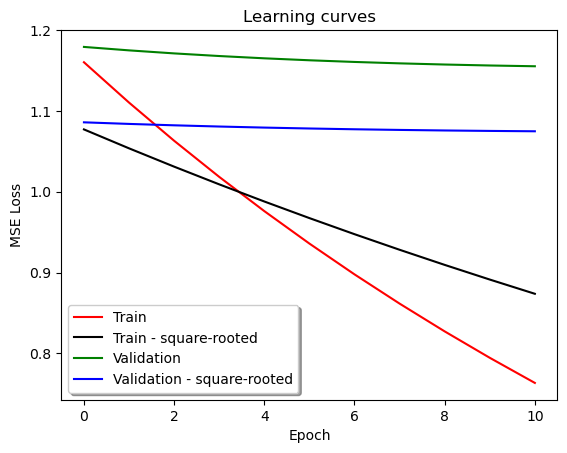

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


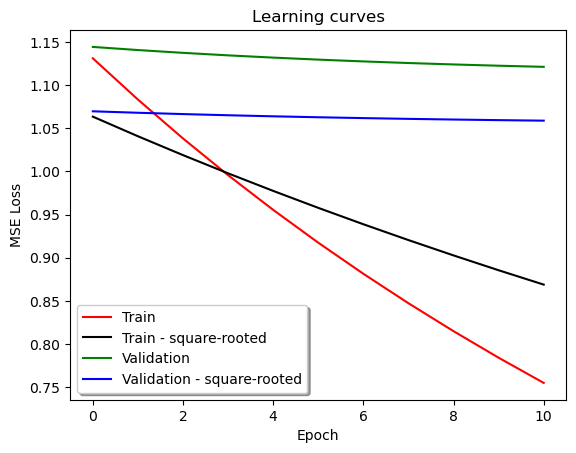

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


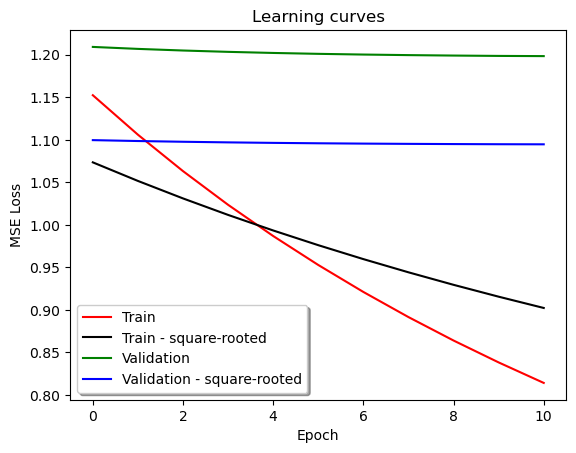

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


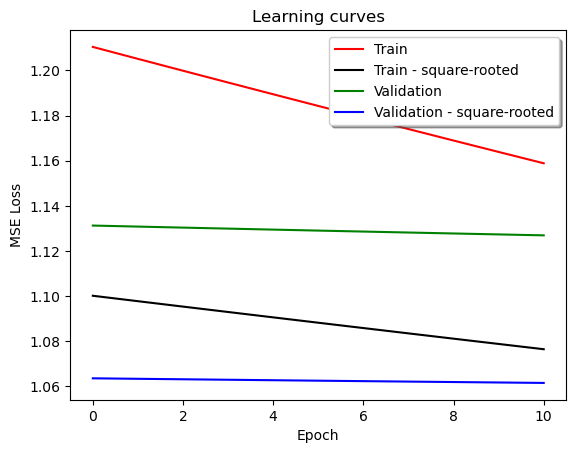

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


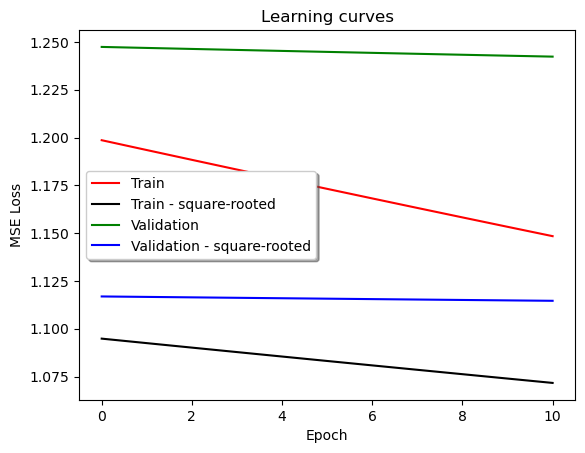

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


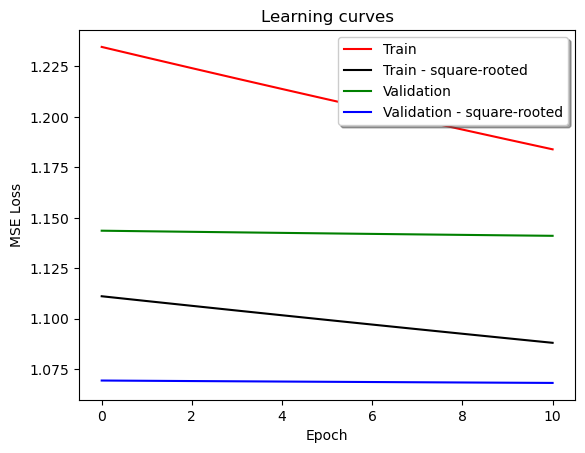

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


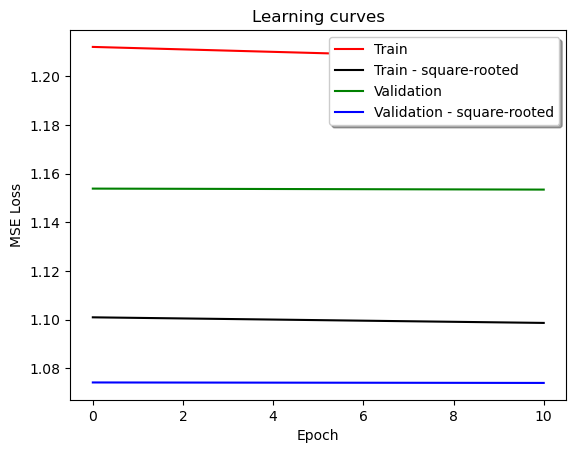

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


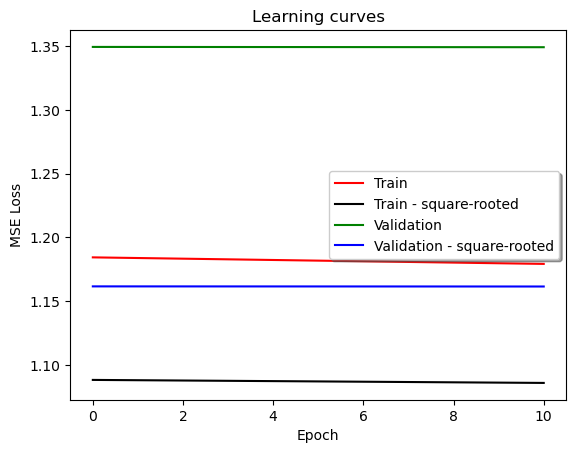

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


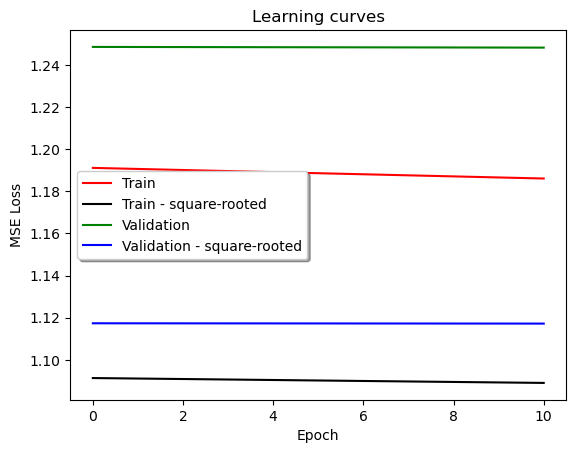

features: 3
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


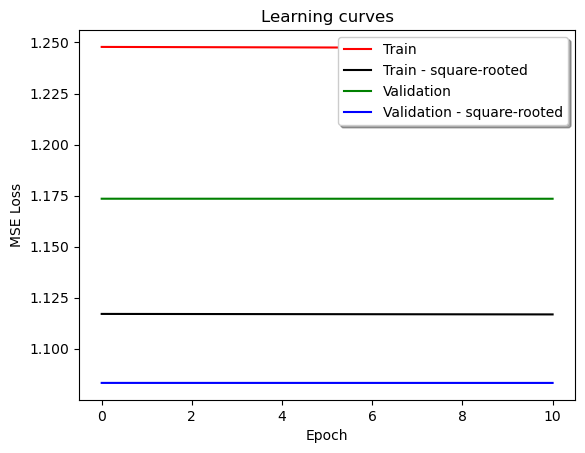

features: 3
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


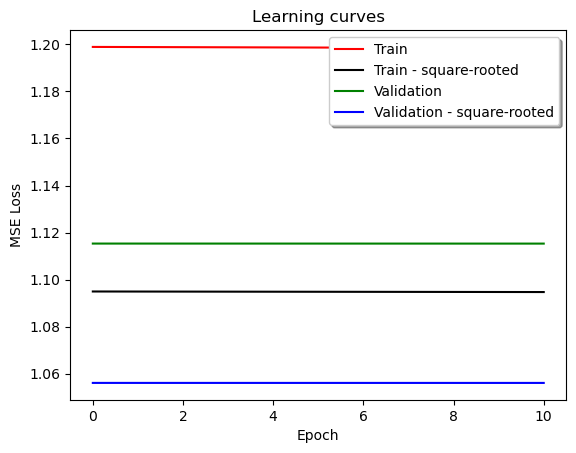

features: 3
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


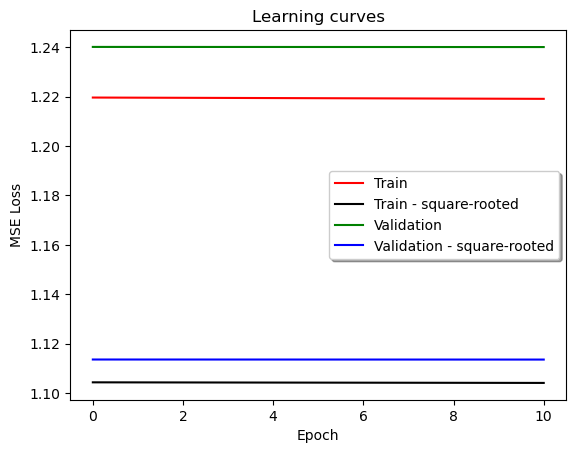

features: 5
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


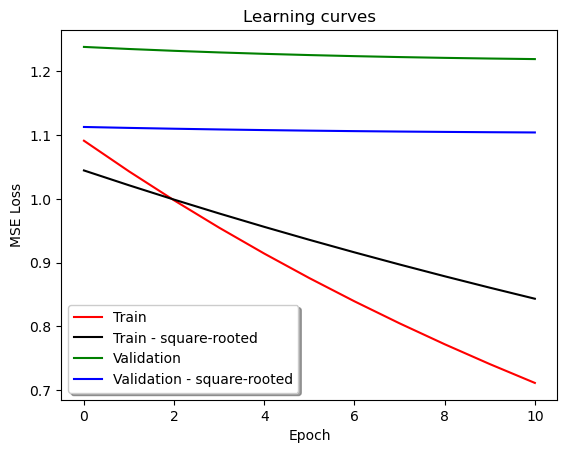

features: 5
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


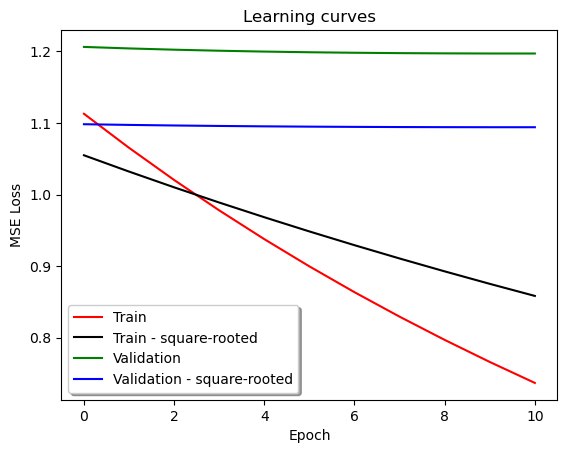

features: 5
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


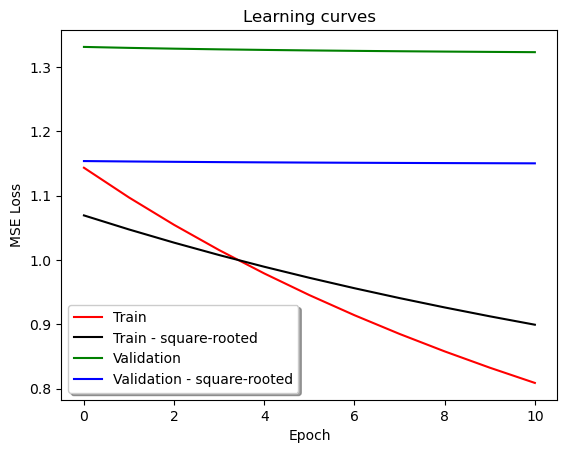

features: 5
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


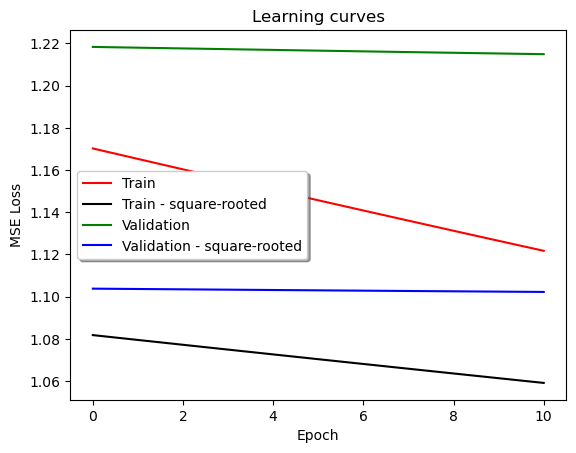

features: 5
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


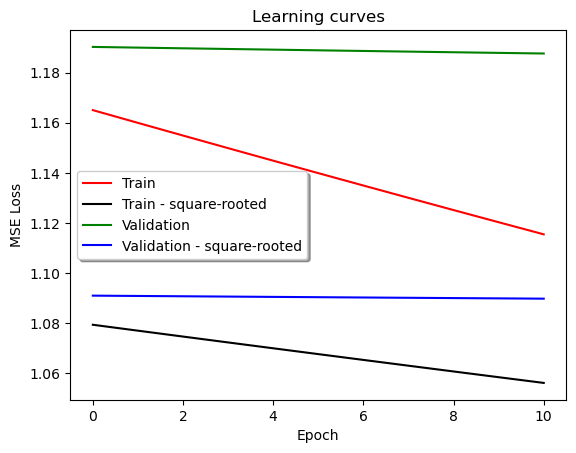

features: 5
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


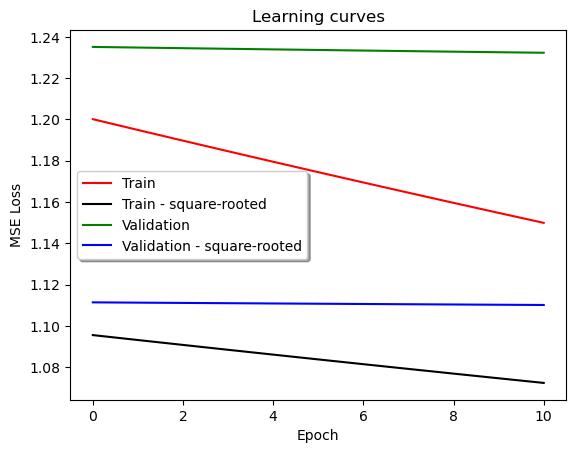

features: 5
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


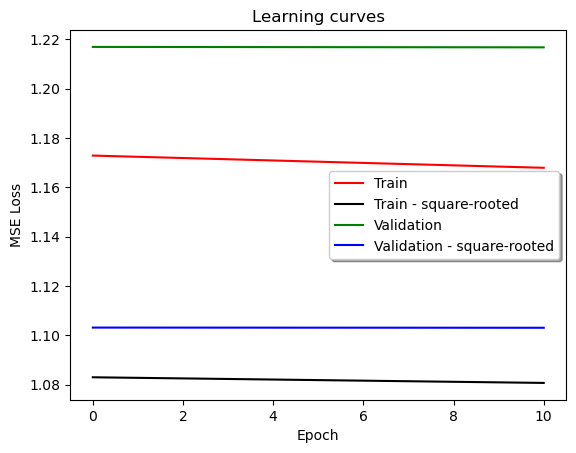

features: 5
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


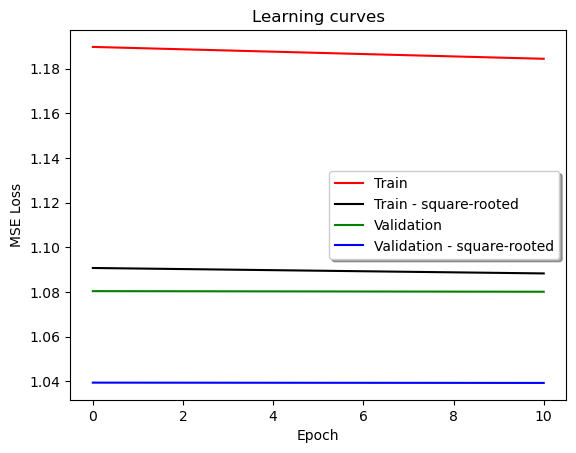

features: 5
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


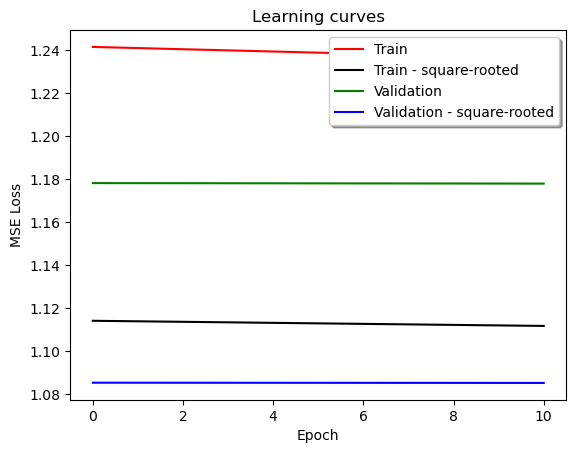

features: 5
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


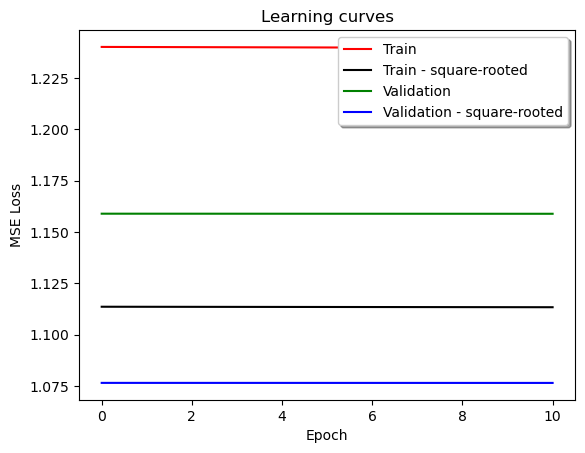

features: 5
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


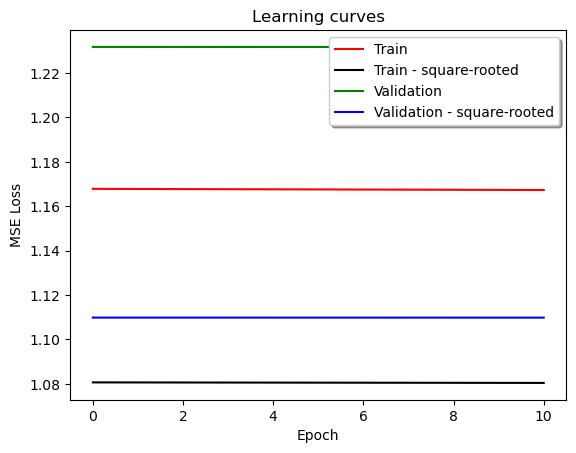

features: 5
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


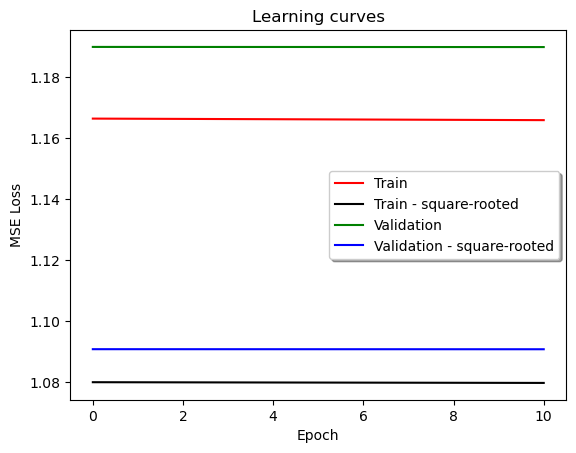

features: 10
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


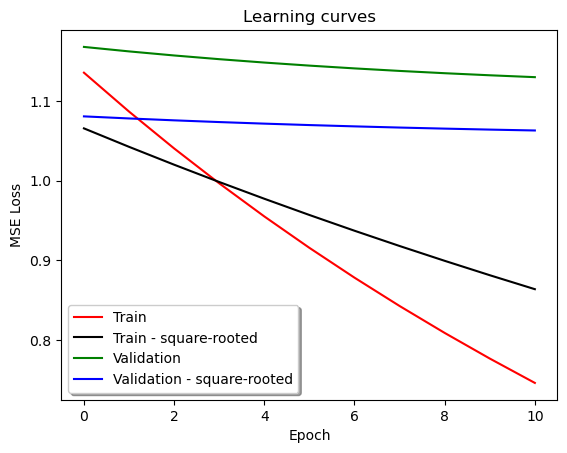

features: 10
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


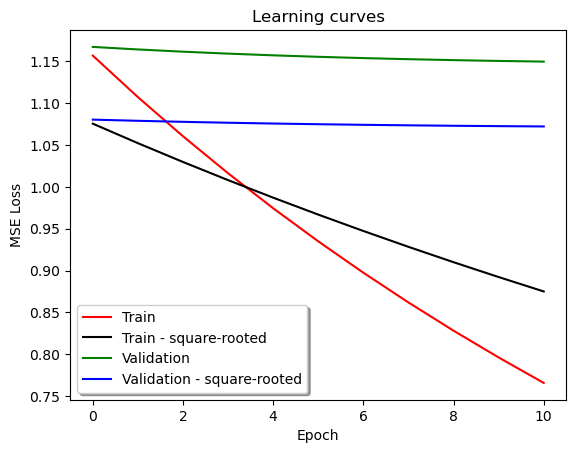

features: 10
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


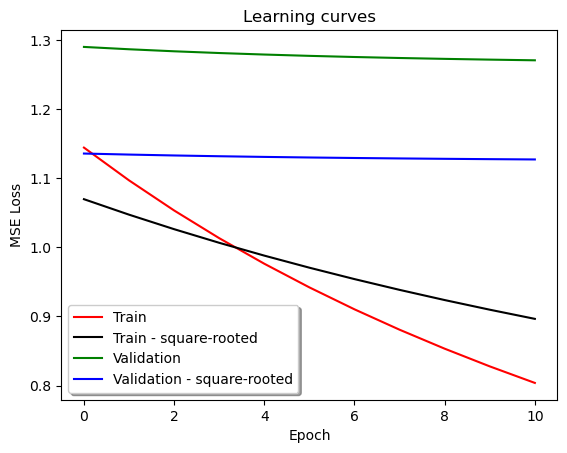

features: 10
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


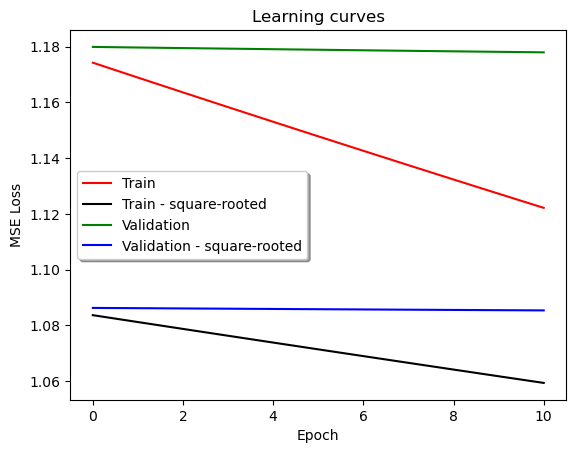

features: 10
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


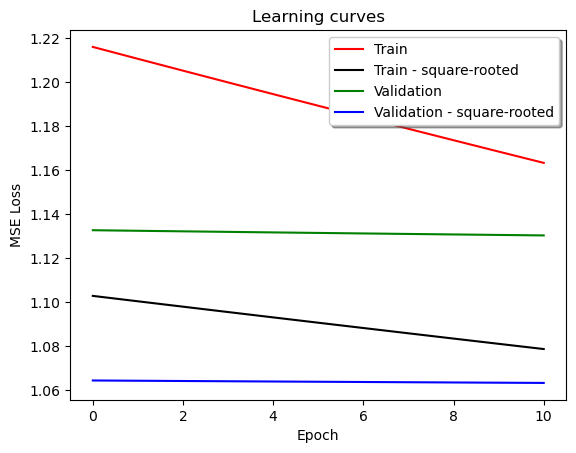

features: 10
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


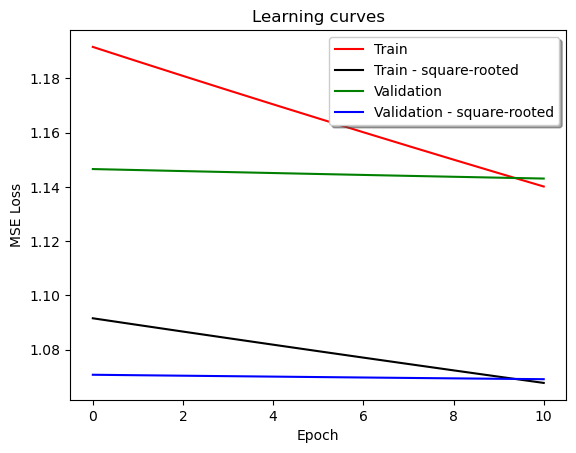

features: 10
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


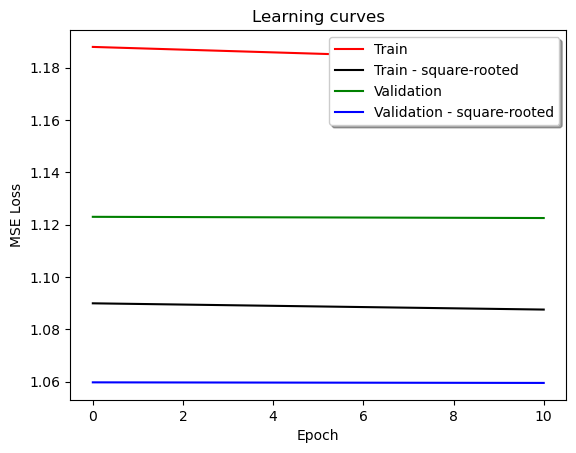

features: 10
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


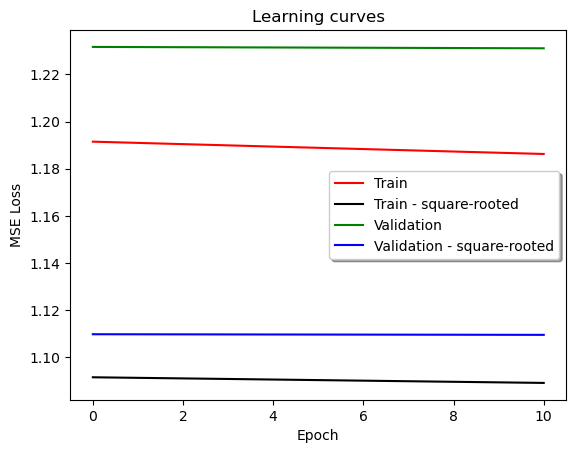

features: 10
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


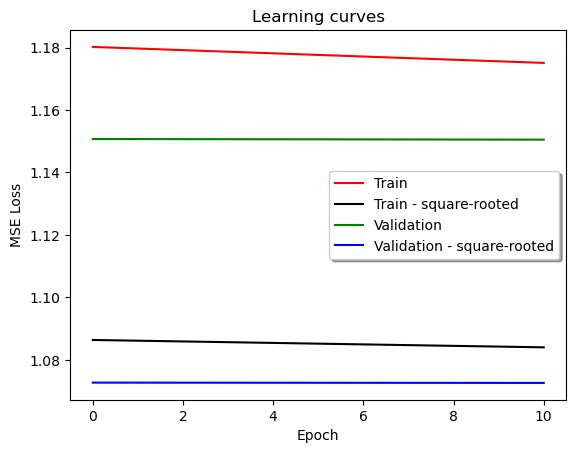

features: 10
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


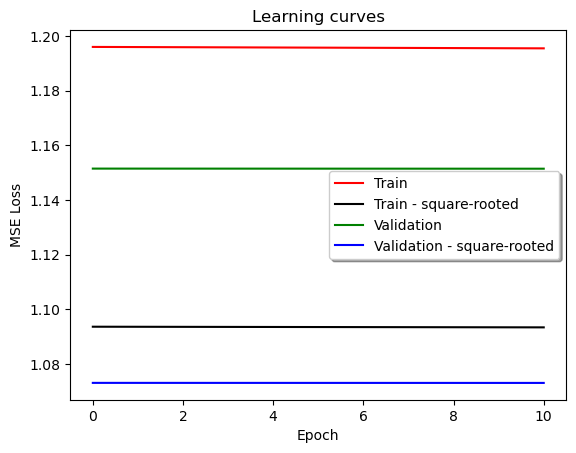

features: 10
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


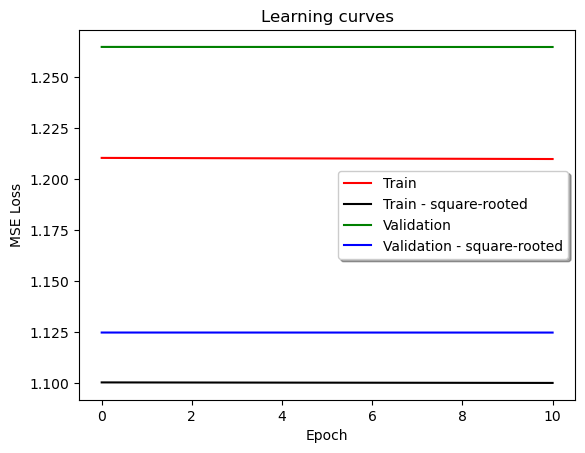

features: 10
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


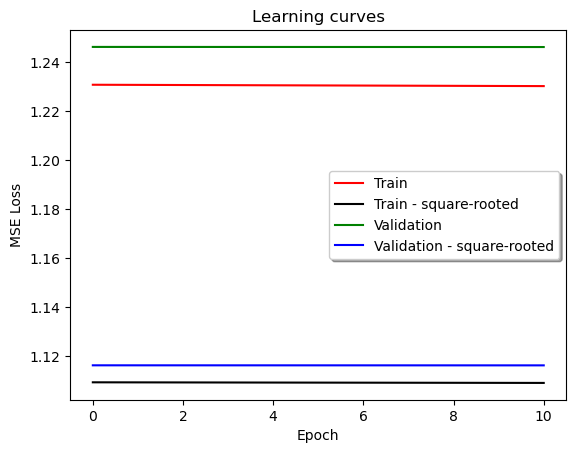

features: 100
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


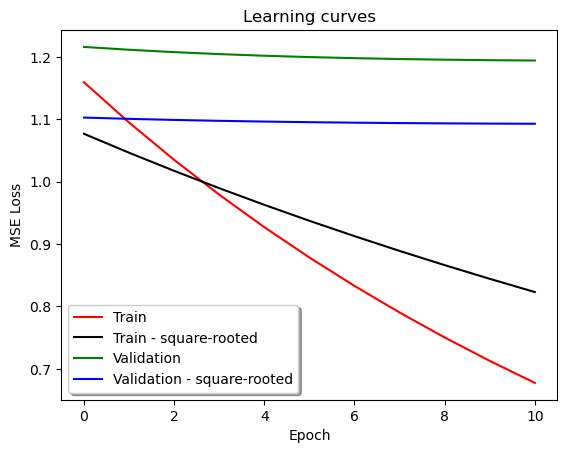

features: 100
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


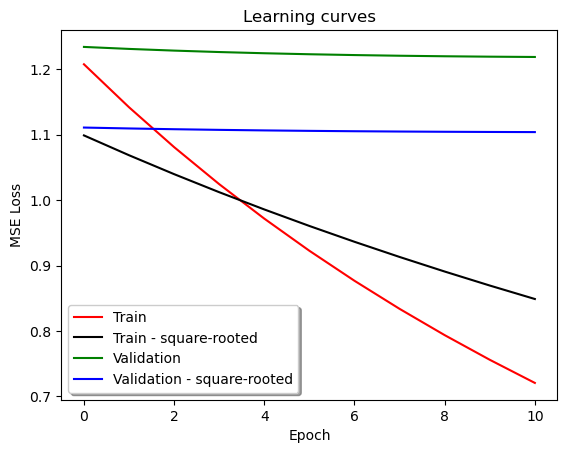

features: 100
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


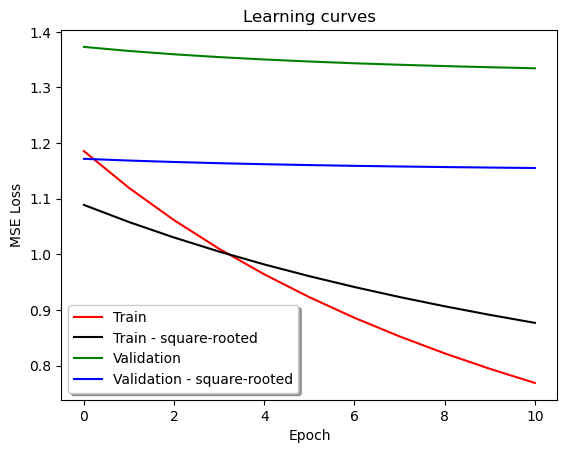

features: 100
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


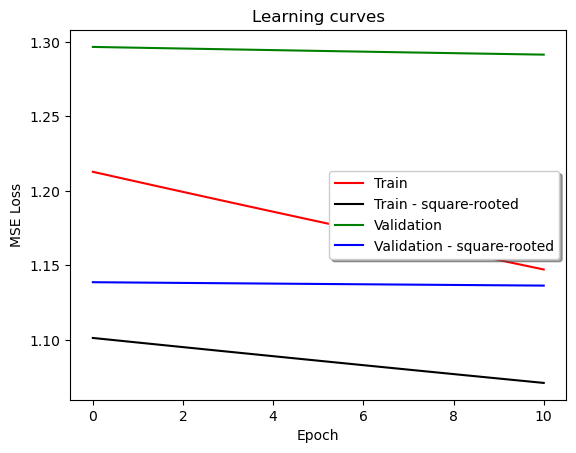

features: 100
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


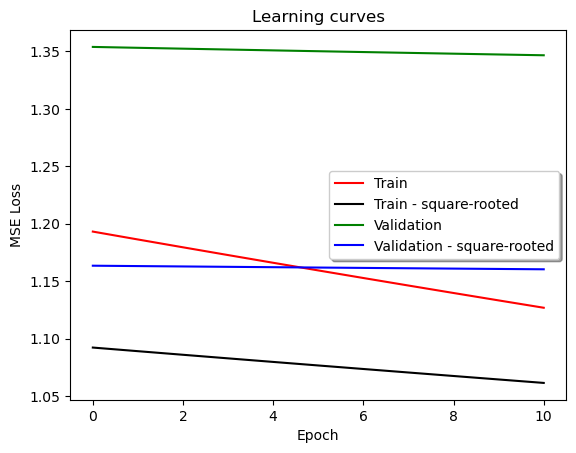

features: 100
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


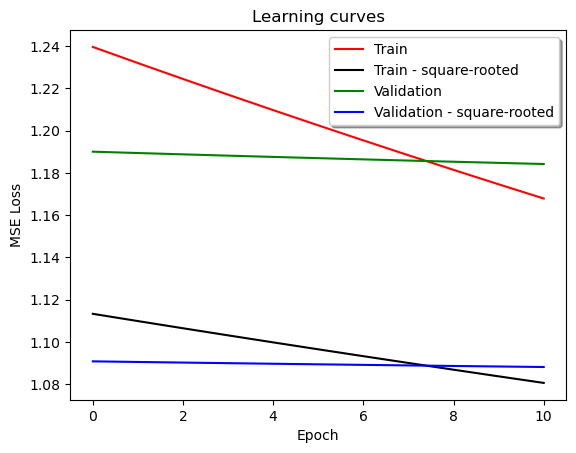

features: 100
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


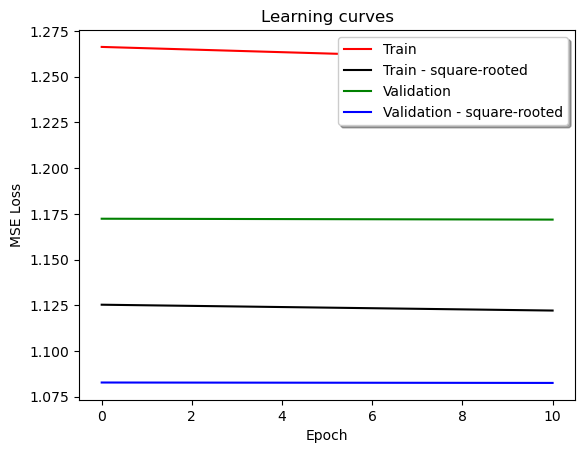

features: 100
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


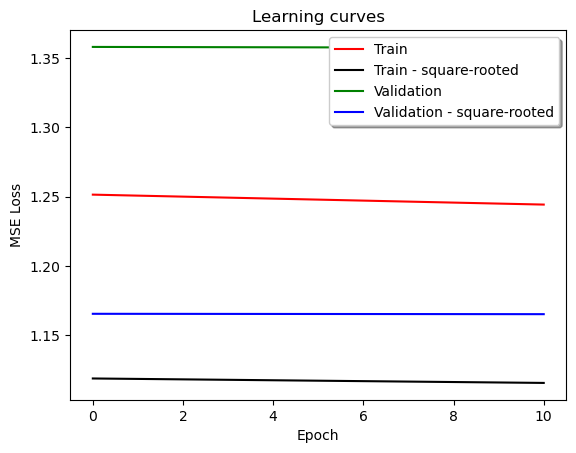

features: 100
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


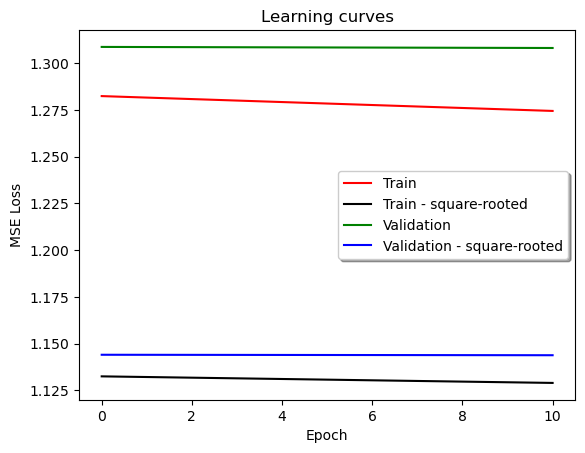

features: 100
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


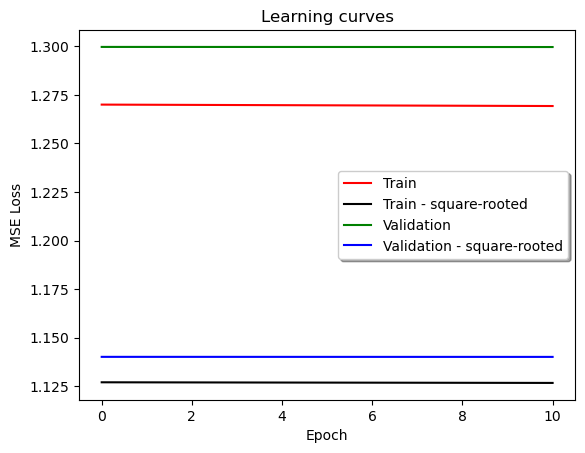

features: 100
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


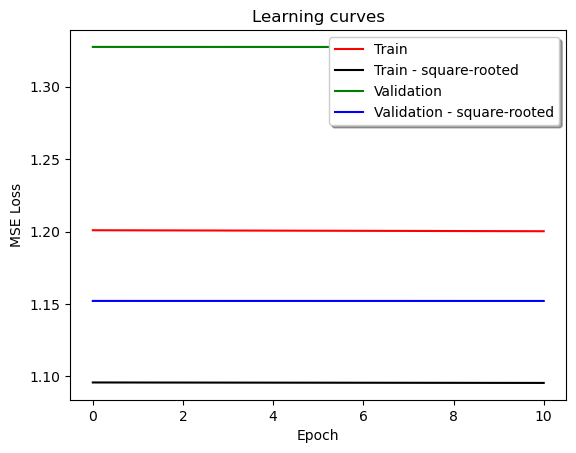

features: 100
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


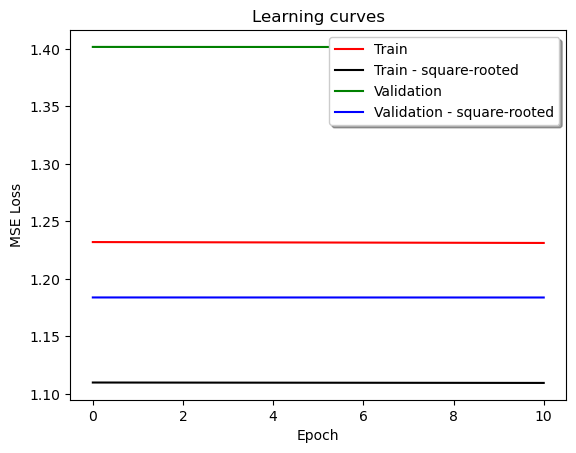

features: 200
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


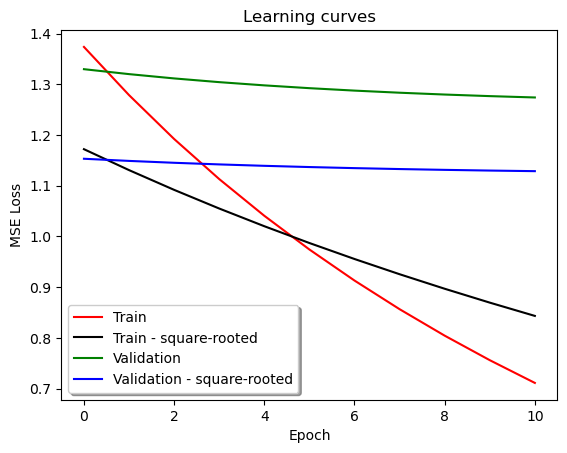

features: 200
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


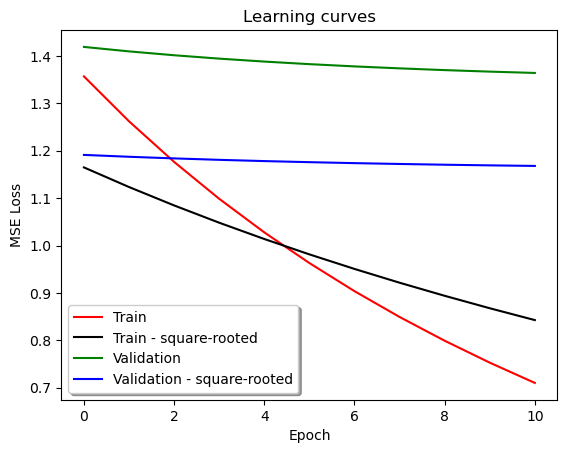

features: 200
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


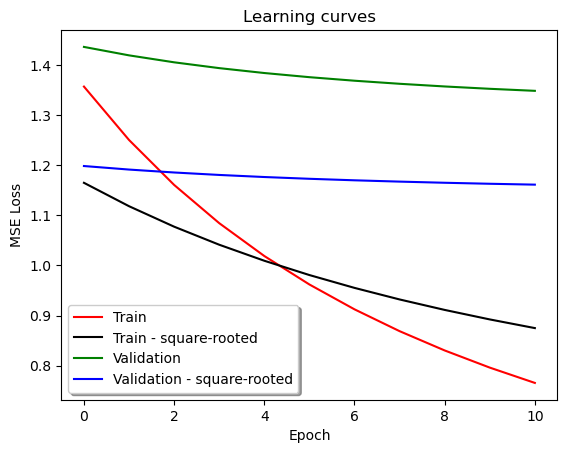

features: 200
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


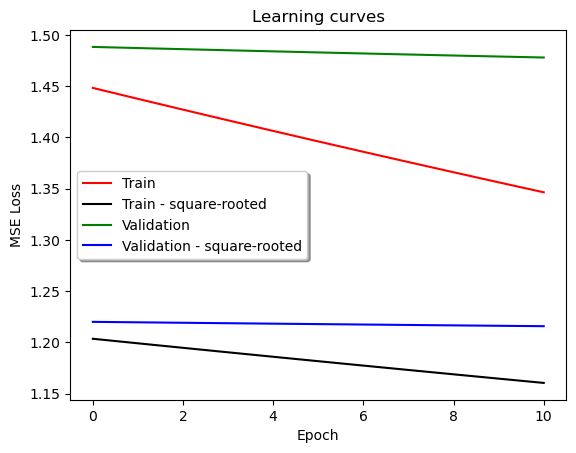

features: 200
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


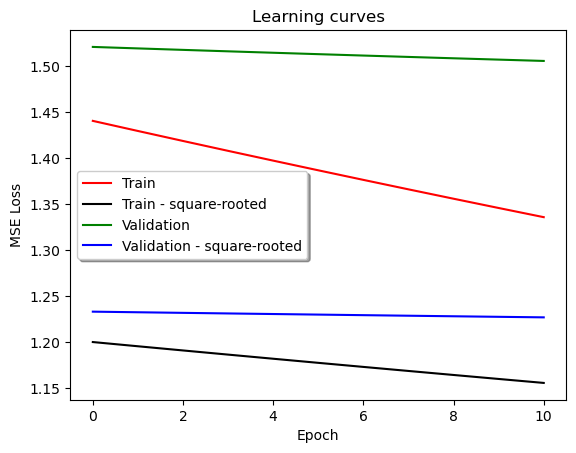

features: 200
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


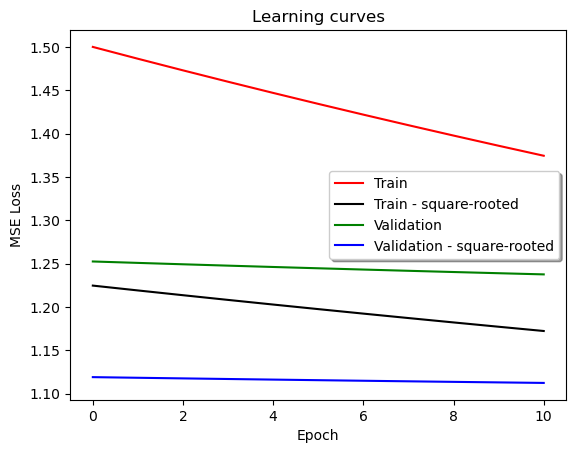

features: 200
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


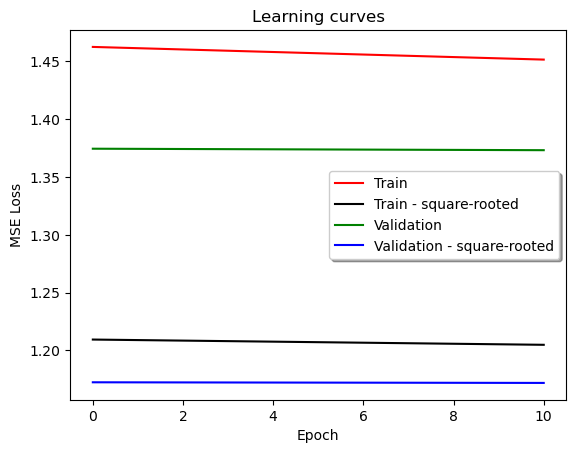

features: 200
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


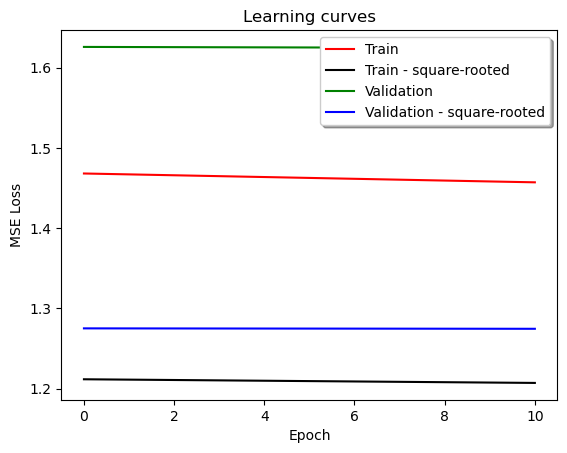

features: 200
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


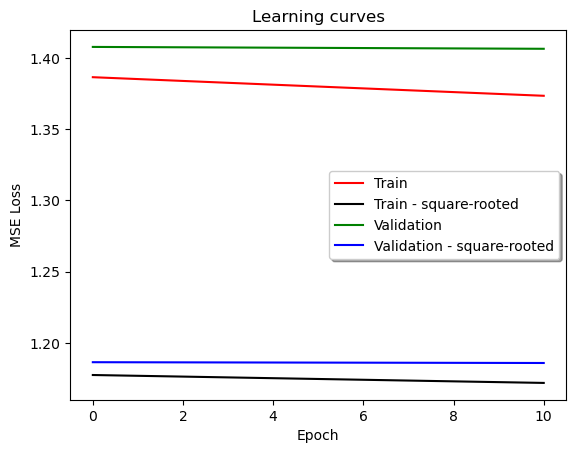

features: 200
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


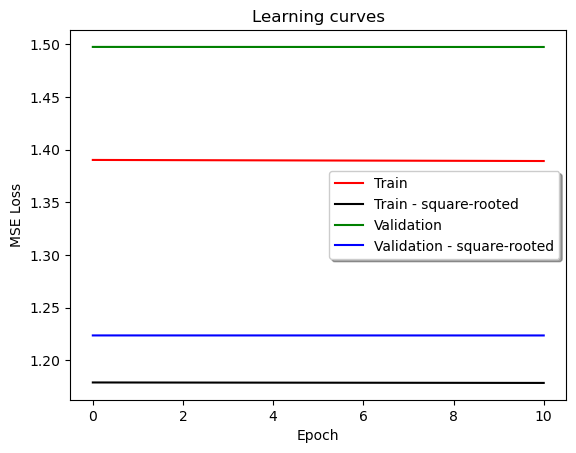

features: 200
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


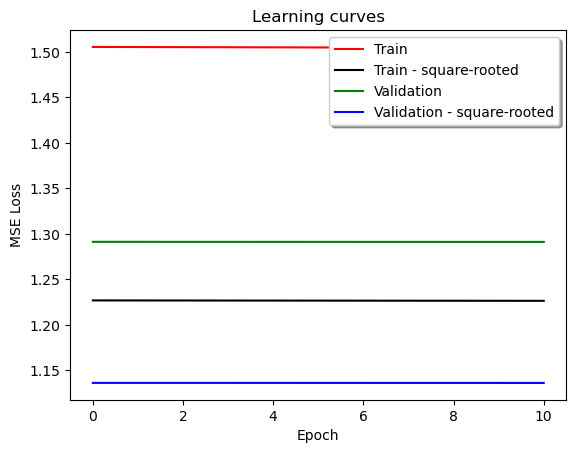

features: 200
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


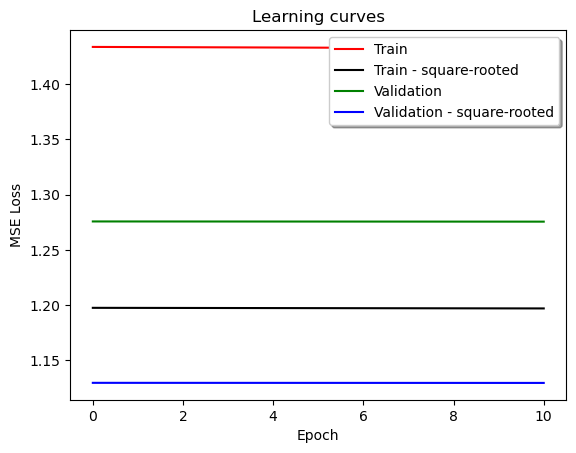

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


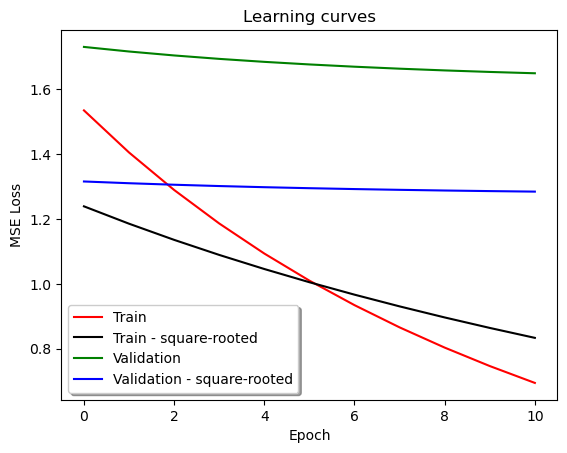

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


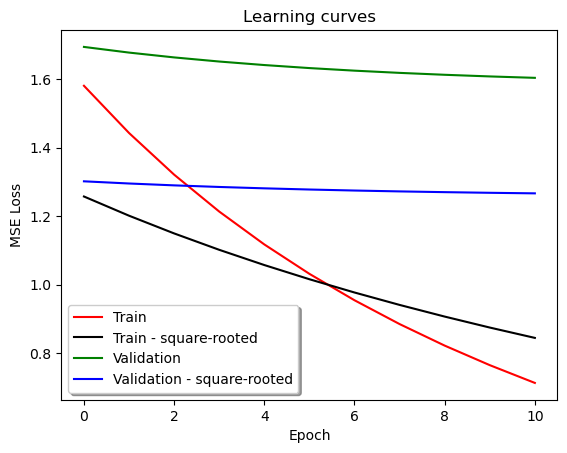

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


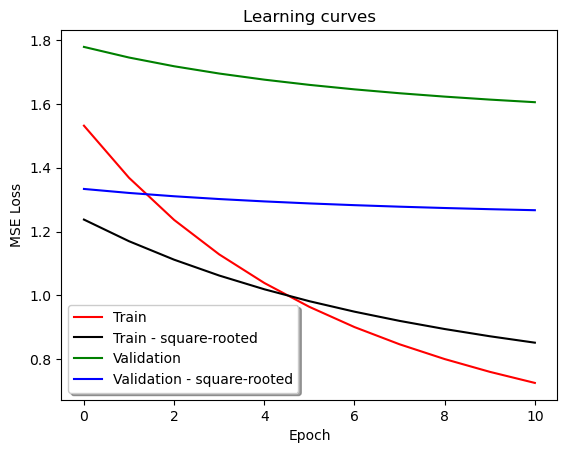

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


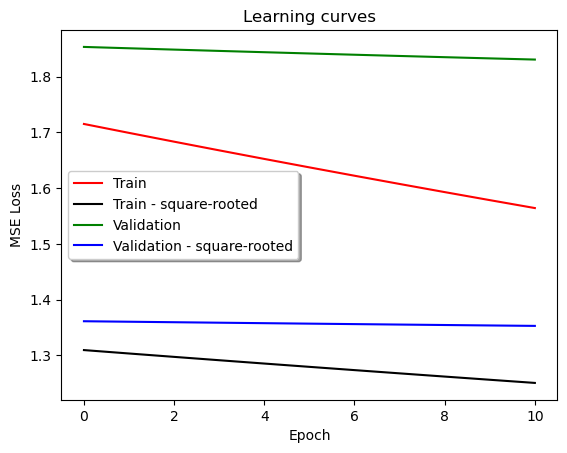

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


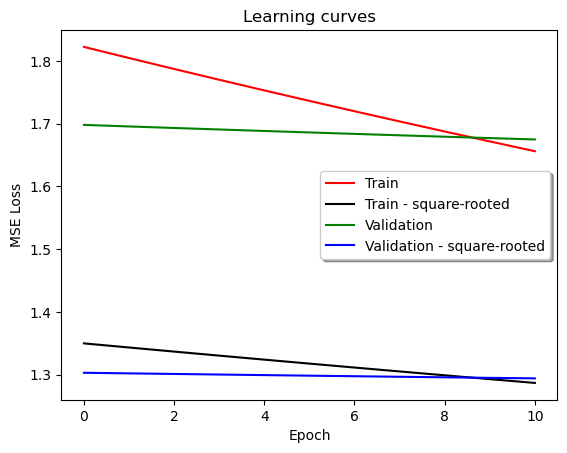

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


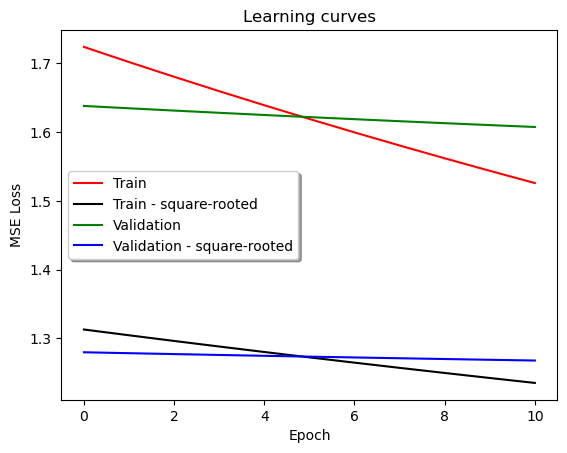

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


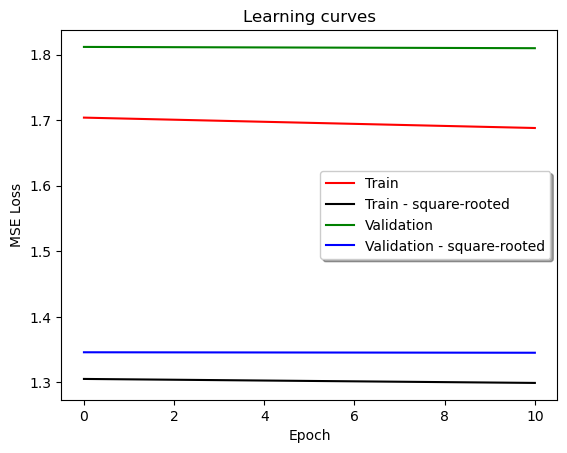

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


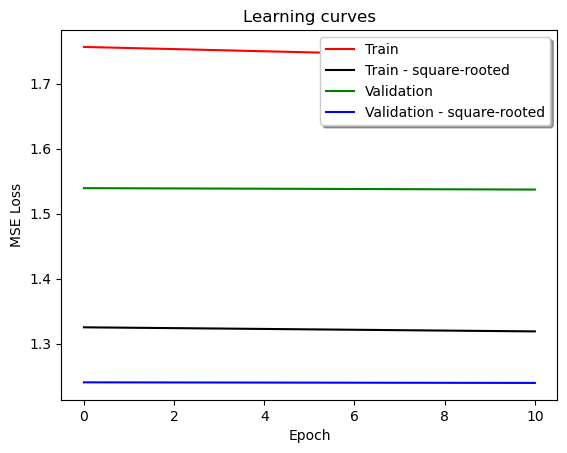

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


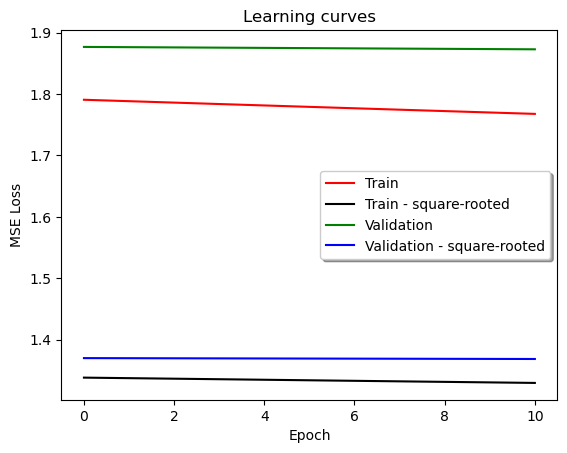

features: 300
learning rate: 1e-05
Epochs: 11
weight decay: 0.02
stopping: 0.001

RMSE
0.0


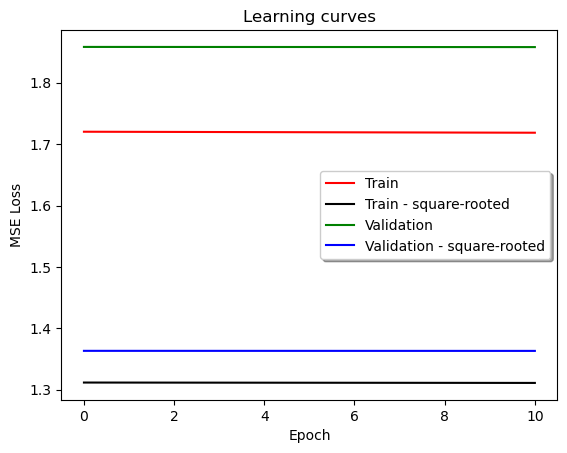

features: 300
learning rate: 1e-05
Epochs: 11
weight decay: 0.2
stopping: 0.001

RMSE
0.0


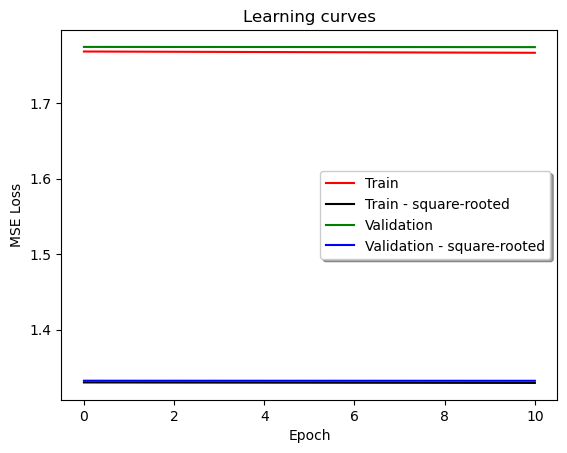

features: 300
learning rate: 1e-05
Epochs: 11
weight decay: 2
stopping: 0.001

RMSE
0.0


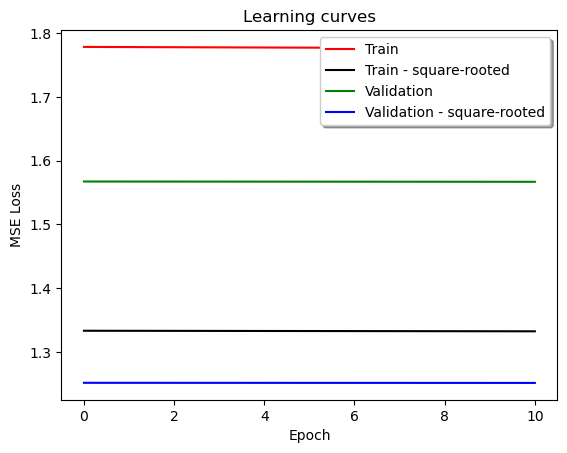

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


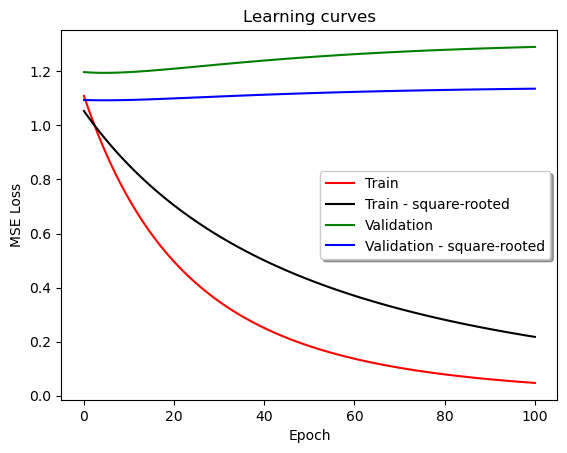

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


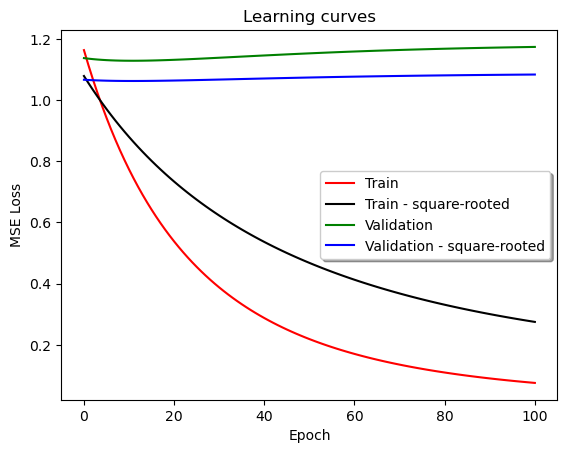

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


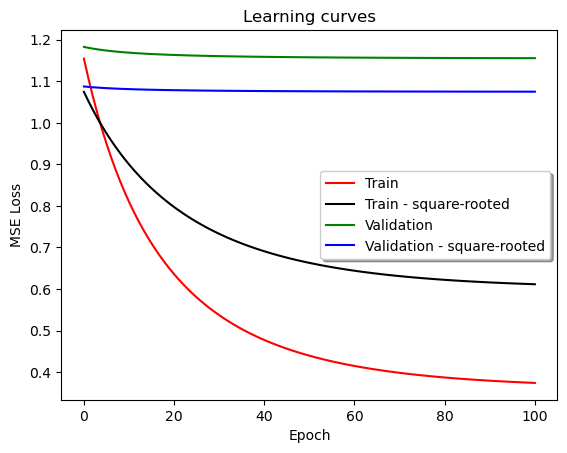

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


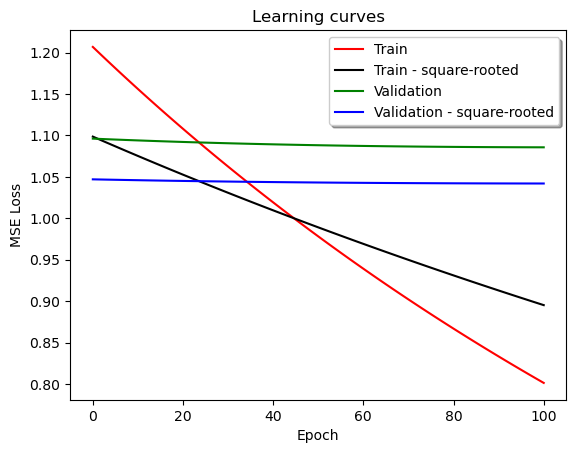

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


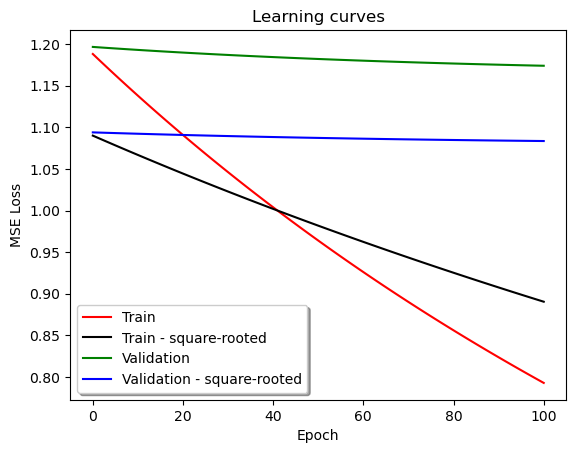

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


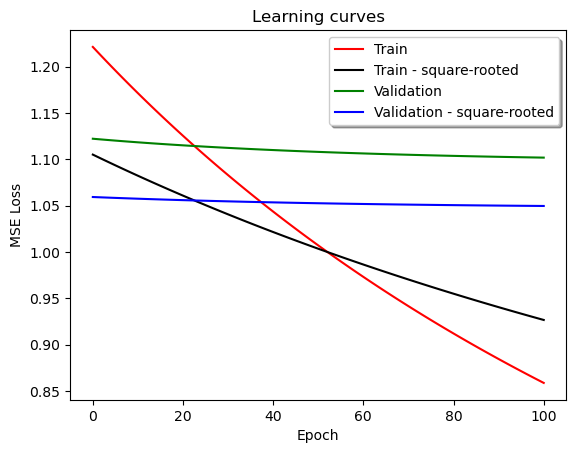

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


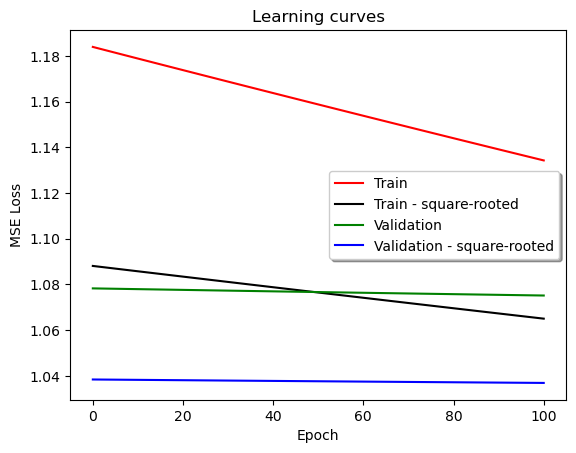

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


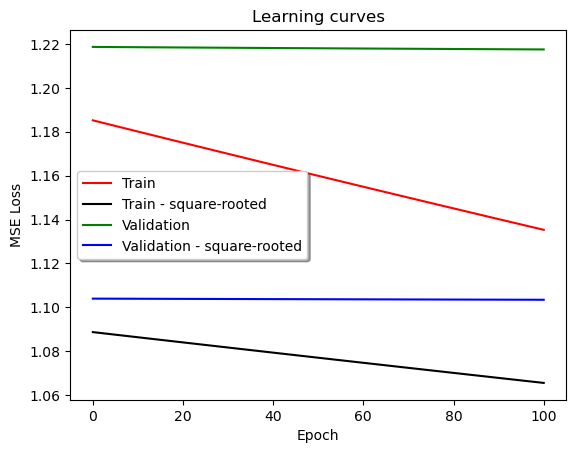

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


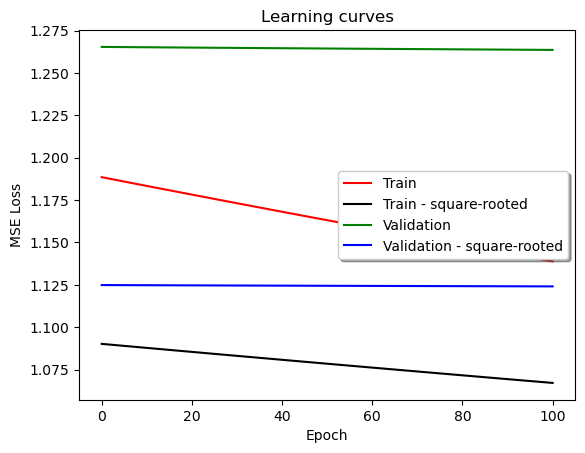

features: 3
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


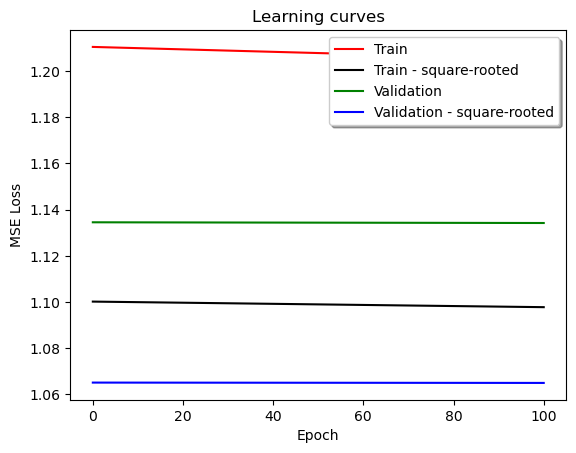

features: 3
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


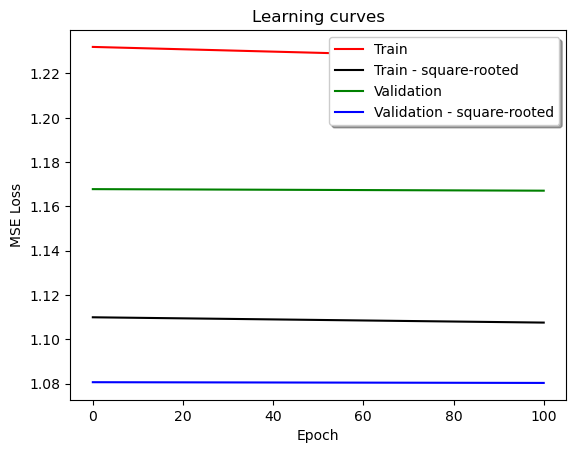

features: 3
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


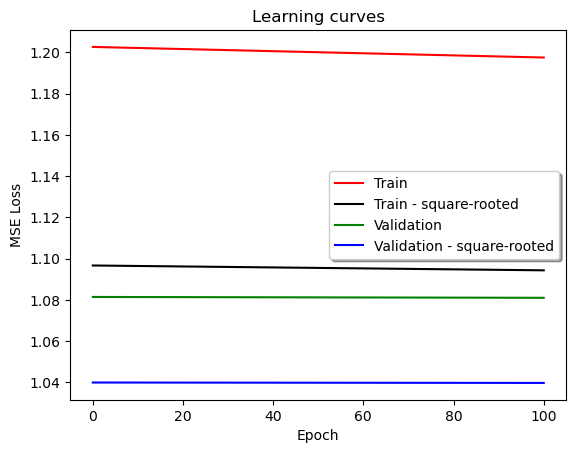

features: 5
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


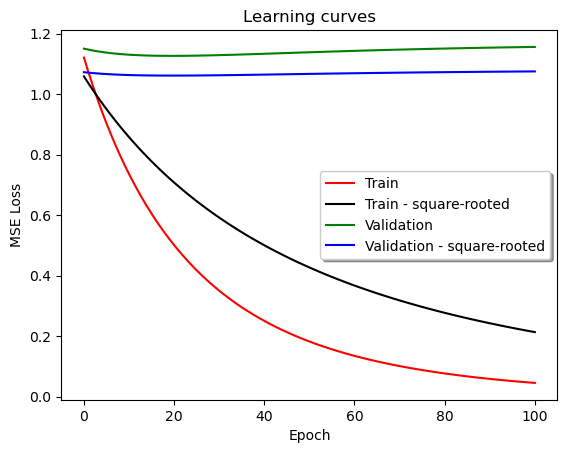

features: 5
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


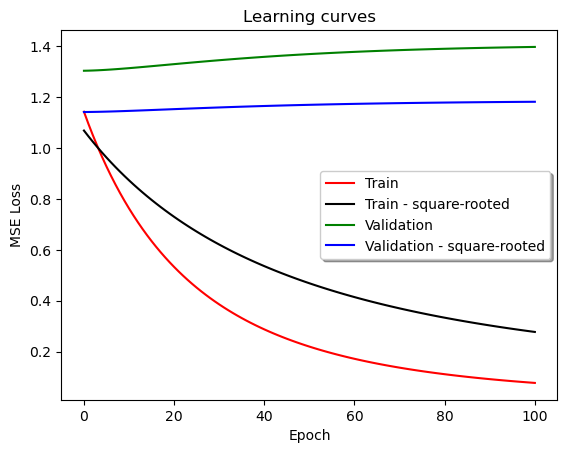

features: 5
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


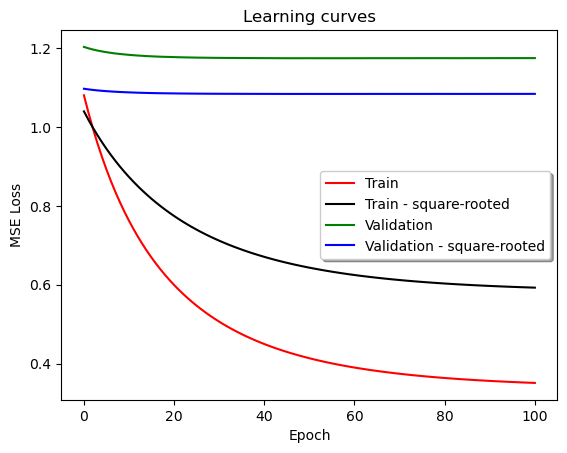

features: 5
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


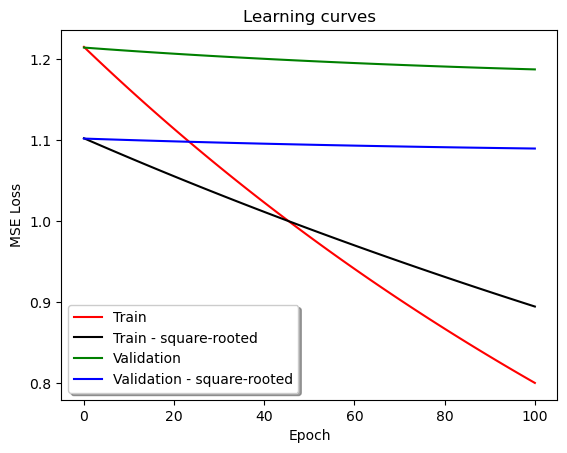

features: 5
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


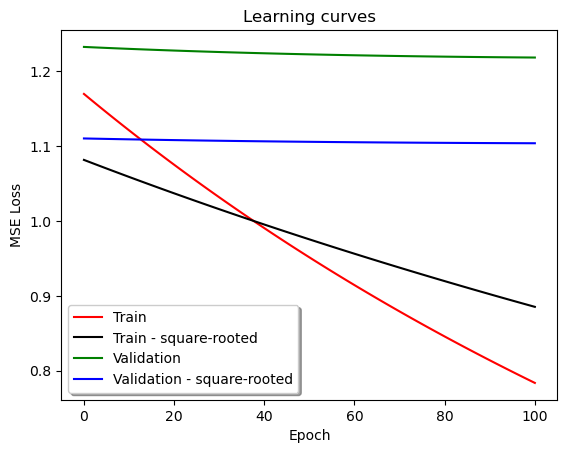

features: 5
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


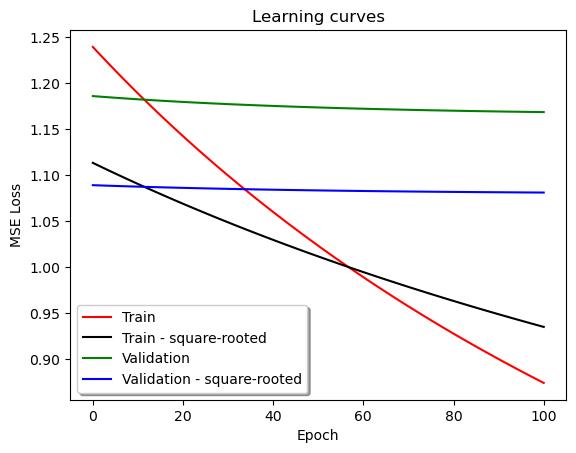

features: 5
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


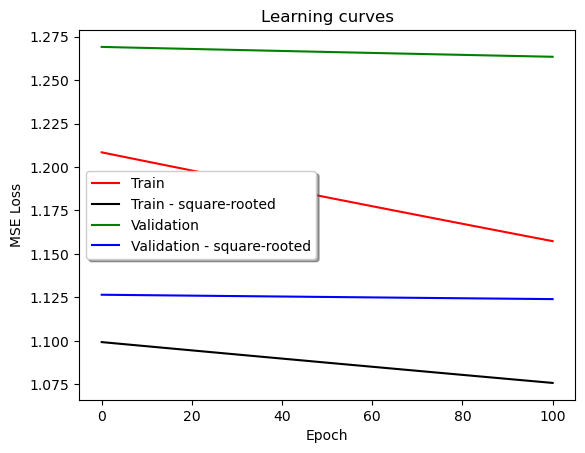

features: 5
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


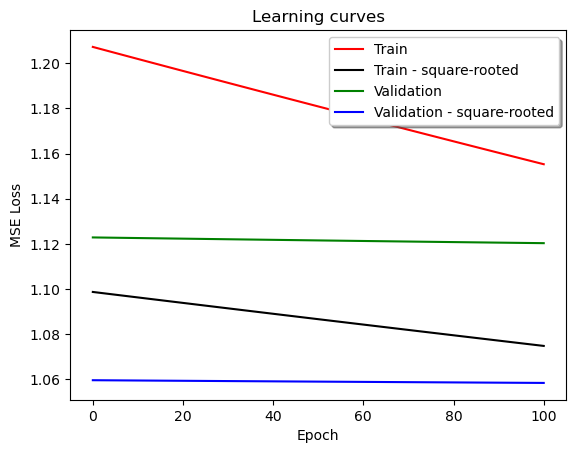

features: 5
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


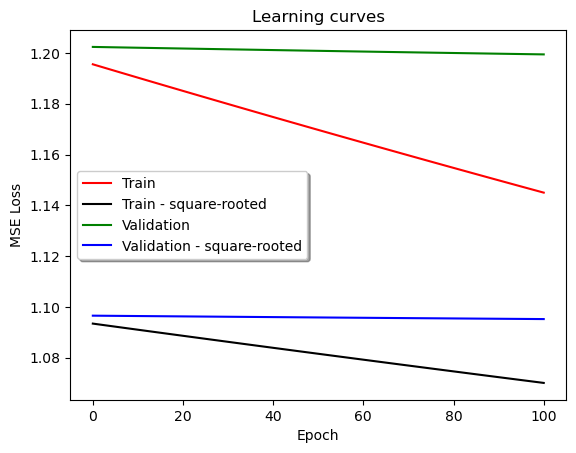

features: 5
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


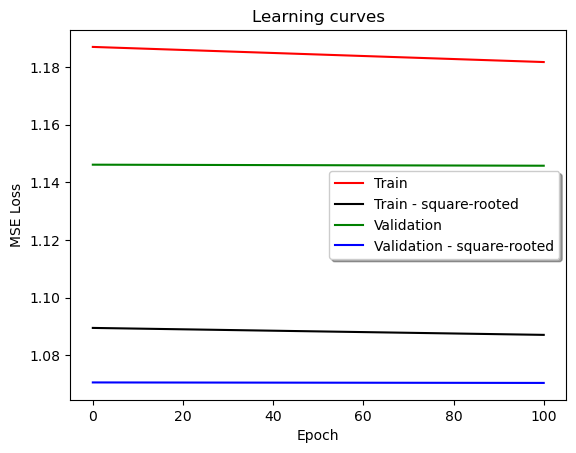

features: 5
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


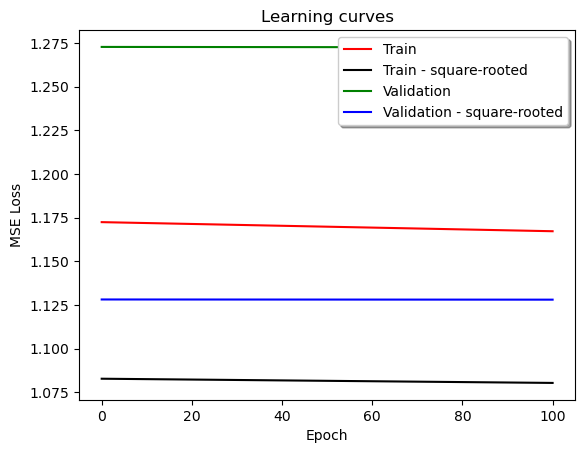

features: 5
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


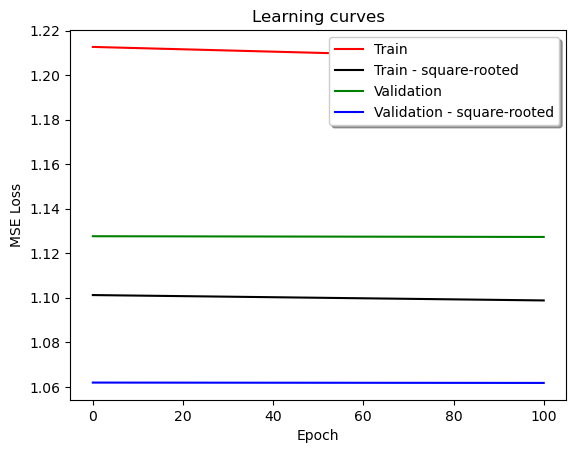

features: 10
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


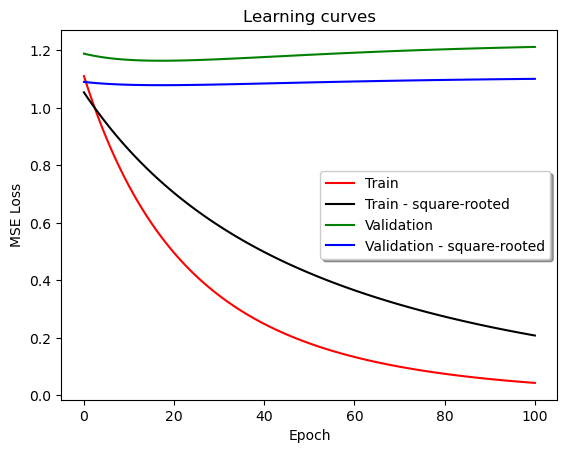

features: 10
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


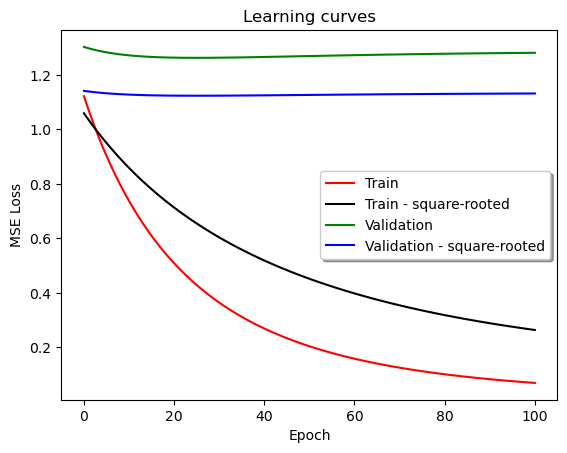

features: 10
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


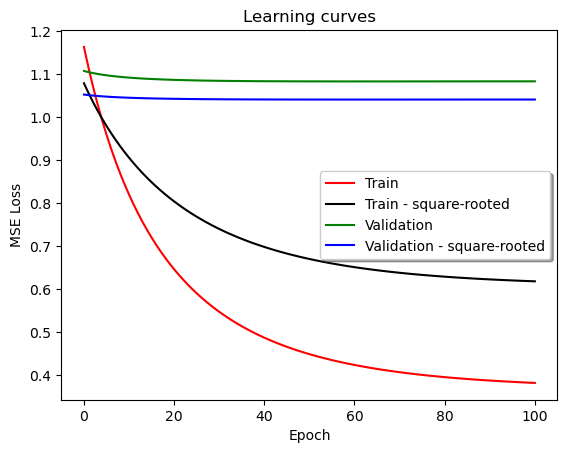

features: 10
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


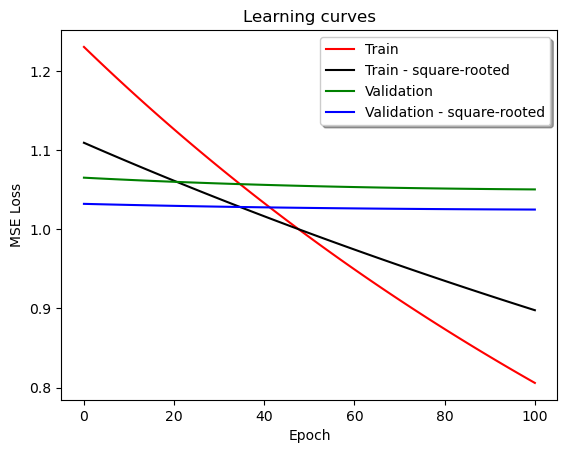

features: 10
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


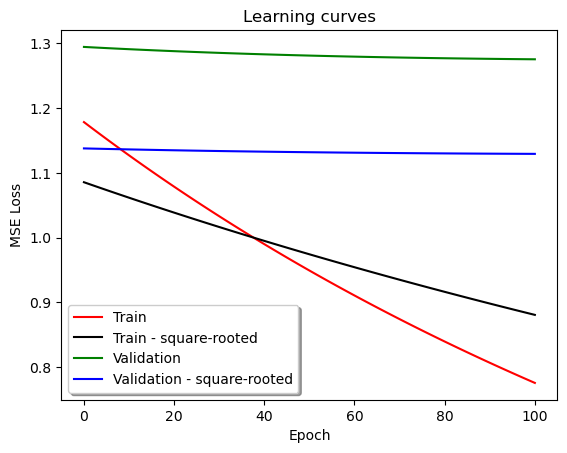

features: 10
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


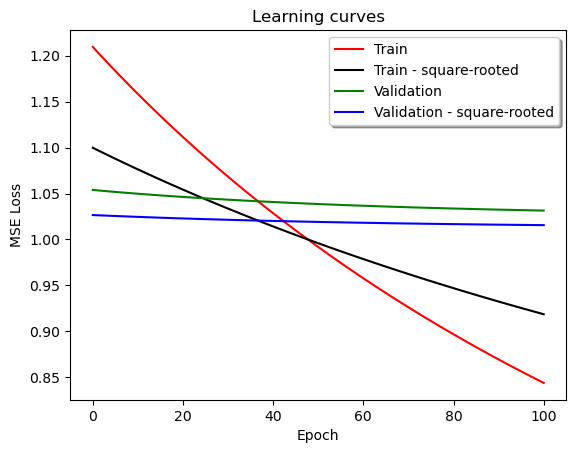

features: 10
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


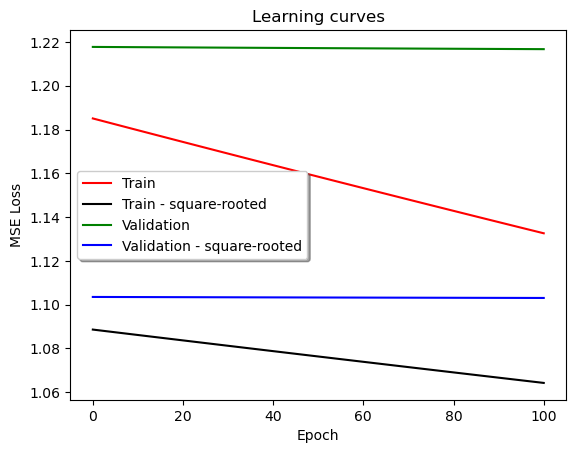

features: 10
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


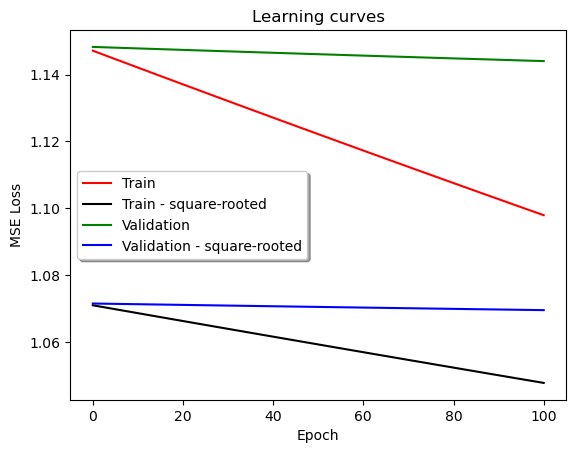

features: 10
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


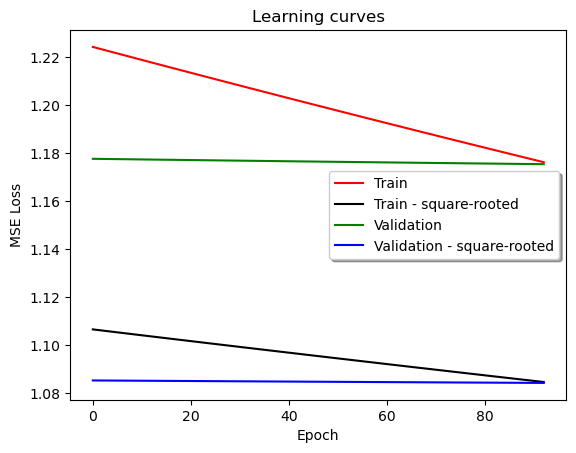

features: 10
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


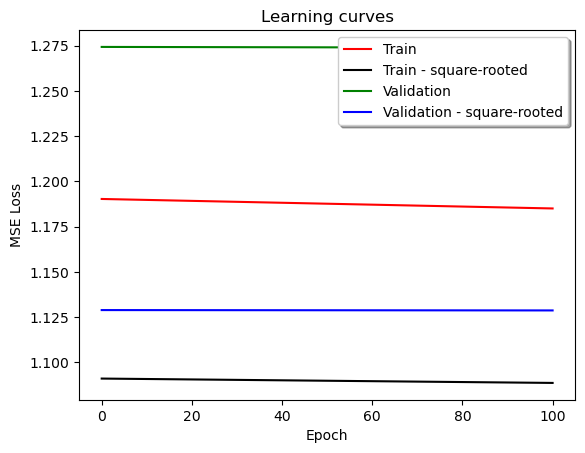

features: 10
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


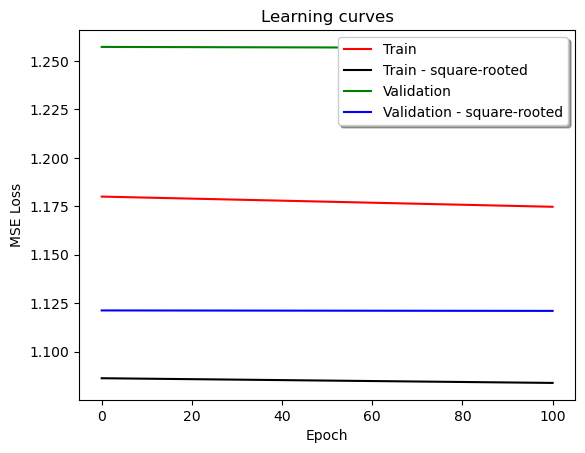

features: 10
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


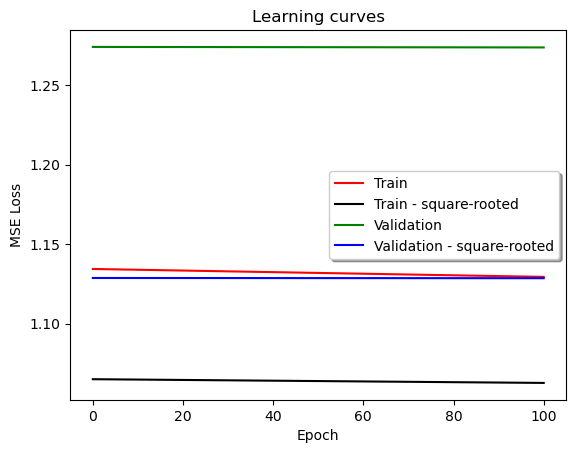

features: 100
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


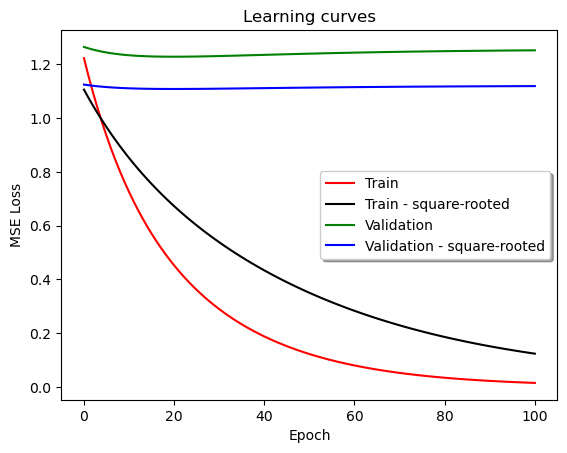

features: 100
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


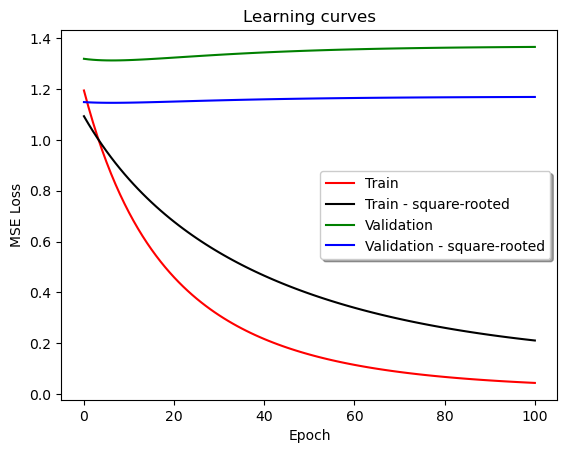

features: 100
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


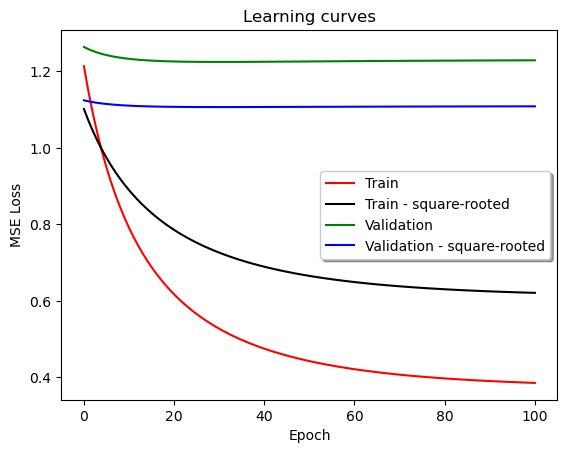

features: 100
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


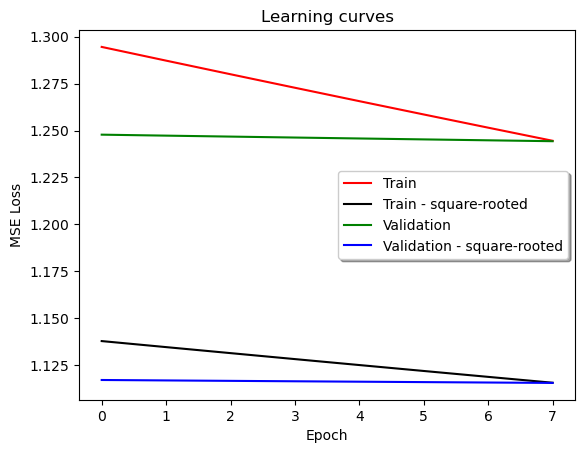

features: 100
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


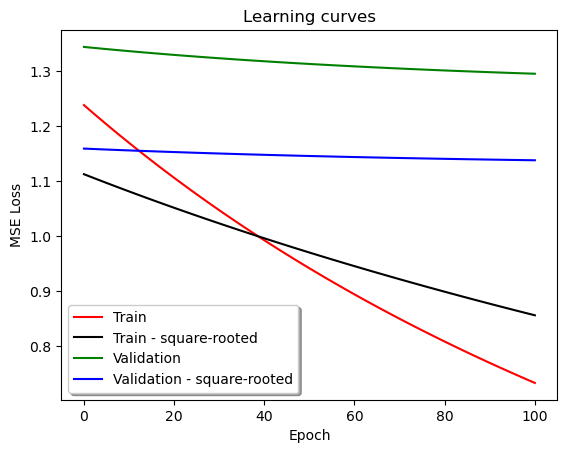

features: 100
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


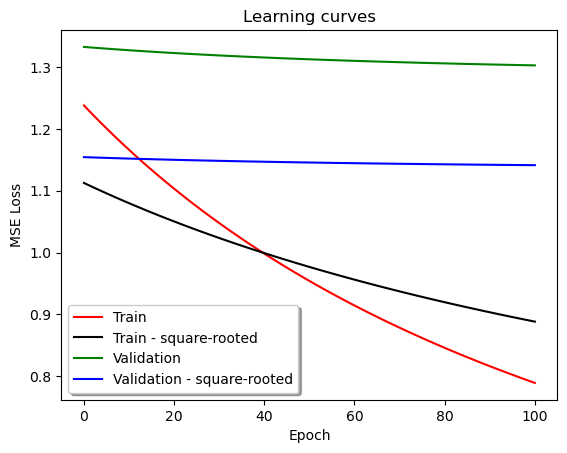

features: 100
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


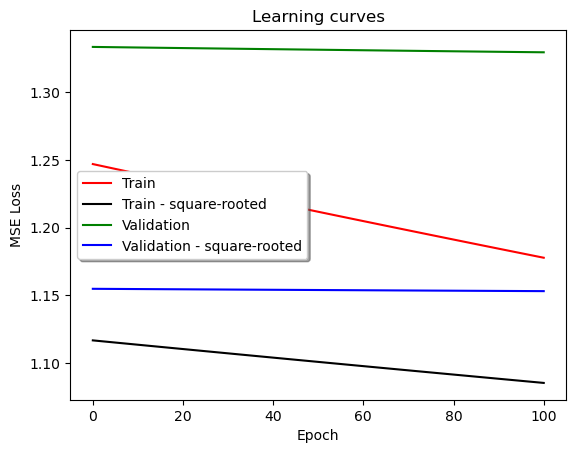

features: 100
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


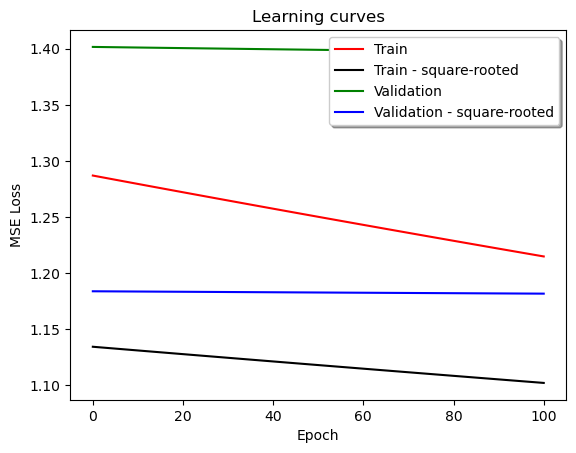

features: 100
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


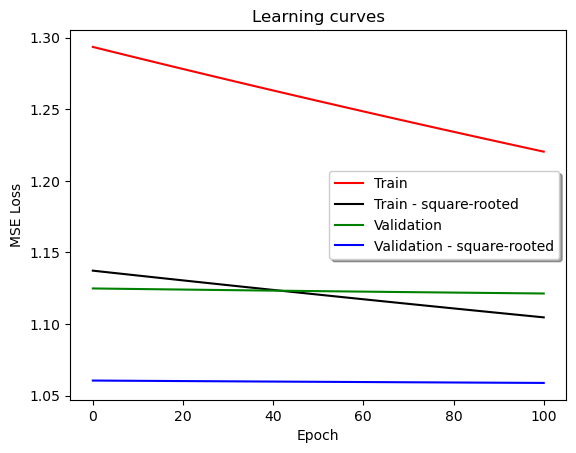

features: 100
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


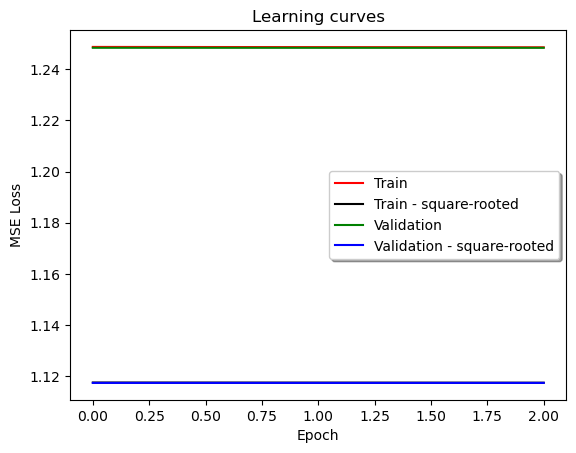

features: 100
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


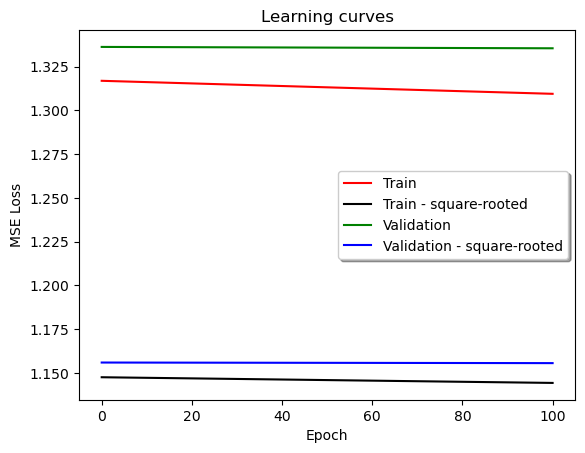

features: 100
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


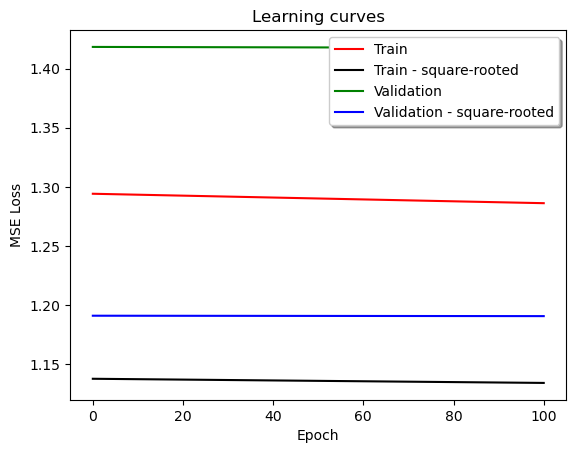

features: 200
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


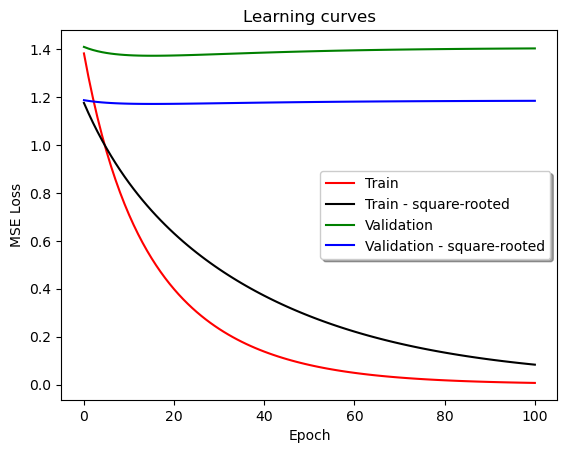

features: 200
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


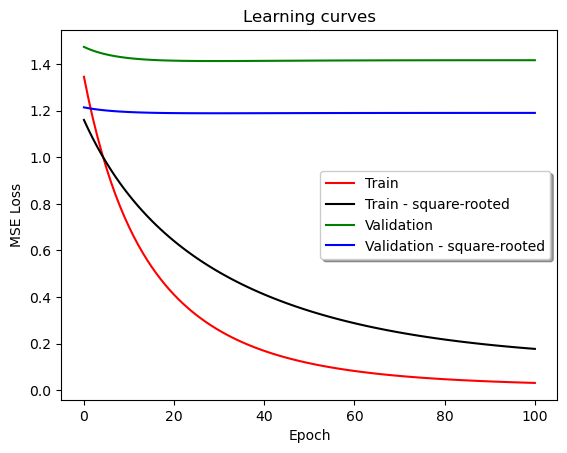

features: 200
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


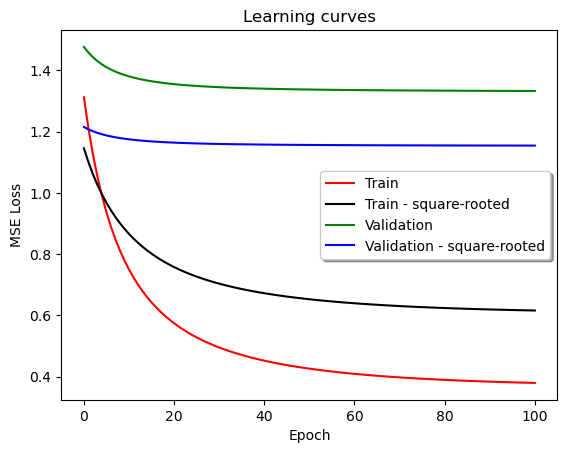

features: 200
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


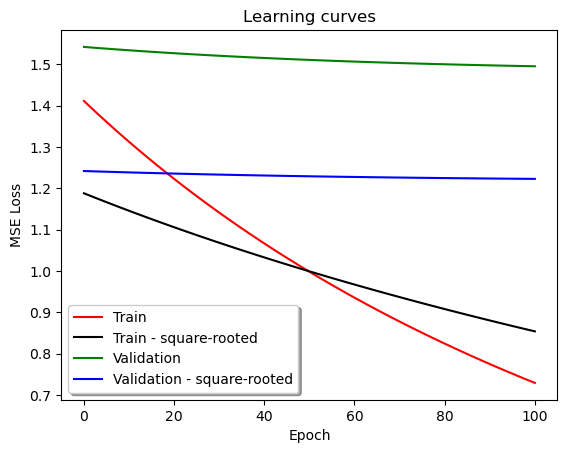

features: 200
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


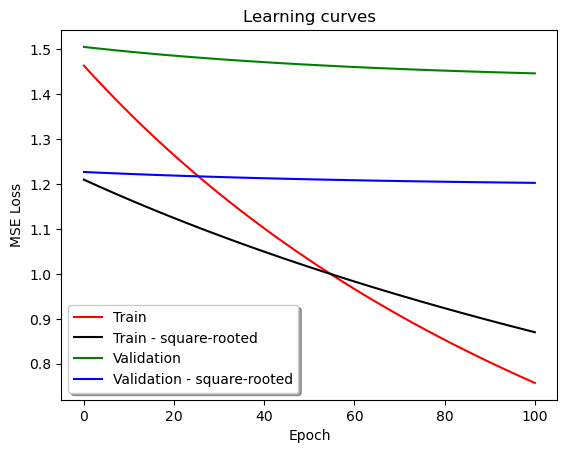

features: 200
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


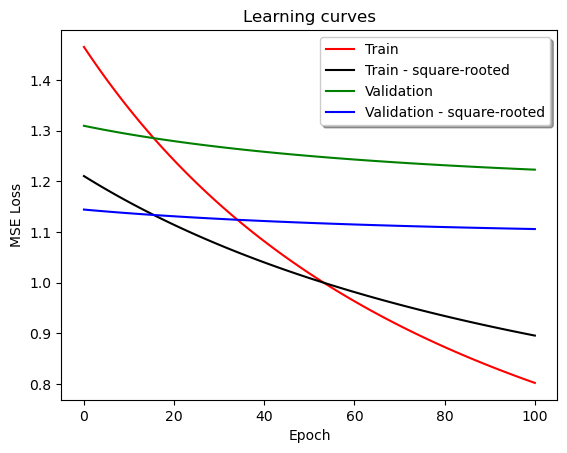

features: 200
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


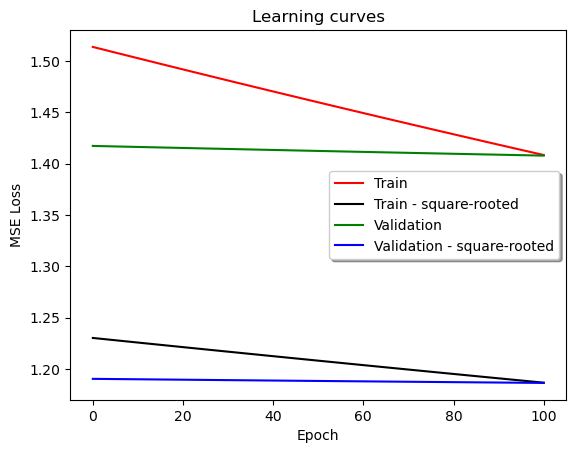

features: 200
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


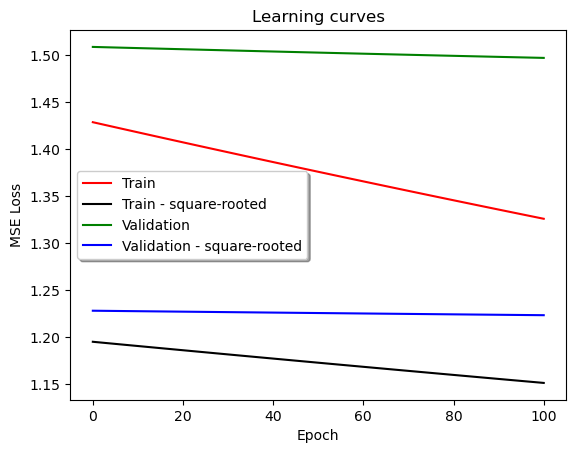

features: 200
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


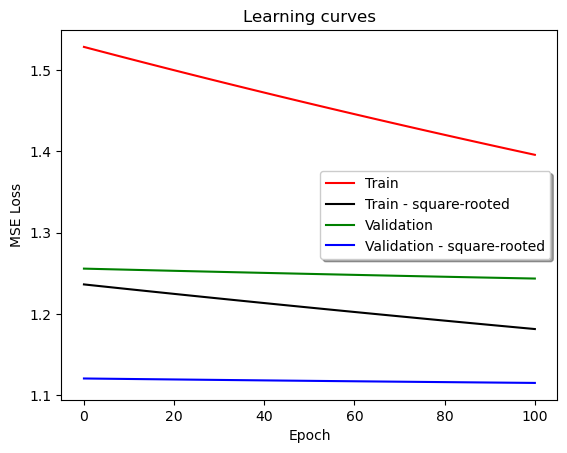

features: 200
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


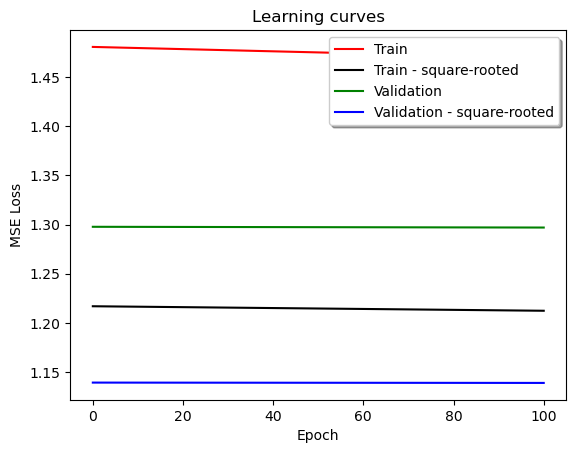

features: 200
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


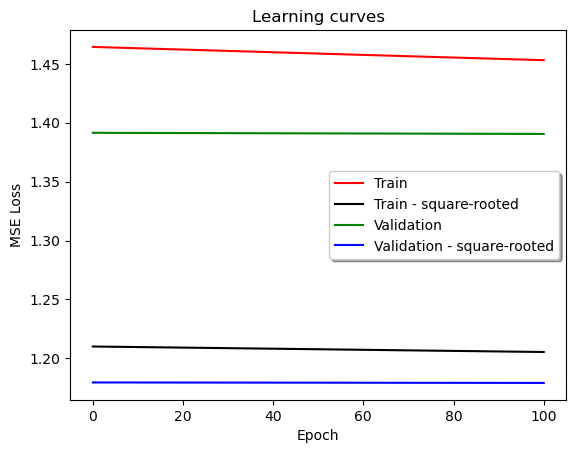

features: 200
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


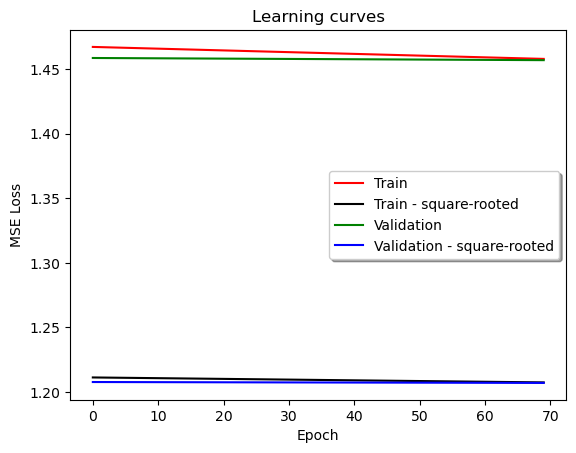

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


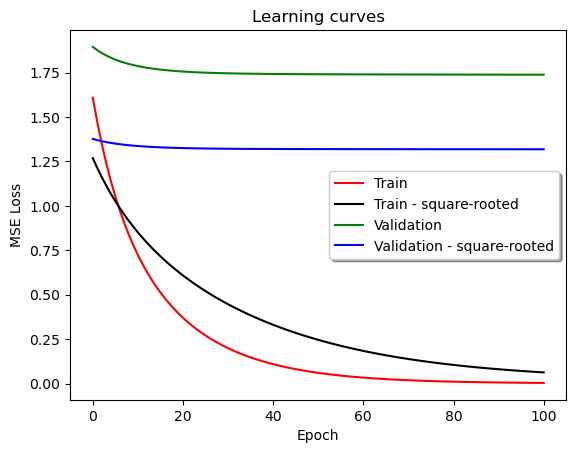

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


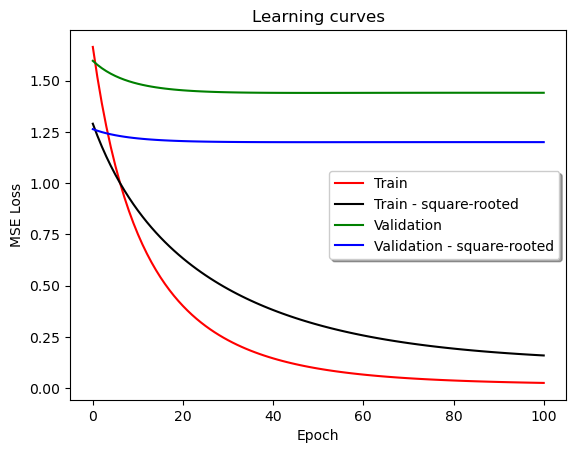

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


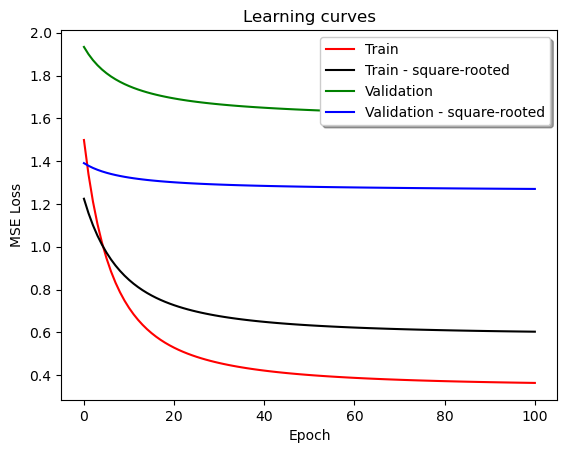

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


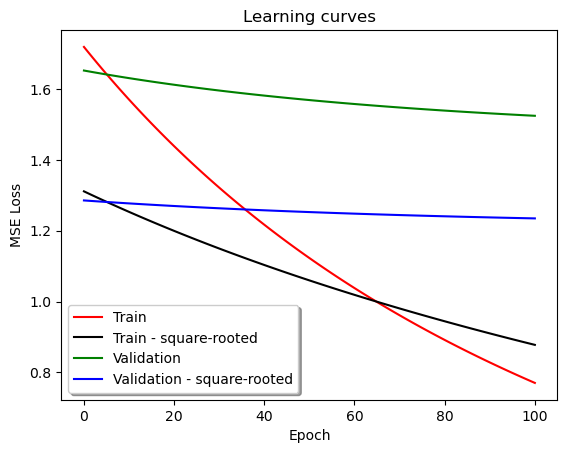

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


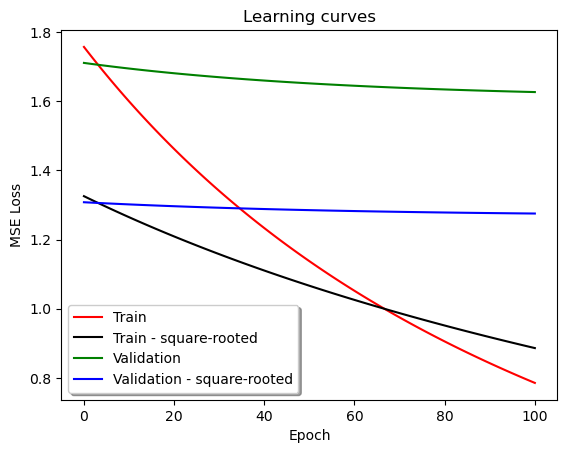

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


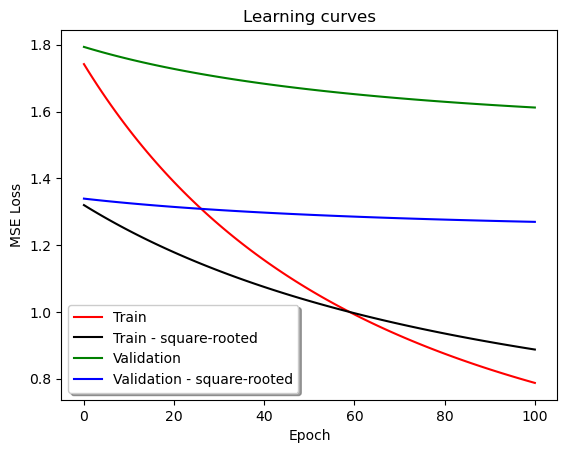

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


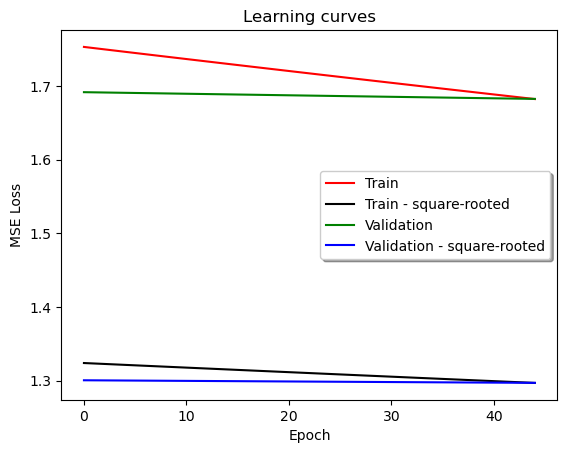

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


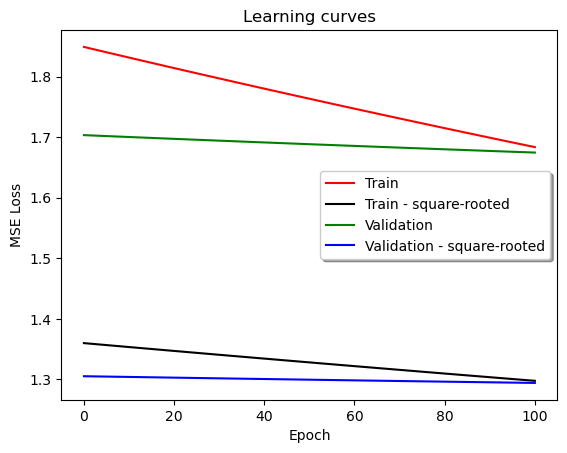

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


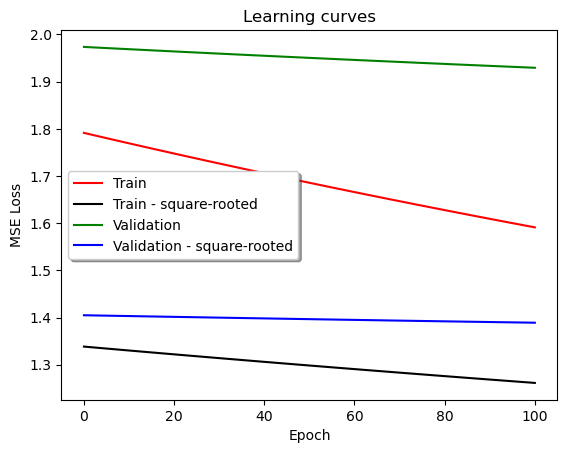

features: 300
learning rate: 1e-05
Epochs: 101
weight decay: 0.02
stopping: 0.001

RMSE
0.0


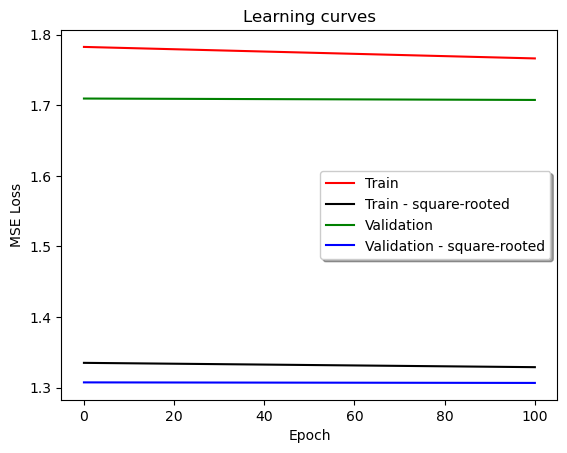

features: 300
learning rate: 1e-05
Epochs: 101
weight decay: 0.2
stopping: 0.001

RMSE
0.0


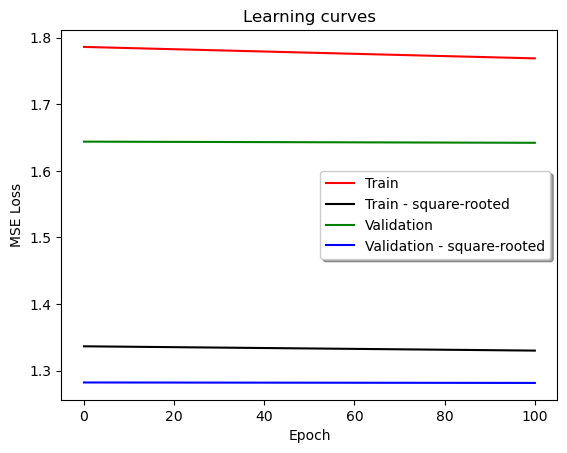

features: 300
learning rate: 1e-05
Epochs: 101
weight decay: 2
stopping: 0.001

RMSE
0.0


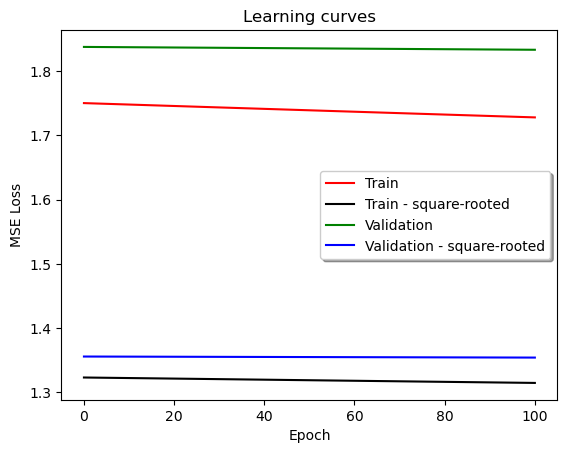

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


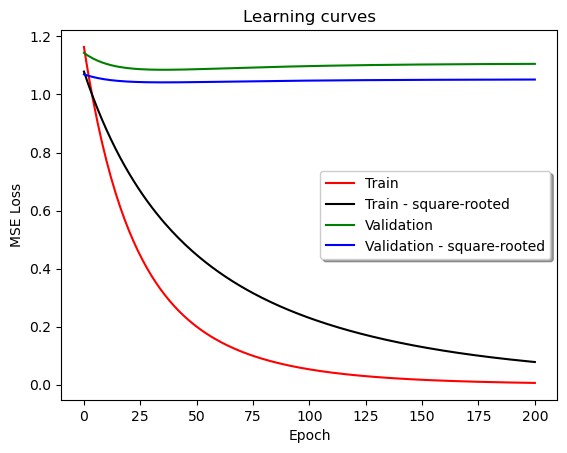

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


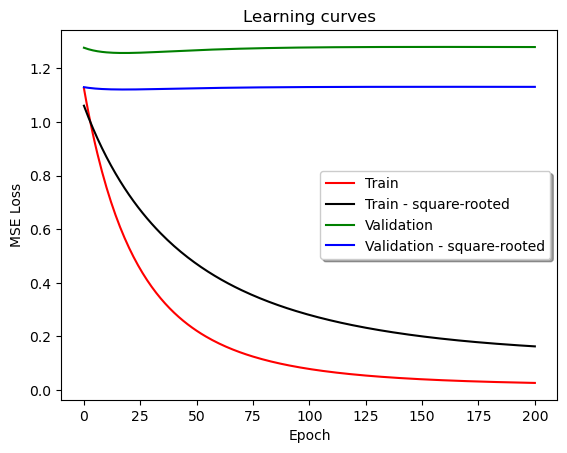

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


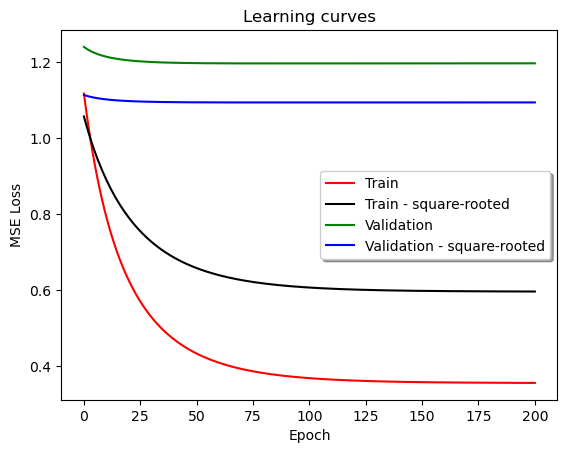

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


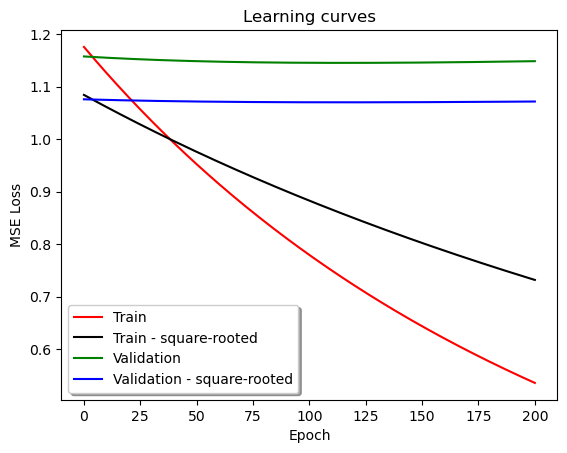

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


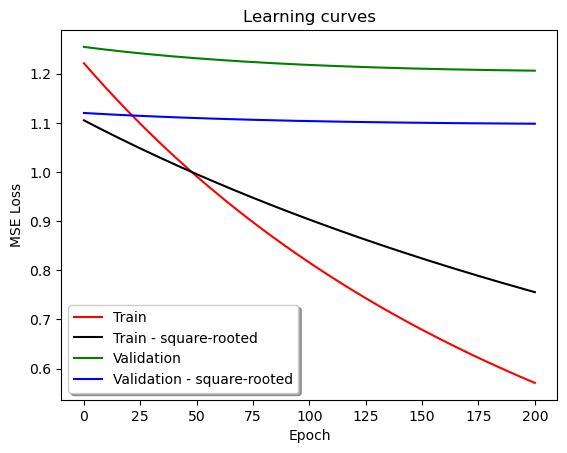

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


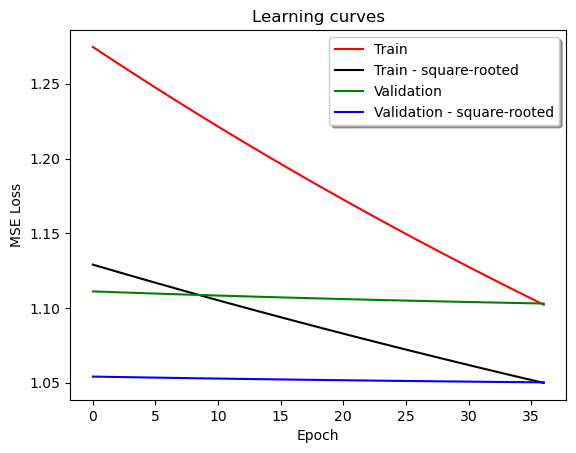

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


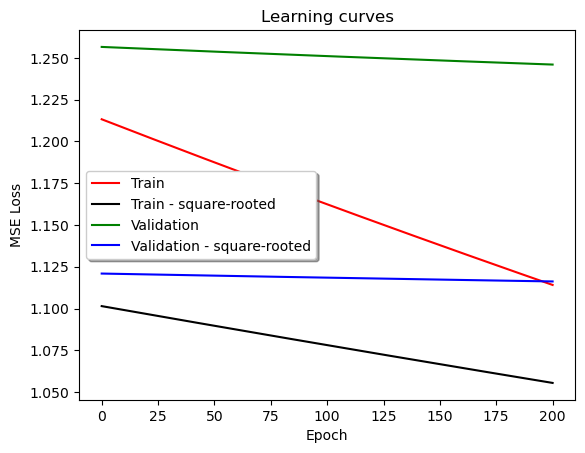

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


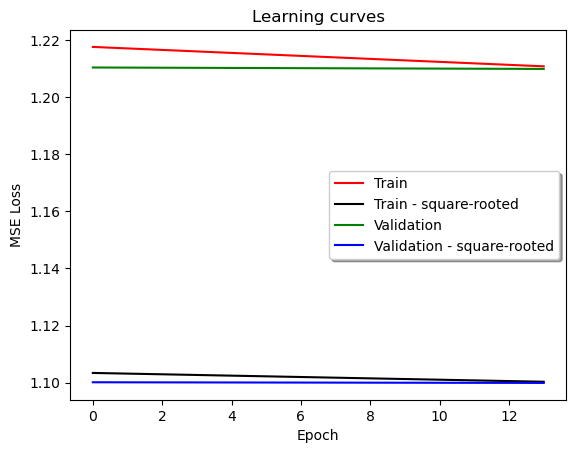

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


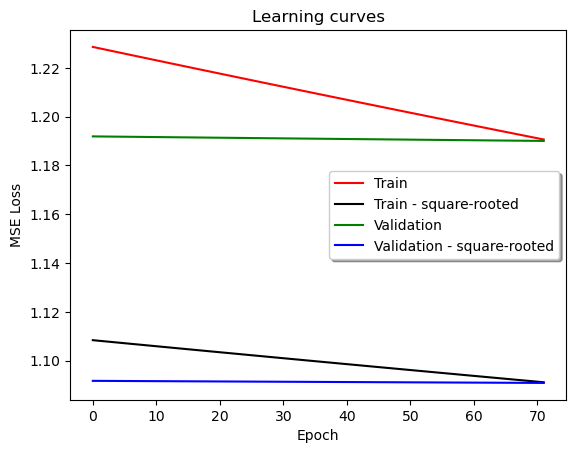

features: 3
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


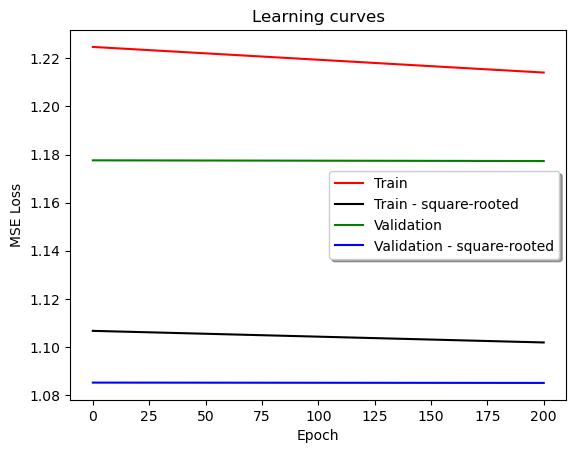

features: 3
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


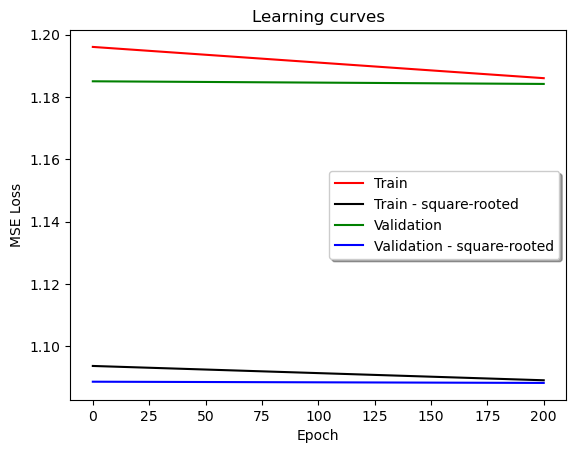

features: 3
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


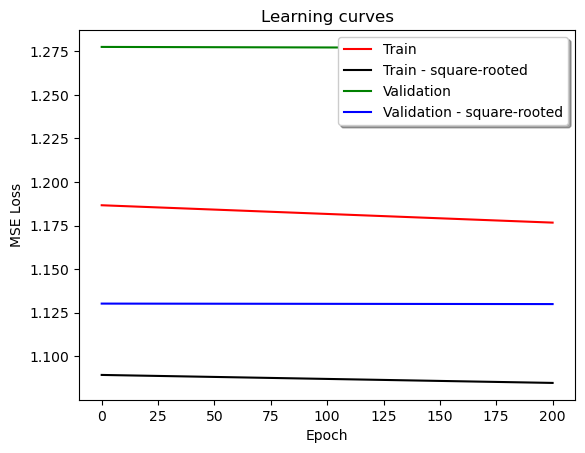

features: 5
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


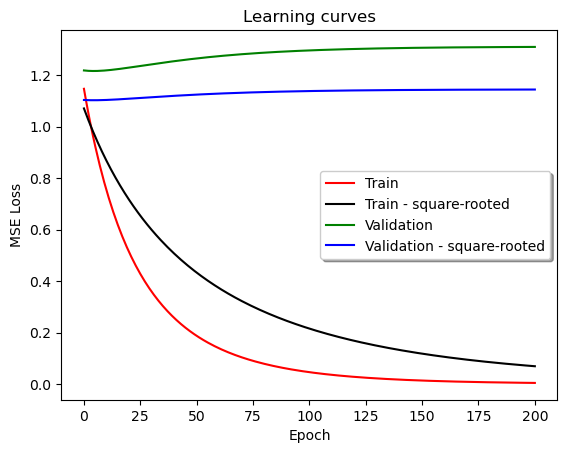

features: 5
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


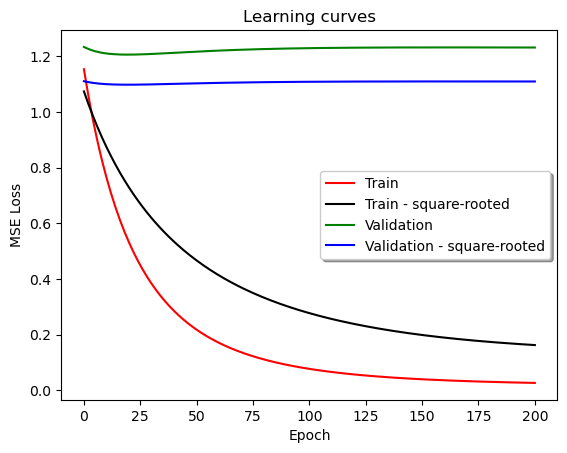

features: 5
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


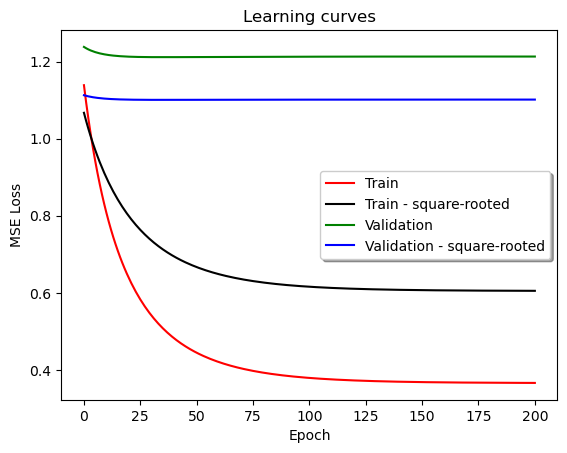

features: 5
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


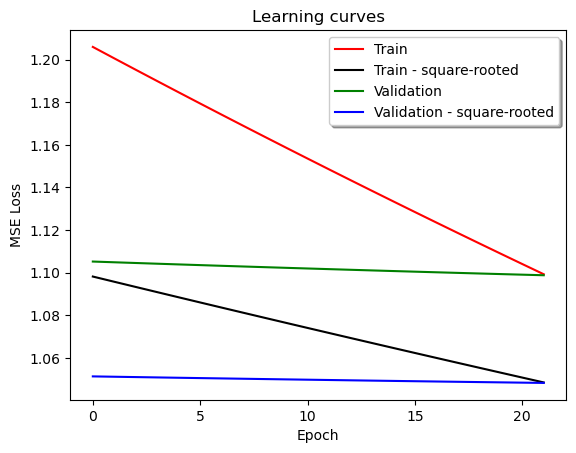

features: 5
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


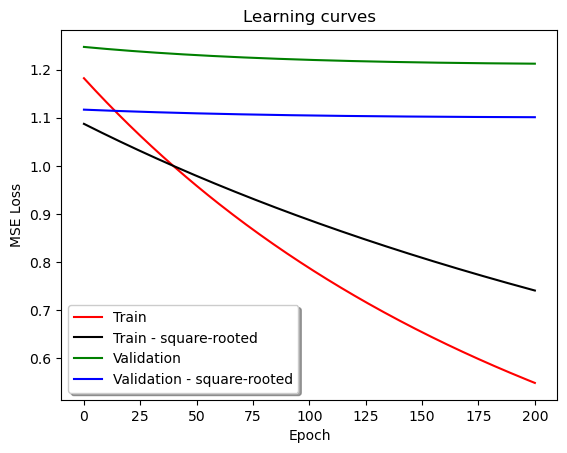

features: 5
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


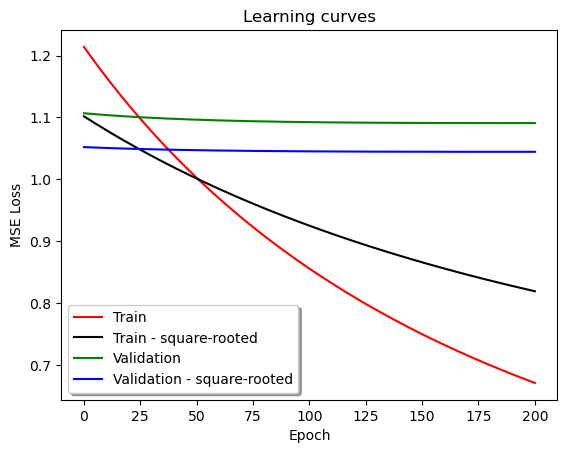

features: 5
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


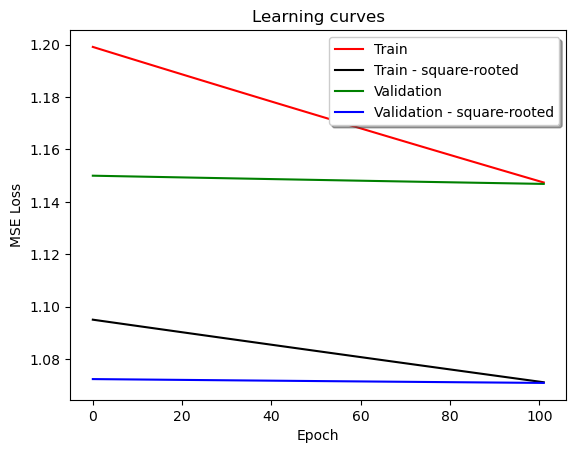

features: 5
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


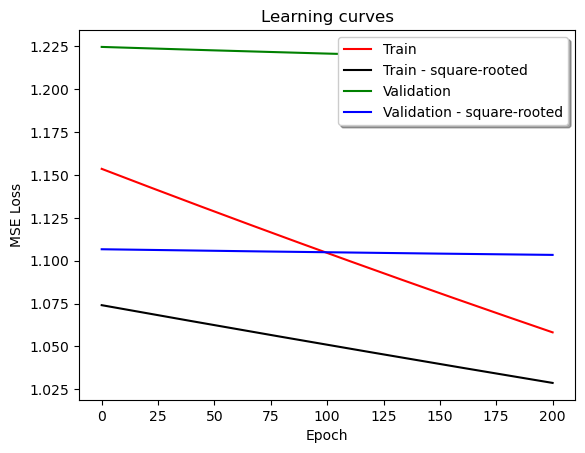

features: 5
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


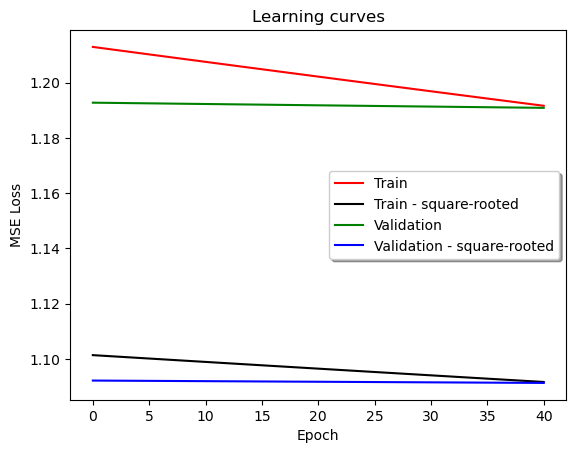

features: 5
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


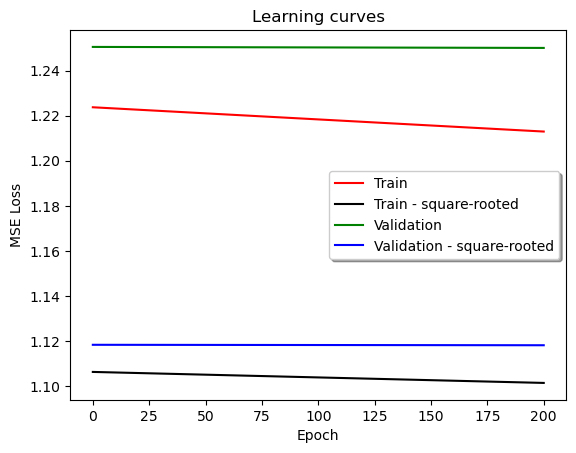

features: 5
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


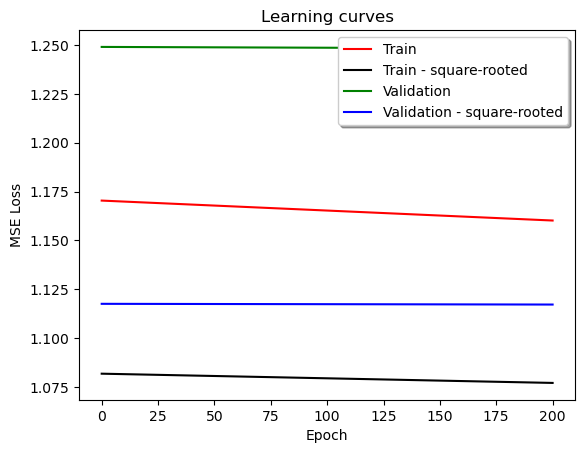

features: 5
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


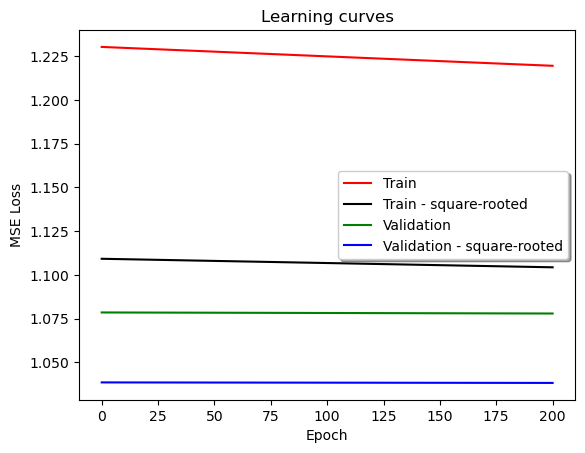

features: 10
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


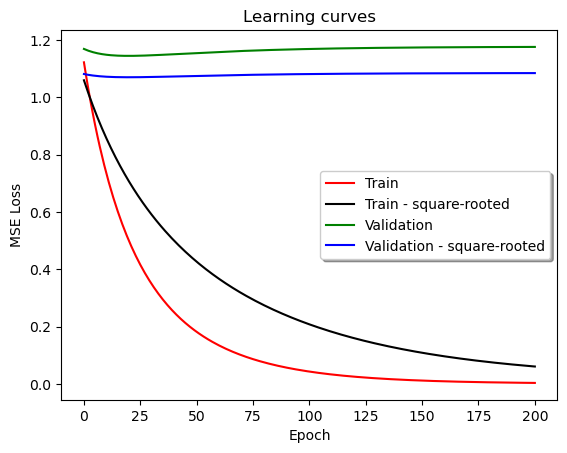

features: 10
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


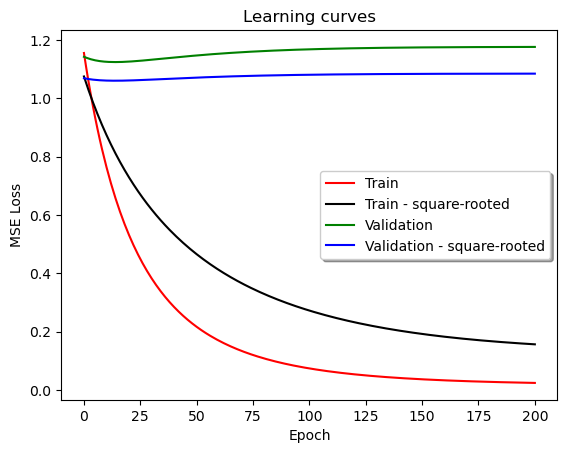

features: 10
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


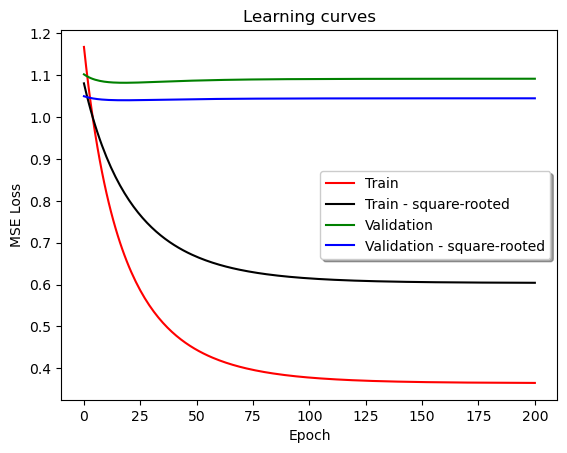

features: 10
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


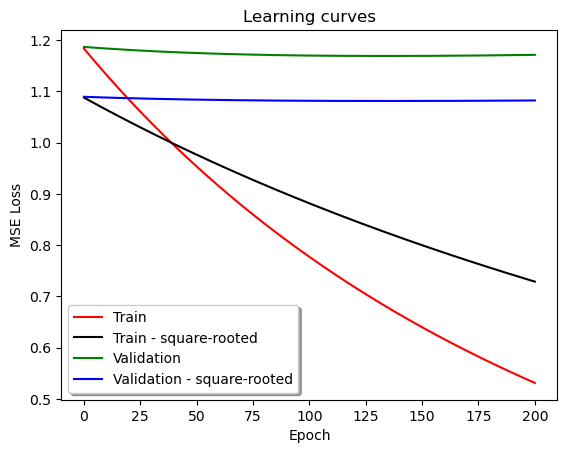

features: 10
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


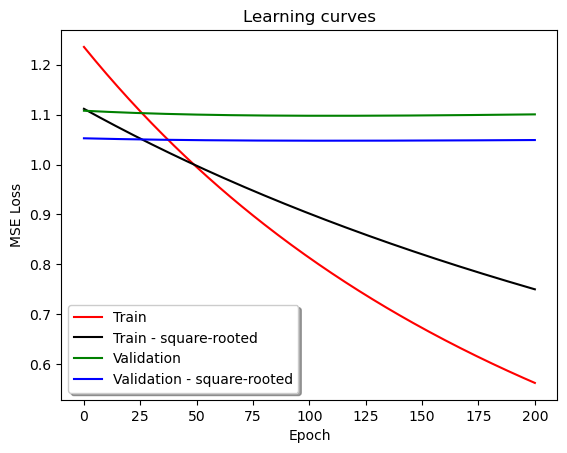

features: 10
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


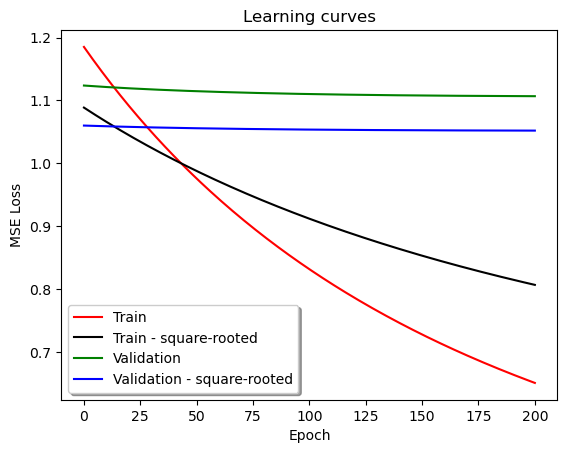

features: 10
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


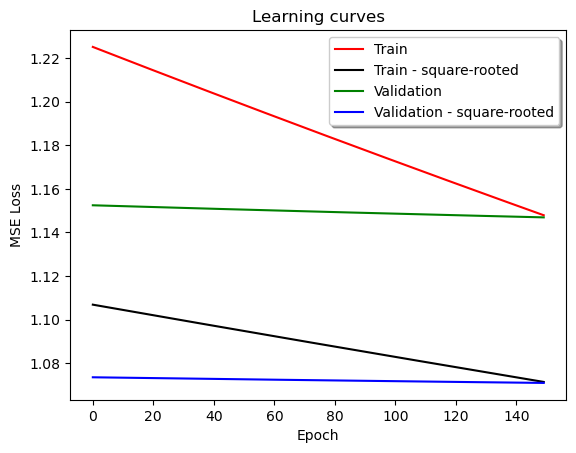

features: 10
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


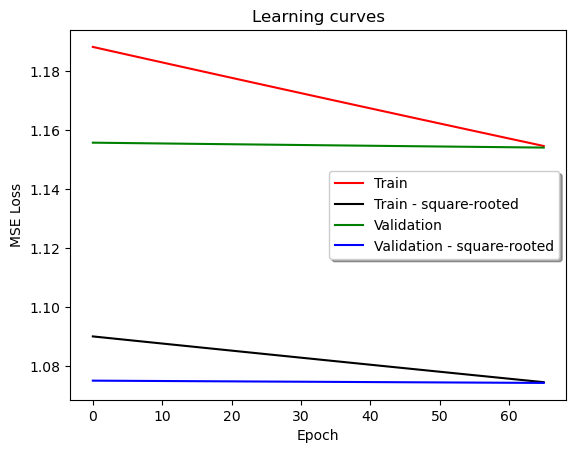

features: 10
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


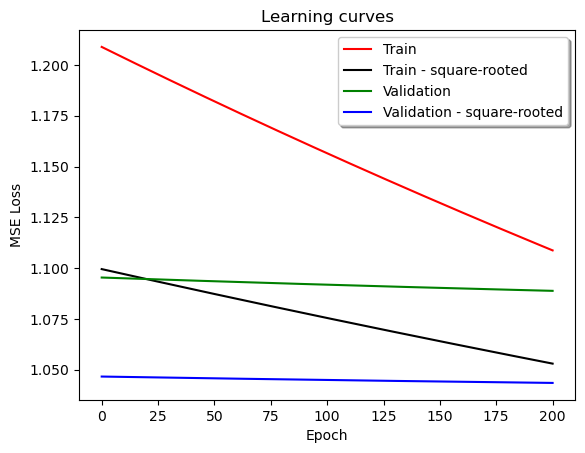

features: 10
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


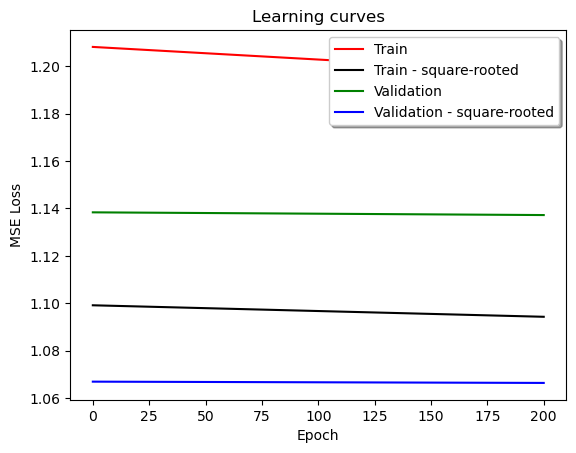

features: 10
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


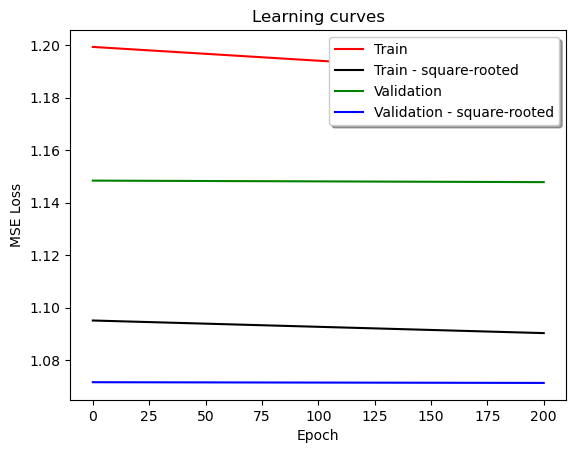

features: 10
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


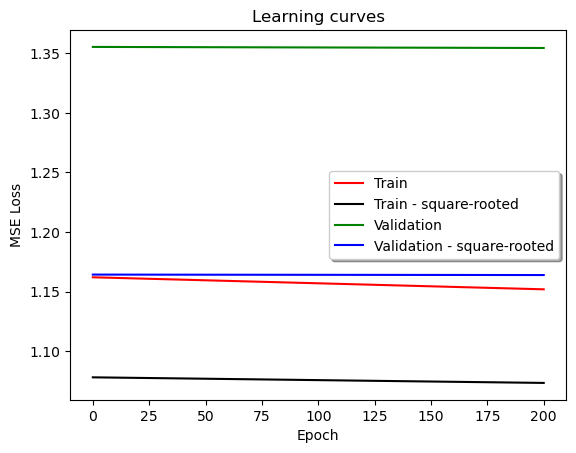

features: 100
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


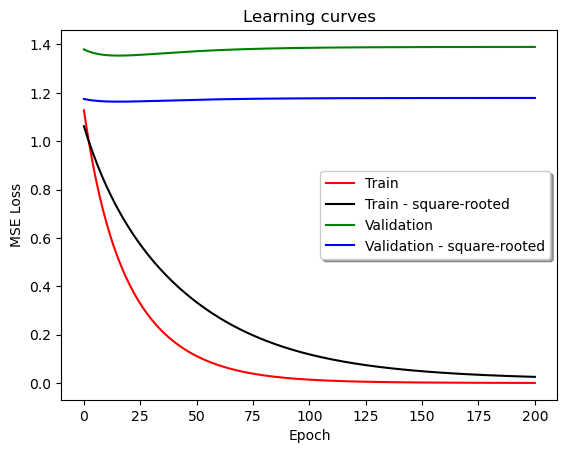

features: 100
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


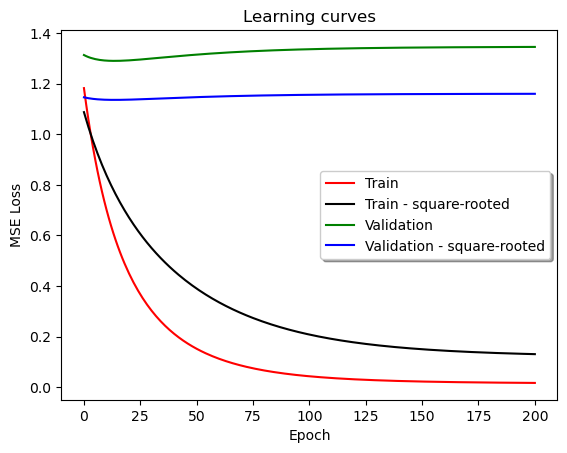

features: 100
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


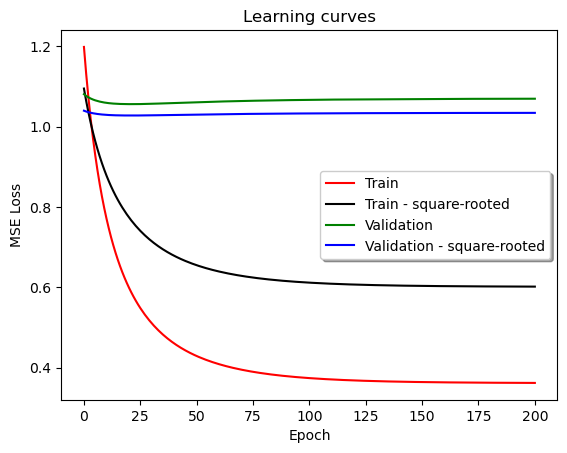

features: 100
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


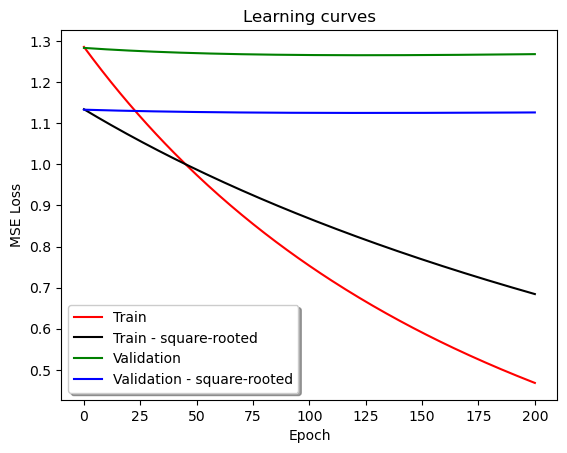

features: 100
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


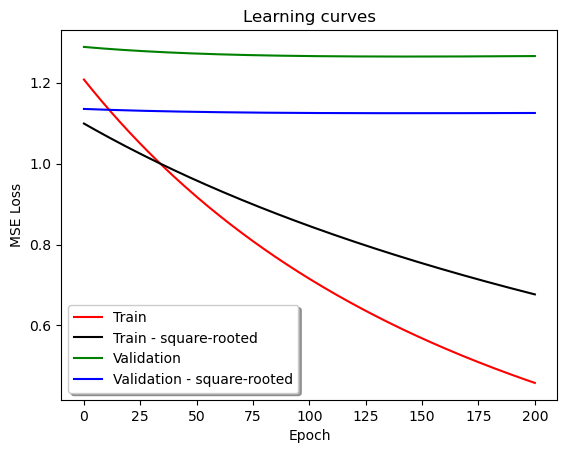

features: 100
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


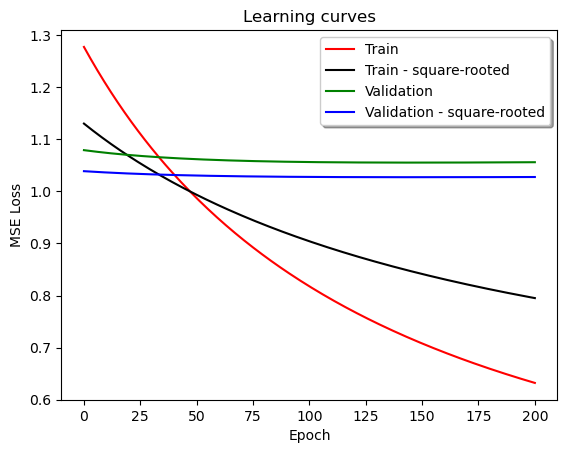

features: 100
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


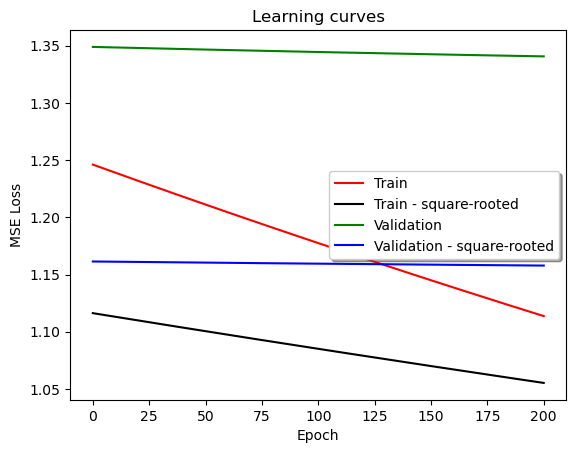

features: 100
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


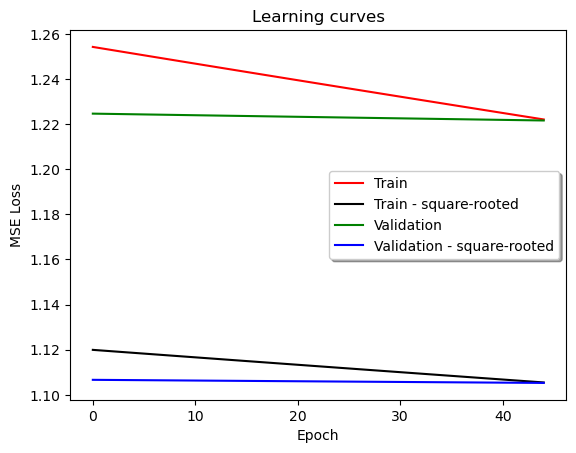

features: 100
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


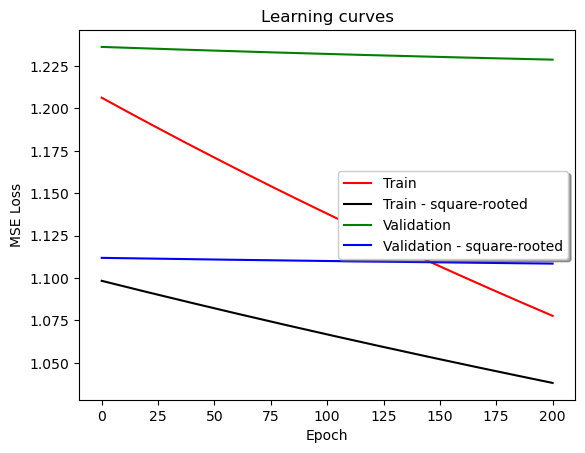

features: 100
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


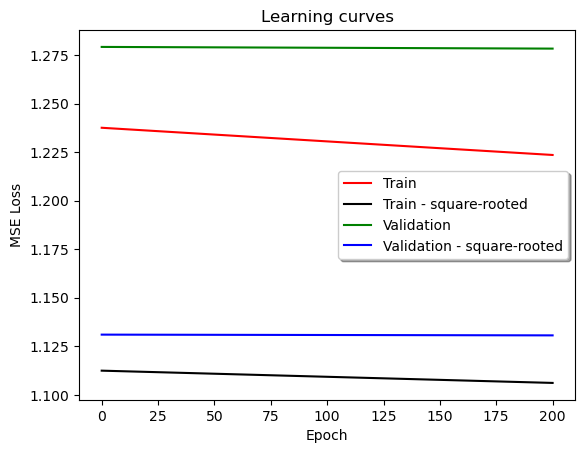

features: 100
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


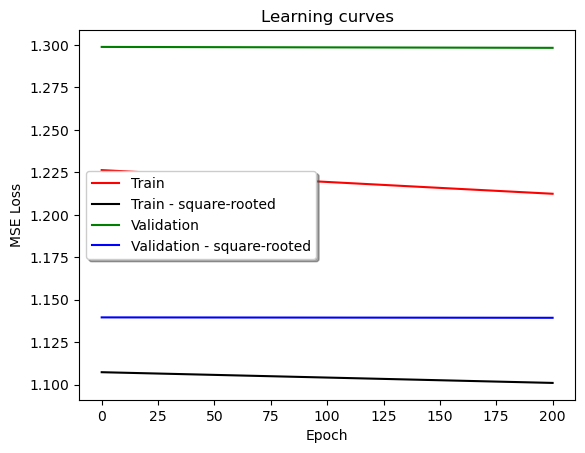

features: 100
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


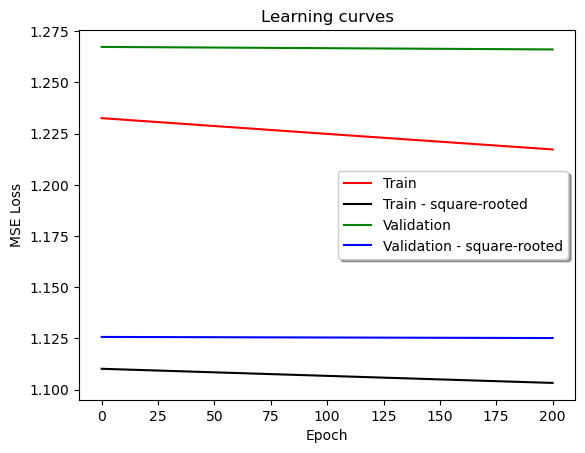

features: 200
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


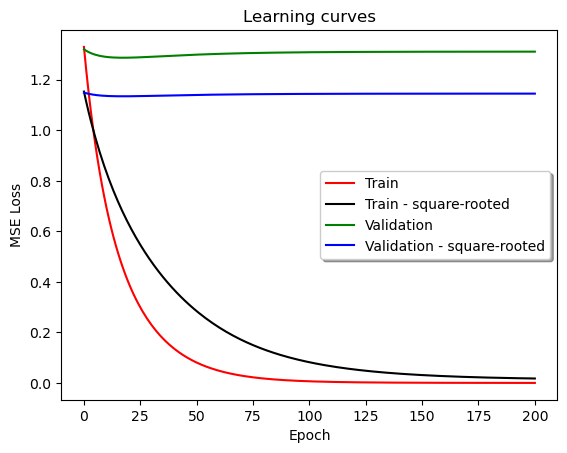

features: 200
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


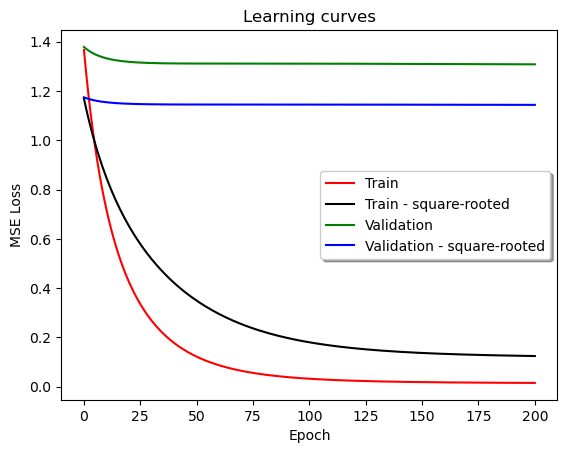

features: 200
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


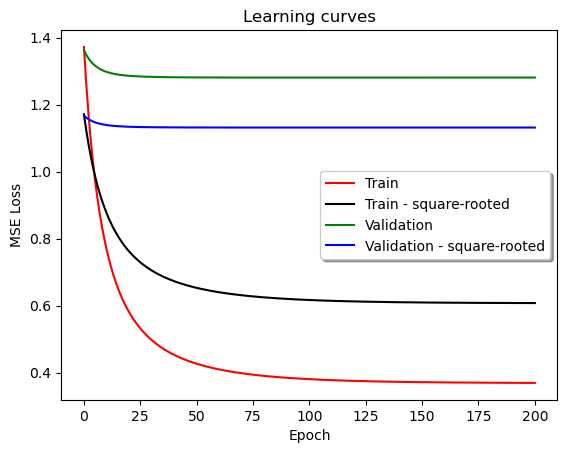

features: 200
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


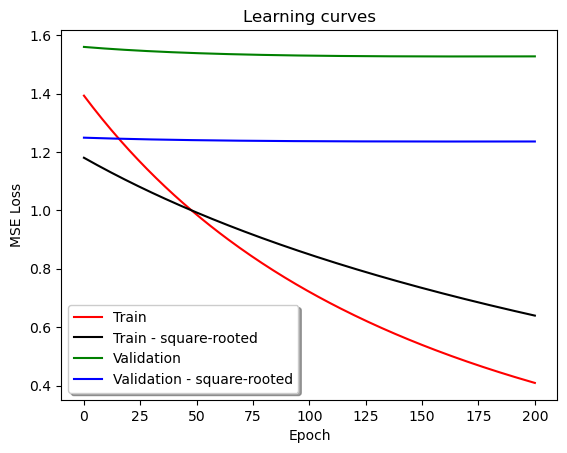

features: 200
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


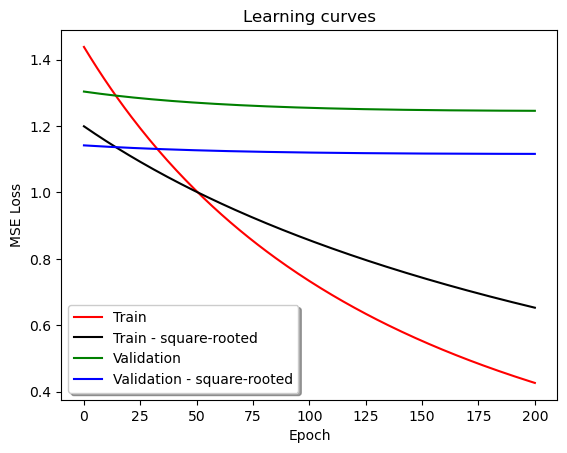

features: 200
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


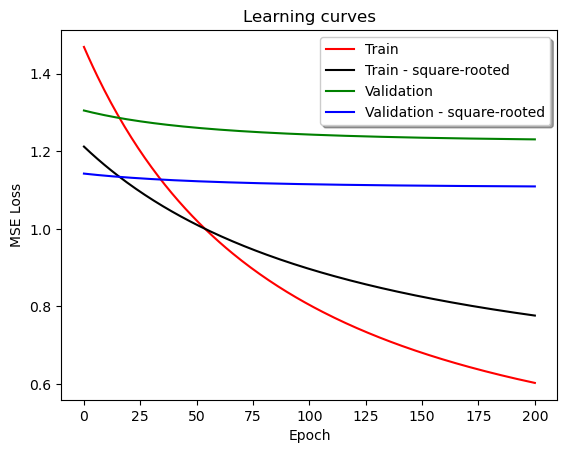

features: 200
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


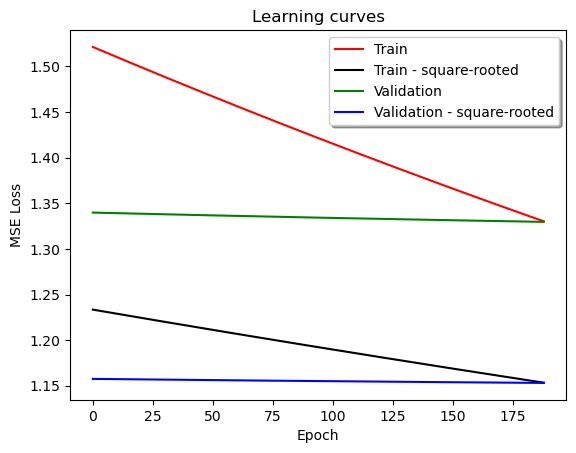

features: 200
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


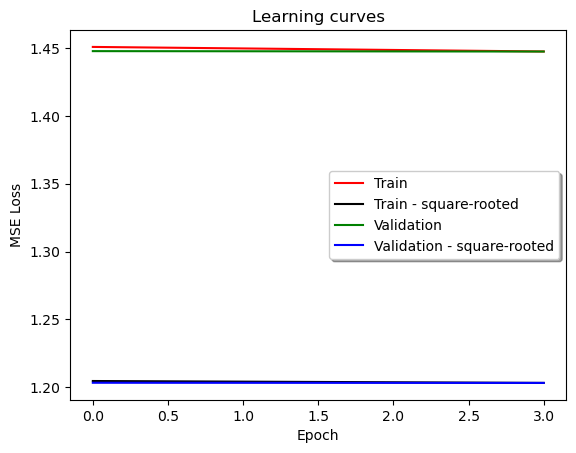

features: 200
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


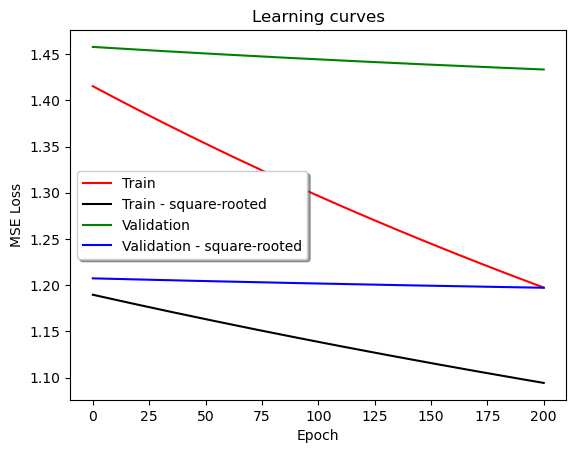

features: 200
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


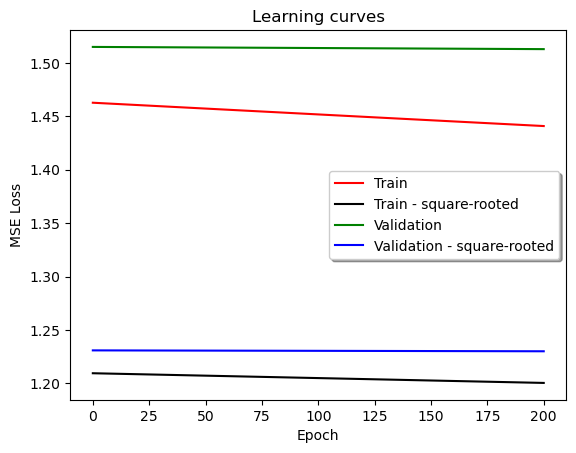

features: 200
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


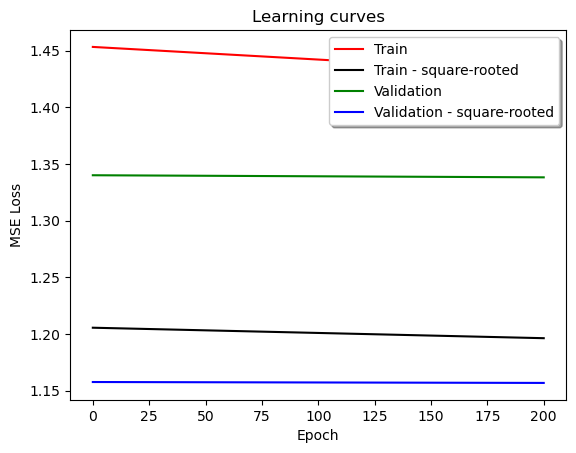

features: 200
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


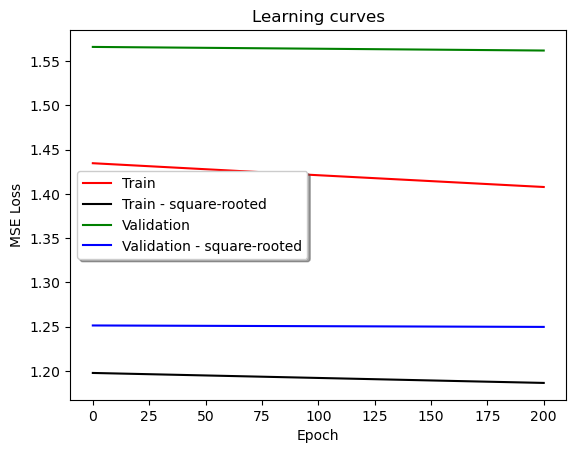

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


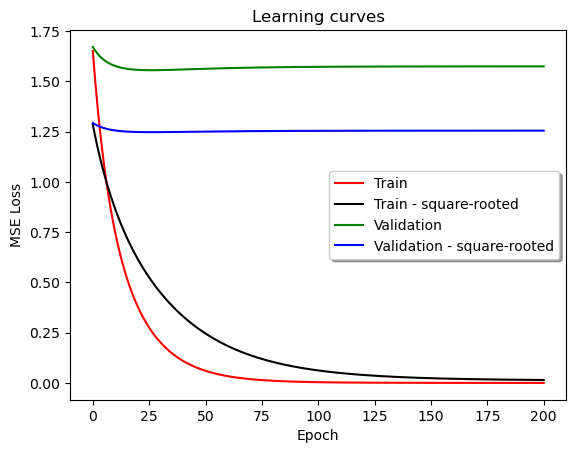

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


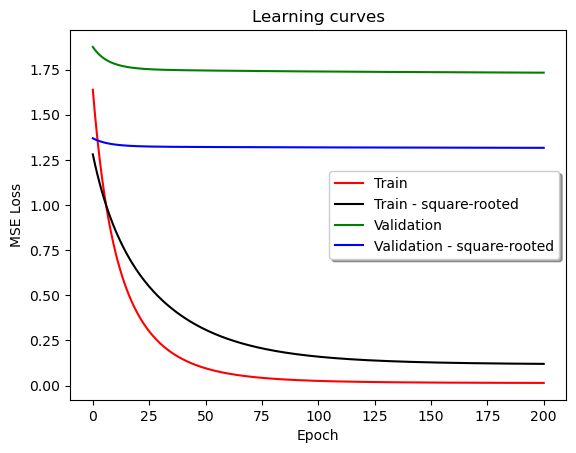

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


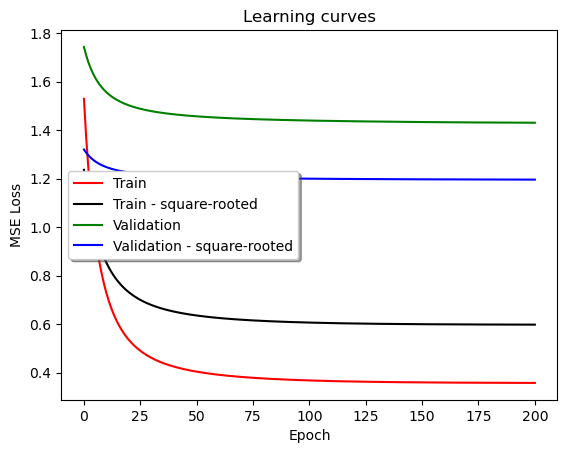

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


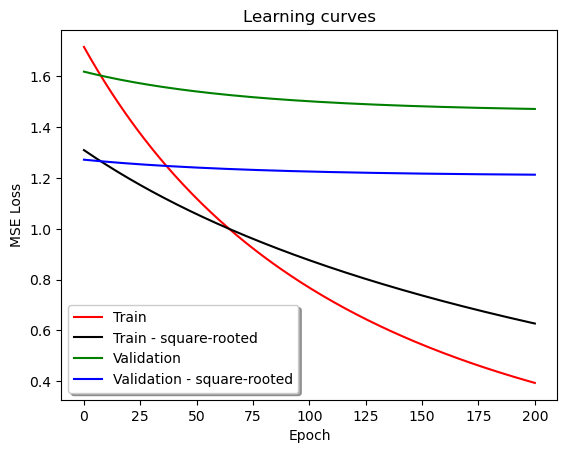

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


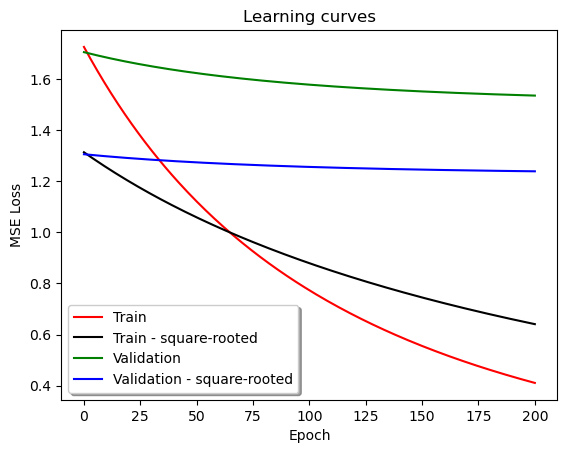

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


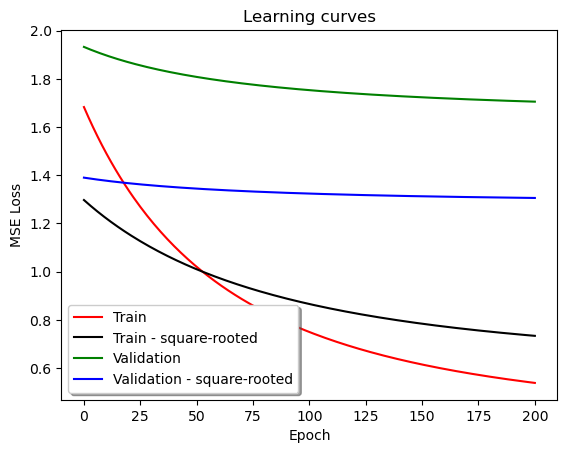

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


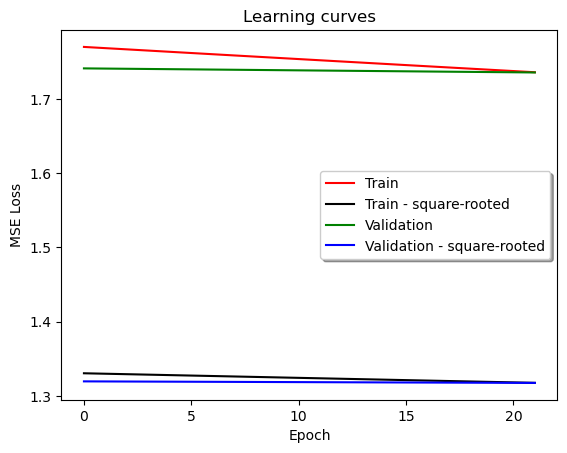

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


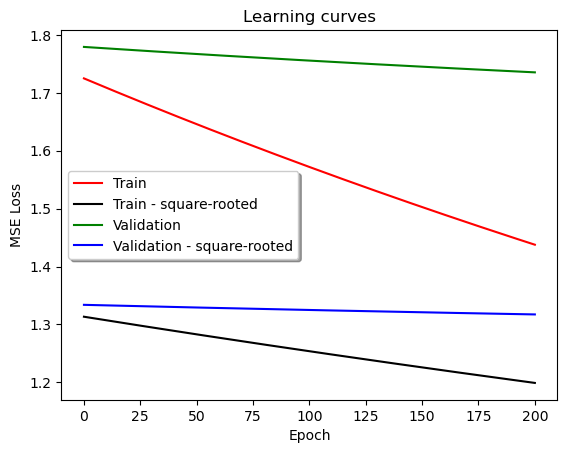

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


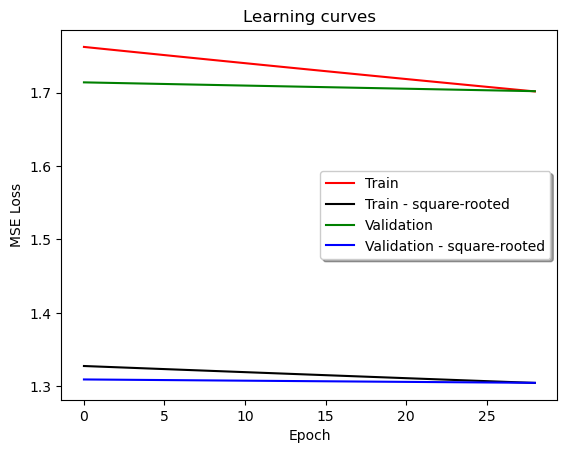

features: 300
learning rate: 1e-05
Epochs: 201
weight decay: 0.02
stopping: 0.001

RMSE
0.0


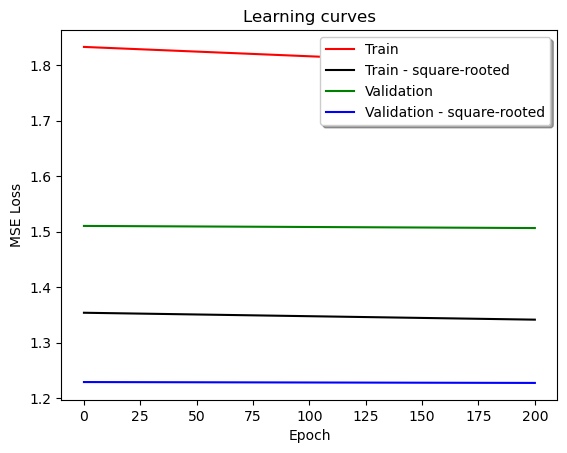

features: 300
learning rate: 1e-05
Epochs: 201
weight decay: 0.2
stopping: 0.001

RMSE
0.0


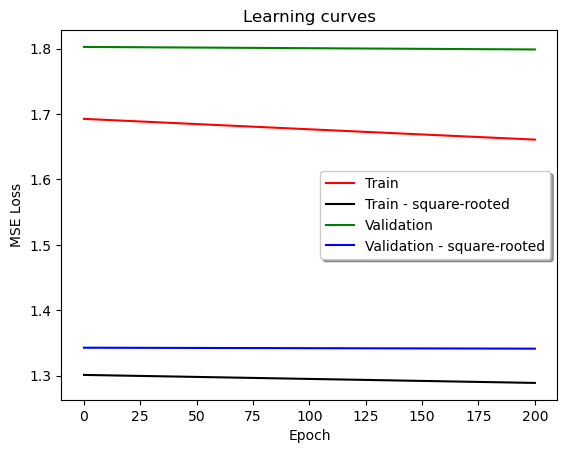

features: 300
learning rate: 1e-05
Epochs: 201
weight decay: 2
stopping: 0.001

RMSE
0.0


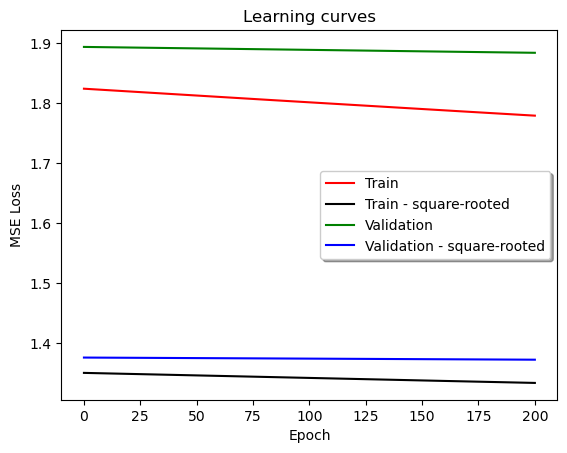

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


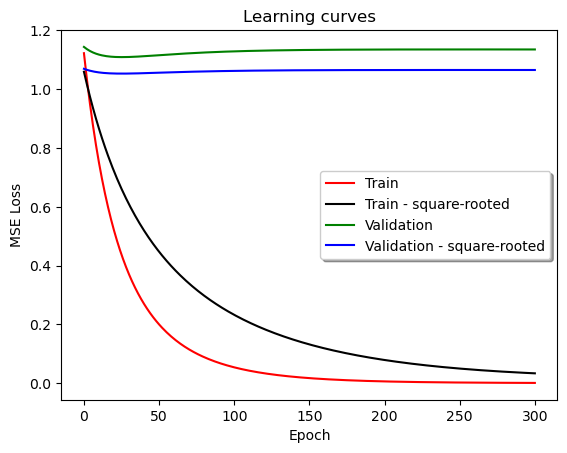

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


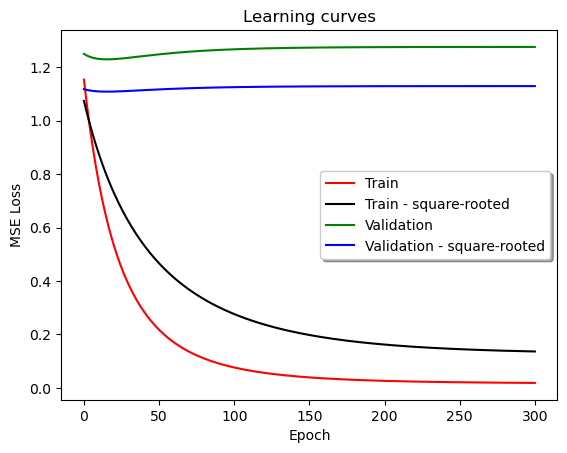

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


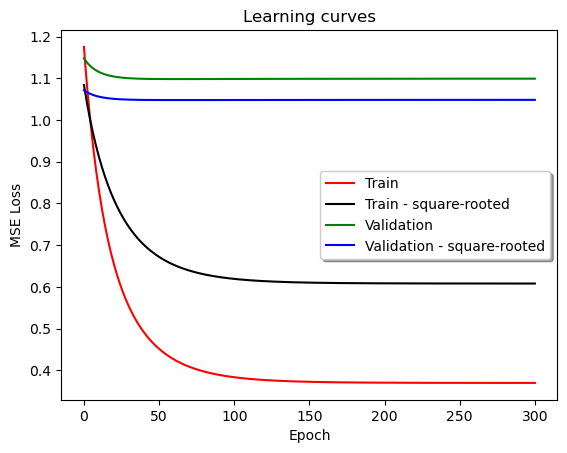

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


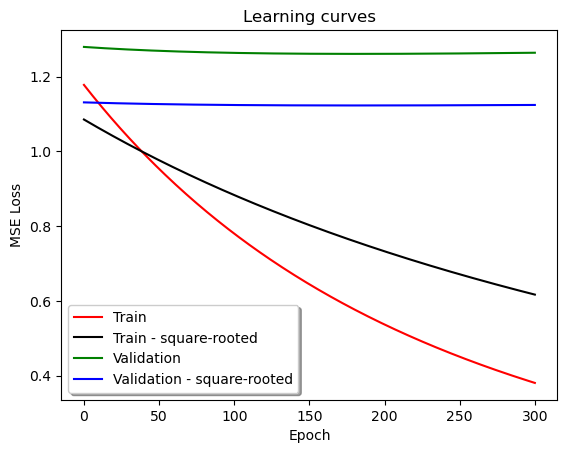

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


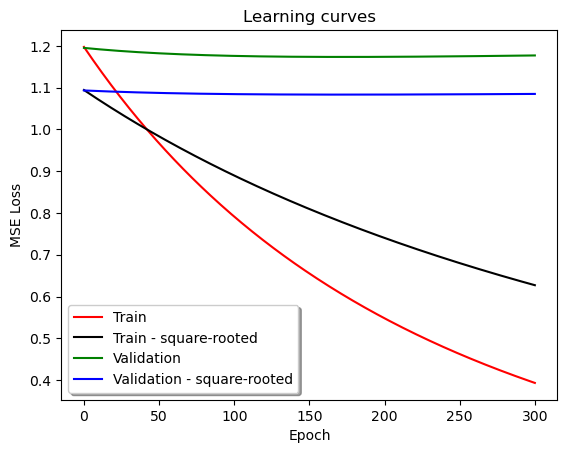

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


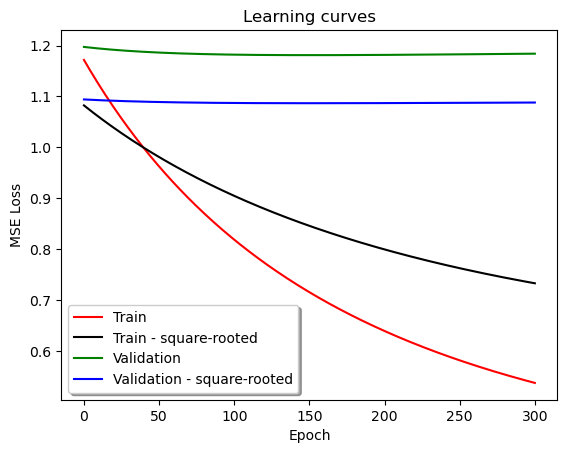

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


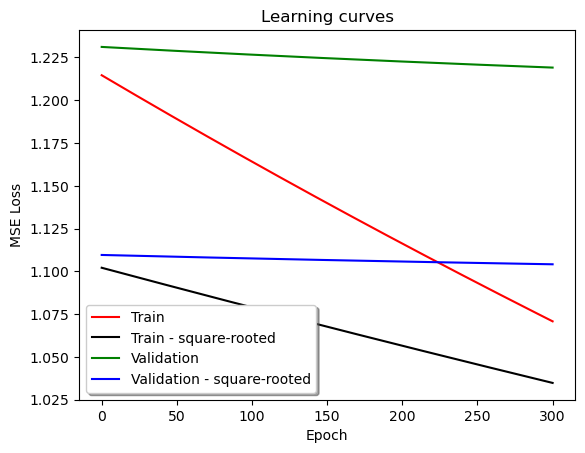

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


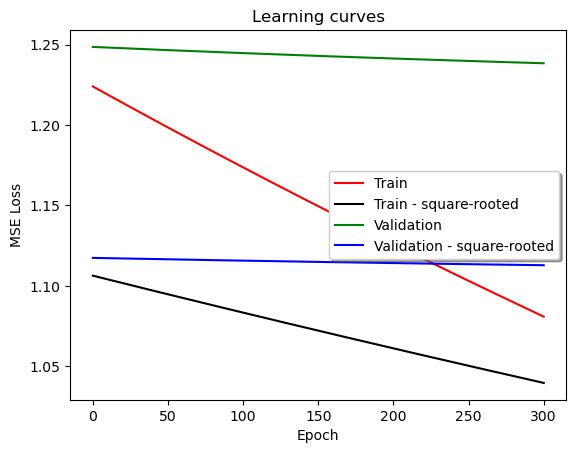

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


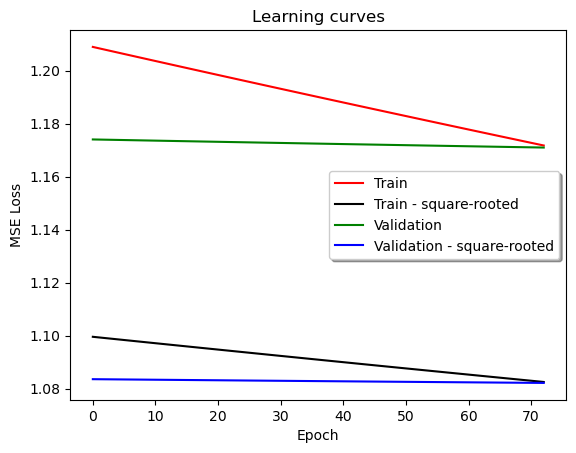

features: 3
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


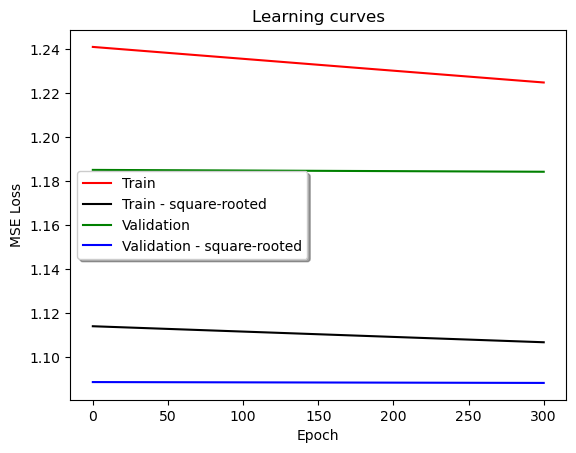

features: 3
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


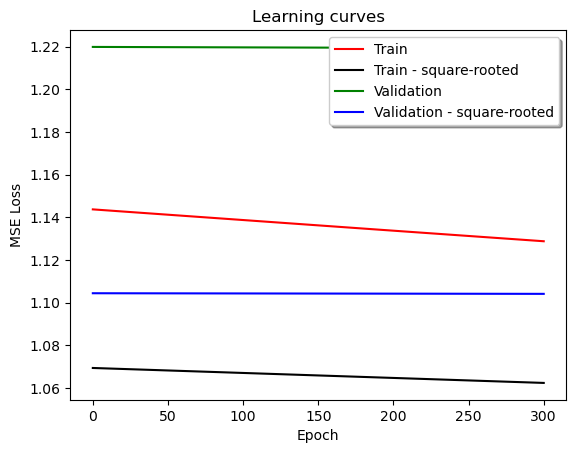

features: 3
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


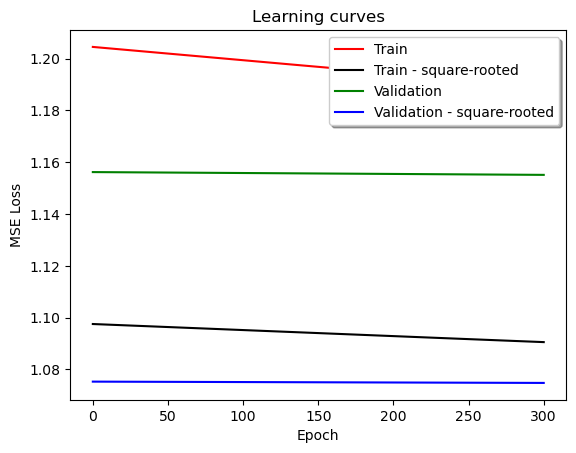

features: 5
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


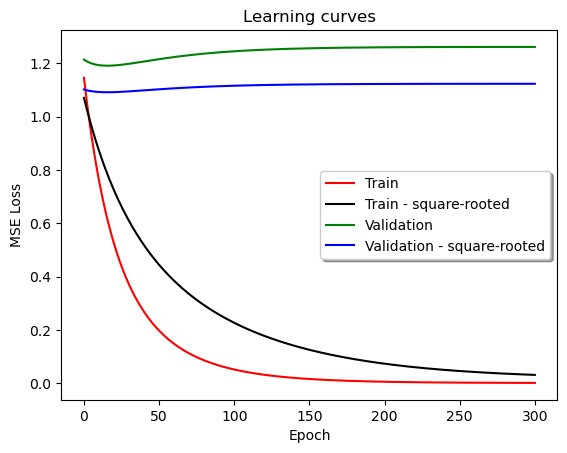

features: 5
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


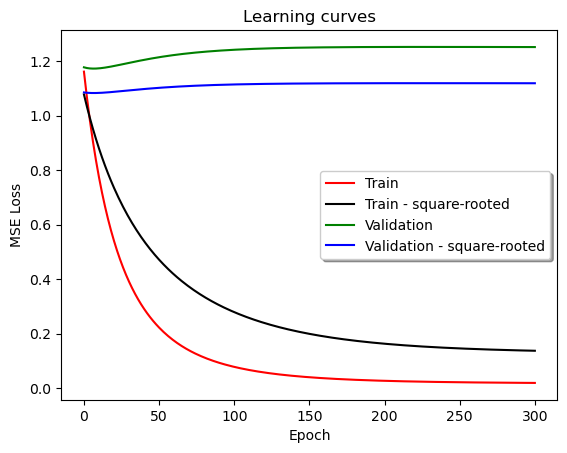

features: 5
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


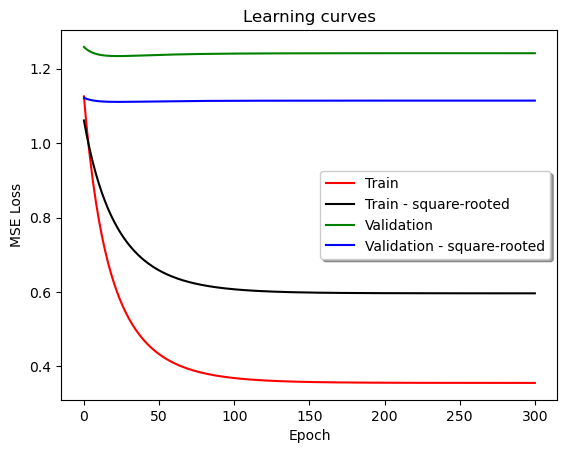

features: 5
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


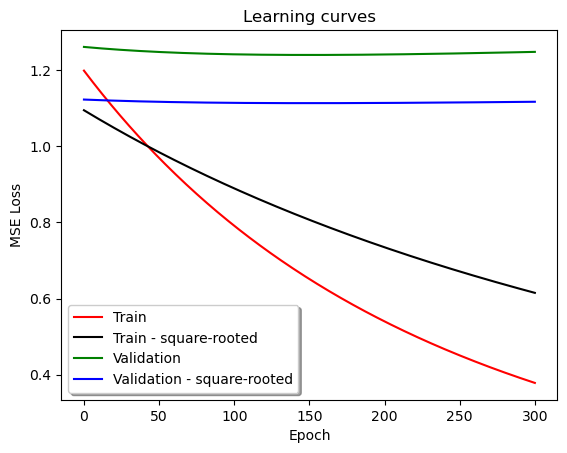

features: 5
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


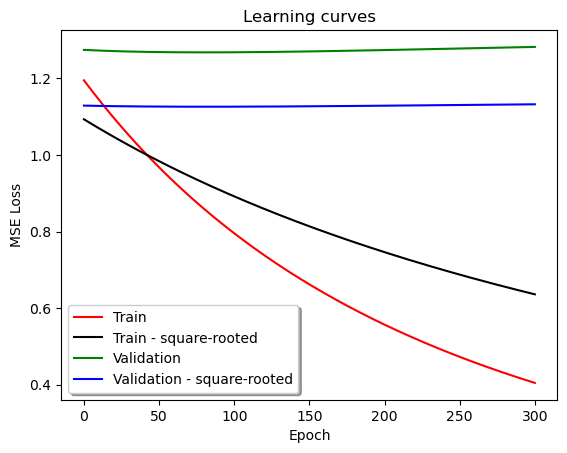

features: 5
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


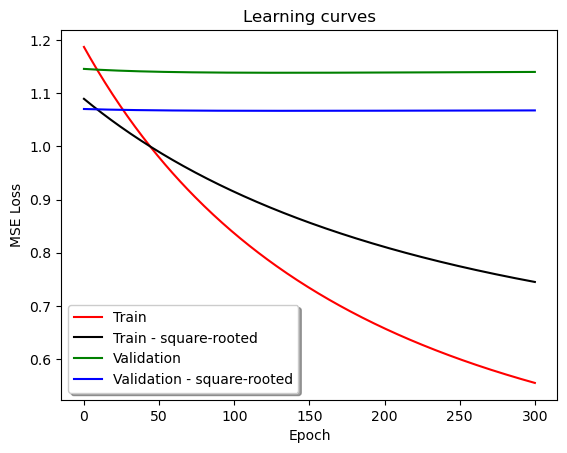

features: 5
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


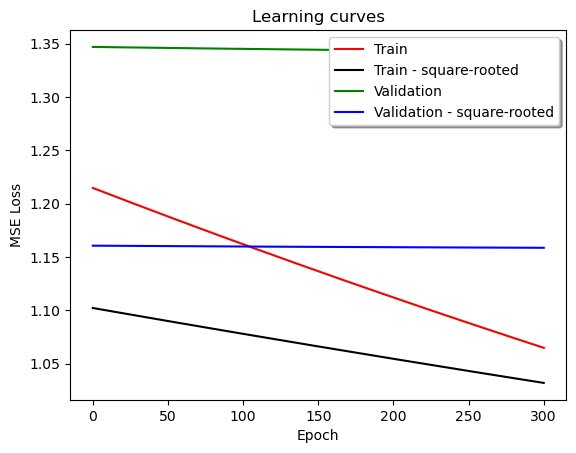

features: 5
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


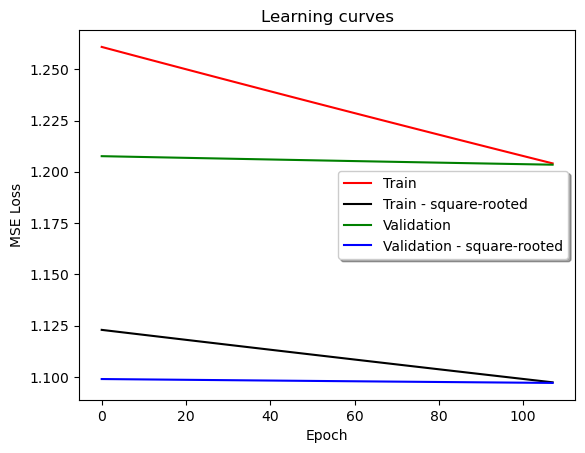

features: 5
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


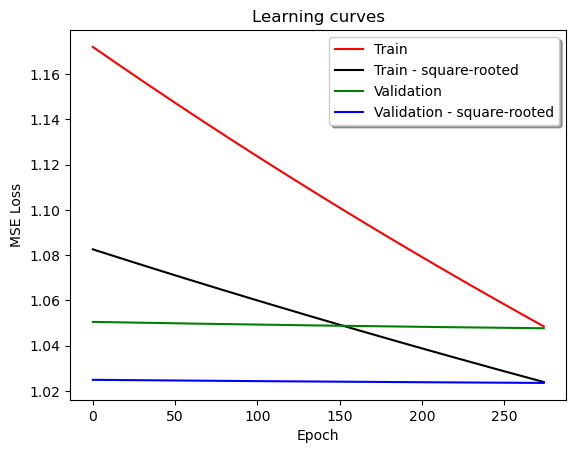

features: 5
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


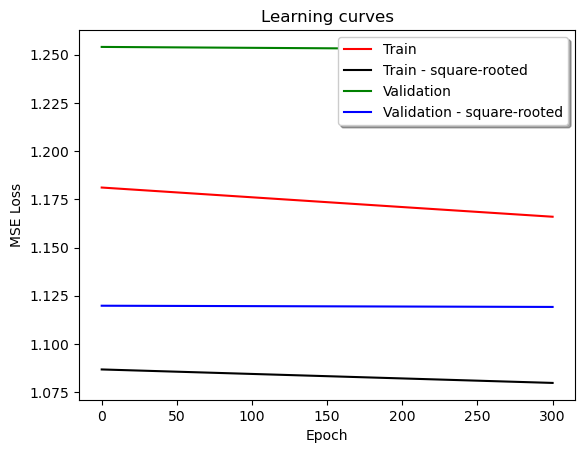

features: 5
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


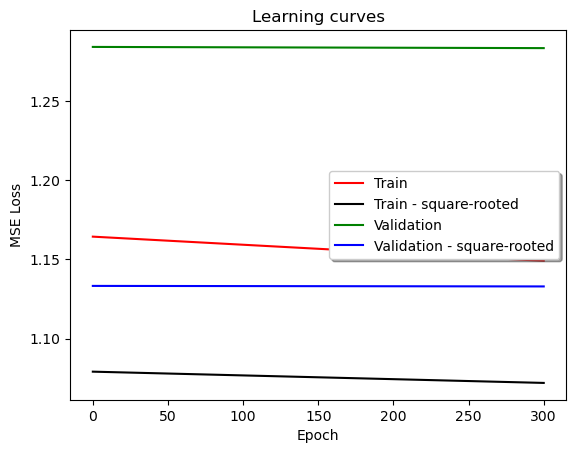

features: 5
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


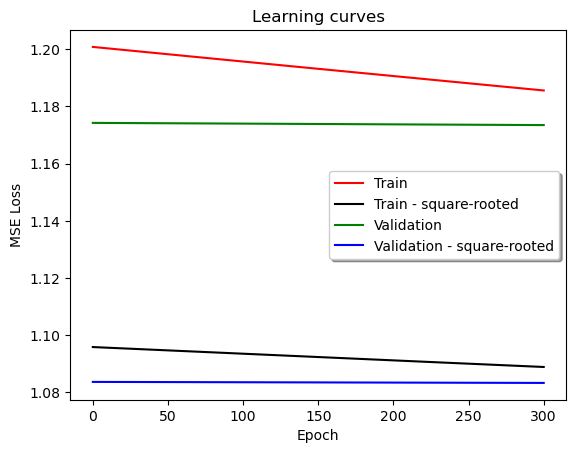

features: 10
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


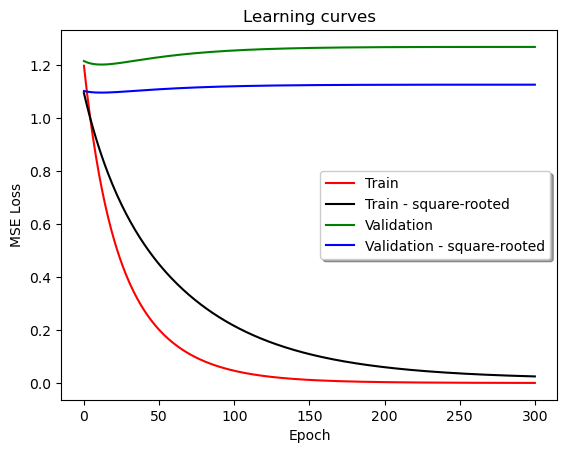

features: 10
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


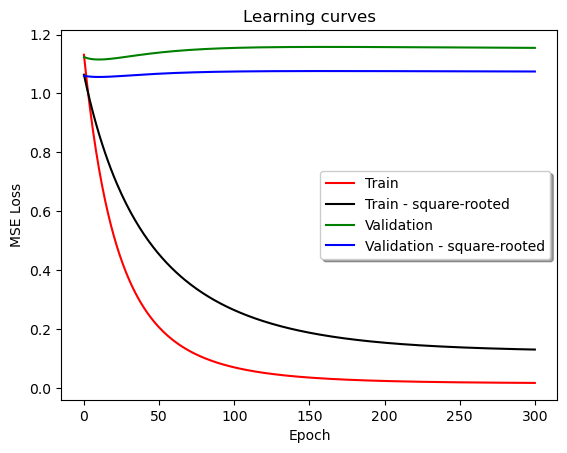

features: 10
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


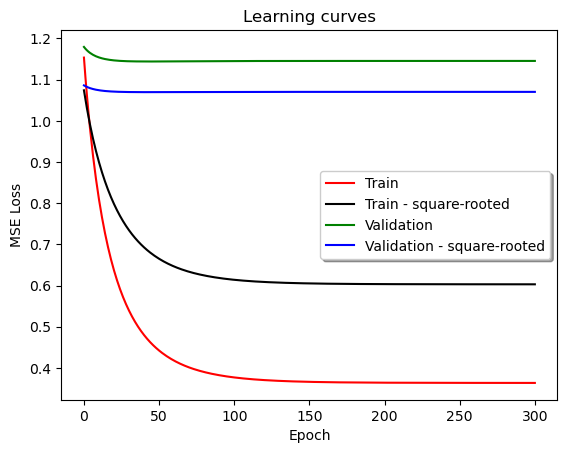

features: 10
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


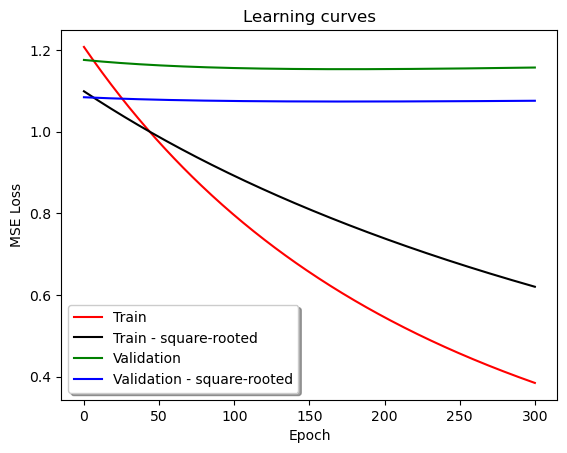

features: 10
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


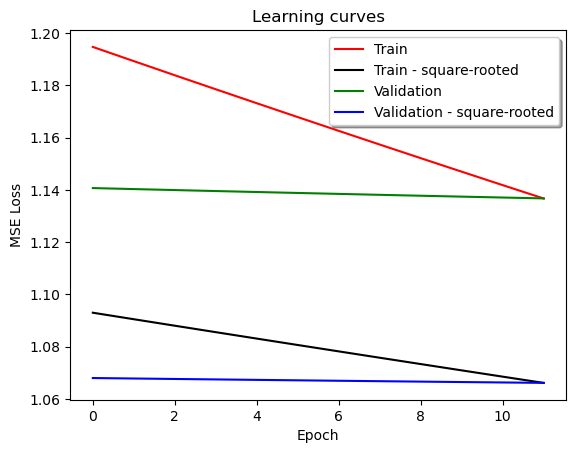

features: 10
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


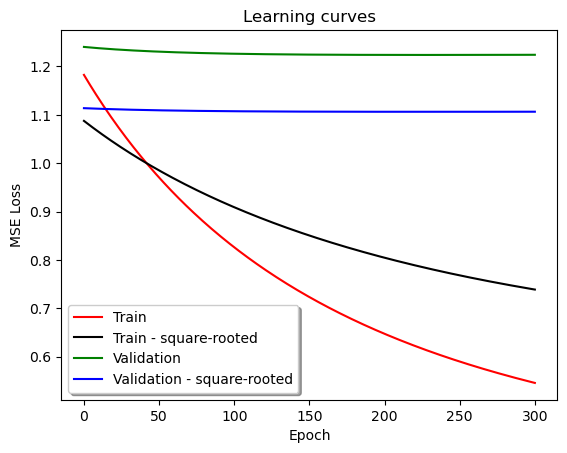

features: 10
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


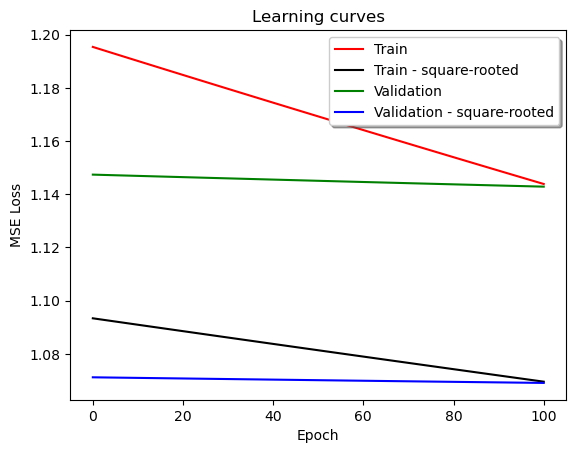

features: 10
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


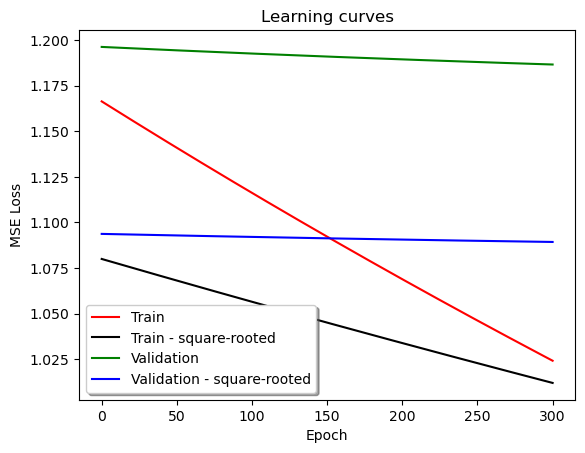

features: 10
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


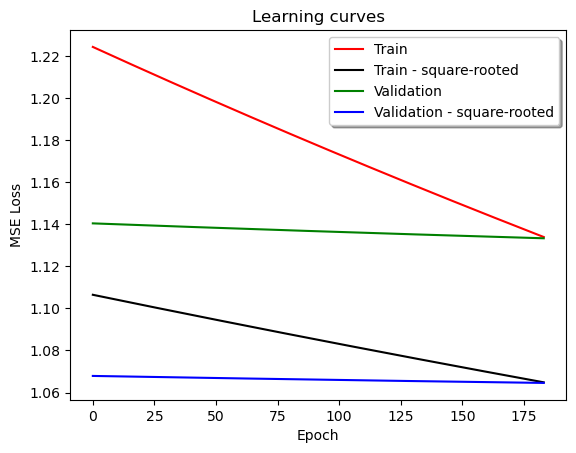

features: 10
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


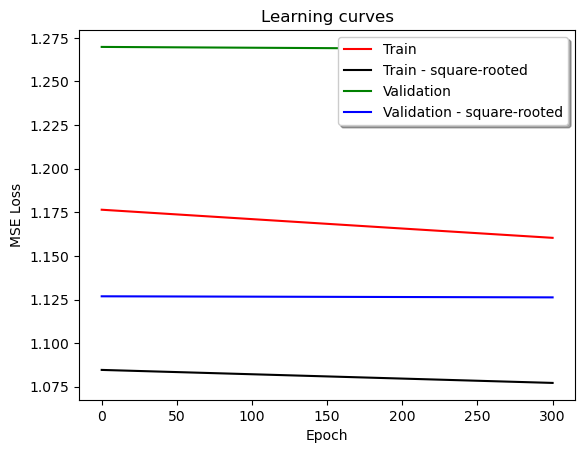

features: 10
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


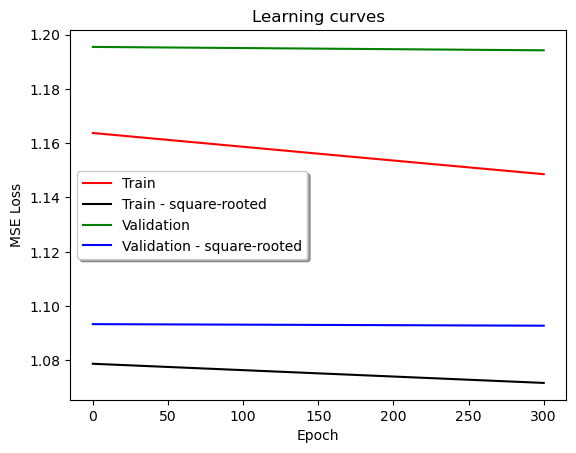

features: 10
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


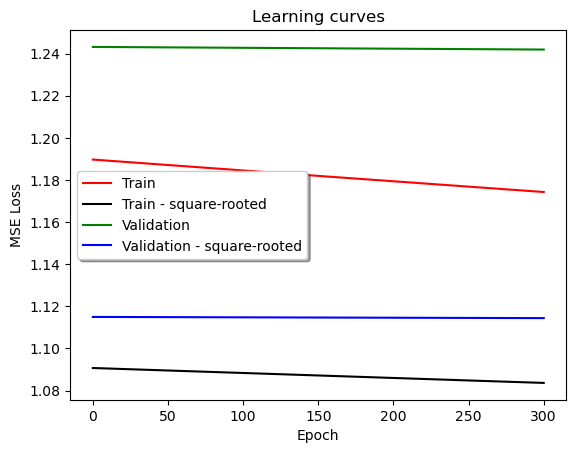

features: 100
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


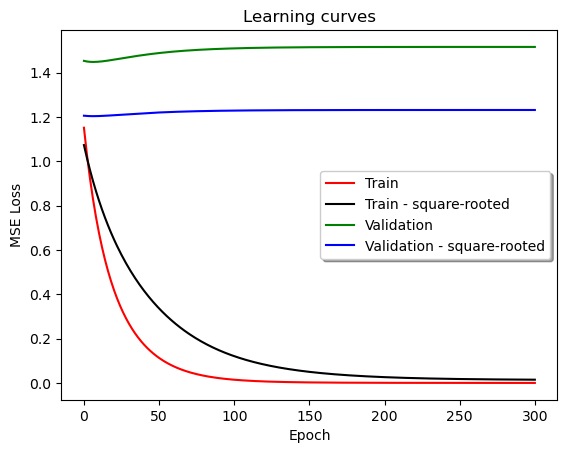

features: 100
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


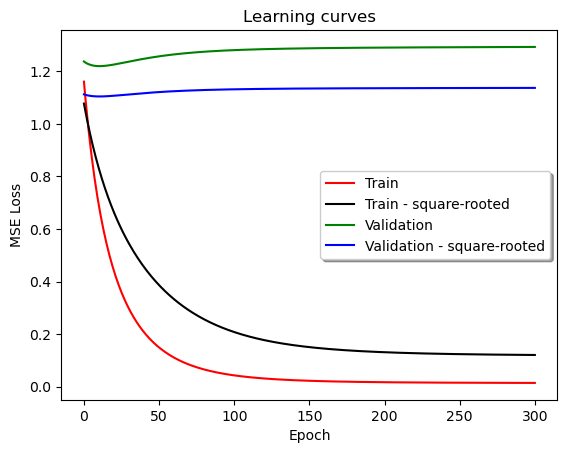

features: 100
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


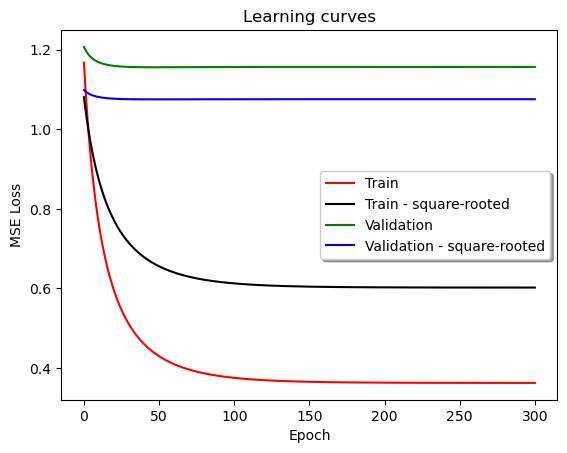

features: 100
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


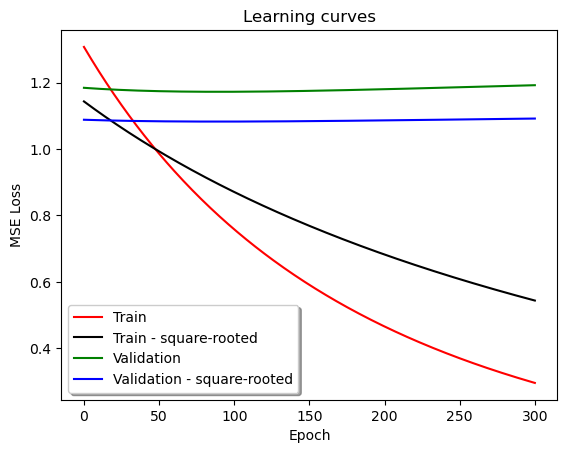

features: 100
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


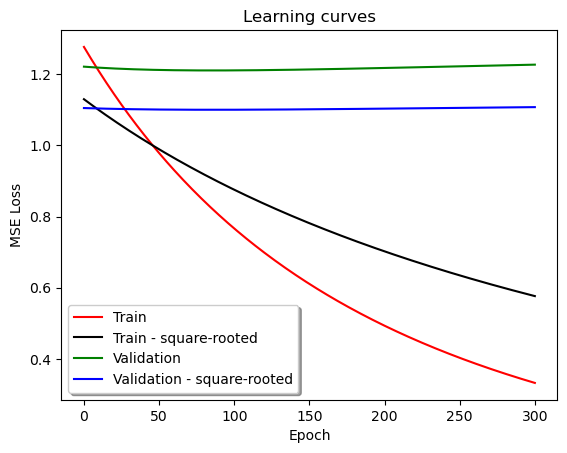

features: 100
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


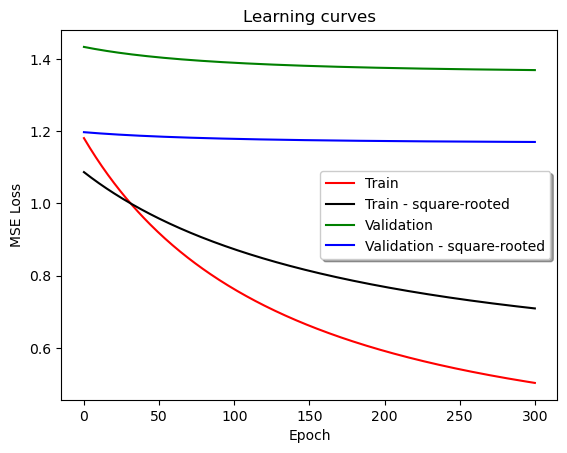

features: 100
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


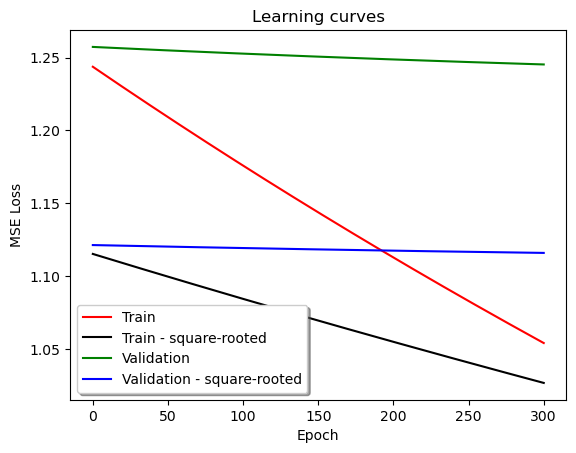

features: 100
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


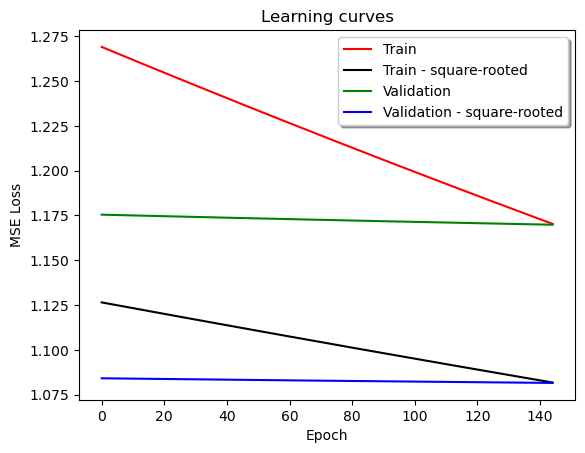

features: 100
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


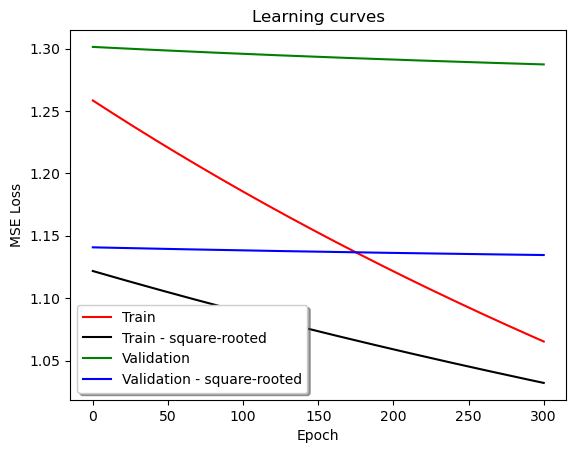

features: 100
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


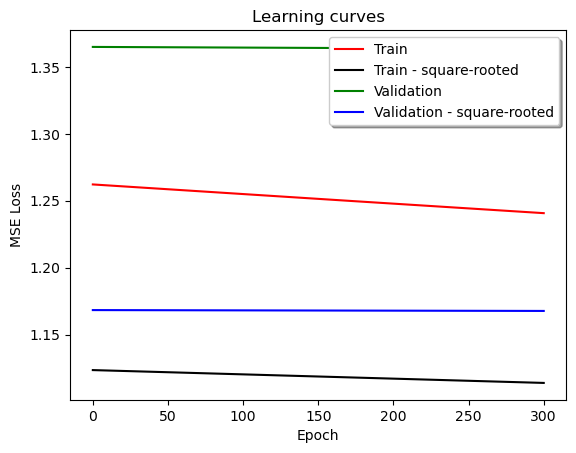

features: 100
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


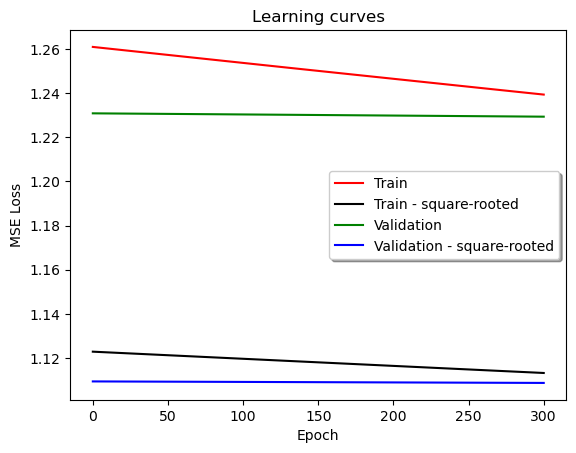

features: 100
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


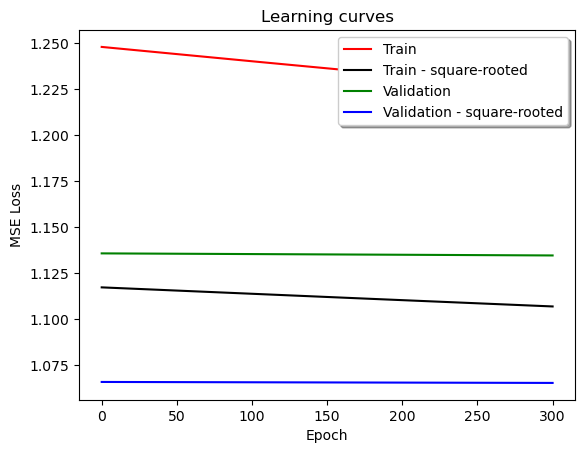

features: 200
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


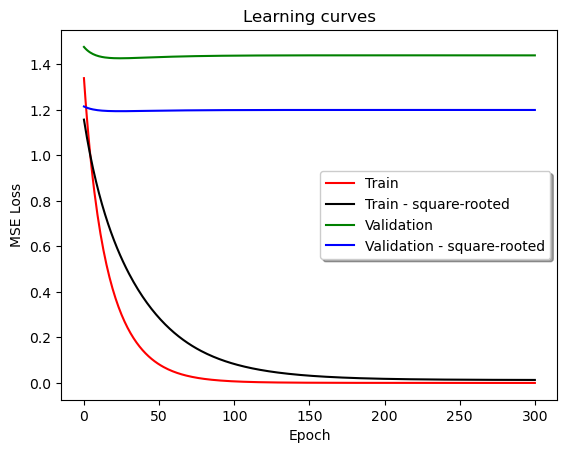

features: 200
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


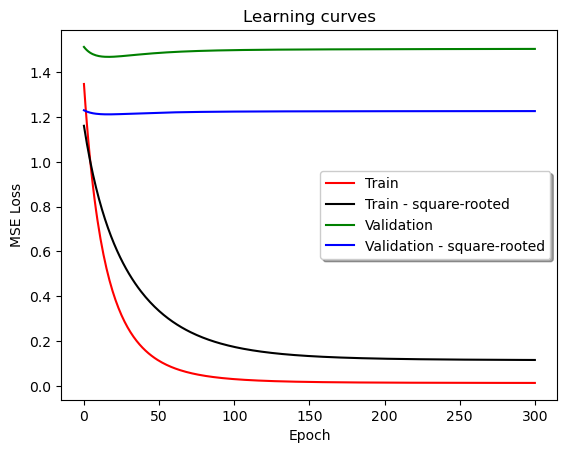

features: 200
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


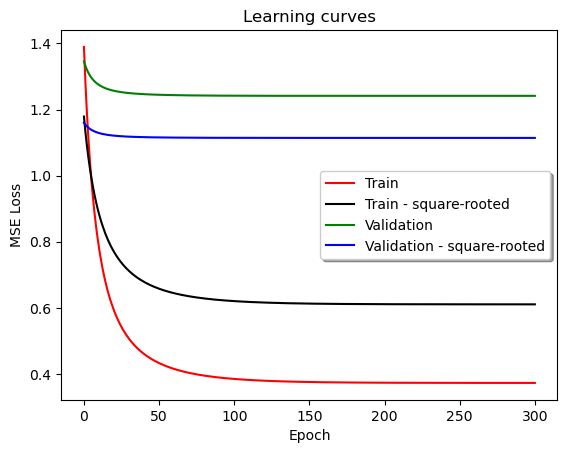

features: 200
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


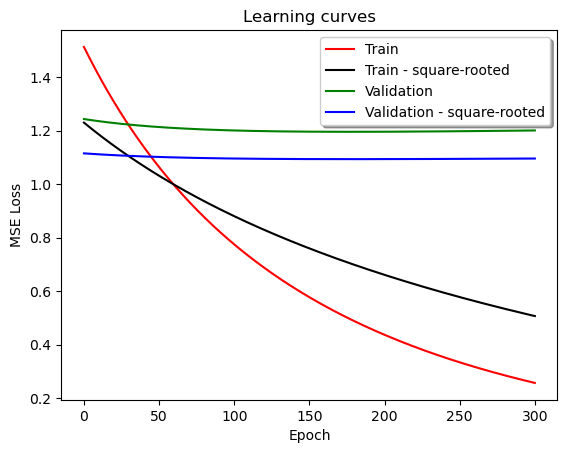

features: 200
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


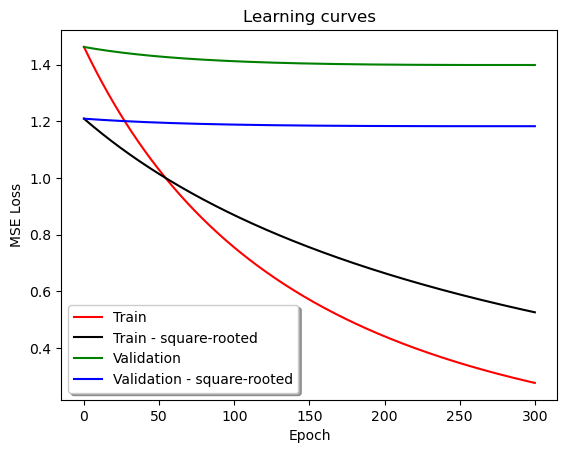

features: 200
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


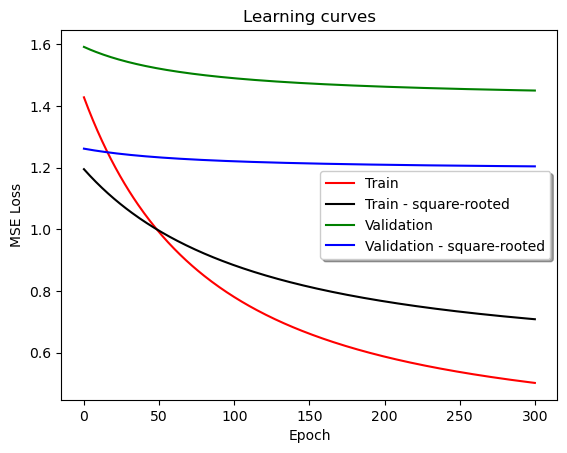

features: 200
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


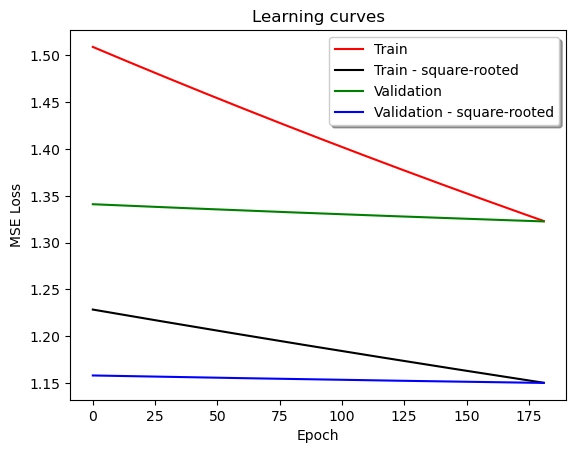

features: 200
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


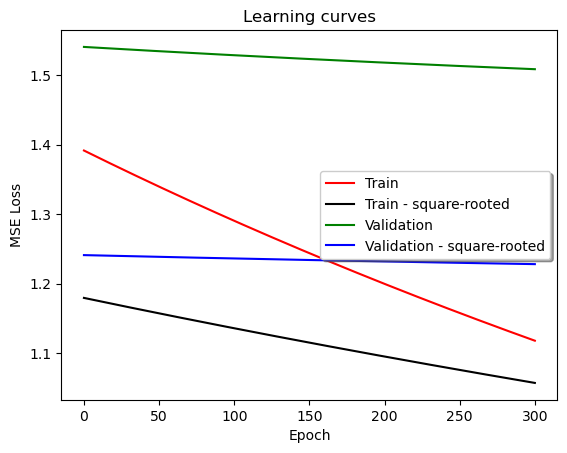

features: 200
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


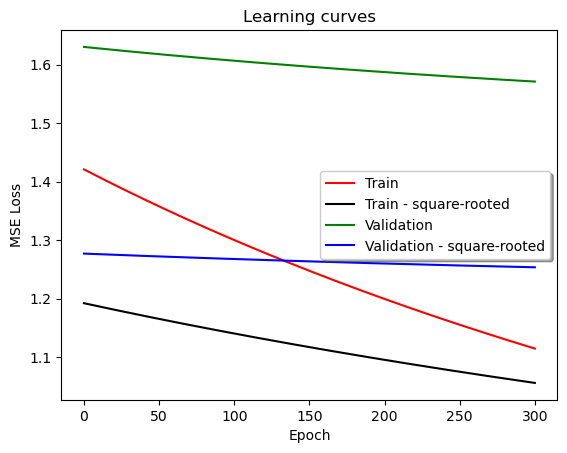

features: 200
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


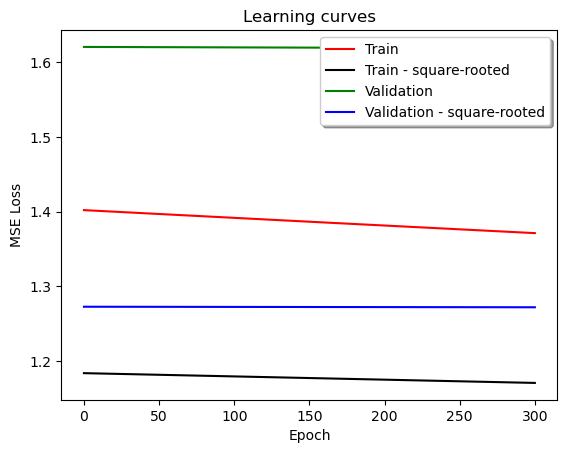

features: 200
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


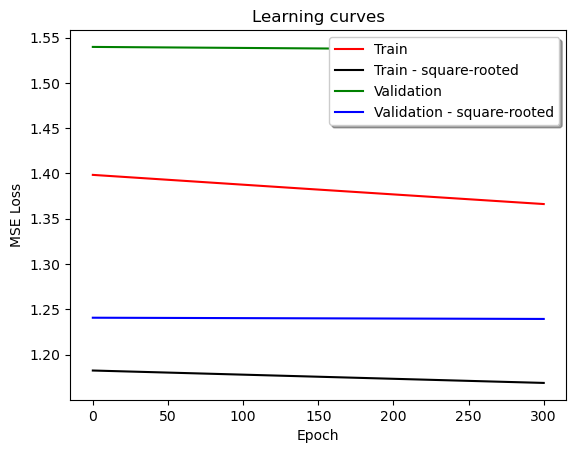

features: 200
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


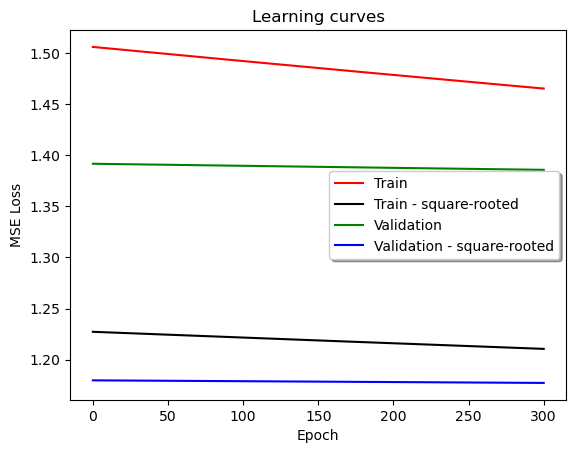

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


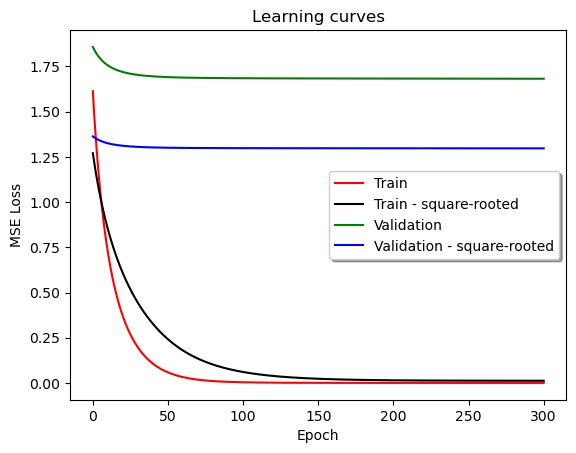

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


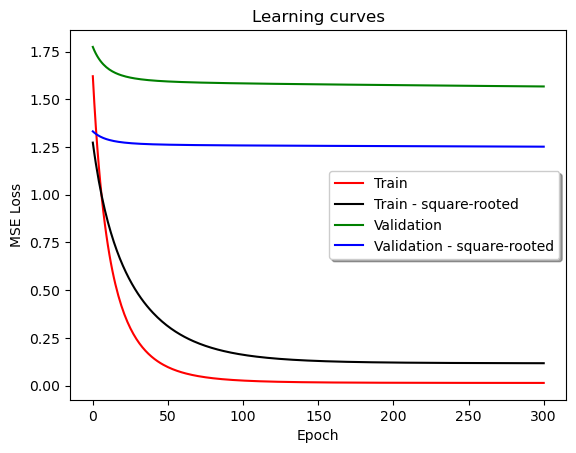

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


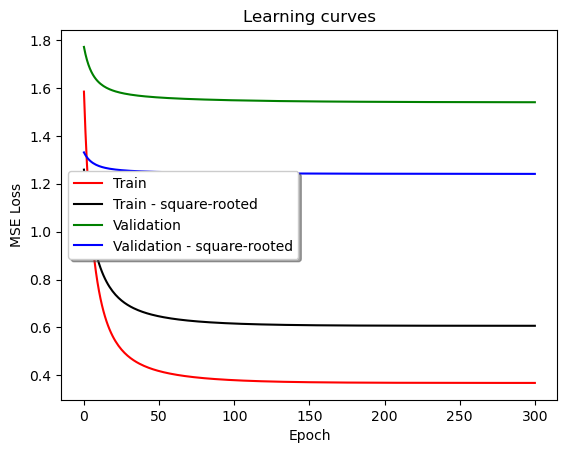

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


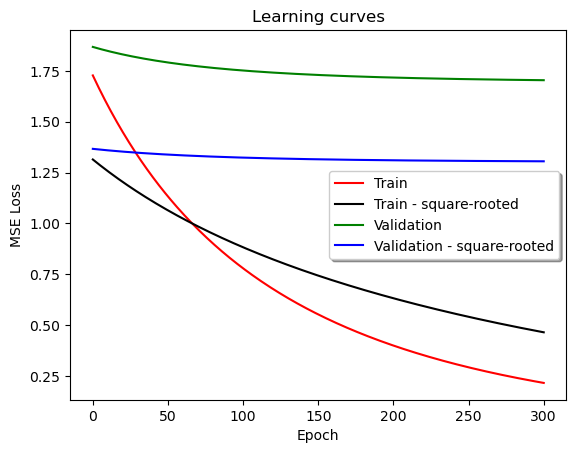

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


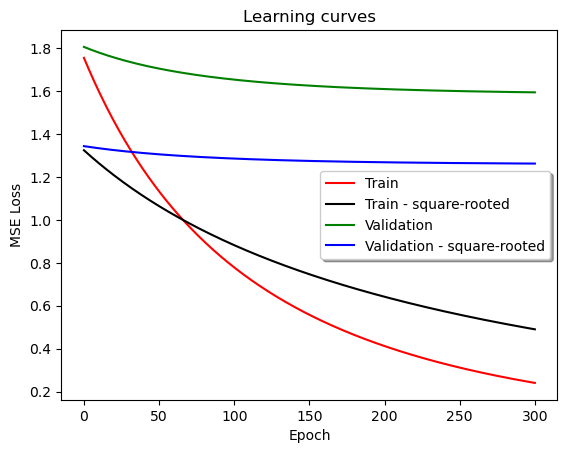

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


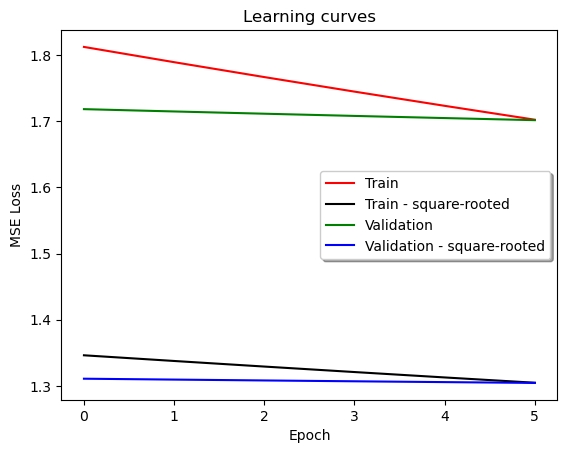

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


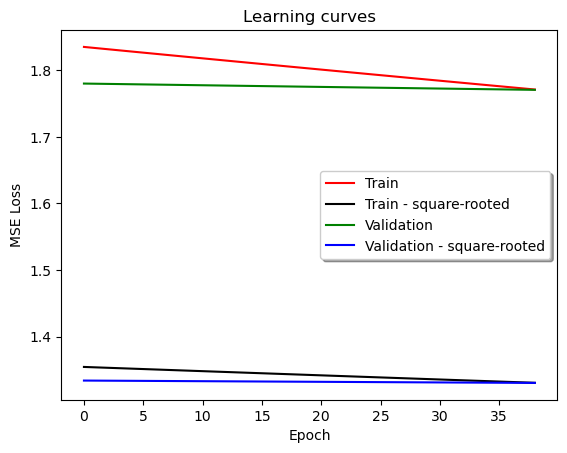

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


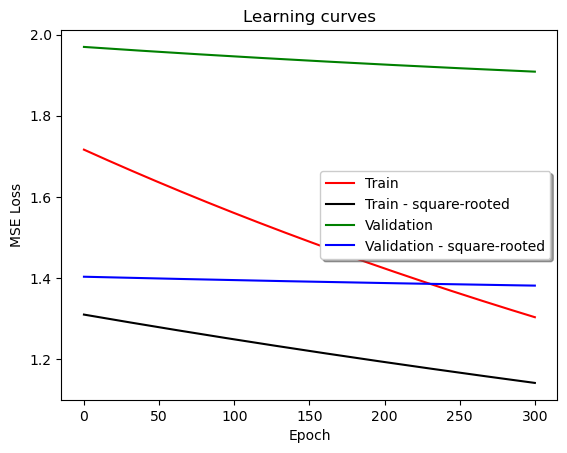

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


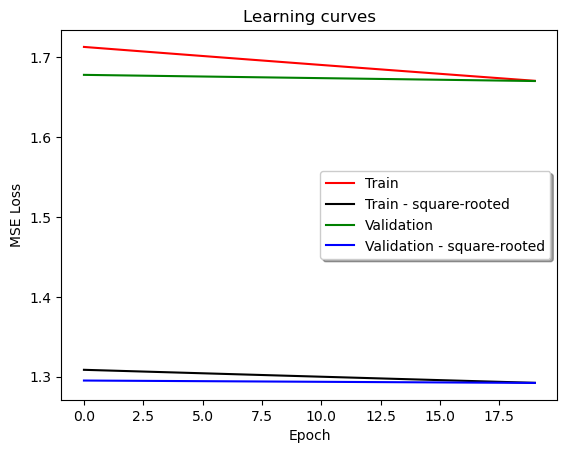

features: 300
learning rate: 1e-05
Epochs: 301
weight decay: 0.02
stopping: 0.001

RMSE
0.0


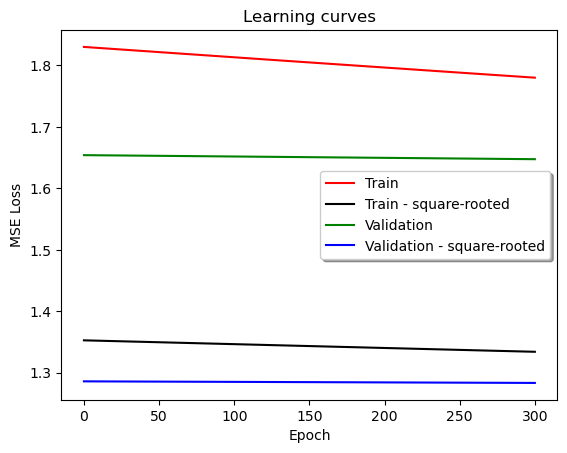

features: 300
learning rate: 1e-05
Epochs: 301
weight decay: 0.2
stopping: 0.001

RMSE
0.0


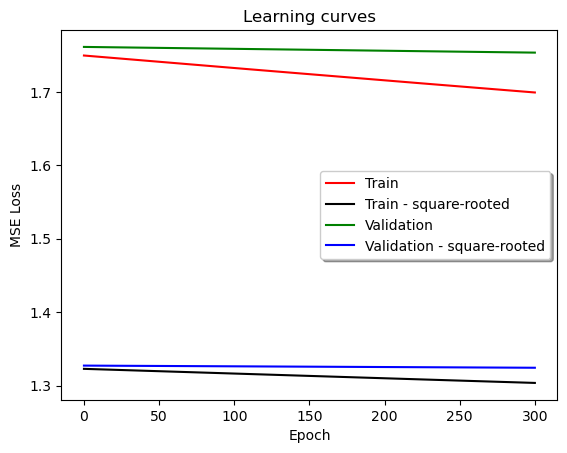

features: 300
learning rate: 1e-05
Epochs: 301
weight decay: 2
stopping: 0.001

RMSE
0.0


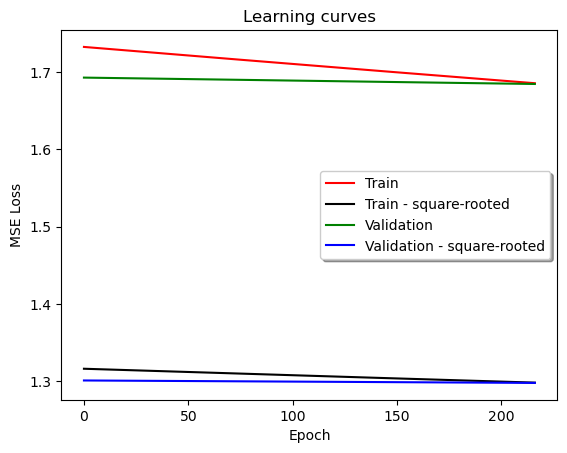

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


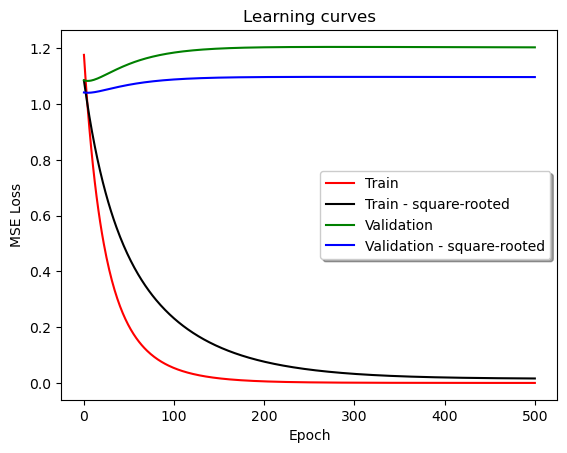

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


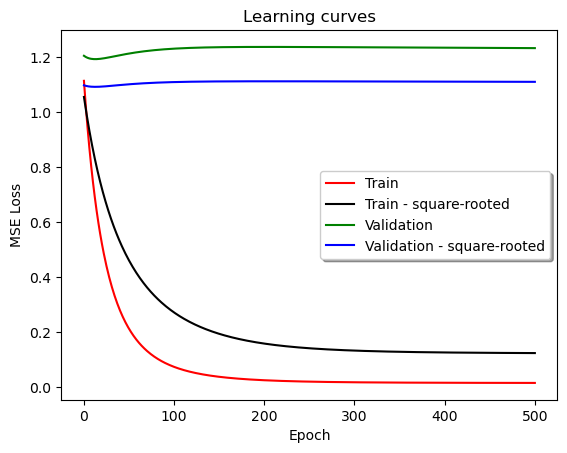

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


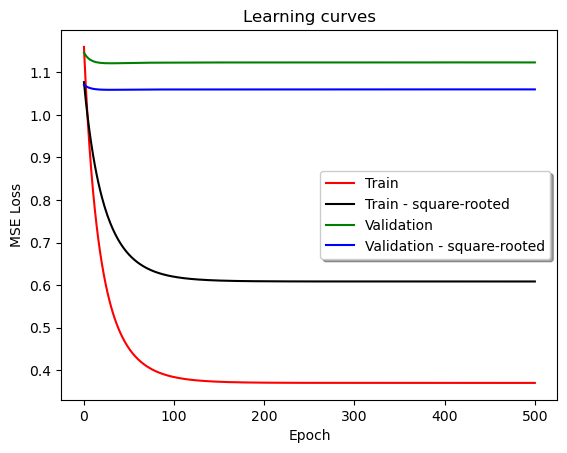

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


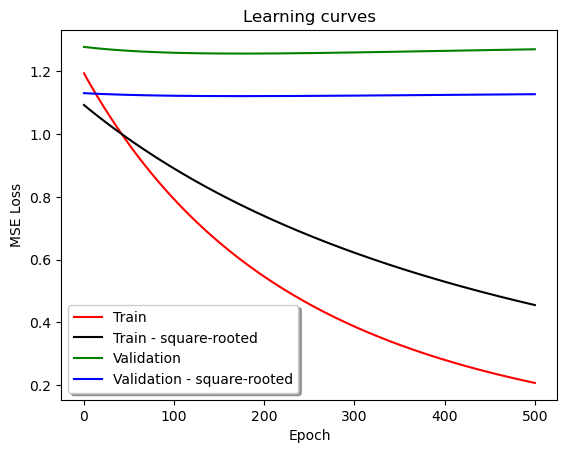

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


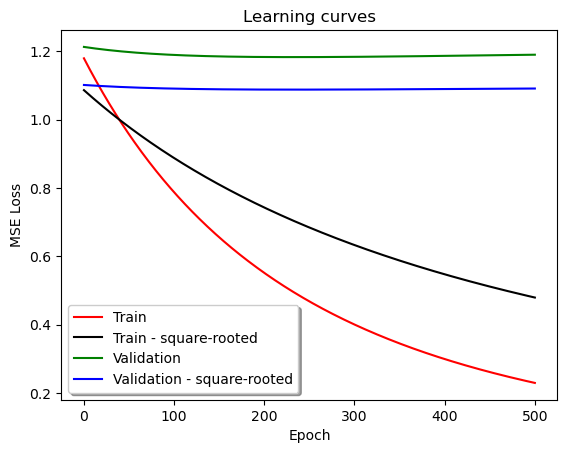

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


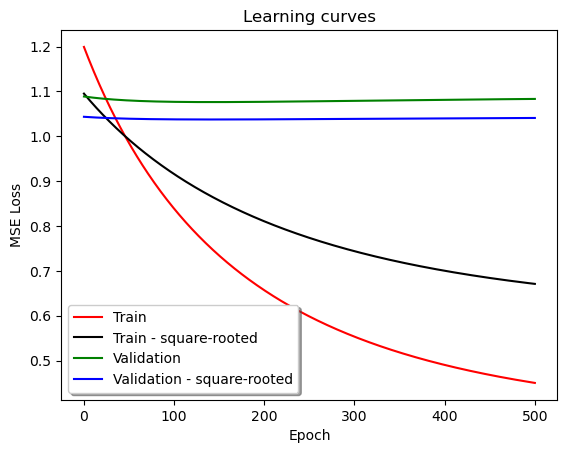

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


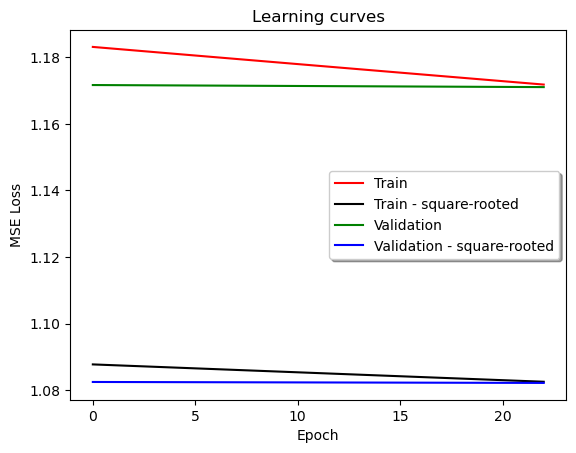

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


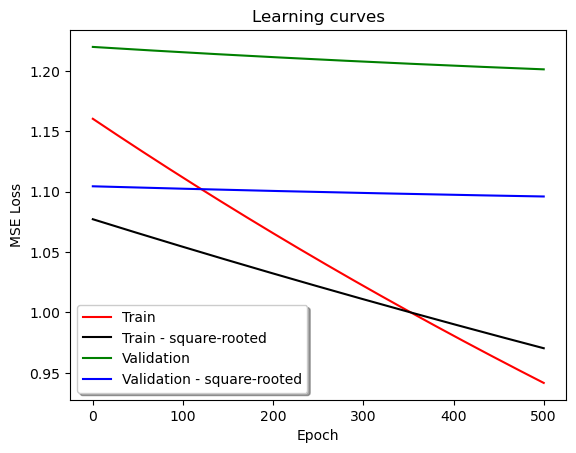

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


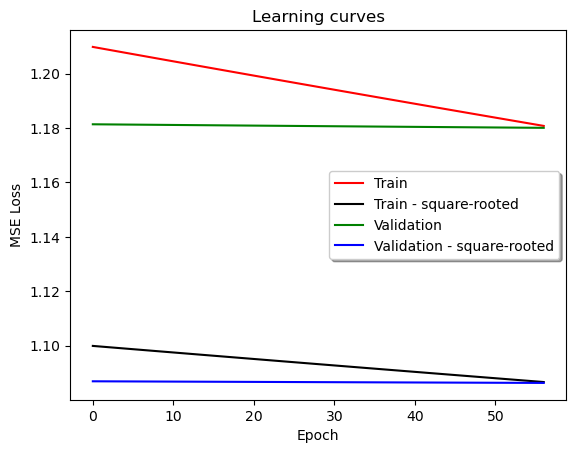

features: 3
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


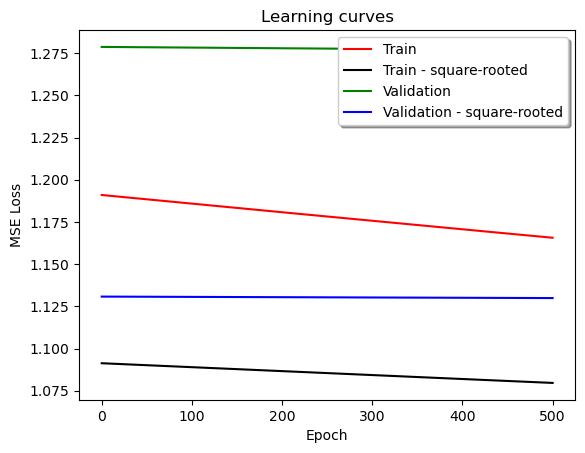

features: 3
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


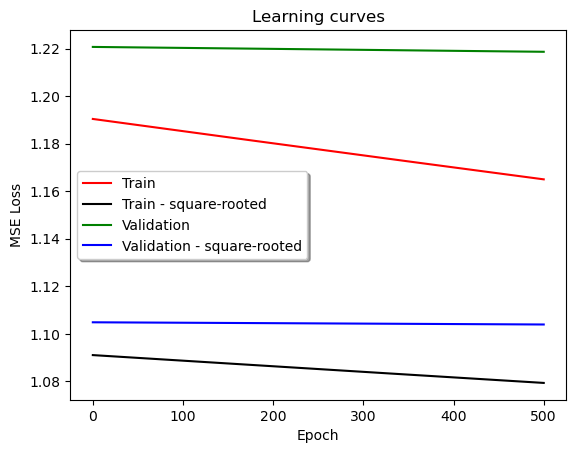

features: 3
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


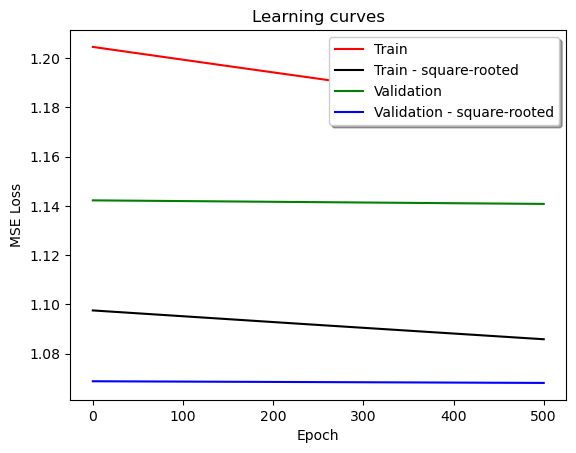

features: 5
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


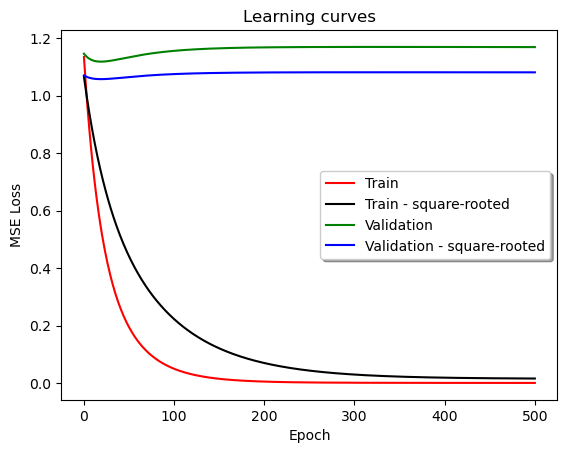

features: 5
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


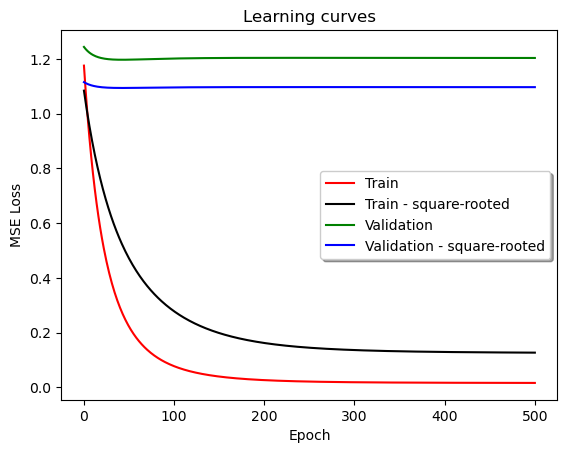

features: 5
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


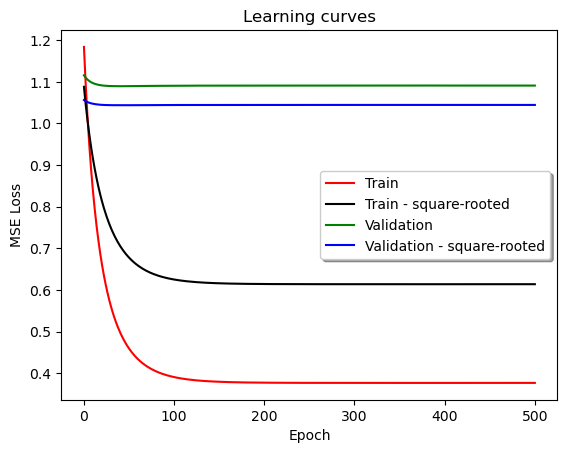

features: 5
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


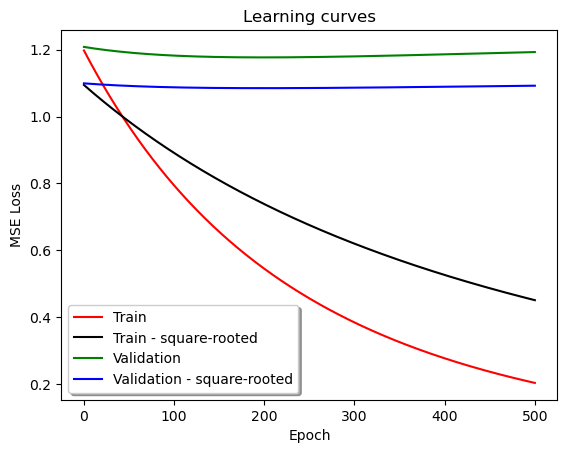

features: 5
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


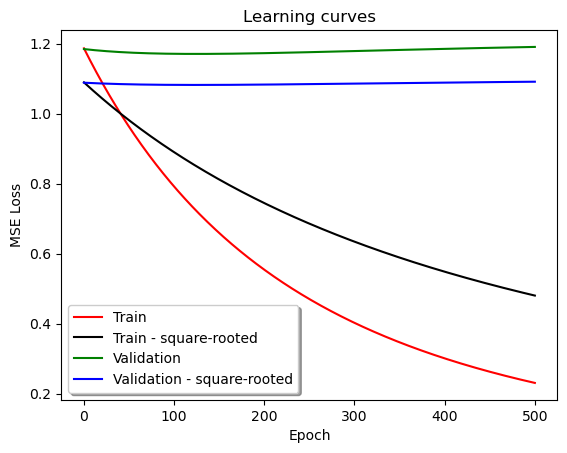

features: 5
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


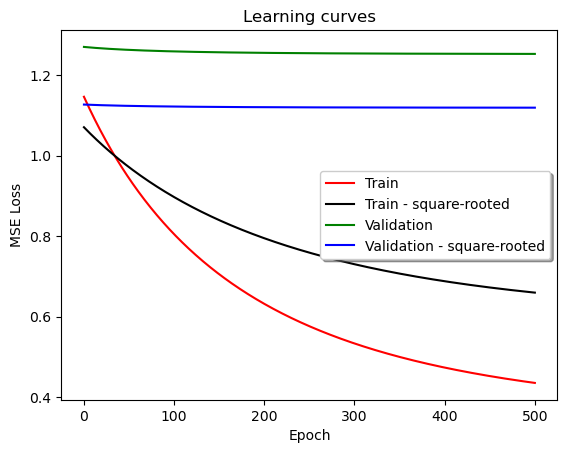

features: 5
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


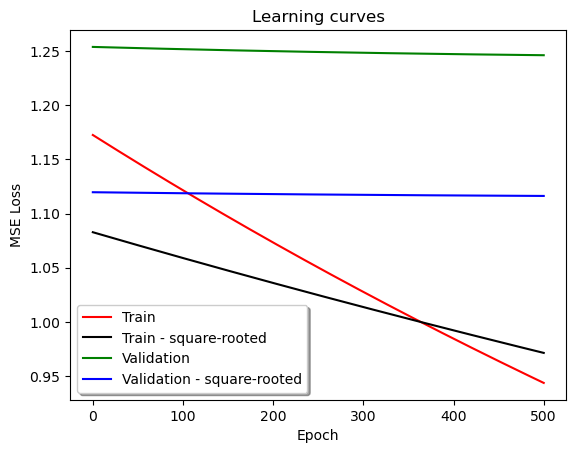

features: 5
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


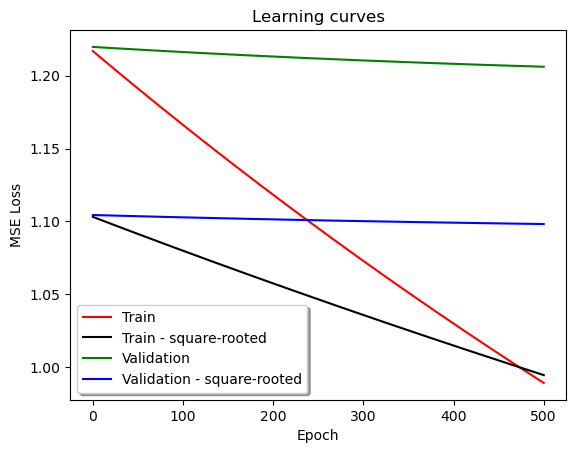

features: 5
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


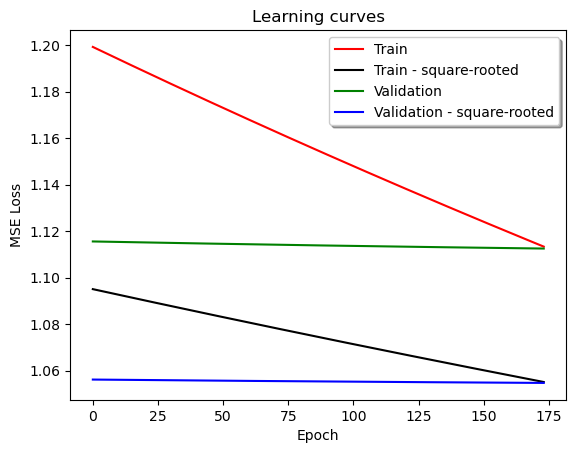

features: 5
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


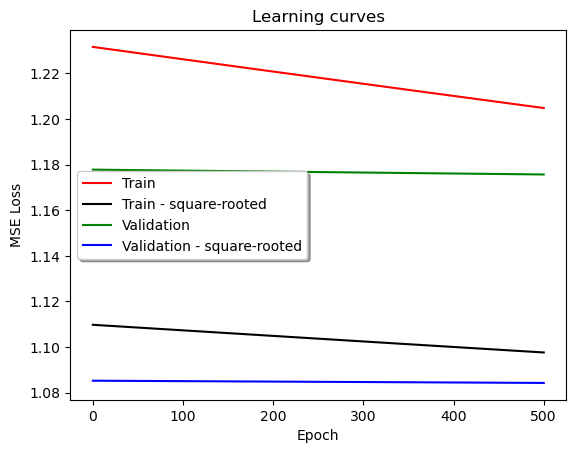

features: 5
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


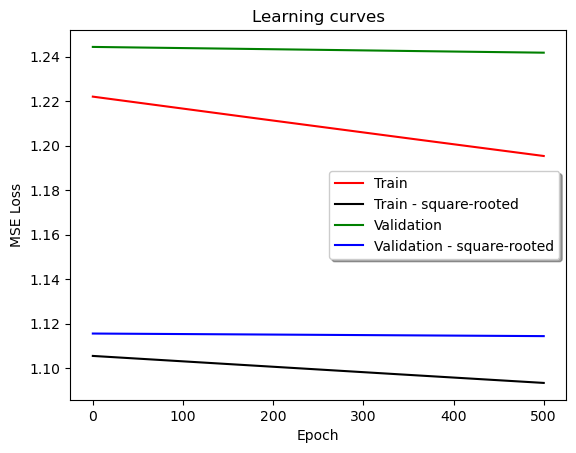

features: 5
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


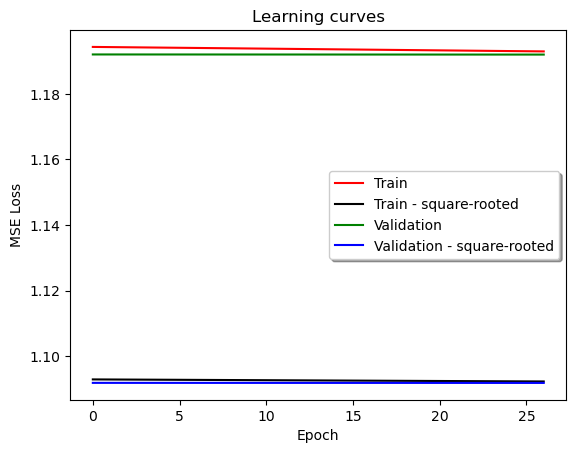

features: 10
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


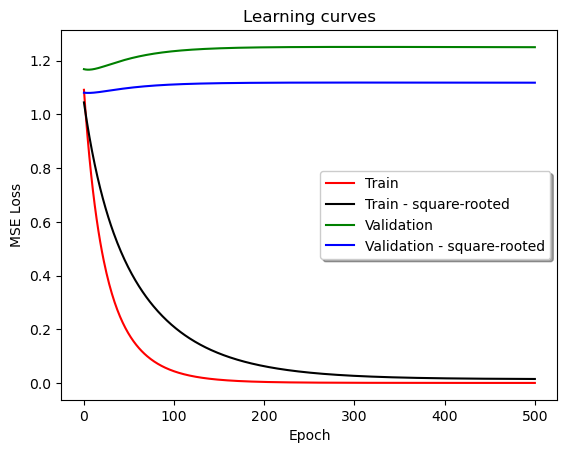

features: 10
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


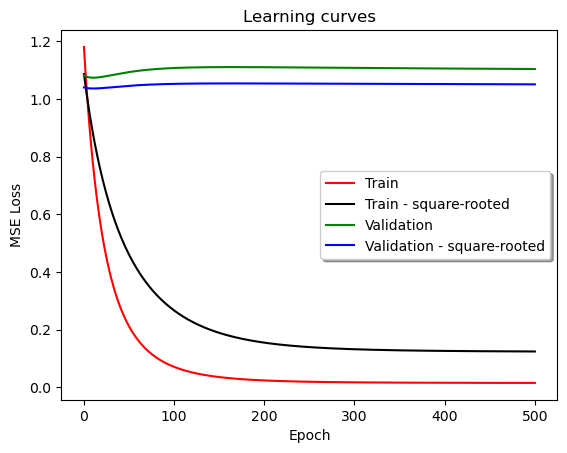

features: 10
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


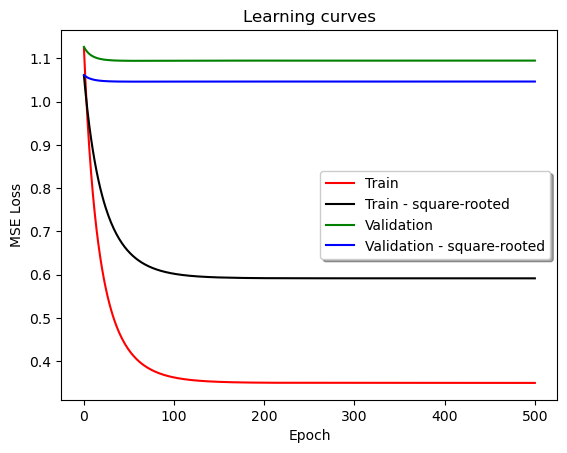

features: 10
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


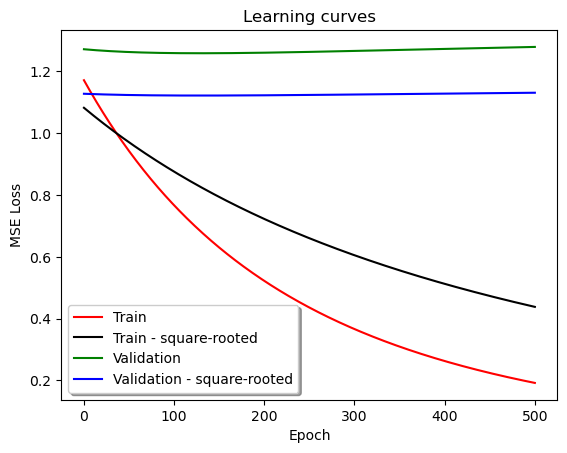

features: 10
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


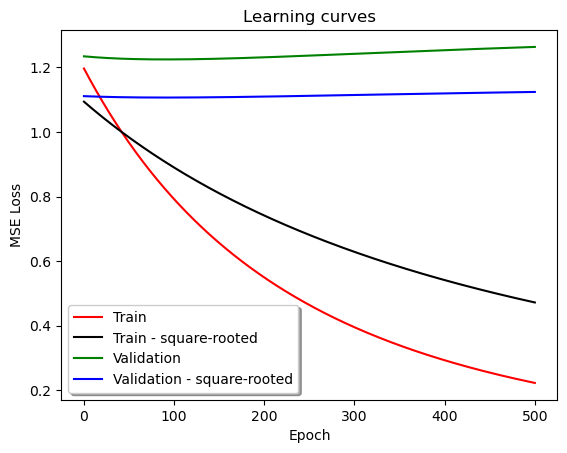

features: 10
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


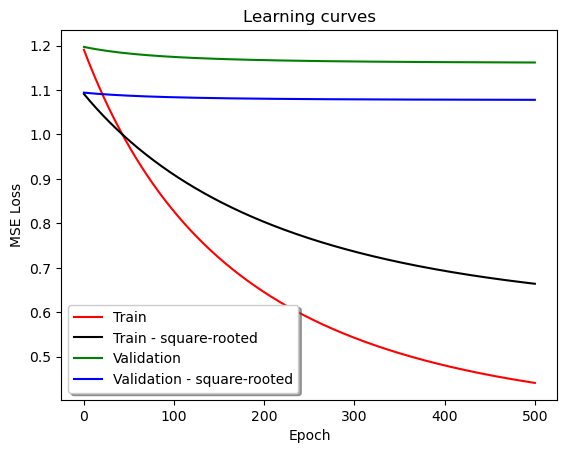

features: 10
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


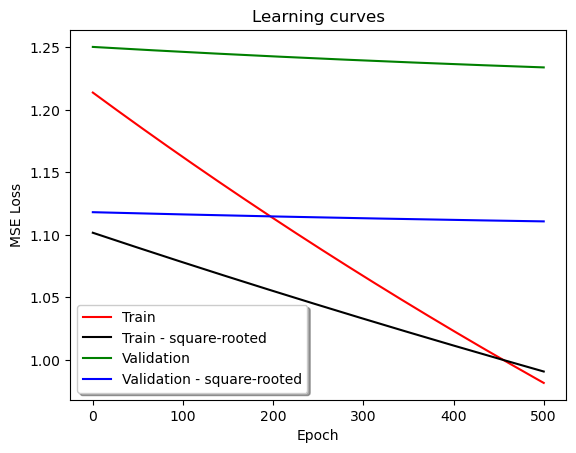

features: 10
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


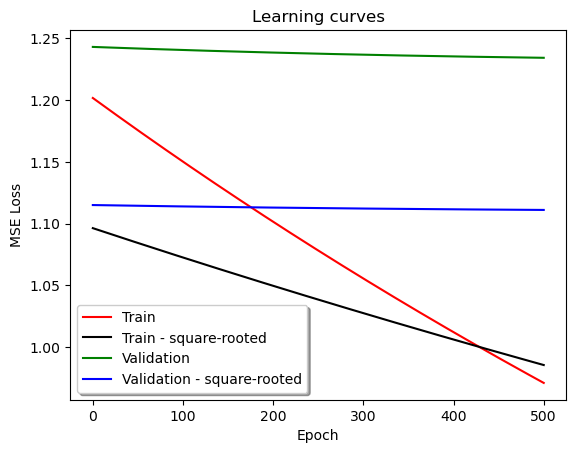

features: 10
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


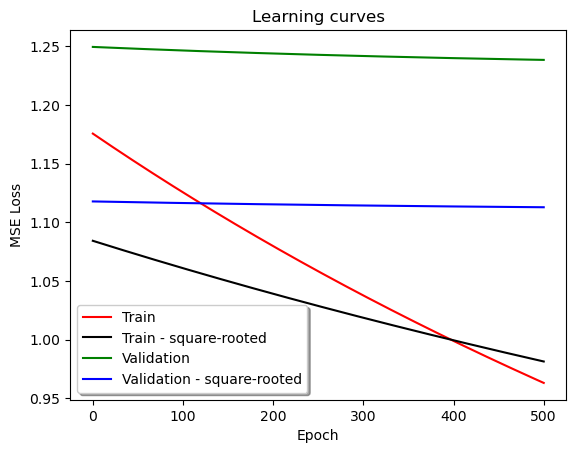

features: 10
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


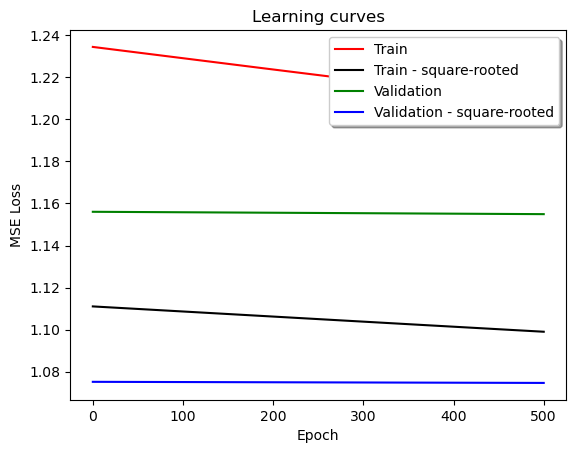

features: 10
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


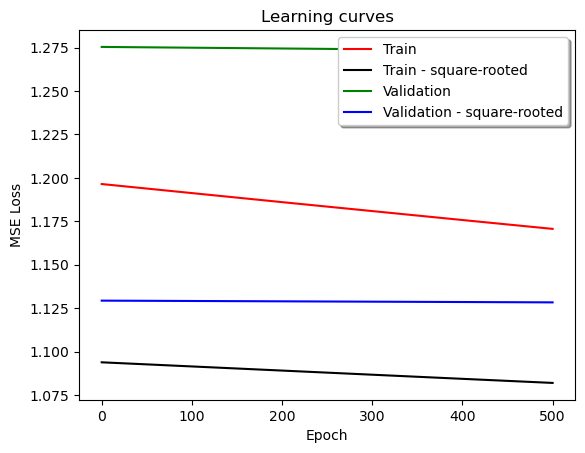

features: 10
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


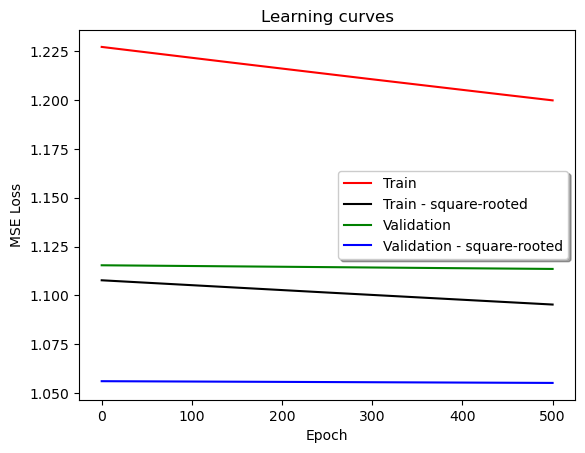

features: 100
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


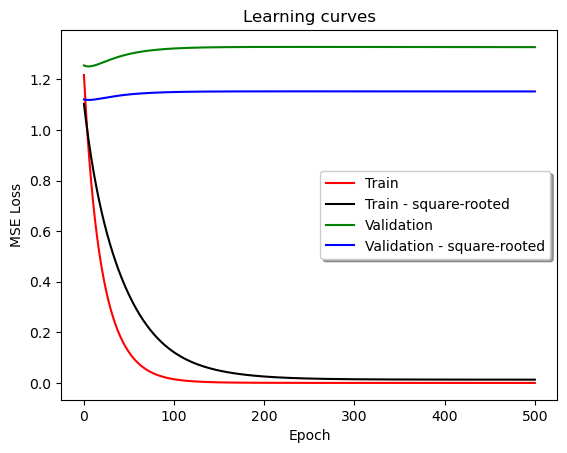

features: 100
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


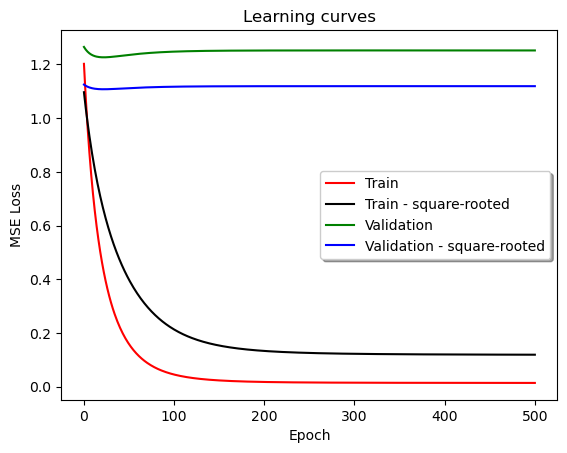

features: 100
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


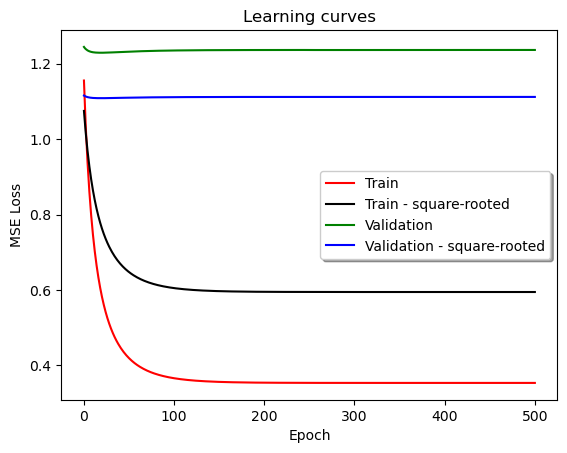

features: 100
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


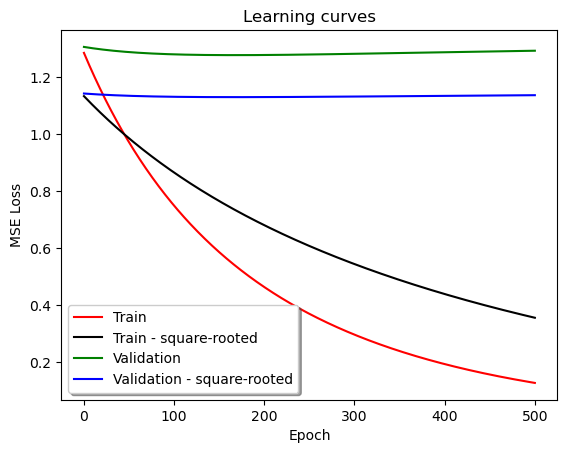

features: 100
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


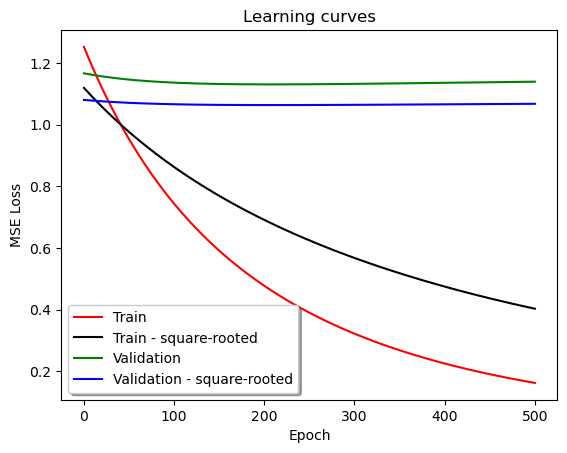

features: 100
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


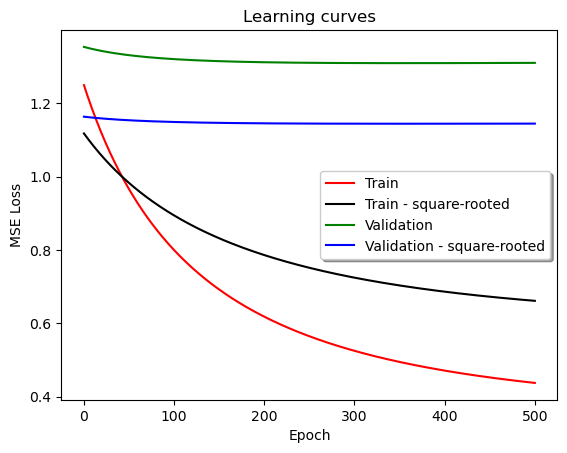

features: 100
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


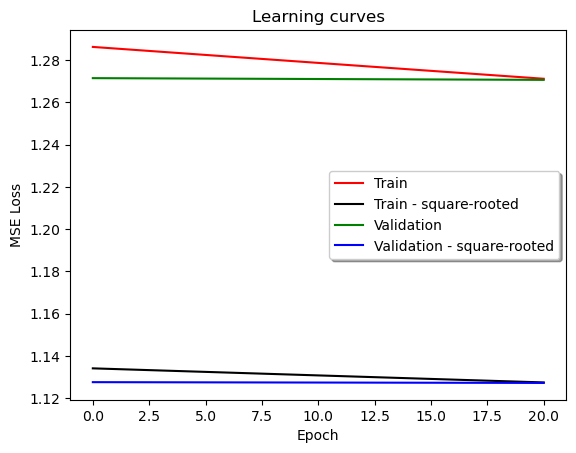

features: 100
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


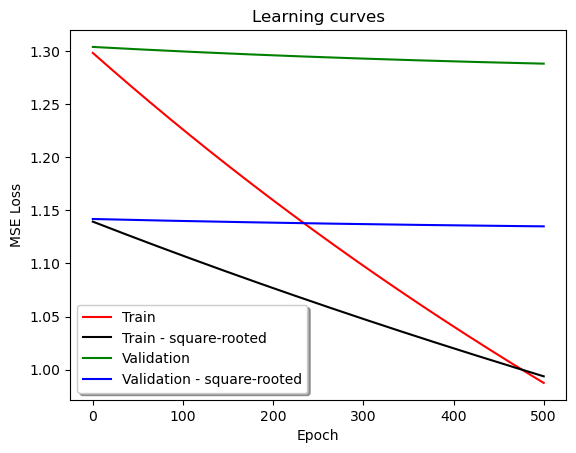

features: 100
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


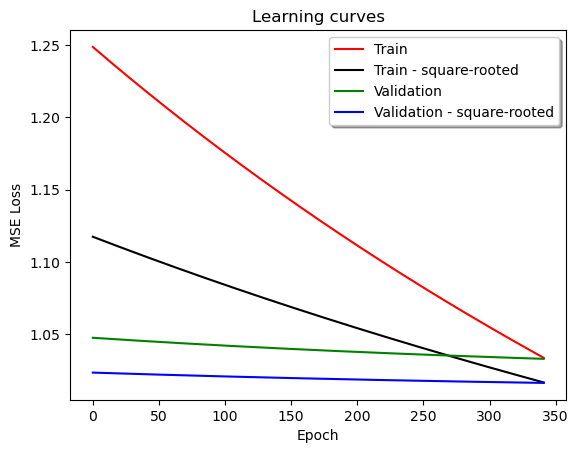

features: 100
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


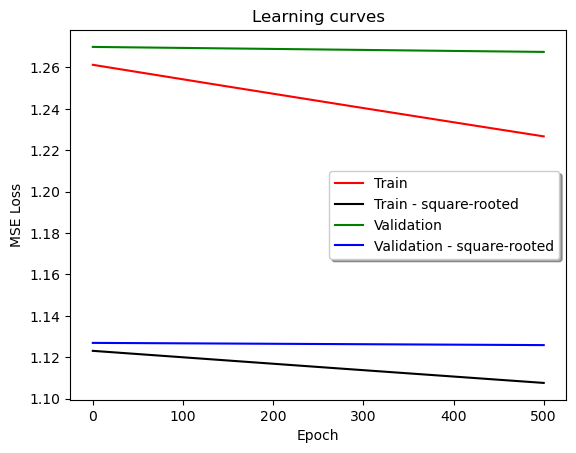

features: 100
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


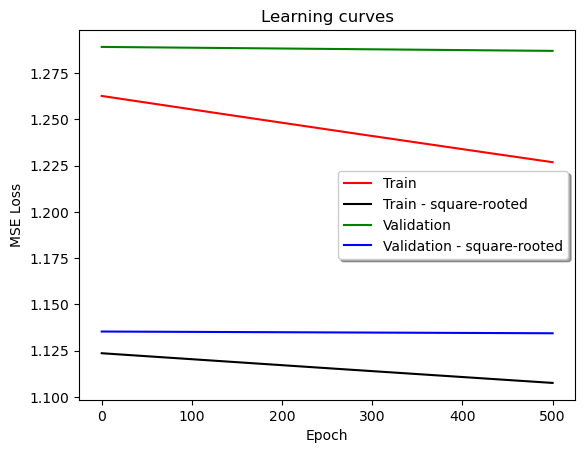

features: 100
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


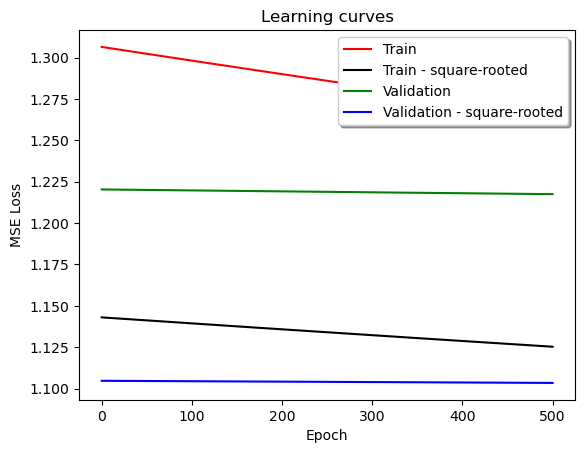

features: 200
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


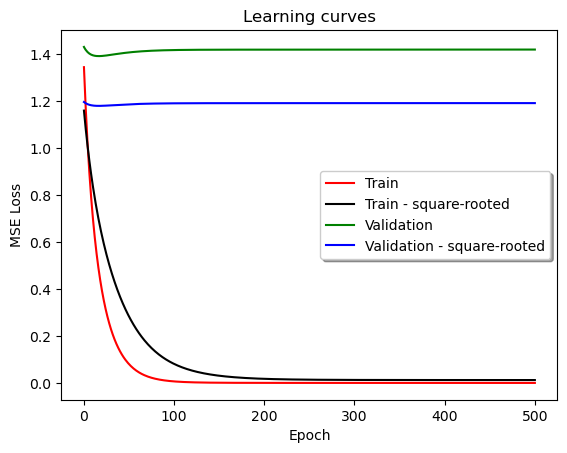

features: 200
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


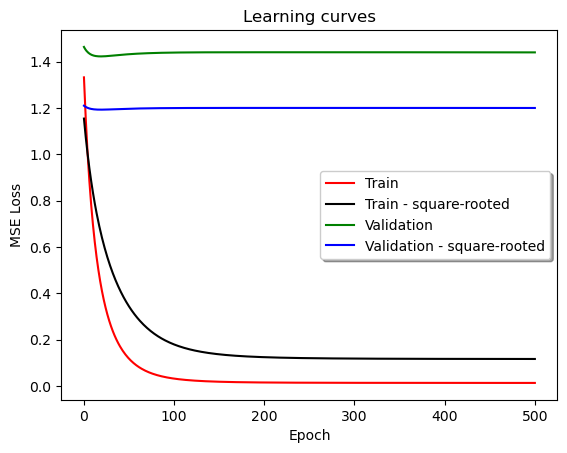

features: 200
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


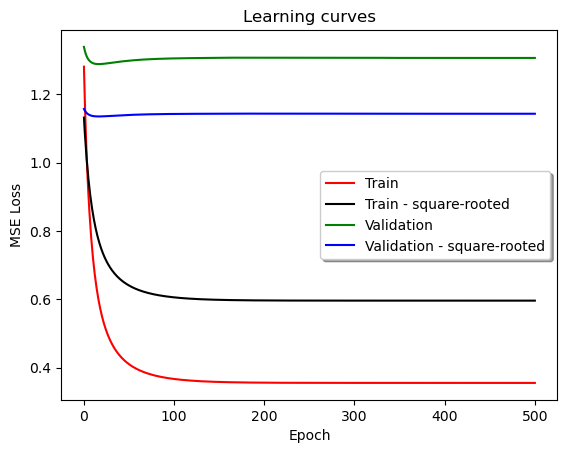

features: 200
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


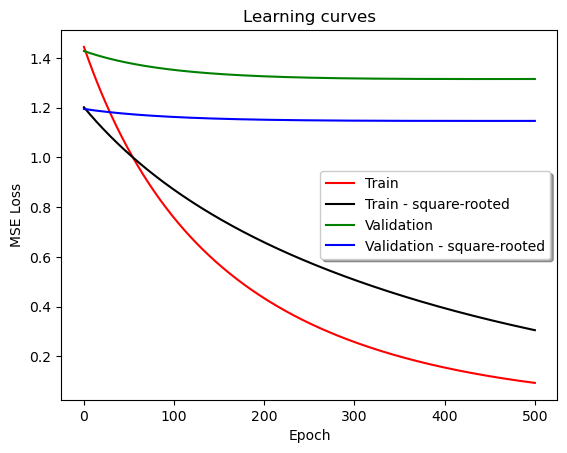

features: 200
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


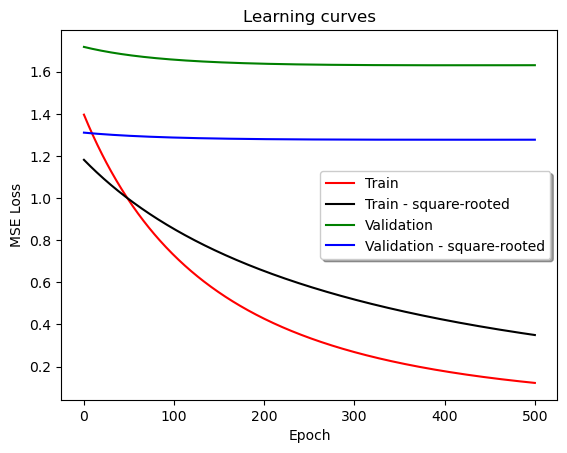

features: 200
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


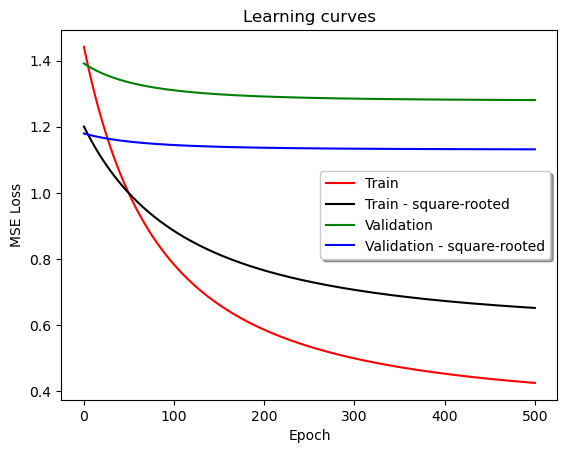

features: 200
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


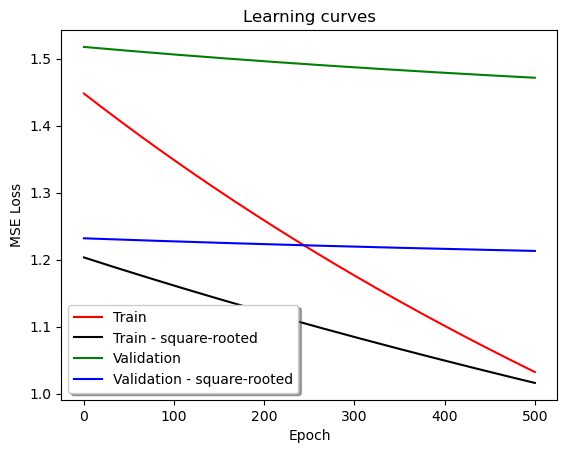

features: 200
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


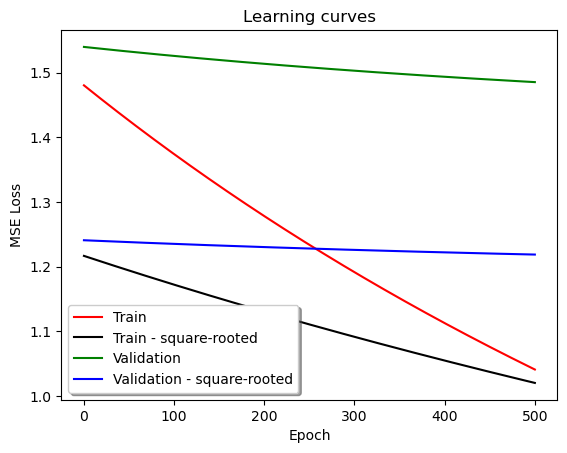

features: 200
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


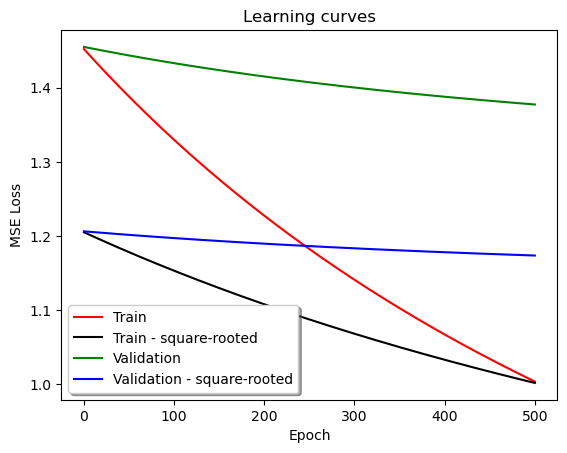

features: 200
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


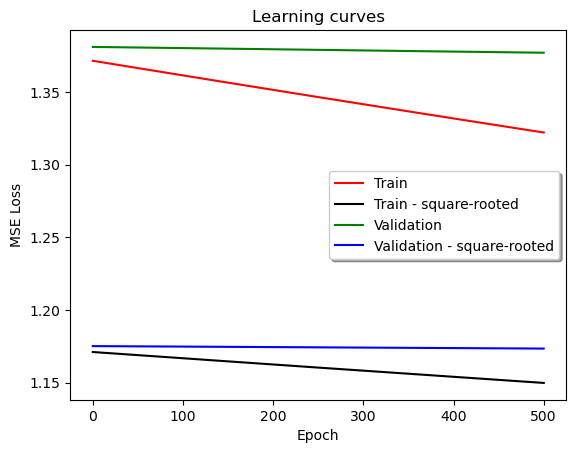

features: 200
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


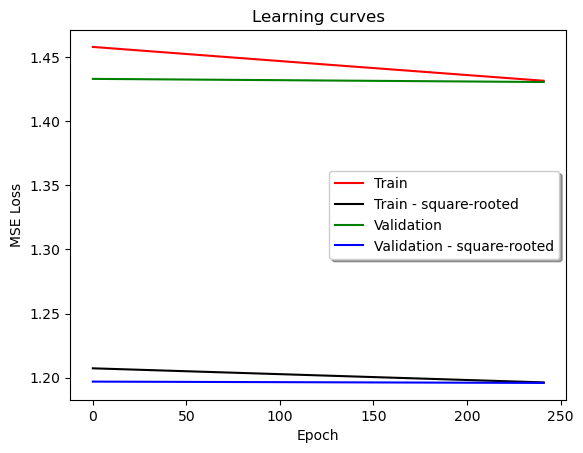

features: 200
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


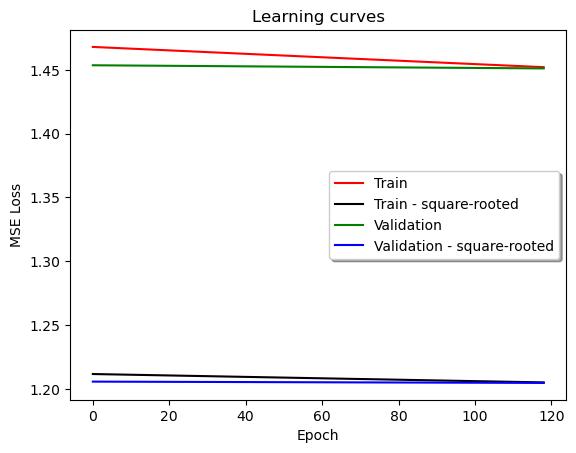

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


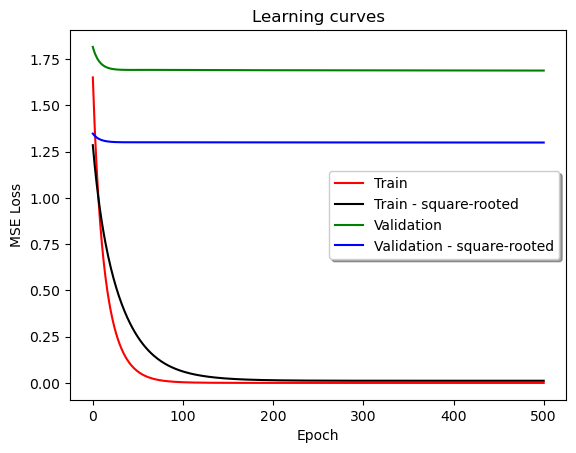

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


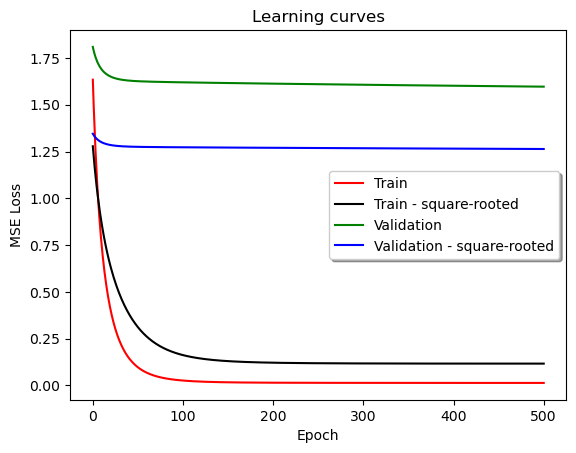

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


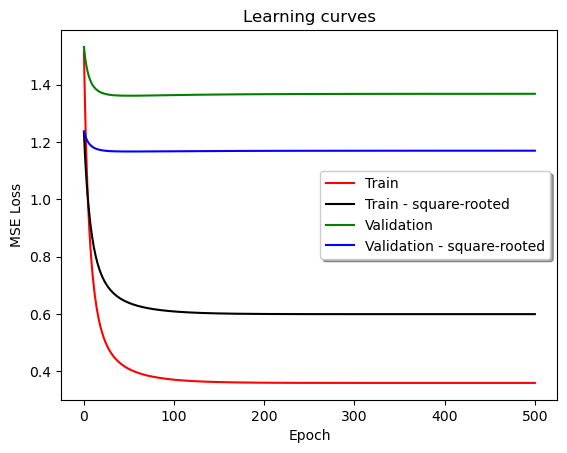

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


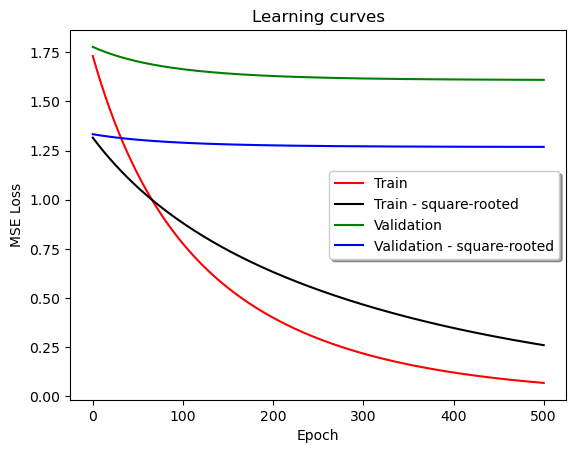

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


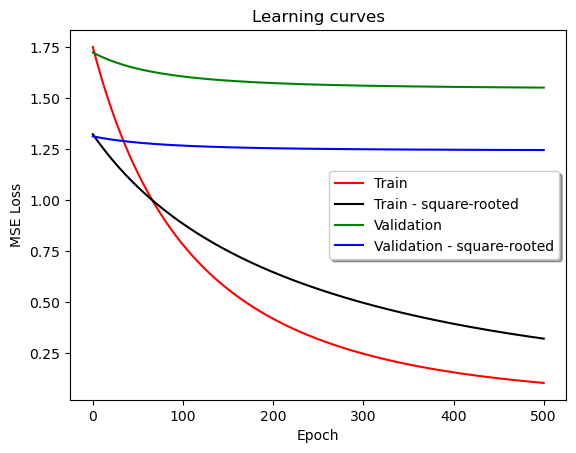

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


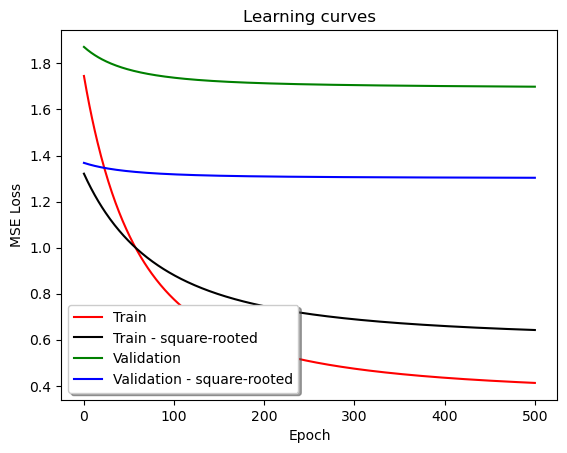

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


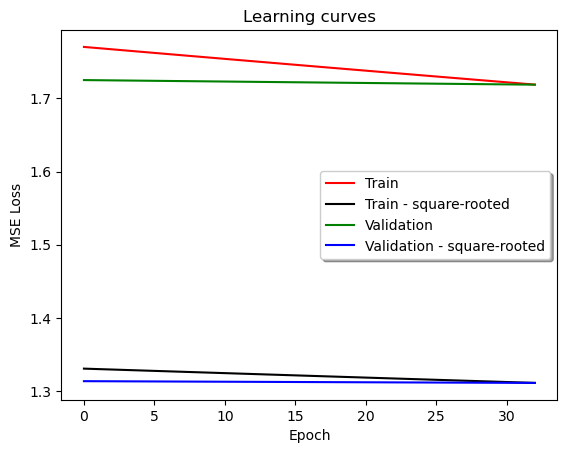

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


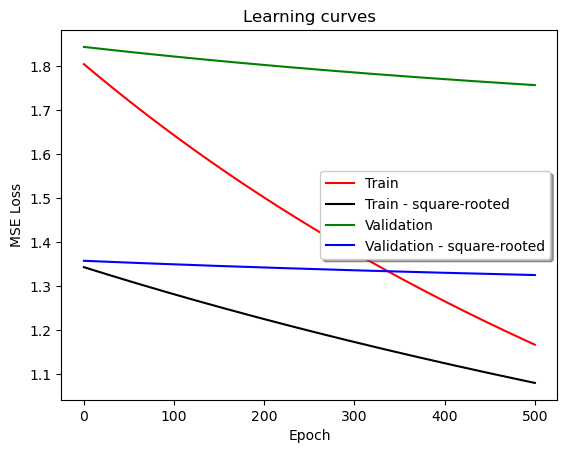

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


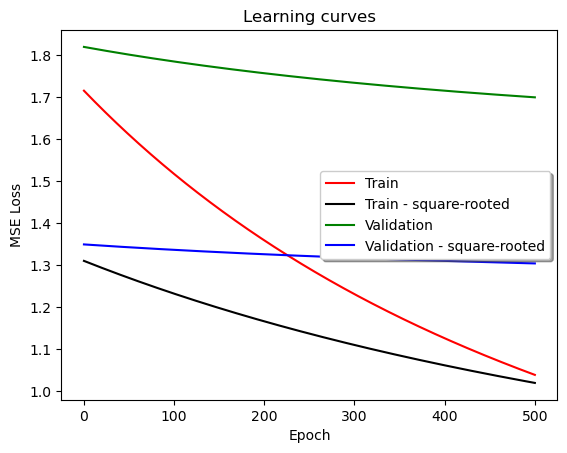

features: 300
learning rate: 1e-05
Epochs: 501
weight decay: 0.02
stopping: 0.001

RMSE
0.0


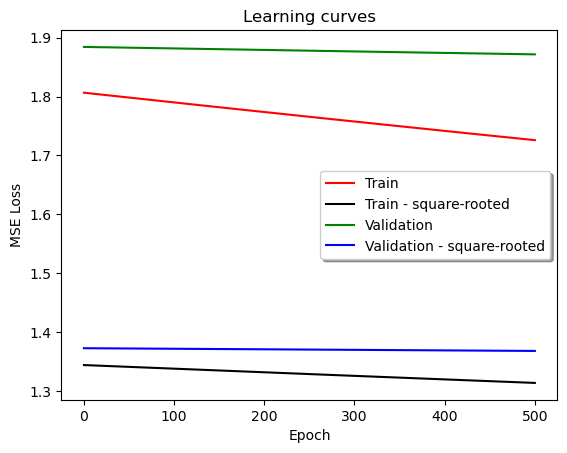

features: 300
learning rate: 1e-05
Epochs: 501
weight decay: 0.2
stopping: 0.001

RMSE
0.0


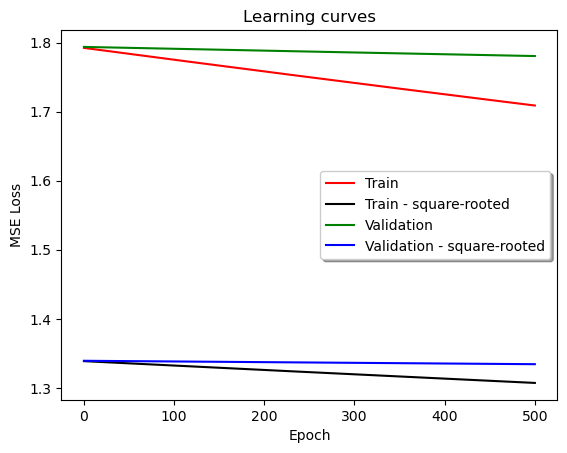

features: 300
learning rate: 1e-05
Epochs: 501
weight decay: 2
stopping: 0.001

RMSE
0.0


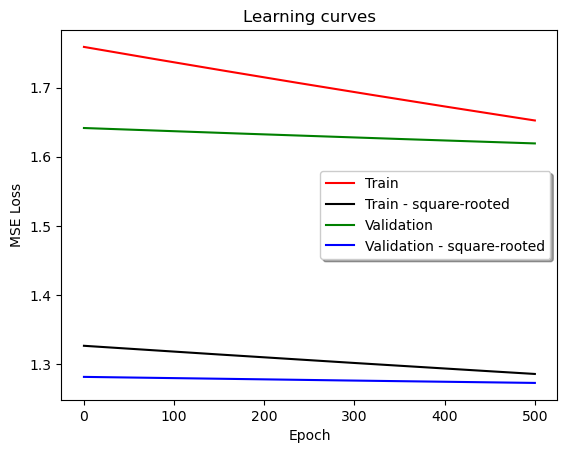

features: 3
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


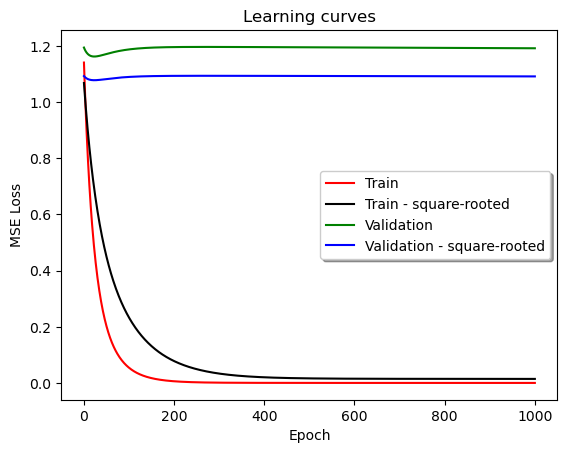

features: 3
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


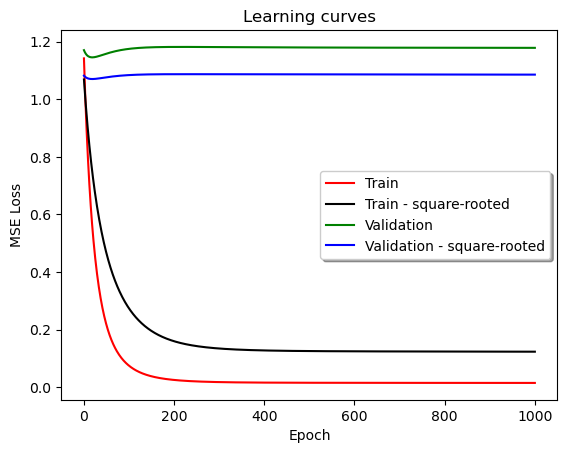

features: 3
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


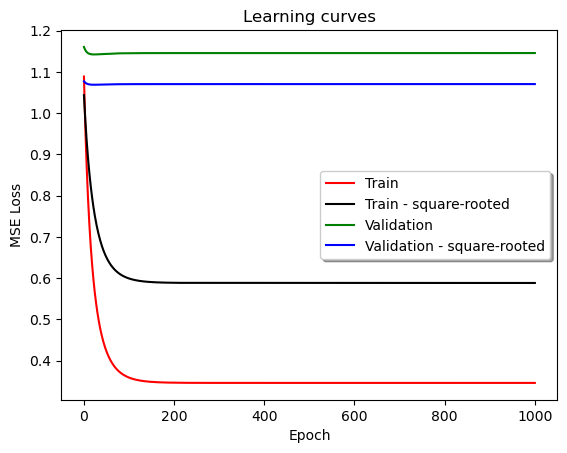

features: 3
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


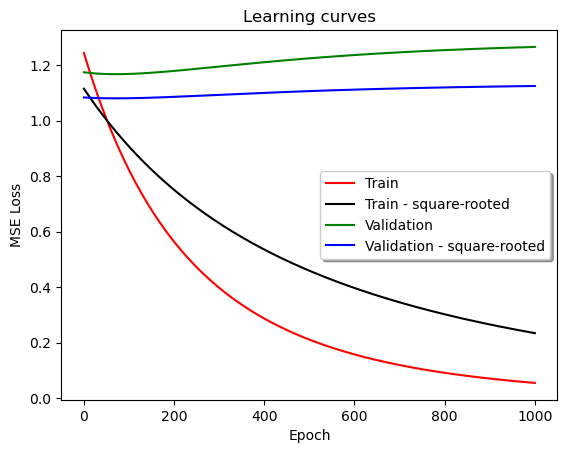

features: 3
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


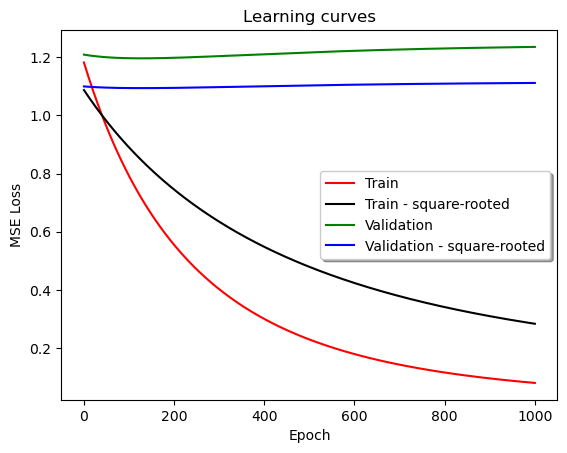

features: 3
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


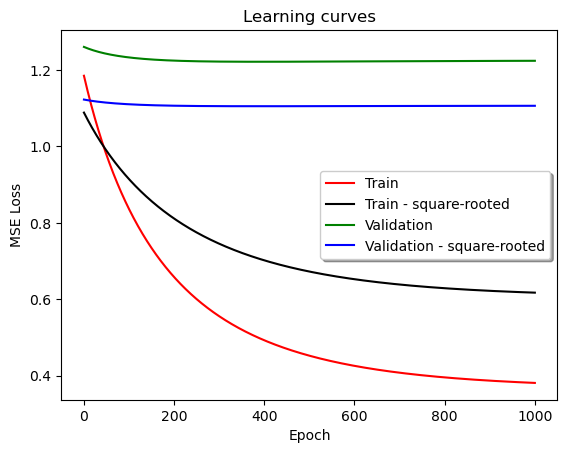

features: 3
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


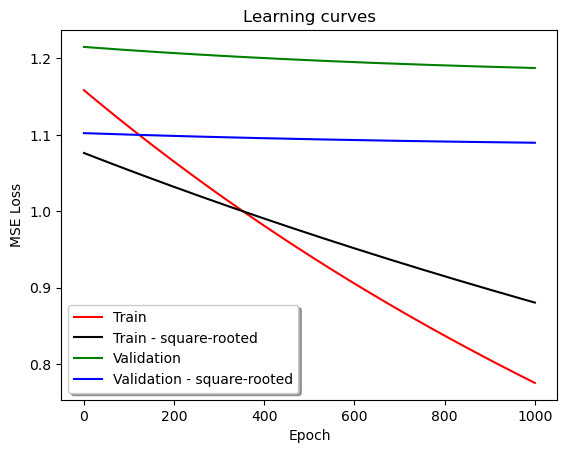

features: 3
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


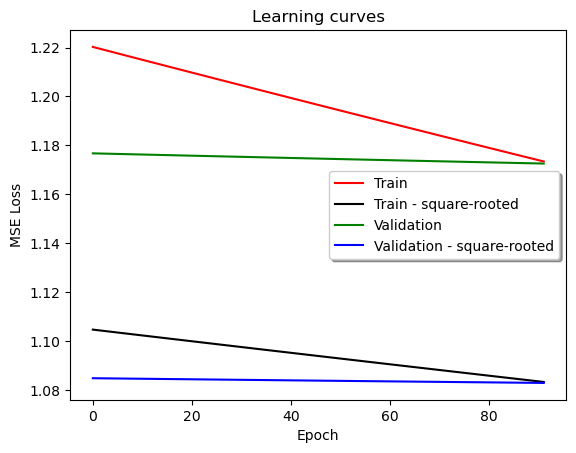

features: 3
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


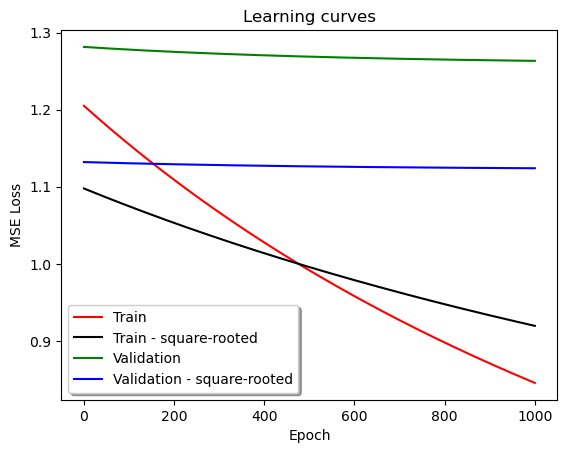

features: 3
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


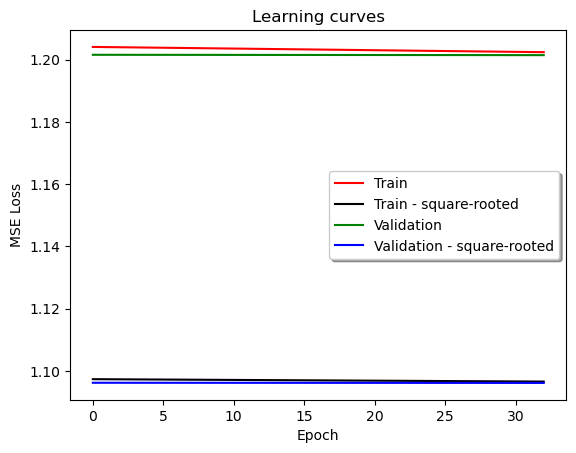

features: 3
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


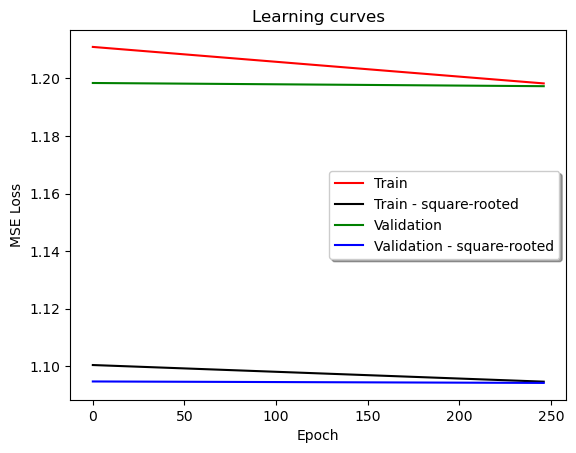

features: 3
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


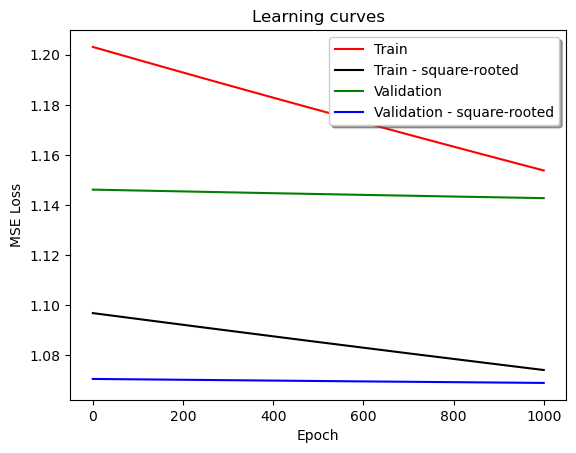

features: 5
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


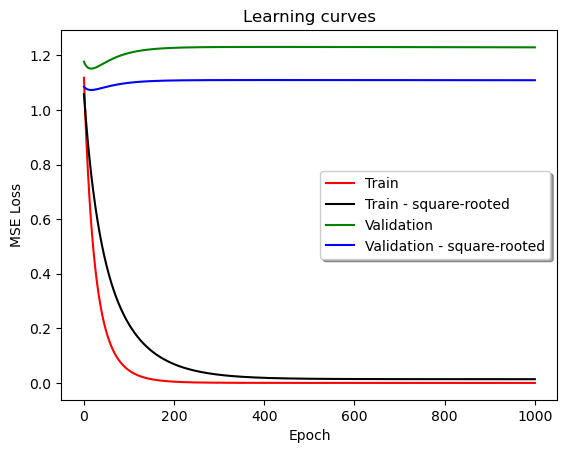

features: 5
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


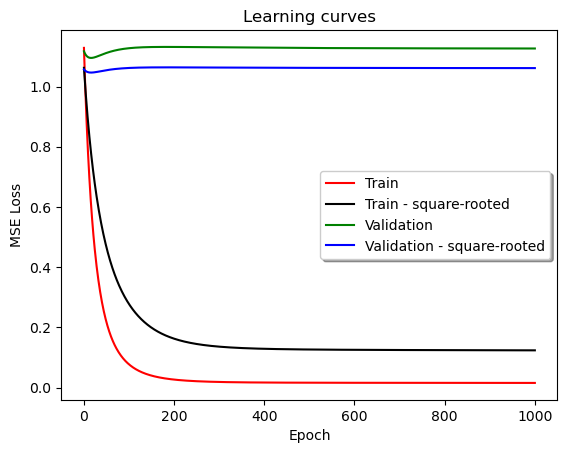

features: 5
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


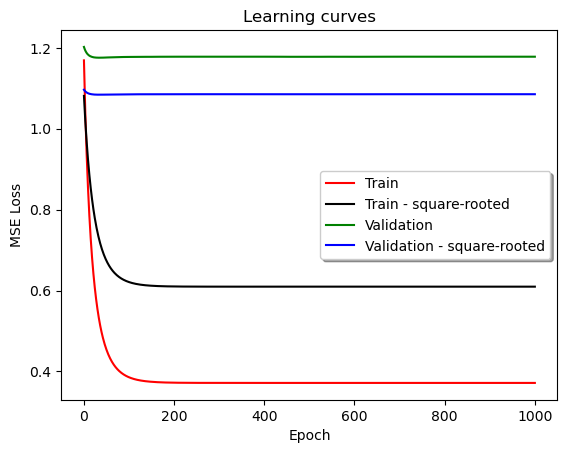

features: 5
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


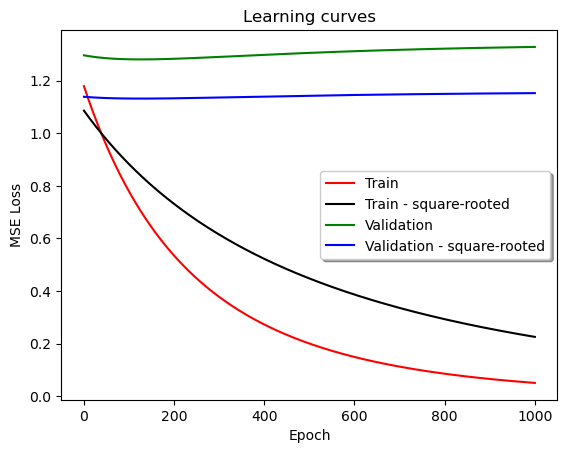

features: 5
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


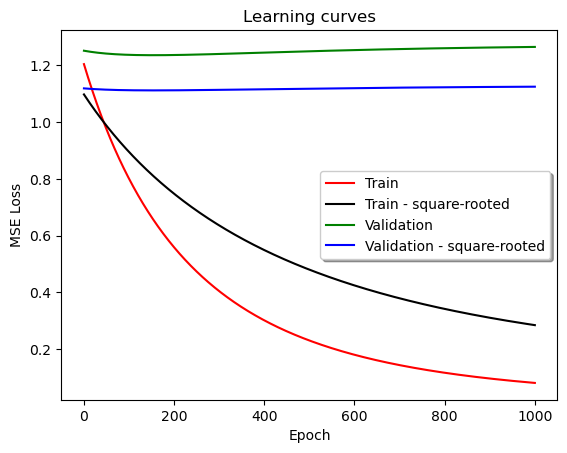

features: 5
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


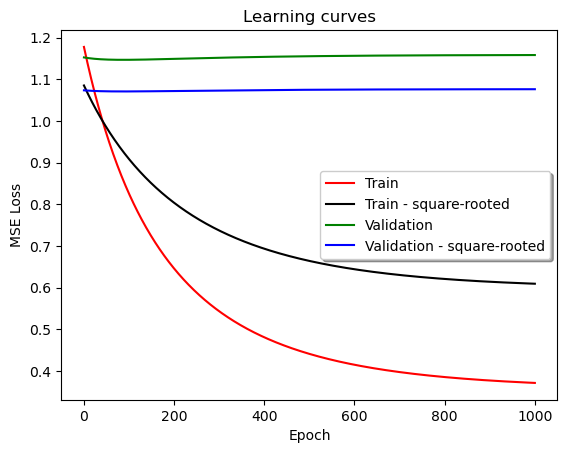

features: 5
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


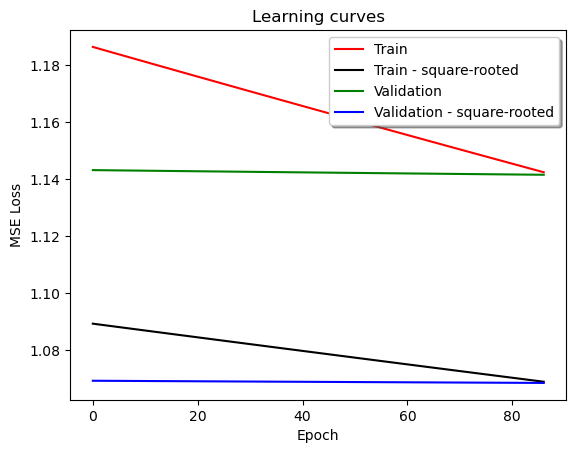

features: 5
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


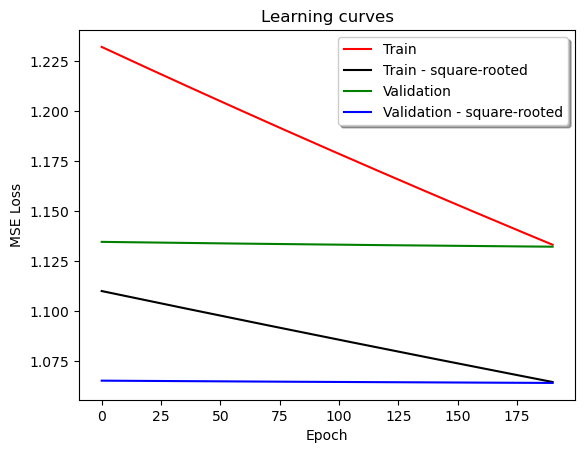

features: 5
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


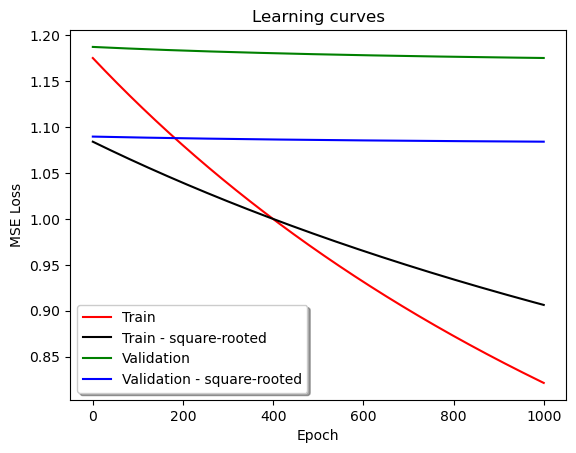

features: 5
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


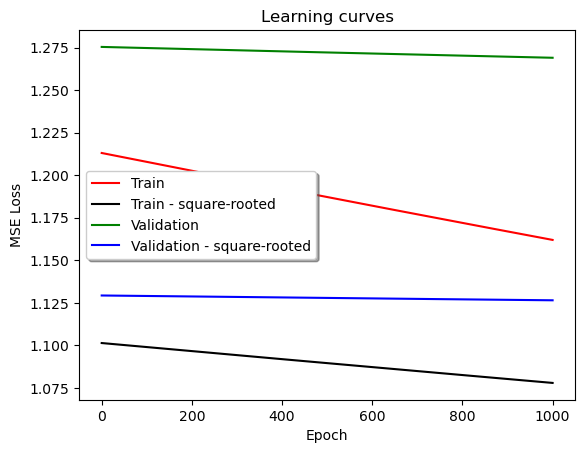

features: 5
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


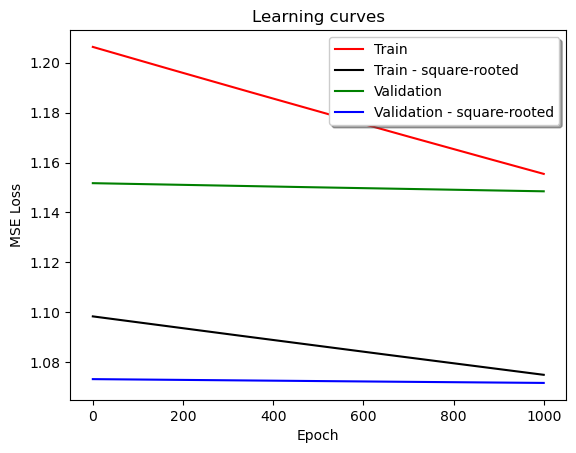

features: 5
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


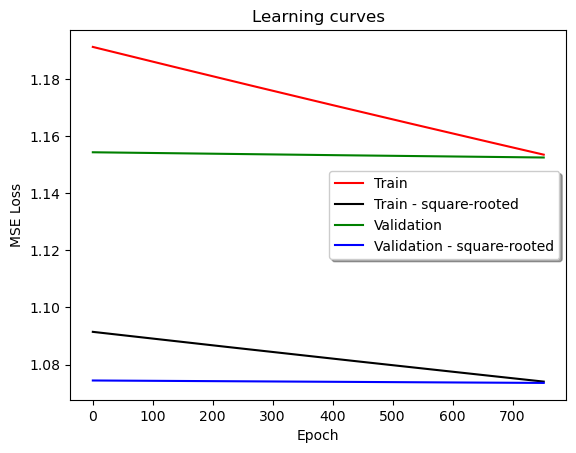

features: 10
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


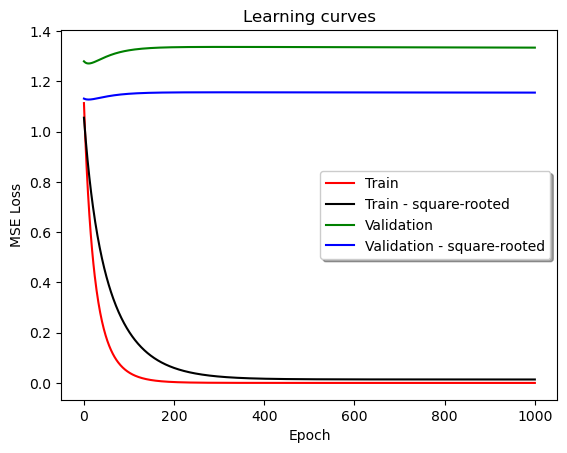

features: 10
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


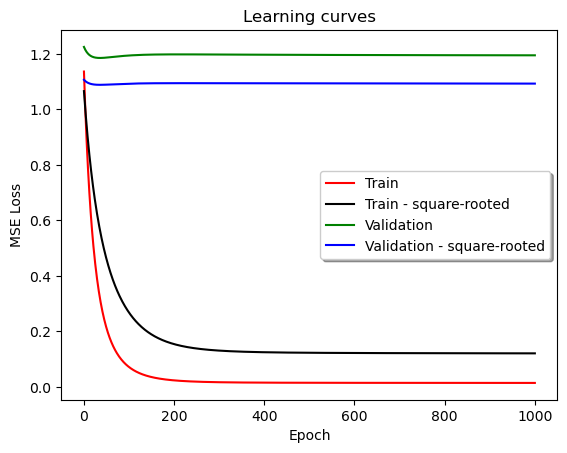

features: 10
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


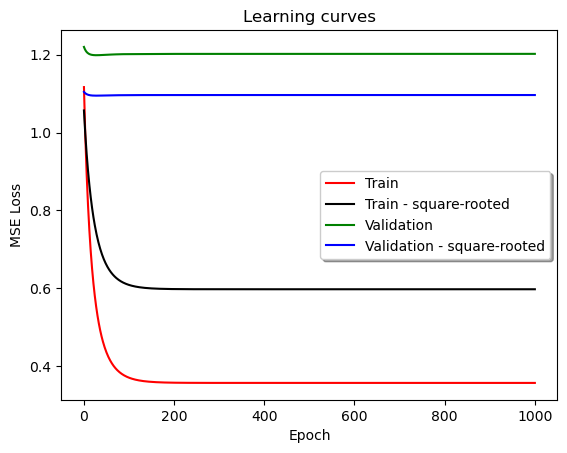

features: 10
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


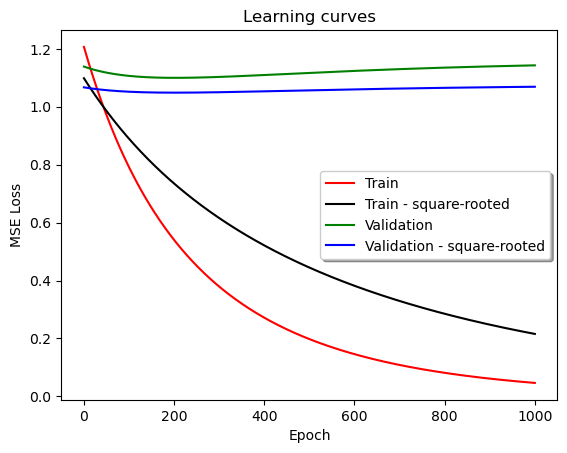

features: 10
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


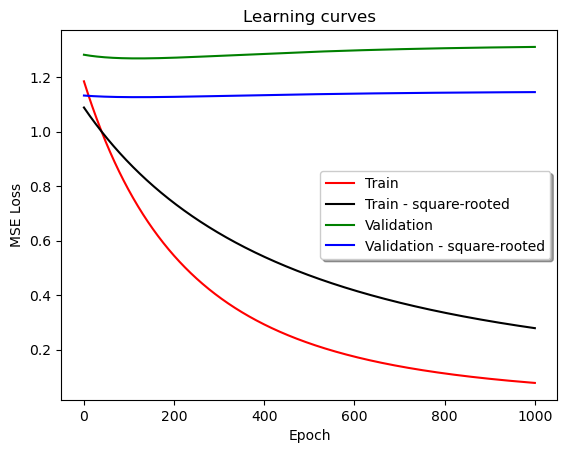

features: 10
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


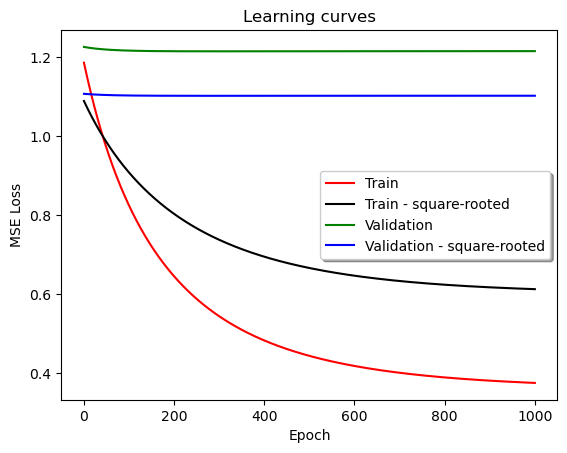

features: 10
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


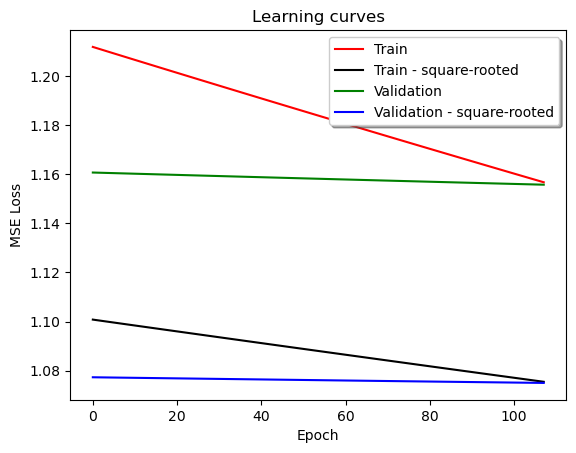

features: 10
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


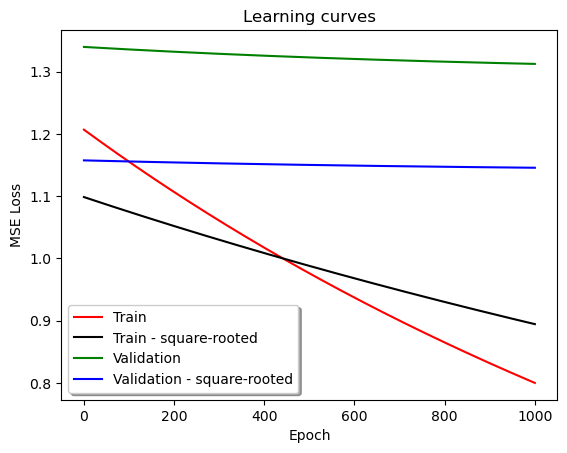

features: 10
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


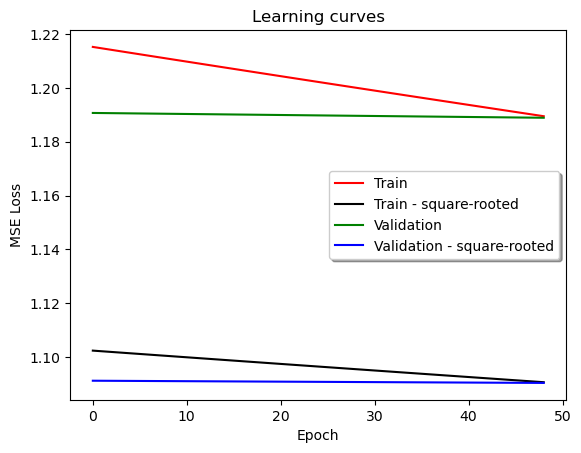

features: 10
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


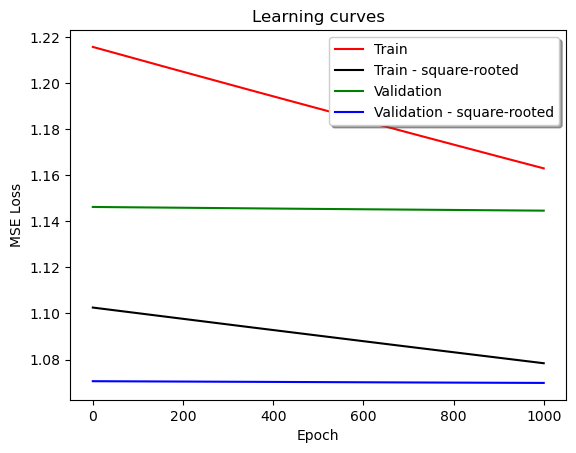

features: 10
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


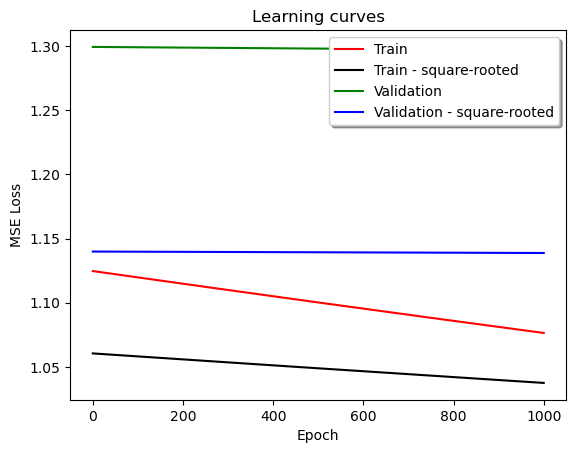

features: 10
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


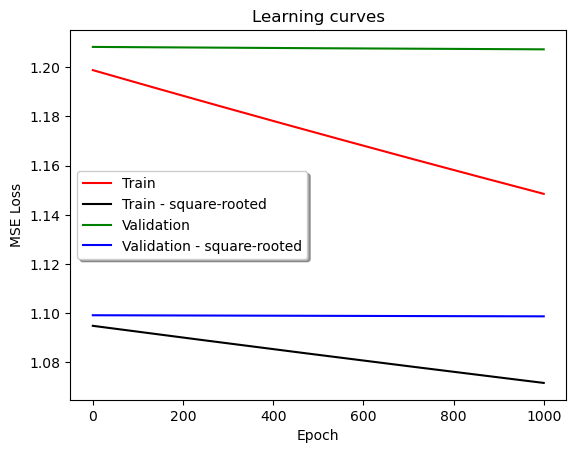

features: 100
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


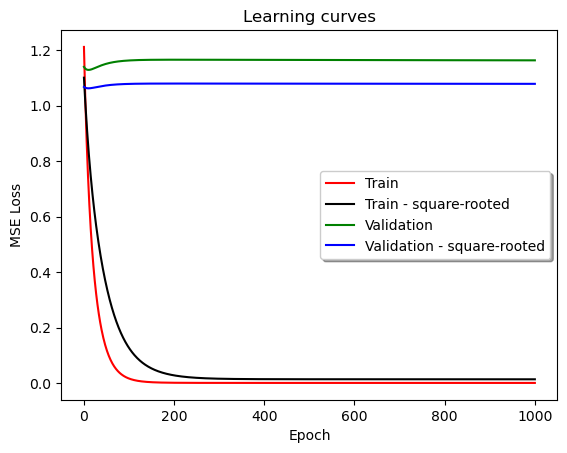

features: 100
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


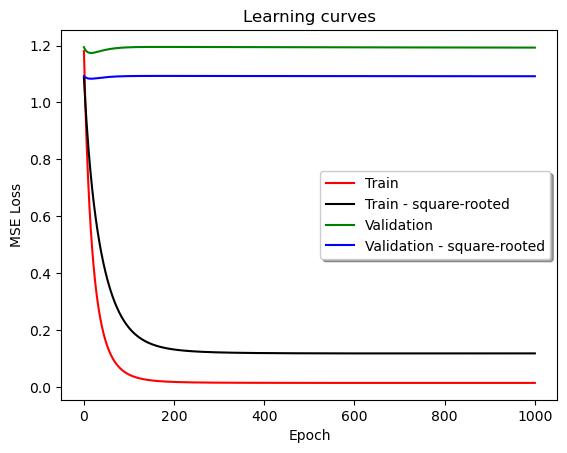

features: 100
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


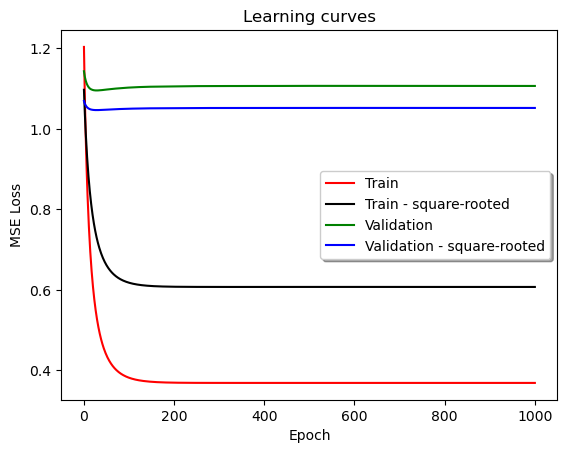

features: 100
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


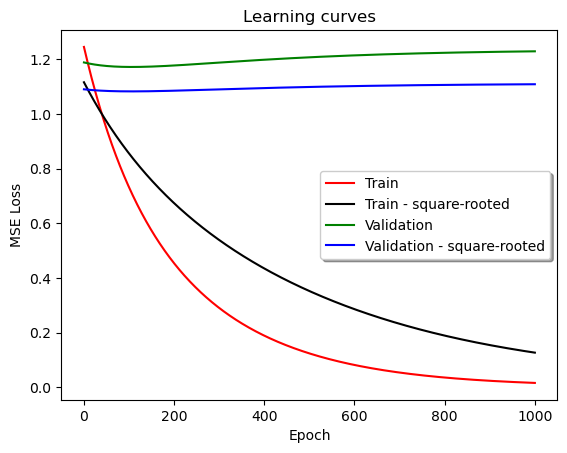

features: 100
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


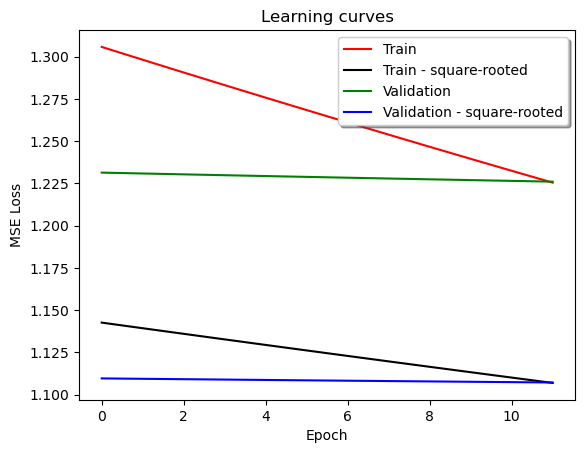

features: 100
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


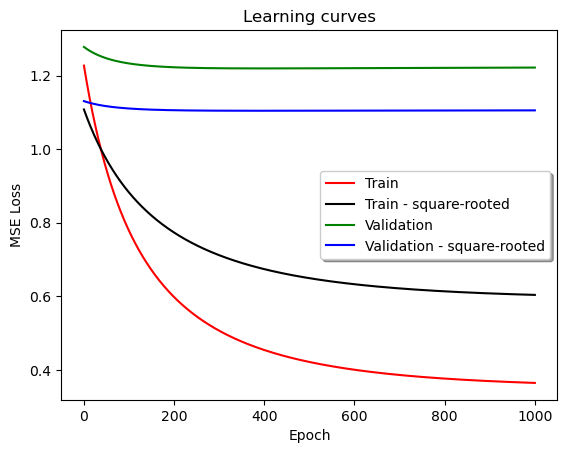

features: 100
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


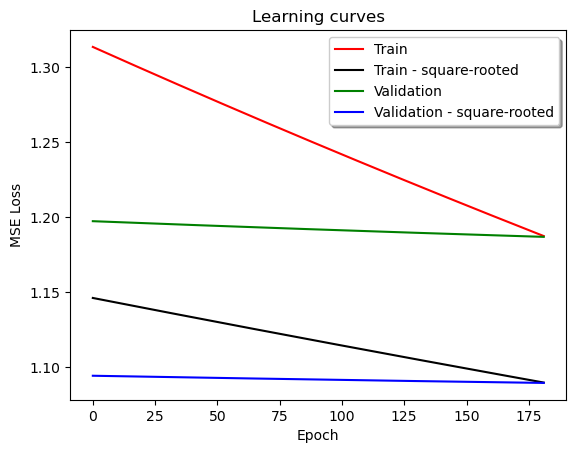

features: 100
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


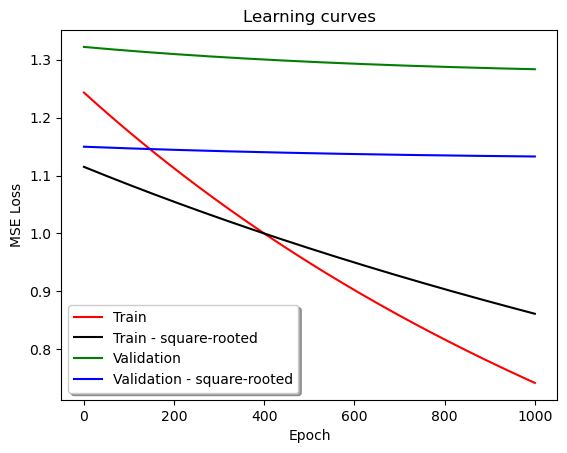

features: 100
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


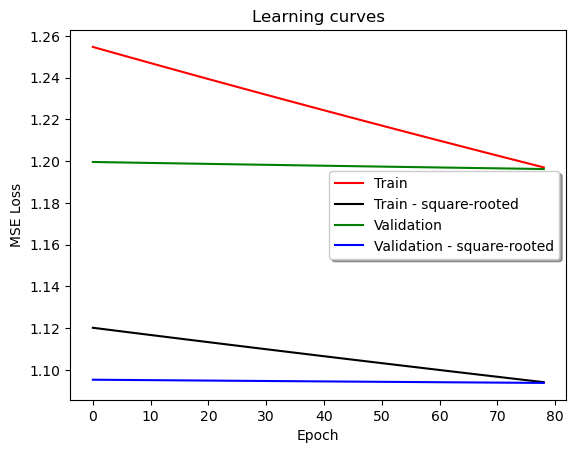

features: 100
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


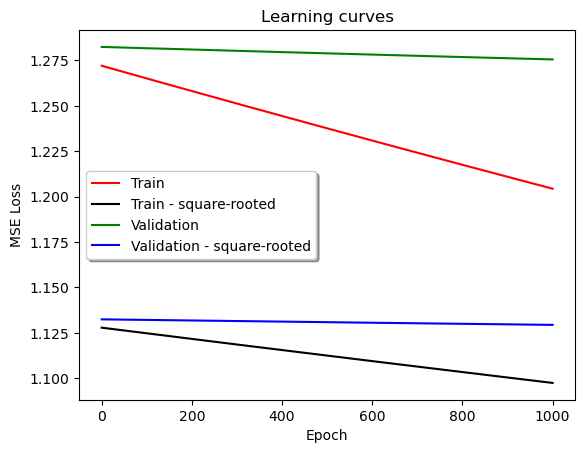

features: 100
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


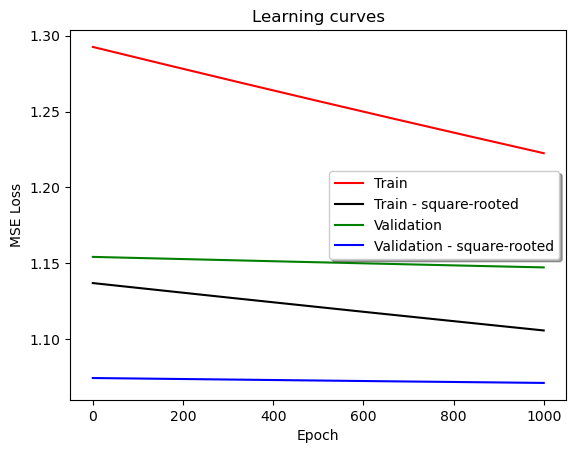

features: 100
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


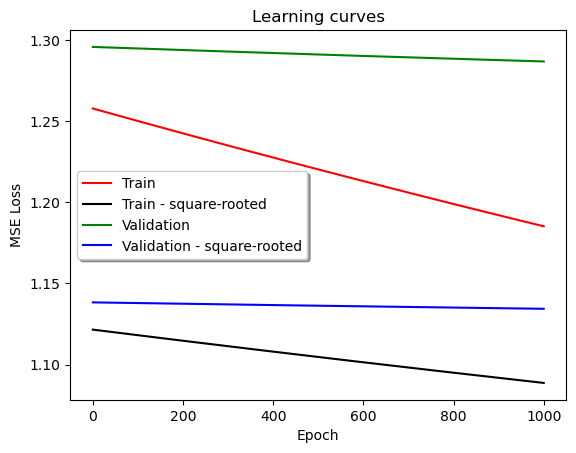

features: 200
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


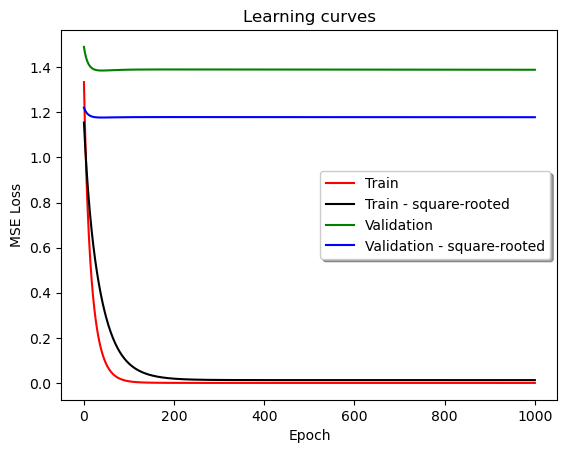

features: 200
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


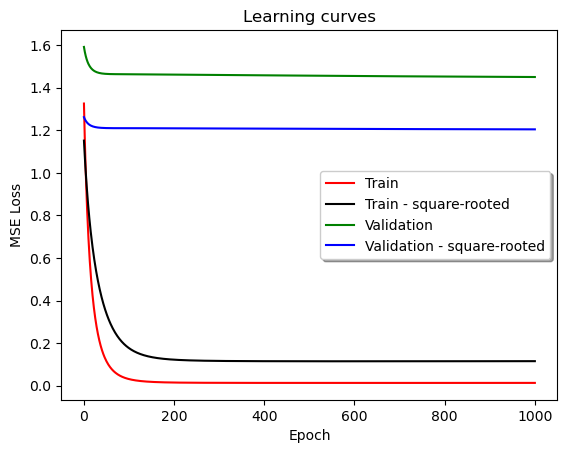

features: 200
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


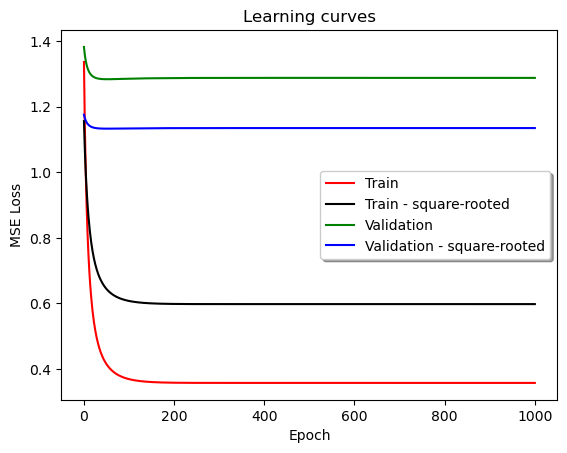

features: 200
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


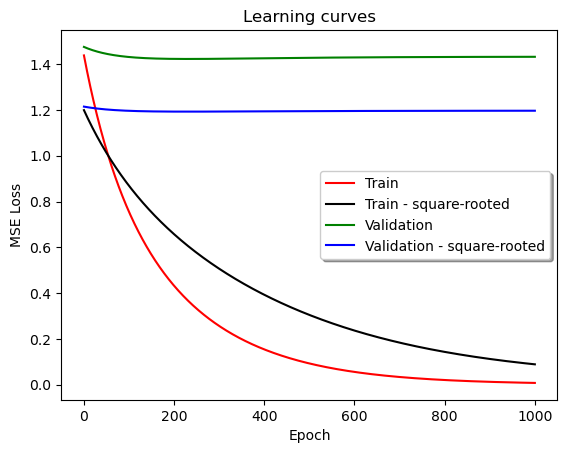

features: 200
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


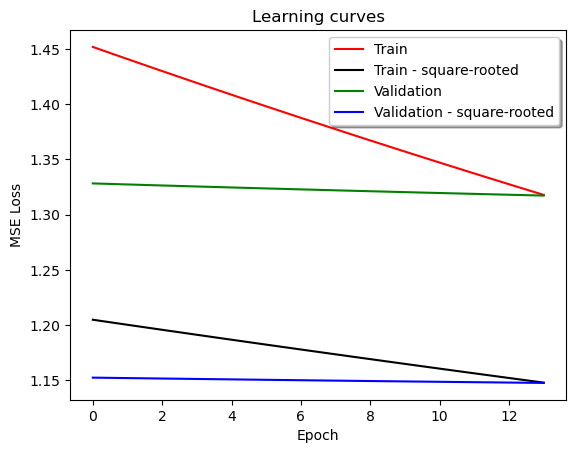

features: 200
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


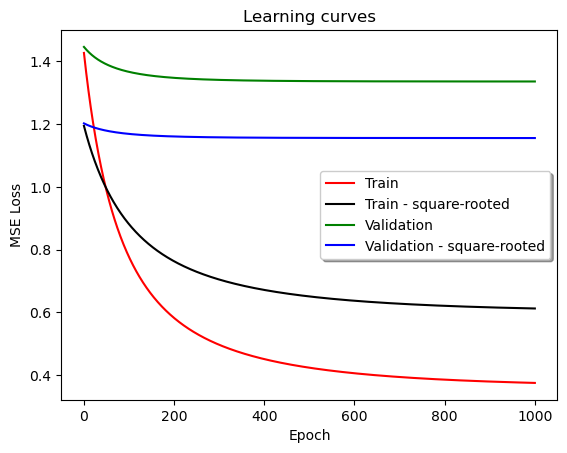

features: 200
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


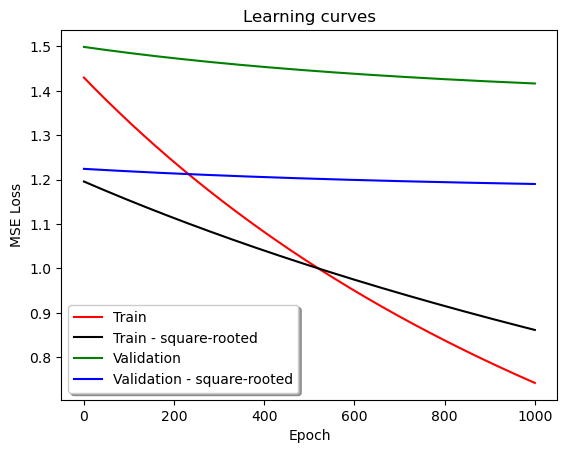

features: 200
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


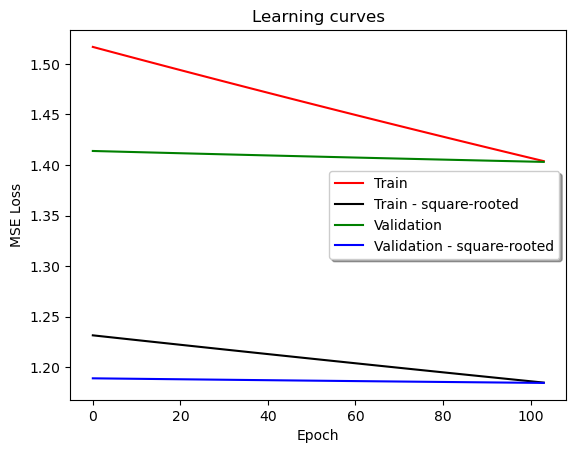

features: 200
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


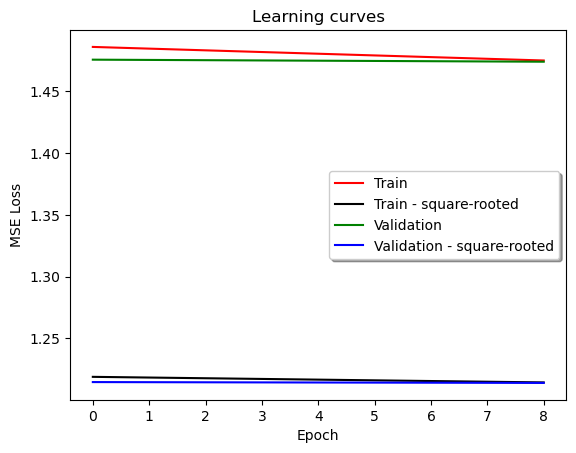

features: 200
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


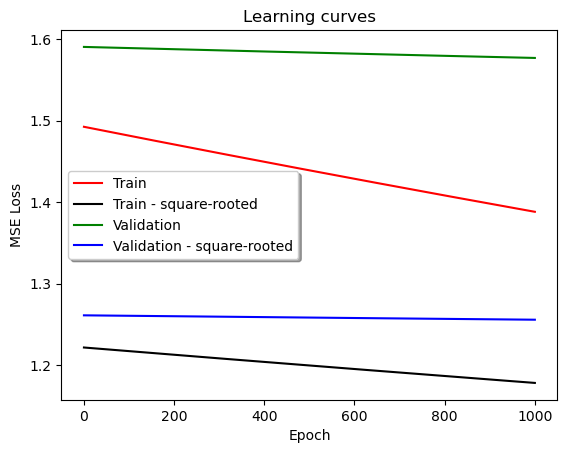

features: 200
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


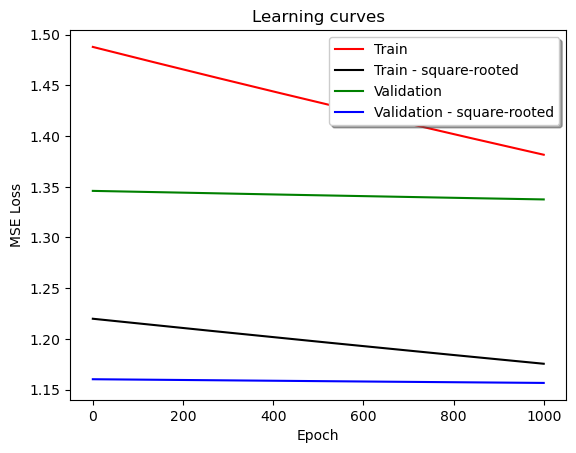

features: 200
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


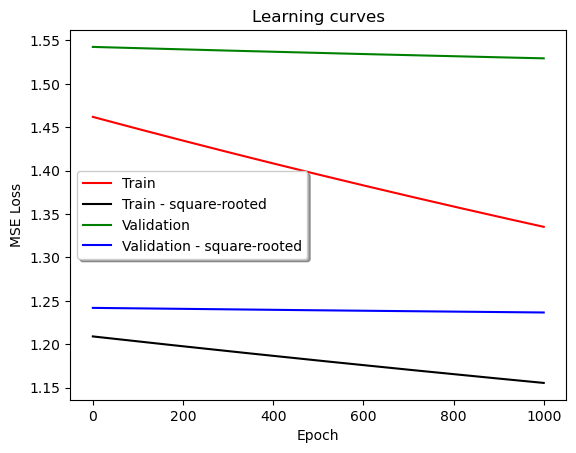

features: 300
learning rate: 0.01
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


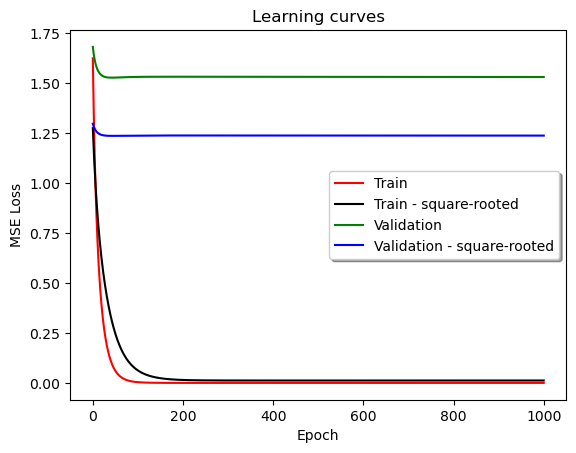

features: 300
learning rate: 0.01
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


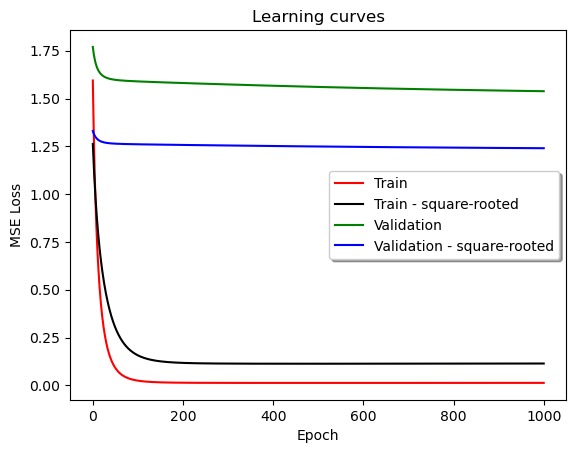

features: 300
learning rate: 0.01
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


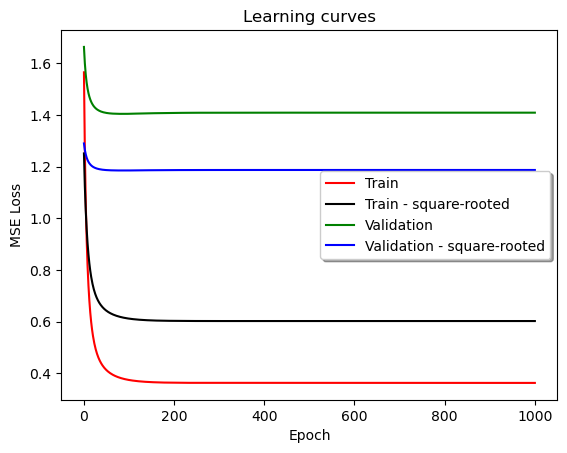

features: 300
learning rate: 0.001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


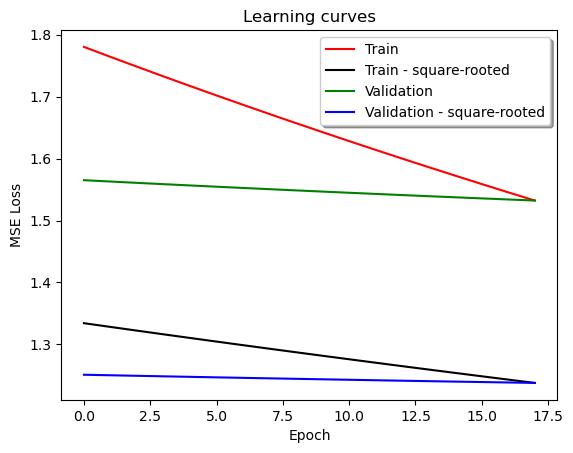

features: 300
learning rate: 0.001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


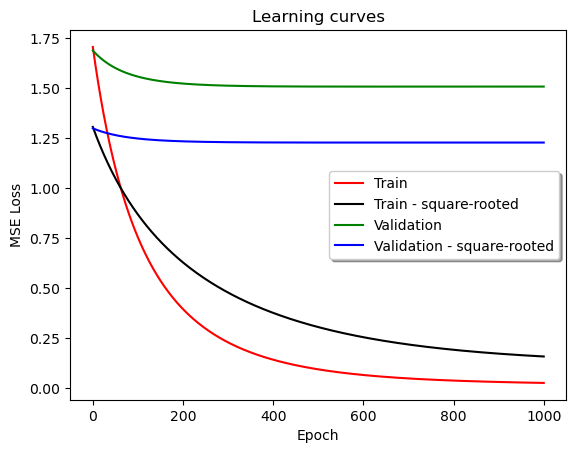

features: 300
learning rate: 0.001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


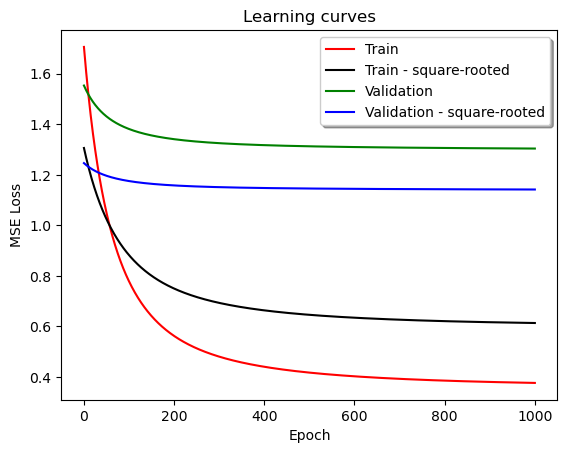

features: 300
learning rate: 0.0001
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


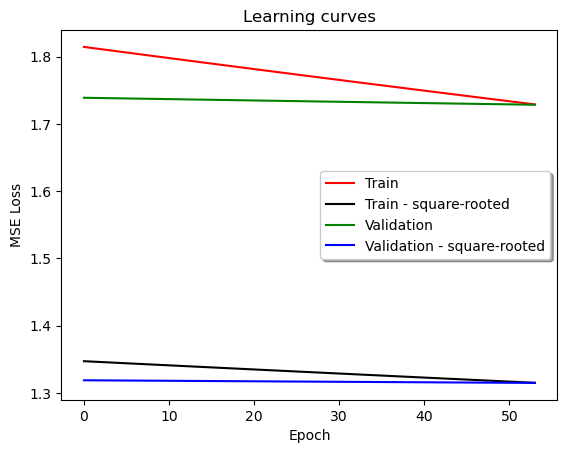

features: 300
learning rate: 0.0001
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


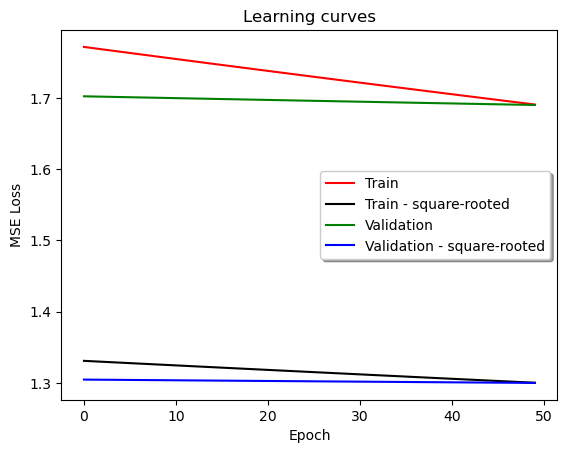

features: 300
learning rate: 0.0001
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


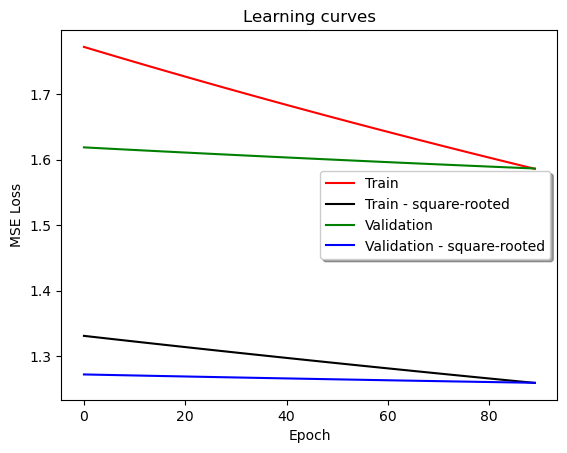

features: 300
learning rate: 1e-05
Epochs: 1001
weight decay: 0.02
stopping: 0.001

RMSE
0.0


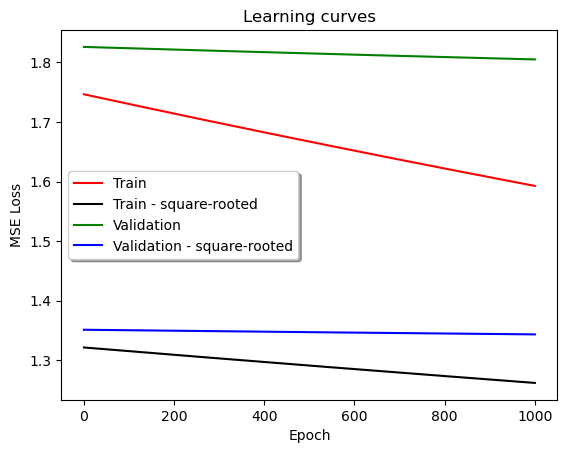

features: 300
learning rate: 1e-05
Epochs: 1001
weight decay: 0.2
stopping: 0.001

RMSE
0.0


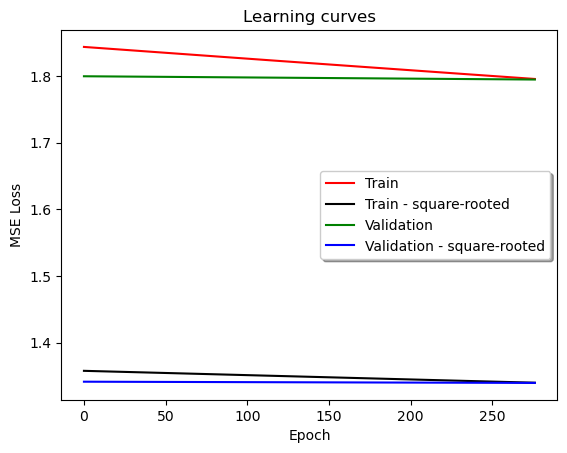

features: 300
learning rate: 1e-05
Epochs: 1001
weight decay: 2
stopping: 0.001

RMSE
0.0


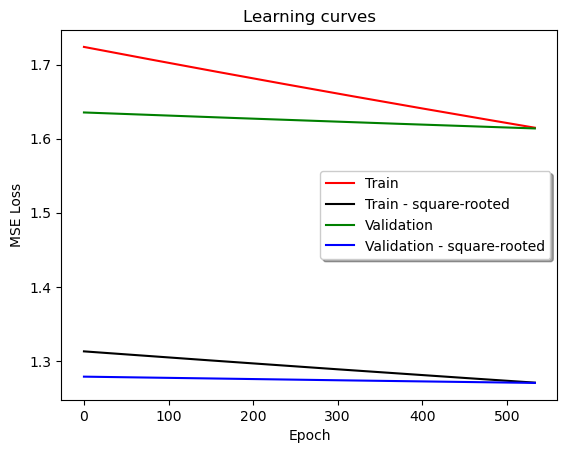

In [10]:
for epochs in PARAM['epochs']:
    for features in PARAM['features']:
        for lr in PARAM['lr']:
            for weight_decay in PARAM['weight_decay']:
                if os.path.isfile(f'./model_netflix/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl'):
#                     with open(f'./model_netflix/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
#                         svd = pickle.load(inp)
#                         print(f'\nfeatures: {svd.features}\nlearning rate: {svd.lr}\nEpochs: {svd.epochs}\nweight decay: {svd.weight_decay}\nstopping: 0.001\n')
#                         inp.close()
                    with open(f'./model_netflix/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
                        print(f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n')
                        k=0
                        result = pickle.load(inp)
                        print('RMSE')
                        print(np.sqrt(sum(np.array(result[2])**2/len(result[2]))))
                        plt.plot(list(range(len(result[0])))[-k:], result[0][-k:], 'r', label="Train")
                        plt.plot(list(range(len(result[0])))[-k:], np.sqrt(result[0][-k:]), '#000', label="Train - square-rooted")
                        plt.plot(list(range(len(result[1])))[-k:], result[1][-k:], 'g', label="Validation")
                        plt.plot(list(range(len(result[1])))[-k:], np.sqrt(result[1][-k:]), 'b', label="Validation - square-rooted")
                        plt.title('Learning curves')
                        plt.xlabel('Epoch')
                        plt.ylabel('MSE Loss')
                        leg = plt.legend(loc='best', shadow=True, fancybox=True)
                        plt.savefig(f"./model_netflix/svdpp/plt_images/{features}_{lr}_{epochs}_{weight_decay}_0.001.png")
                        plt.show()
                        inp.close()